In [1]:
import tensorflow as tf
import itertools as it
import numpy as np

## Defining a Restricted Boltzmann Machine (RBM) object

With code from Lauren Hayward Sierens/PSI, Juan Carrasquilla, Estelle Inack, Giacomo Torlai, and Roger Melko. Adapted from Machine Learning in Condensed Matter Physics 2019, University of the Basque Country Summer Course

In this notebook we will train a Restricted Boltzmann Machine (RBM) neural network on the set of spin configurations generated using the `2D Ising Model Monte Carlo Simulation` notebook. An RBM is an Energy-based model that consists of a single visible layer ${\bf{v}}=(v_{1},v_{2},\dots,v_{m})^{T}$ and a single hidden layer ${\bf{h}}=(h_{1},h_{2},\dots,h_{n})^{T}$ connected to each other via a set of weights $W_{ij}$, where $v_{i}\in\{0,1\}$ and $h_{j}\in\{0,1\}$.

<br></br>

<figure>
    <img src="RBM.pdf" width="150">
    </figure>
    <br></br>
    <figcaption>Fig.1 A Restricted Boltzmann Machine neural network consisting of a single visible layer ${\bf{v}}=(v_{1},v_{2},\dots,v_{m})^{T}$ and a single hidden layer ${\bf{h}}=(h_{1},h_{2},\dots,h_{n})^{T}$ connected to each other via a set of weights $W_{ij}$, where $v_{i}\in\{0,1\}$ and $h_{j}\in\{0,1\}$. </figcaption>
<br></br>
    
The visible and hidden layer units are binary valued. Note that $\cal{D}=\{{\bf{x}}\}=\{{\bf{v}}\}$. The "Energy" of the RBM is defined as 

\begin{align}
E_{\lambda}({\bf{v}},{\bf{h}})&=-\sum_{i=1}^{m}b_{i}v_{i}-\sum_{j=1}^{n}c_{j}h_{j}-\sum_{ij}W_{ij}v_{i}h_{j}\\
&=-{\bf{b}}^{T}{\bf{v}}-{\bf{c}}^{T}{\bf{h}}-{\bf{v}}^{T}{\bf{W}}{\bf{h}},
\end{align}

where the entries $b_{i}$ and $c_{j}$ are the biases associated with the visible and hidden units, respectively, and $\lambda=\{W,b,c\}$. The above energy defines the following probability distribution function over visible and hidden vectors

$$
p_{\lambda}({\bf{v}},{\bf{h}})=\frac{1}{\cal{Z}_{\lambda}}e^{-E_{\lambda}({\bf{v}},{\bf{h}})},
$$

where ${\cal{Z}}_{\lambda}=\sum_{{\bf{v}},{\bf{h}}}e^{-E_{\lambda}({\bf{v}},{\bf{h}})}$.

The below code trains the RBM to learn the distribution of spin configurations of the classical 2D Ising model at a given temperature. We will let the number of visible units equal the number of spins $N$. For $L=4$, we thus have $m=N=L^{2}=16$. Learning is achieved by adjusting the parameters $\lambda$ such that 

$$
p_{\lambda}({\bf{v}})=\sum_{{\bf{h}}}p_{\lambda}({\bf{v}},{\bf{h}})\simeq P({\bf{v}}).
$$

We define a cost function as

\begin{align}
{\cal{C}}(P|p_{\lambda})&=\sum_{{\bf{x}}}P({\bf{x}})\log\frac{P({\bf{x}})}{p_{\lambda}({\bf{x}})} \\
&=\sum_{{\bf{x}}}P({\bf{x}})\log P({\bf{x}})-\sum_{{\bf{x}}}P({\bf{x}})\log p_{\lambda}({\bf{x}}) \\
&=-{\cal{H}}_{\cal{D}}-\sum_{{\bf{x}}}P({\bf{x}})\log p_{\lambda}({\bf{x}}) \\
&=-{\cal{H}}_{\cal{D}}-\frac{1}{|D|}\sum_{{\bf{x}}\in{\cal{D}}}\log p_{\lambda}({\bf{x}})
\end{align}

where ${\cal{H}}_{\cal{D}}\equiv\sum_{{\bf{x}}}P({\bf{x}})\log P({\bf{x}})$, and $P({\bf{x}})=\frac{1}{{\cal{D}}}\sum_{{\bf{x}}_{k}\in{\cal{D}}}\delta_{{\bf{x}},{\bf{x}}_{k}}$. 

The second term in the above expression is the negative log-likelihood (NLL), and is effectively our cost function which we will minimize via gradient descent $\lambda^{\prime}=\lambda-2\nabla_{\lambda}C_{\lambda}$. For a given ${\bf{v}}$,

$$
\log p_{\lambda}({\bf{v}})=\log\left(\frac{1}{{\cal{Z}}}\sum_{{\bf{h}}}e^{-E({\bf{v}},{\bf{h}})}\right)=\log\sum_{{\bf{h}}}e^{-E}-\log\sum_{{\bf{v}}{\bf{h}}}e^{-E},
$$
and so 

\begin{align}
\frac{\partial\log p_{\lambda}}{\partial\lambda}&=\frac{\partial}{\partial\lambda}\left(\log\sum_{{\bf{h}}}e^{-E}\right)-\frac{\partial}{\partial\lambda}\left(\log\sum_{{\bf{v}}{\bf{h}}}e^{-E}\right) \\
&=-\frac{1}{\sum_{{\bf{h}}}e^{-E}}\sum_{{\bf{h}}}e^{-E}\cdot\frac{\partial E}{\partial\lambda}+\frac{1}{\sum_{{\bf{v}}{\bf{h}}}e^{-E}}\sum_{{\bf{v}}{\bf{h}}}e^{-E}\cdot\frac{\partial E}{\partial\lambda} \\
&=-\sum_{{\bf{h}}}p({\bf{h}}|{\bf{v}})\frac{\partial E}{\partial\lambda}+\sum_{{\bf{v}}{\bf{h}}}p({\bf{v}},{\bf{h}})\frac{\partial E}{\partial\lambda},
\end{align}

since $p({\bf{h}}|{\bf{v}})=\frac{p({\bf{v}},{\bf{h}})}{p({\bf{v}})}=\frac{\frac{1}{{\cal{Z}}}e^{-E}}{\frac{1}{{\cal{Z}}}\sum_{{\bf{h}}}e^{-E}}=\frac{e^{-E}}{\sum_{{\bf{h}}}e^{-E}}$.

Since there are no intra-layer connections, we have

\begin{align}
P({\bf{v}}|{\bf{h}})&=\prod_{i=1}^{m}P(v_{i}|{\bf{h}}), \\
P({\bf{h}}|{\bf{v}})&=\prod_{j=1}^{n}P(h_{j}|{\bf{v}}).
\end{align}

This yields a Gibbs sampling where the individual activation probabilities are

\begin{align}
P(h_{j}=1|{\bf{v}})&=\sigma\left(c_{j}+\sum_{i=1}^{m}W_{ij}v_{i}\right), \\
P(v_{i}=1|{\bf{h}})&=\sigma\left(b_{i}+\sum_{j=1}^{n}W_{ij}h_{j}\right),
\end{align}
and where $\sigma$ is the logistic sigmoid function.

It can be shown that 

\begin{align}
\sum_{{\bf{h}}}p({\bf{h}}|{\bf{v}})\frac{\partial E}{\partial\lambda}&=P(h_{i}=1|{\bf{v}})v_{j} \\
&=\sigma\left(c_{k}+\sum_{k=1}^{m}W_{ik}v_{k}\right)v_{j}.
\end{align}

Meanwhile,

$$
\sum_{{\bf{v}}{\bf{h}}}p({\bf{v}},{\bf{h}})\frac{\partial E}{\partial\lambda}=\sum_{{\bf{v}}}p({\bf{v}})\sum_{{\bf{h}}}p({\bf{h}}|{\bf{v}})\frac{\partial E}{\partial\lambda}.
$$

Utilizing a technique known as Cotrastive Divergence (http://deeplearning.net/tutorial/rbm.html#contrastive-divergence-cd-k), we can rewrite the abvoe expression so that we ultimately get 

$$
\frac{\partial\log p_{\lambda}}{\partial\lambda}=-\sum_{{\bf{h}}}p({\bf{h}}|{\bf{v}})\frac{\partial E({\bf{v}}_{k})}{\partial\lambda}+\sum_{k}p({\bf{h}}|{\bf{v}}_{k})\frac{\partial E({\bf{v}}_{k})}{\partial\lambda}.
$$

The definitions contained in the below class RBM object incorporate the ideas that we have discussed here and are utilized in the training of the RBM that follows. 

Ultimately, by minimizing the NLL we can approximate the Boltzmann distribution of spin configurations generated via the MC process

$$
q({\bf{v}},T)=\frac{1}{{\cal{C}}}e^{-H({\bf{v}})/T}
$$

by $p_{\lambda}({\bf{v}})$, though the RBM does not know about either $q({\bf{v}},T)$ or $H({\bf{v}})$. We can then sample from this distribution in order to determine the values of observables (e.g. Energy, Magnetization, $C_{V}$, $\chi$) as a function of the temperature $T$, and thus check against our earlier MC simulation results.

In [2]:
class RBM(object):
  
  ### Constructor ###
    def __init__(self, num_hidden, num_visible, num_samples=128, weights=None, visible_bias=None, hidden_bias=None):
        self.num_hidden = num_hidden   #number of hidden units
        self.num_visible = num_visible #number of visible units

        #visible bias:
        default = tf.zeros(shape=(self.num_visible, 1))
        self.visible_bias = self._create_parameter_variable(visible_bias, default)

        #hidden bias:
        default = tf.zeros(shape=(self.num_hidden, 1))
        self.hidden_bias = self._create_parameter_variable(hidden_bias, default)

        #pairwise weights:
        default = tf.random.normal(shape=(self.num_visible, self.num_hidden), mean=0, stddev=0.05)
        self.weights = self._create_parameter_variable(weights, default)

        #variables for sampling (num_samples is the number of samples to return):
        self.hidden_samples = tf.Variable(
          self.sample_binary_tensor(tf.constant(0.5), num_samples, self.num_hidden),
          trainable=False, name='hidden_samples'
        )

        self._all_hidden_states = None
        self.max_feasible_for_log_pf = 24
        #end of constructor
        
    ### Build array with all possible configuration of the hidden layer: ###
    @property
    def all_hidden_states(self):
        if self._all_hidden_states is None:
            assert self.num_hidden <= self.max_feasible_for_log_pf, \
                'cannot generate all hidden states for num_hidden > {}'.format(self.max_feasible_for_log_pf)
            self._all_hidden_states = np.array(list(it.product([0, 1], repeat=self.num_hidden)), dtype=np.float32)
        return self._all_hidden_states

    ### Method to initialize variables: ###
    @staticmethod
    def _create_parameter_variable(initial_value=None, default=None):
        if initial_value is None:
              initial_value = default
        return tf.Variable(initial_value)

    ### Method to calculate the conditional probability of the hidden layer given a visible state: ###
    def p_of_h_given(self, v):
        # type: (tf.Tensor) -> tf.Tensor
        return tf.nn.sigmoid(tf.matmul(v, self.weights) + tf.transpose(self.hidden_bias))

    ### Method to calculate the conditional probability of the visible layer given a hidden state: ###
    def p_of_v_given(self, h):
        # type: (tf.Tensor) -> tf.Tensor
        return tf.nn.sigmoid(tf.matmul(h, self.weights, transpose_b=True) + tf.transpose(self.visible_bias))

    ### Method to sample the hidden nodes given a visible state: ###
    def sample_h_given(self, v):
        # type: (tf.Tensor) -> (tf.Tensor, tf.Tensor)
        b = tf.shape(v)[0]  # number of samples
        m = self.num_hidden
        prob_h = self.p_of_h_given(v)
        samples = self.sample_binary_tensor(prob_h, b, m)
        return samples
    
    ### Method to sample the visible nodes given a hidden state: ###
    def sample_v_given(self, h):
        # type: (tf.Tensor) -> (tf.Tensor, tf.Tensor)
        b = tf.shape(h)[0]  # number rof samples
        n = self.num_visible
        prob_v = self.p_of_v_given(h)
        samples = self.sample_binary_tensor(prob_v, b, n)
        return samples

    ###
    # Method for persistent contrastive divergence (CD_k):
    # Stores the results of `num_iterations` of contrastive divergence in class variables.
    #
    # :param int num_iterations: The 'k' in CD_k.
    ###
    def stochastic_maximum_likelihood(self, num_iterations):
        # type: (int) -> (tf.Tensor, tf.Tensor, tf.Tensor)
        h_samples = self.hidden_samples
        v_samples = None
        for i in range(num_iterations):
            v_samples = self.sample_v_given(h_samples)
            h_samples = self.sample_h_given(v_samples)

            self.hidden_samples = self.hidden_samples.assign(h_samples)
            return self.hidden_samples, v_samples

    ###
    # Method to compute the energy E = - aT*v - bT*h - vT*W*h
    # Note that since we want to support larger batch sizes, we do element-wise multiplication between
    # vT*W and h, and sum along the columns to get a Tensor of shape batch_size by 1
    #
    # :param hidden_samples:  Tensor of shape batch_size by num_hidden
    # :param visible_samples: Tensor of shape batch_size by num_visible
    ###
    def energy(self, hidden_samples, visible_samples):
        # type: (tf.Tensor, tf.Tensor) -> tf.Tensor
        return (-tf.matmul(hidden_samples, self.hidden_bias)  # b x m * m x 1
          - tf.matmul(visible_samples, self.visible_bias)  # b x n * n x 1
          - tf.reduce_sum(tf.matmul(visible_samples, self.weights) * hidden_samples, 1))

    ### Method used to calculate the gradient of the negative log-likelihood ###
    def neg_log_likelihood_forGrad(self, visible_samples, num_gibbs=2):
        # type: (tf.Tensor, tf.Tensor, int) -> tf.Tensor
        hidden_samples = self.sample_h_given(visible_samples)
        expectation_from_data = tf.reduce_mean(self.energy(hidden_samples, visible_samples))

        model_hidden, model_visible = self.stochastic_maximum_likelihood(num_gibbs)
        expectation_from_model = tf.reduce_mean(self.energy(model_hidden, model_visible))

        return expectation_from_data - expectation_from_model

    ###
    # Method to compute the average negative log likelihood over a batch of visible samples:
    # NLL = - <log(p(v))> = - <F> + log(Z)
    ###
    def neg_log_likelihood(self, visible_samples, log_Z):
        free_energy = (tf.matmul(visible_samples, self.visible_bias)
                   + tf.reduce_sum(tf.nn.softplus(tf.matmul(visible_samples, self.weights)
                                                  + tf.transpose(self.hidden_bias)), 1))
        return -tf.reduce_mean(free_energy - log_Z)

    ### Method to evaluate the partition function by exact enumerations: ###
    ### (Intractable for large sizes) ###
    def exact_log_partition_function(self):
        with tf.name_scope('exact_log_Z'):
            # Define the exponent: H*b + sum(softplus(1 + exp(a + w*H.T)))
            first_term = tf.matmul(self.all_hidden_states, self.hidden_bias, name='first_term')
            with tf.name_scope('second_term'):
                second_term = tf.matmul(self.weights, self.all_hidden_states, transpose_b=True)
                second_term = tf.nn.softplus(tf.add(self.visible_bias, second_term))
                second_term = tf.transpose(tf.reduce_sum(second_term, reduction_indices=[0], keepdims=True))
            exponent = tf.cast(first_term + second_term, dtype=tf.float64, name='exponent')
            #exponent_mean = tf.reduce_mean(exponent)
            exponent_mean = tf.reduce_max(exponent)

            return tf.log(tf.reduce_sum(tf.exp(exponent - exponent_mean))) + exponent_mean

    ###
    # Convenience method for generating a binary Tensor using a given probability
    #
    # :param prob: Tensor of shape (m, n)
    # :param m: number of rows in result.
    # :param n: number of columns in result.
    ###
    @staticmethod
    def sample_binary_tensor(prob, m, n):
    # type: (tf.Tensor, int, int) -> tf.Tensor
        return tf.where(
          tf.less(tf.random.uniform(shape=(m, n)), prob),
          tf.ones(shape=(m, n)),
          tf.zeros(shape=(m, n))
        )

#end of RBM class


## Training an RBM to learn the distribution of spin configurations of the 2D Ising model at given temperatures

We train our RBM across the temperature values contained in T_list = [1.0,1.254,1.508,1.762,2.016,2.269,2.524,2.778,3.032,3.286,3.540], for which we have generated and stored MC training data.

In [3]:
from __future__ import print_function
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior() 
import itertools as it
import matplotlib.pyplot as plt
import numpy as np
import math
import os

Instructions for updating:
non-resource variables are not supported in the long term


RBM parameters that can be adjusted to yield more or less efficacious results. Also sets parameters of plots to be generated during calculation runtime depicting the NLL vs. training epoch.

In [4]:
#Specify font sizes for plots:
plt.rcParams['axes.labelsize']  = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8

plt.ion() # turn on interactive mode (for plotting)

# Input parameters:
L                   = 4       #linear size of the system
#Temperature list for which there are trained RBM parameters stored in Data_ising2d/RBM_parameters
T_list = [1.0,1.254,1.508,1.762,2.016,2.269,2.524,2.778,3.032,3.286,3.540]
T                   = 2.269   #a temperature for which there are MC configurations stored in Data_ising2d/MC_results
num_visible         = L*L     #number of visible nodes
num_hidden          = 4       #number of hidden nodes
nsteps              = 20000   #number of training steps (iterations over the mini-batches)
learning_rate_start = 1e-3    #the learning rate will start at this value and decay exponentially
bsize               = 100     #batch size
num_gibbs           = 10      #number of Gibbs iterations (steps of contrastive divergence)
num_samples         = 10      #number of chains in PCD

In [5]:
### Function to save weights and biases to a parameter file ###
def save_parameters(sess, rbm):
    weights, visible_bias, hidden_bias = sess.run([rbm.weights, rbm.visible_bias, rbm.hidden_bias])
    
    parameter_dir = 'Data_ising2d/RBM_parameters'
    if not(os.path.isdir(parameter_dir)):
        os.mkdir(parameter_dir)
    parameter_file_path =  '%s/parameters_nH%d_L%d' %(parameter_dir,num_hidden,L)
    parameter_file_path += '_T' + str(T)
    np.savez_compressed(parameter_file_path, weights=weights, visible_bias=visible_bias, hidden_bias=hidden_bias)
        
class Placeholders(object):
    pass

class Ops(object):
    pass

weights      = None  #weights
visible_bias = None  #visible bias
hidden_bias  = None  #hidden bias

Epoch = 0, Nsteps = 200, NLL on test data = 11.089185


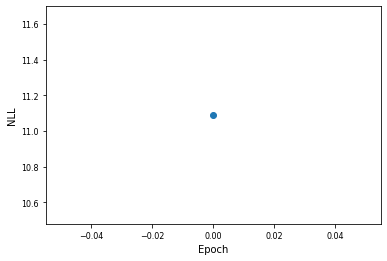

Epoch = 1, Nsteps = 400, NLL on test data = 11.035023


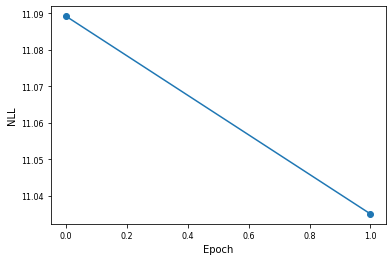

Epoch = 2, Nsteps = 600, NLL on test data = 10.856746


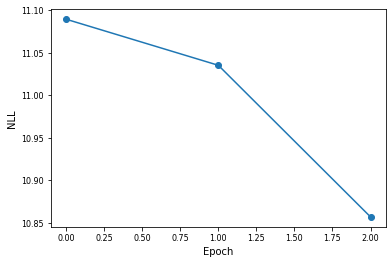

Epoch = 3, Nsteps = 800, NLL on test data = 10.596889


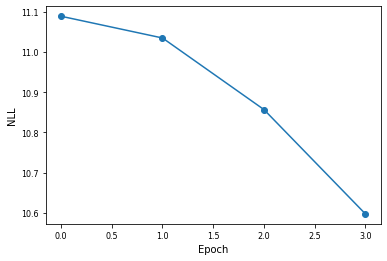

Epoch = 4, Nsteps = 1000, NLL on test data = 10.313243


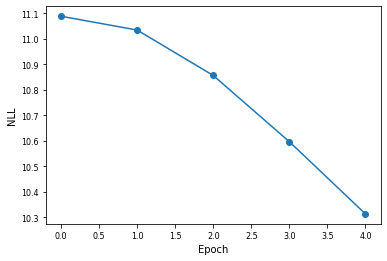

Epoch = 5, Nsteps = 1200, NLL on test data = 10.052746


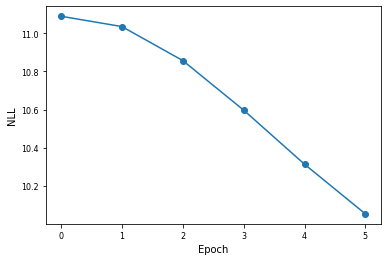

Epoch = 6, Nsteps = 1400, NLL on test data = 9.784802


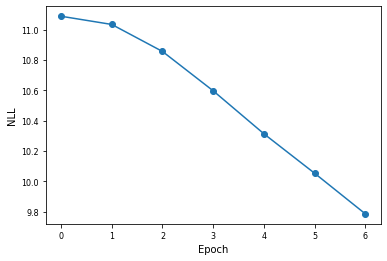

Epoch = 7, Nsteps = 1600, NLL on test data = 9.494562


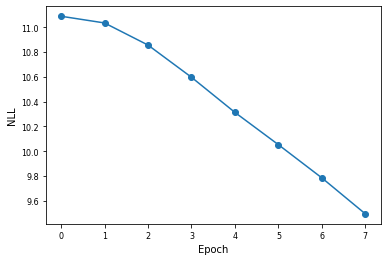

Epoch = 8, Nsteps = 1800, NLL on test data = 9.182818


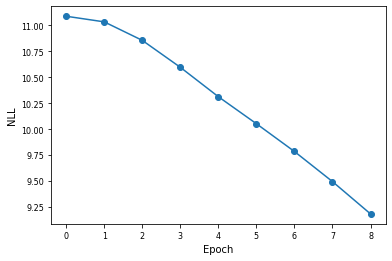

Epoch = 9, Nsteps = 2000, NLL on test data = 8.858491


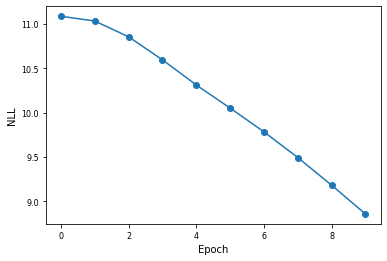

Epoch = 10, Nsteps = 2200, NLL on test data = 8.506576


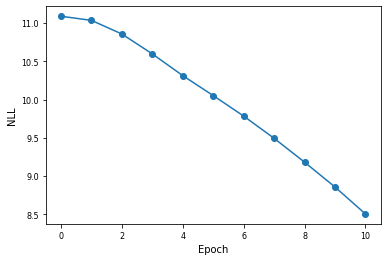

Epoch = 11, Nsteps = 2400, NLL on test data = 8.155621


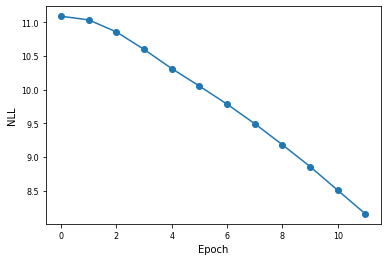

Epoch = 12, Nsteps = 2600, NLL on test data = 7.793287


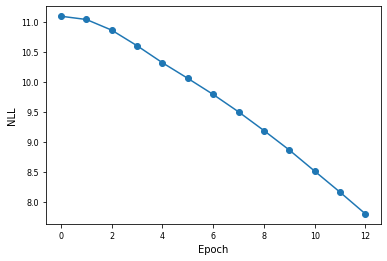

Epoch = 13, Nsteps = 2800, NLL on test data = 7.432227


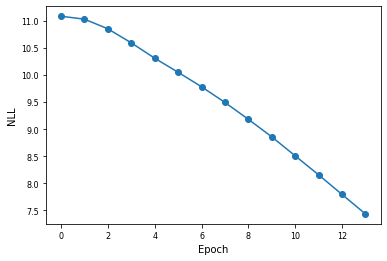

Epoch = 14, Nsteps = 3000, NLL on test data = 7.074970


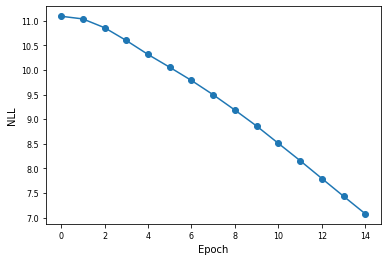

Epoch = 15, Nsteps = 3200, NLL on test data = 6.720708


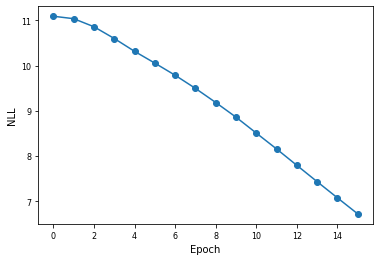

Epoch = 16, Nsteps = 3400, NLL on test data = 6.385825


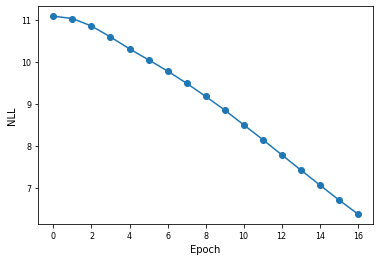

Epoch = 17, Nsteps = 3600, NLL on test data = 6.064990


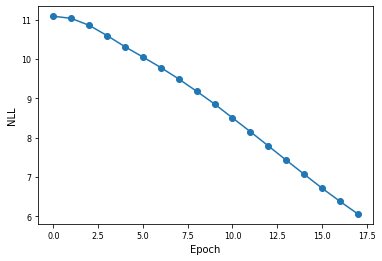

Epoch = 18, Nsteps = 3800, NLL on test data = 5.753275


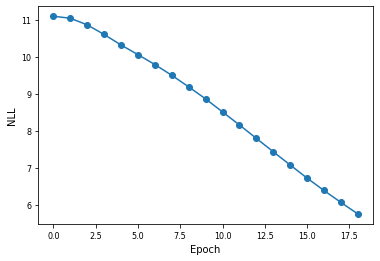

Epoch = 19, Nsteps = 4000, NLL on test data = 5.482106


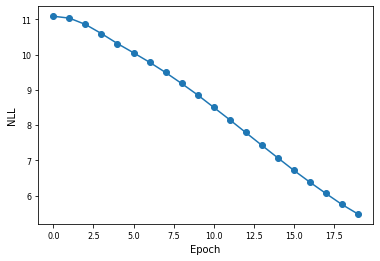

Epoch = 20, Nsteps = 4200, NLL on test data = 5.203618


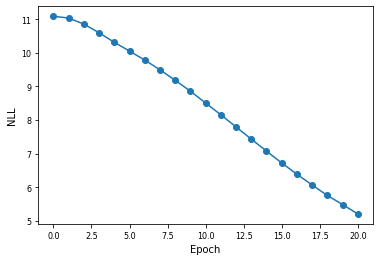

Epoch = 21, Nsteps = 4400, NLL on test data = 4.977481


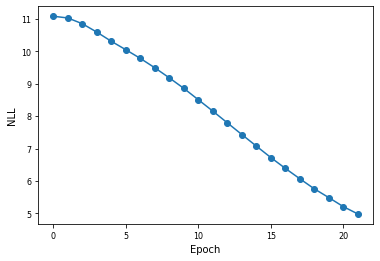

Epoch = 22, Nsteps = 4600, NLL on test data = 4.787169


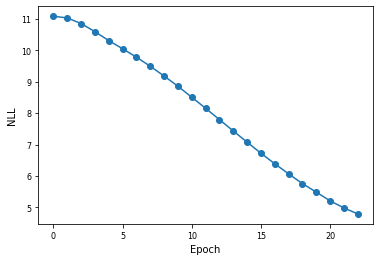

Epoch = 23, Nsteps = 4800, NLL on test data = 4.623167


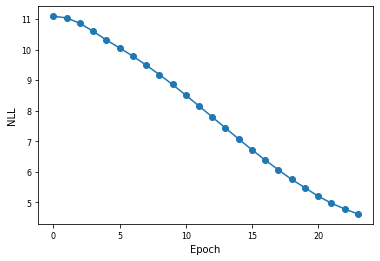

Epoch = 24, Nsteps = 5000, NLL on test data = 4.410254


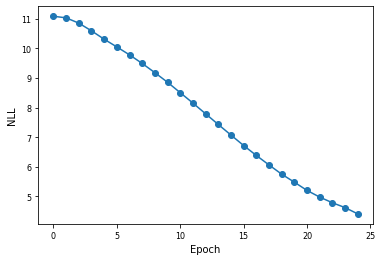

Epoch = 25, Nsteps = 5200, NLL on test data = 4.319227


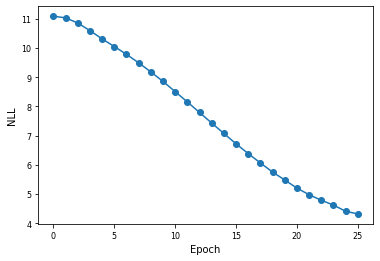

Epoch = 26, Nsteps = 5400, NLL on test data = 4.162423


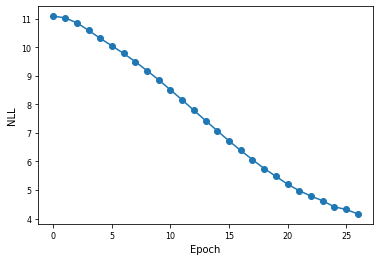

Epoch = 27, Nsteps = 5600, NLL on test data = 3.958447


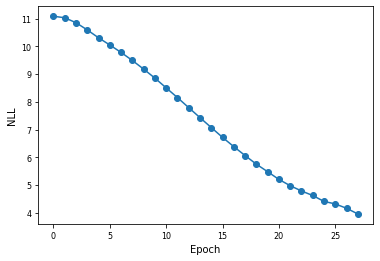

Epoch = 28, Nsteps = 5800, NLL on test data = 3.873708


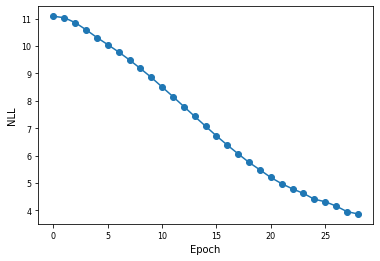

Epoch = 29, Nsteps = 6000, NLL on test data = 3.924667


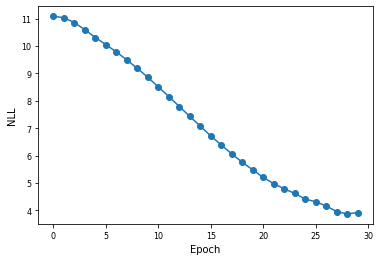

Epoch = 30, Nsteps = 6200, NLL on test data = 3.600989


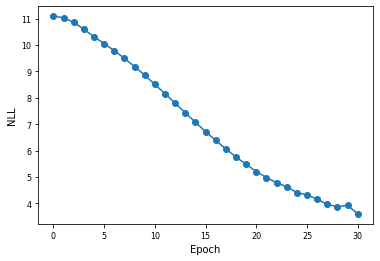

Epoch = 31, Nsteps = 6400, NLL on test data = 3.526837


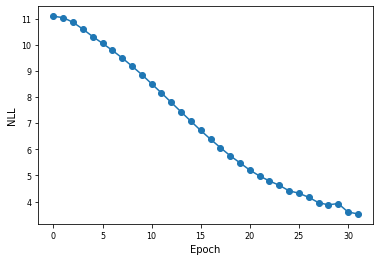

Epoch = 32, Nsteps = 6600, NLL on test data = 3.518696


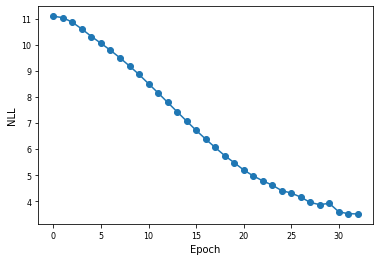

Epoch = 33, Nsteps = 6800, NLL on test data = 3.438650


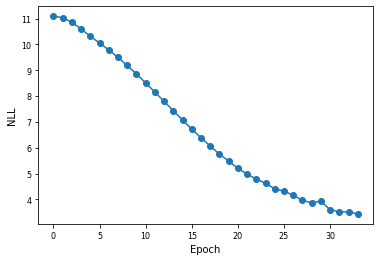

Epoch = 34, Nsteps = 7000, NLL on test data = 3.316052


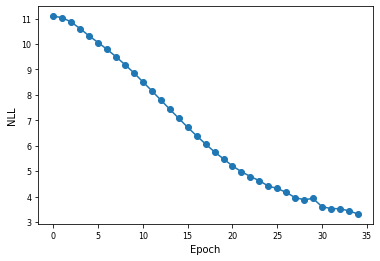

Epoch = 35, Nsteps = 7200, NLL on test data = 3.317939


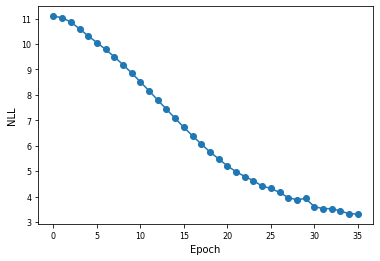

Epoch = 36, Nsteps = 7400, NLL on test data = 3.786967


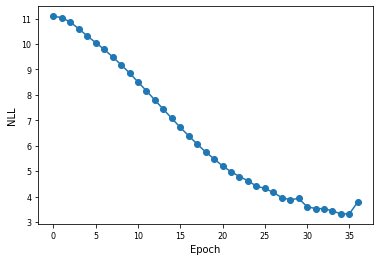

Epoch = 37, Nsteps = 7600, NLL on test data = 3.257961


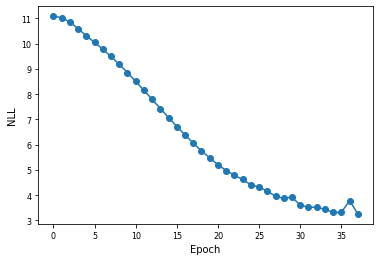

Epoch = 38, Nsteps = 7800, NLL on test data = 3.309137


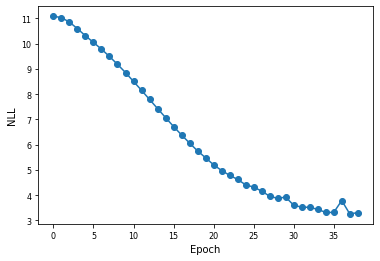

Epoch = 39, Nsteps = 8000, NLL on test data = 4.516315


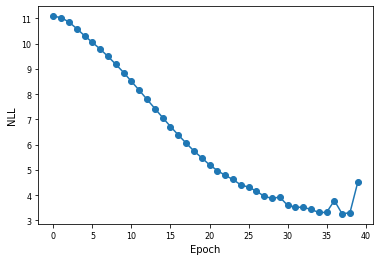

Epoch = 40, Nsteps = 8200, NLL on test data = 4.250568


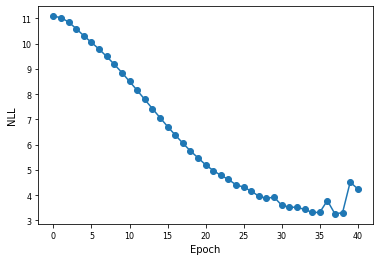

Epoch = 41, Nsteps = 8400, NLL on test data = 4.015593


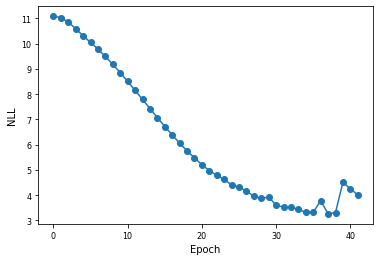

Epoch = 42, Nsteps = 8600, NLL on test data = 3.744774


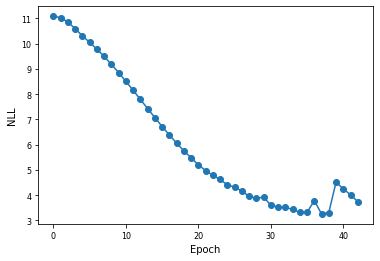

Epoch = 43, Nsteps = 8800, NLL on test data = 3.438083


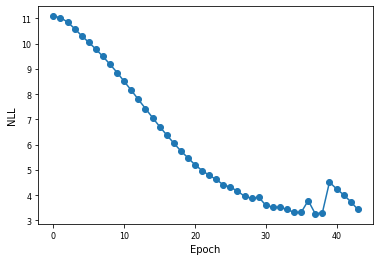

Epoch = 44, Nsteps = 9000, NLL on test data = 3.184543


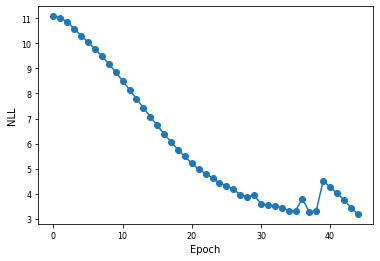

Epoch = 45, Nsteps = 9200, NLL on test data = 3.000915


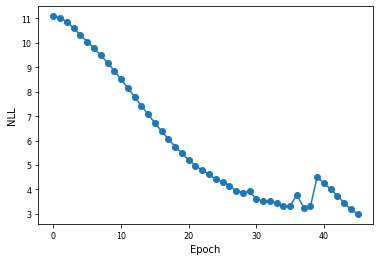

Epoch = 46, Nsteps = 9400, NLL on test data = 2.813884


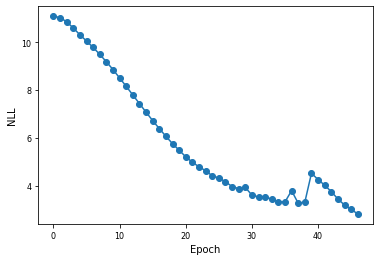

Epoch = 47, Nsteps = 9600, NLL on test data = 2.601935


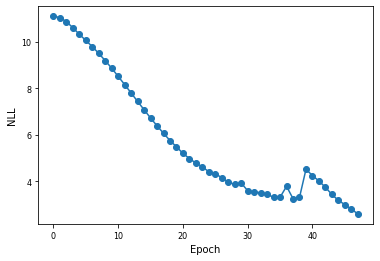

Epoch = 48, Nsteps = 9800, NLL on test data = 2.429446


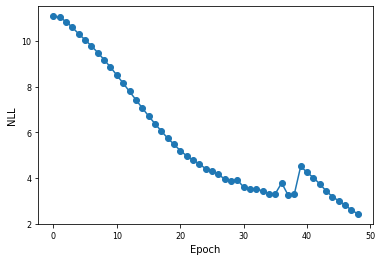

Epoch = 49, Nsteps = 10000, NLL on test data = 2.281456


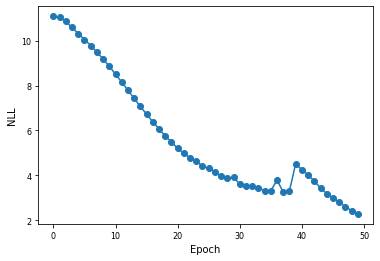

Epoch = 50, Nsteps = 10200, NLL on test data = 2.228391


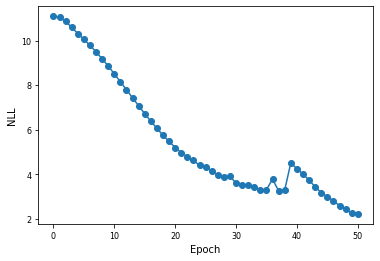

Epoch = 51, Nsteps = 10400, NLL on test data = 2.262476


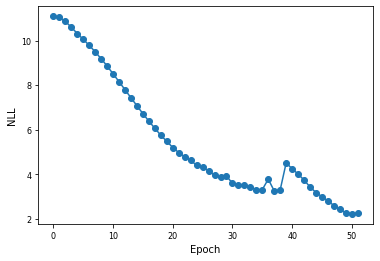

Epoch = 52, Nsteps = 10600, NLL on test data = 2.683277


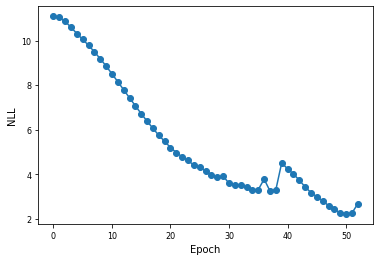

Epoch = 53, Nsteps = 10800, NLL on test data = 4.322787


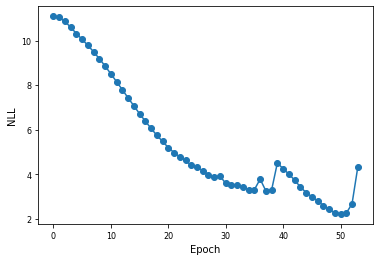

Epoch = 54, Nsteps = 11000, NLL on test data = 5.857006


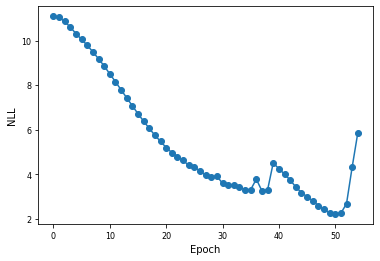

Epoch = 55, Nsteps = 11200, NLL on test data = 7.175229


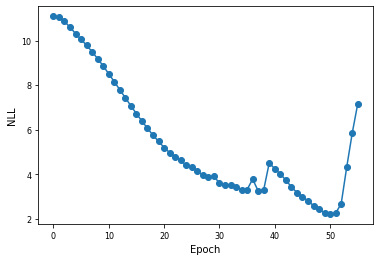

Epoch = 56, Nsteps = 11400, NLL on test data = 8.238931


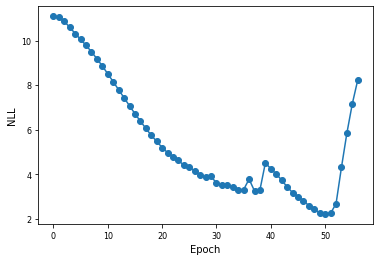

Epoch = 57, Nsteps = 11600, NLL on test data = 7.184349


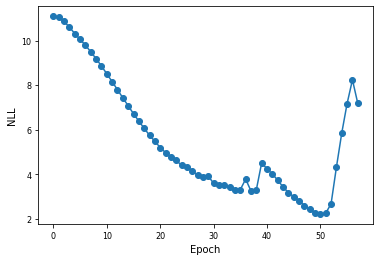

Epoch = 58, Nsteps = 11800, NLL on test data = 4.688459


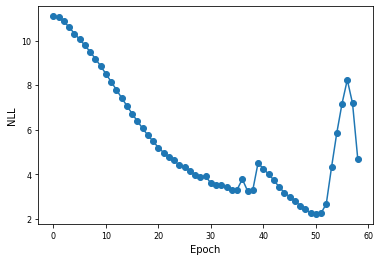

Epoch = 59, Nsteps = 12000, NLL on test data = 2.840068


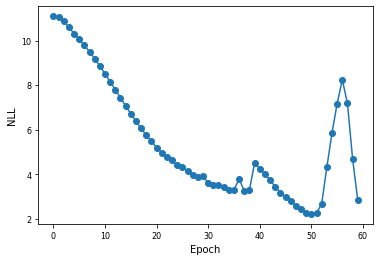

Epoch = 60, Nsteps = 12200, NLL on test data = 1.913935


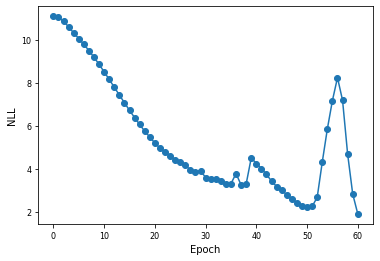

Epoch = 61, Nsteps = 12400, NLL on test data = 2.319149


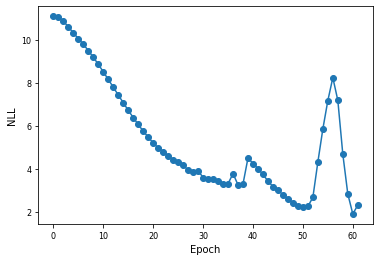

Epoch = 62, Nsteps = 12600, NLL on test data = 2.837117


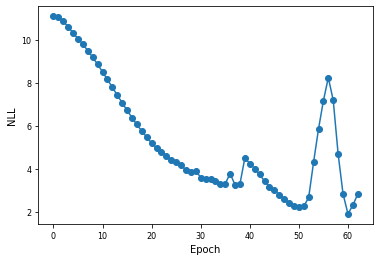

Epoch = 63, Nsteps = 12800, NLL on test data = 3.743160


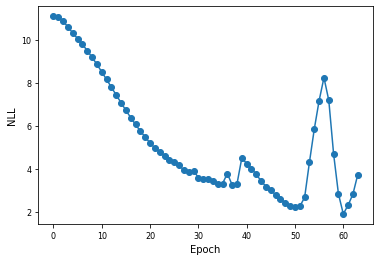

Epoch = 64, Nsteps = 13000, NLL on test data = 1.740783


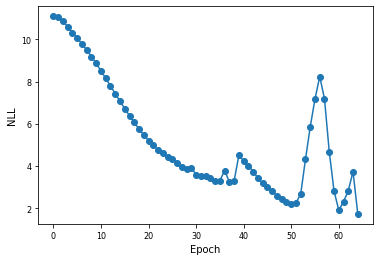

Epoch = 65, Nsteps = 13200, NLL on test data = 2.797983


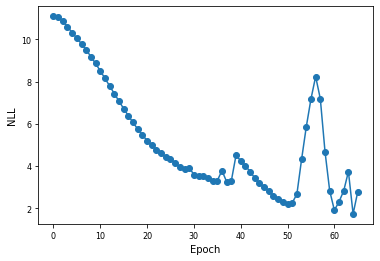

Epoch = 66, Nsteps = 13400, NLL on test data = 4.190870


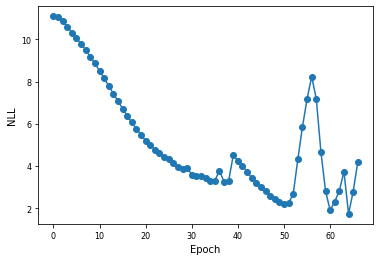

Epoch = 67, Nsteps = 13600, NLL on test data = 5.346437


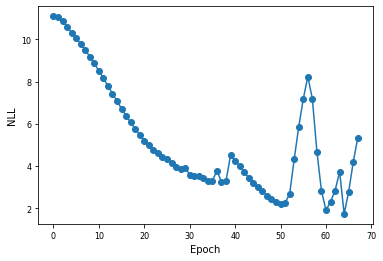

Epoch = 68, Nsteps = 13800, NLL on test data = 6.593812


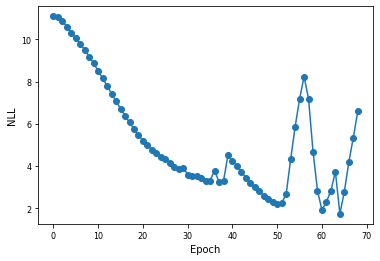

Epoch = 69, Nsteps = 14000, NLL on test data = 7.602351


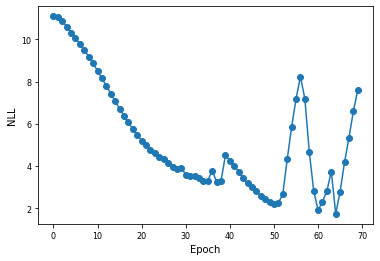

Epoch = 70, Nsteps = 14200, NLL on test data = 8.488292


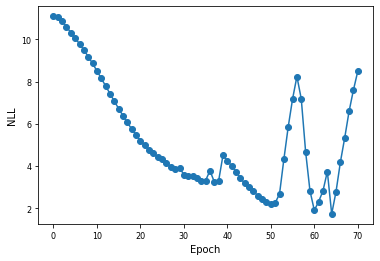

Epoch = 71, Nsteps = 14400, NLL on test data = 9.444995


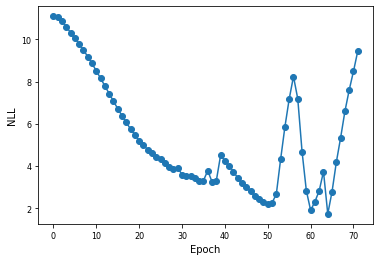

Epoch = 72, Nsteps = 14600, NLL on test data = 10.186057


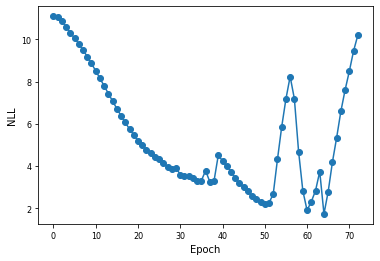

Epoch = 73, Nsteps = 14800, NLL on test data = 10.915522


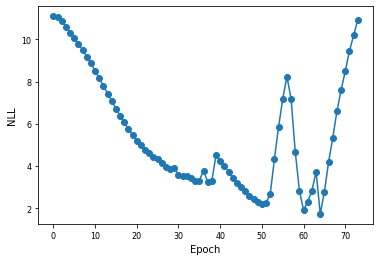

Epoch = 74, Nsteps = 15000, NLL on test data = 11.633064


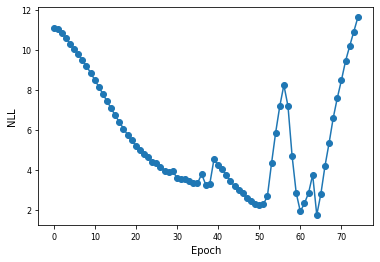

Epoch = 75, Nsteps = 15200, NLL on test data = 12.285102


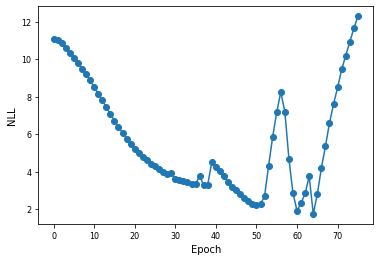

Epoch = 76, Nsteps = 15400, NLL on test data = 12.693407


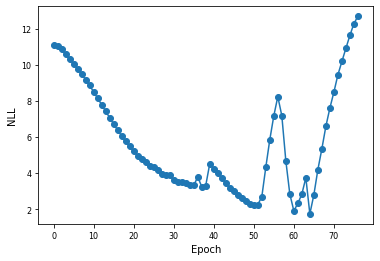

Epoch = 77, Nsteps = 15600, NLL on test data = 13.396210


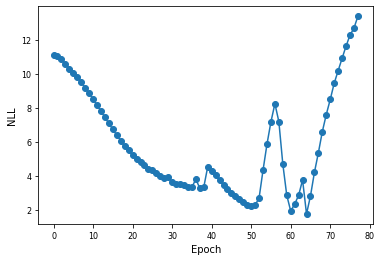

Epoch = 78, Nsteps = 15800, NLL on test data = 13.843304


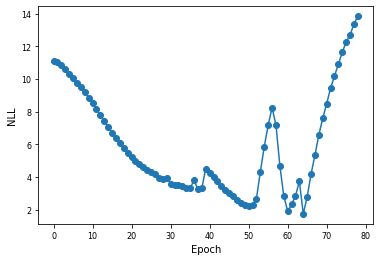

Epoch = 79, Nsteps = 16000, NLL on test data = 14.287097


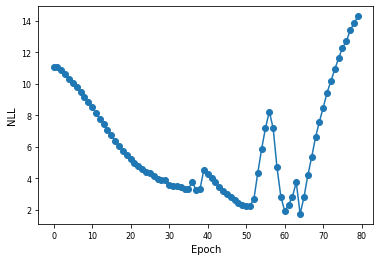

Epoch = 80, Nsteps = 16200, NLL on test data = 14.732263


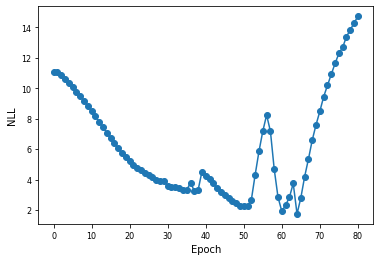

Epoch = 81, Nsteps = 16400, NLL on test data = 15.305568


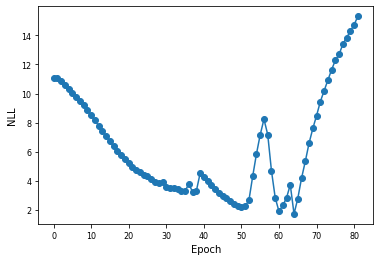

Epoch = 82, Nsteps = 16600, NLL on test data = 11.445801


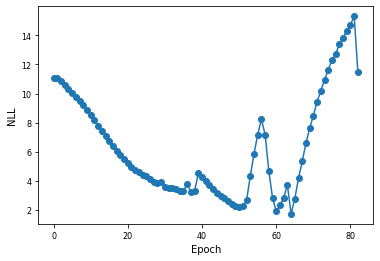

Epoch = 83, Nsteps = 16800, NLL on test data = 6.670820


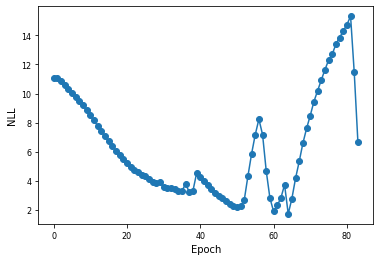

Epoch = 84, Nsteps = 17000, NLL on test data = 3.213461


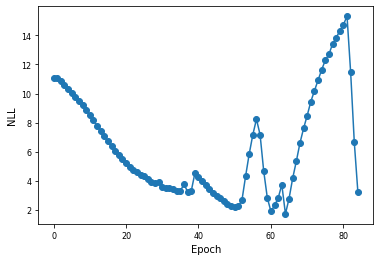

Epoch = 85, Nsteps = 17200, NLL on test data = 1.600044


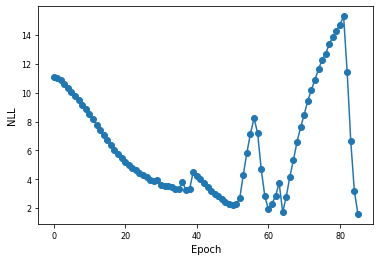

Epoch = 86, Nsteps = 17400, NLL on test data = 3.307886


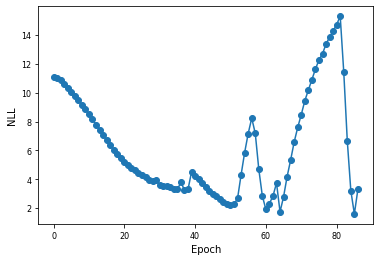

Epoch = 87, Nsteps = 17600, NLL on test data = 5.056950


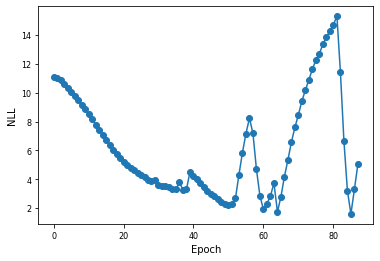

Epoch = 88, Nsteps = 17800, NLL on test data = 5.843089


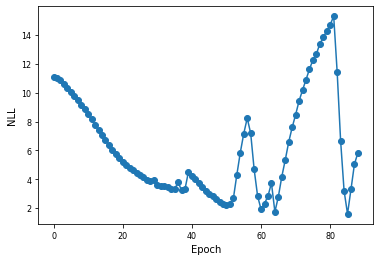

Epoch = 89, Nsteps = 18000, NLL on test data = 4.581981


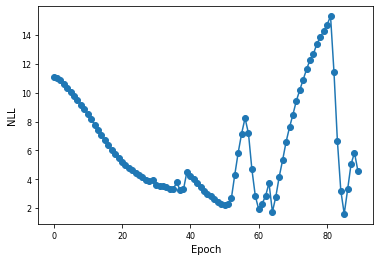

Epoch = 90, Nsteps = 18200, NLL on test data = 2.193637


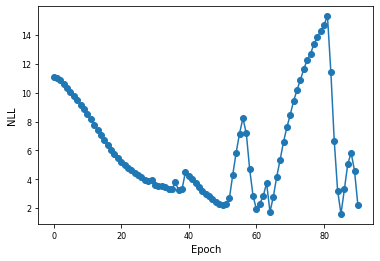

Epoch = 91, Nsteps = 18400, NLL on test data = 1.399279


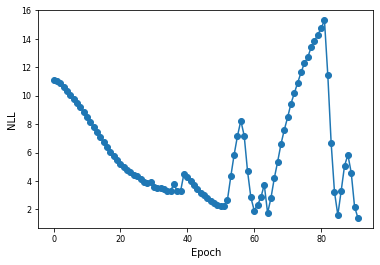

Epoch = 92, Nsteps = 18600, NLL on test data = 2.334352


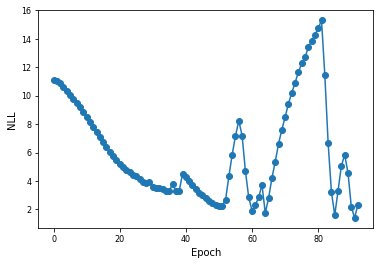

Epoch = 93, Nsteps = 18800, NLL on test data = 3.526674


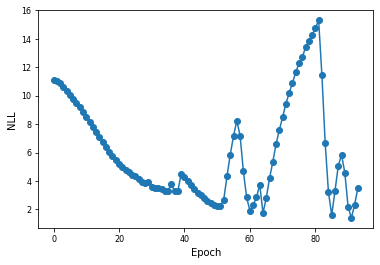

Epoch = 94, Nsteps = 19000, NLL on test data = 4.501128


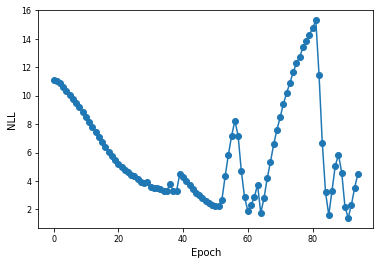

Epoch = 95, Nsteps = 19200, NLL on test data = 5.461012


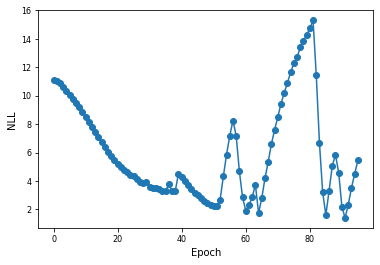

Epoch = 96, Nsteps = 19400, NLL on test data = 6.283834


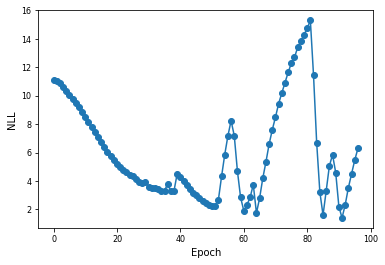

Epoch = 97, Nsteps = 19600, NLL on test data = 7.216574


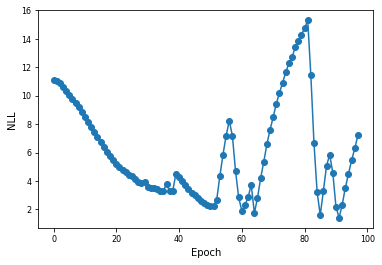

Epoch = 98, Nsteps = 19800, NLL on test data = 7.884679


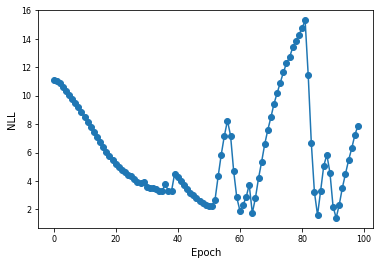

Epoch = 99, Nsteps = 20000, NLL on test data = 8.383499


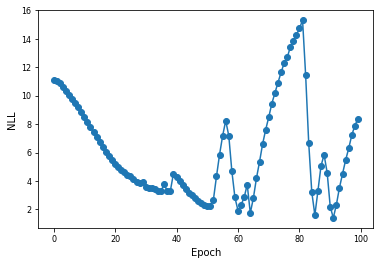

Epoch = 0, Nsteps = 200, NLL on test data = 11.082032


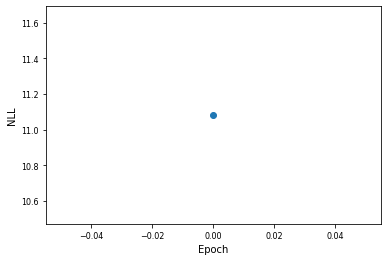

Epoch = 1, Nsteps = 400, NLL on test data = 10.982558


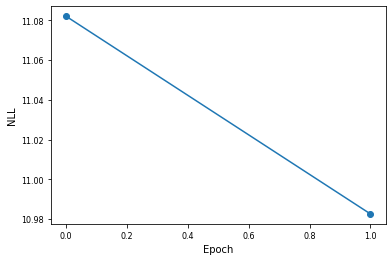

Epoch = 2, Nsteps = 600, NLL on test data = 10.738335


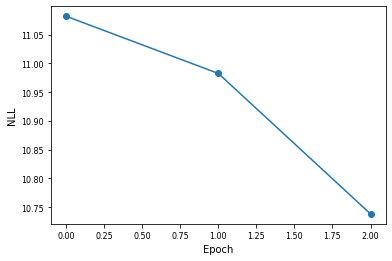

Epoch = 3, Nsteps = 800, NLL on test data = 10.457014


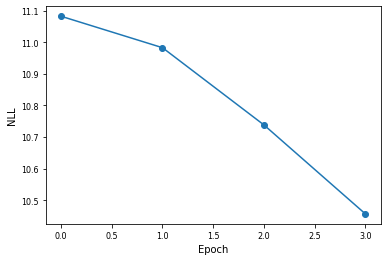

Epoch = 4, Nsteps = 1000, NLL on test data = 10.201834


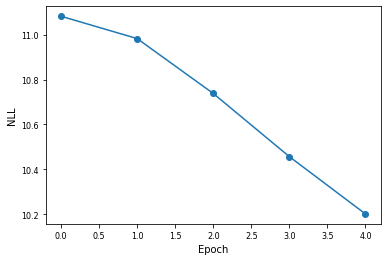

Epoch = 5, Nsteps = 1200, NLL on test data = 9.951486


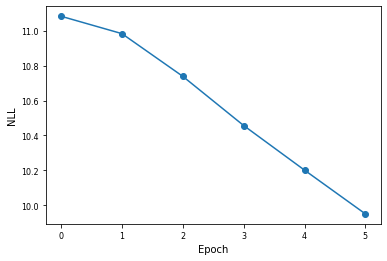

Epoch = 6, Nsteps = 1400, NLL on test data = 9.676549


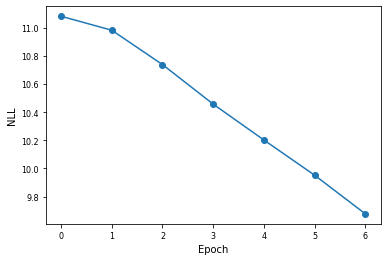

Epoch = 7, Nsteps = 1600, NLL on test data = 9.383712


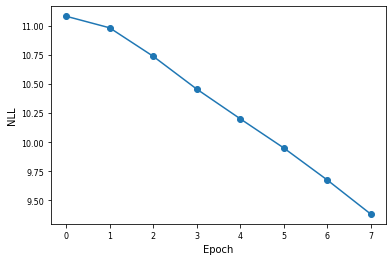

Epoch = 8, Nsteps = 1800, NLL on test data = 9.074286


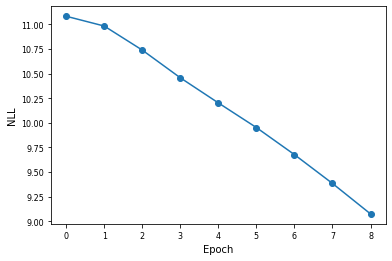

Epoch = 9, Nsteps = 2000, NLL on test data = 8.748420


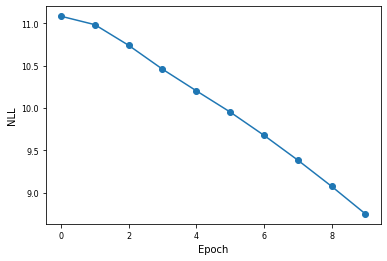

Epoch = 10, Nsteps = 2200, NLL on test data = 8.409689


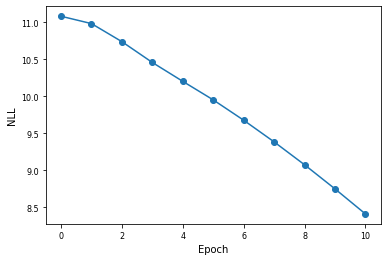

Epoch = 11, Nsteps = 2400, NLL on test data = 8.057759


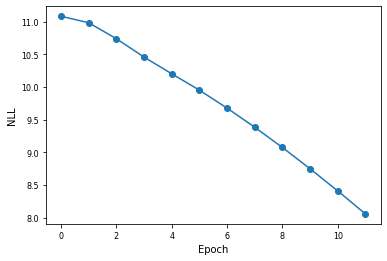

Epoch = 12, Nsteps = 2600, NLL on test data = 7.704327


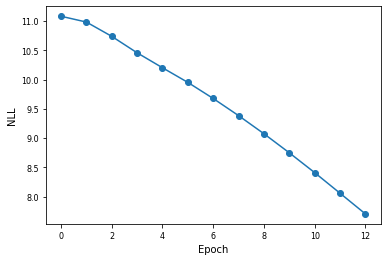

Epoch = 13, Nsteps = 2800, NLL on test data = 7.350426


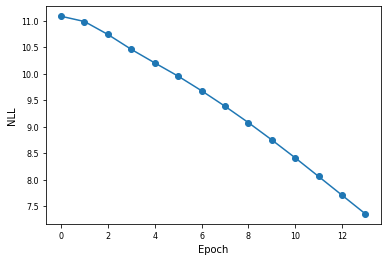

Epoch = 14, Nsteps = 3000, NLL on test data = 6.999040


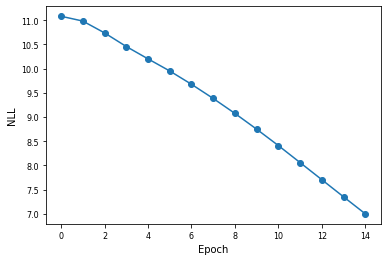

Epoch = 15, Nsteps = 3200, NLL on test data = 6.661001


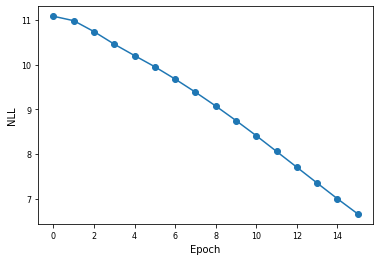

Epoch = 16, Nsteps = 3400, NLL on test data = 6.325961


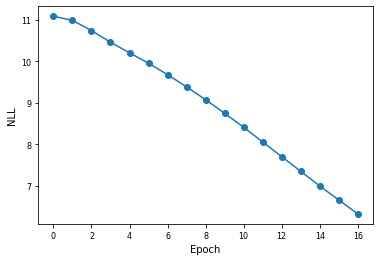

Epoch = 17, Nsteps = 3600, NLL on test data = 6.007938


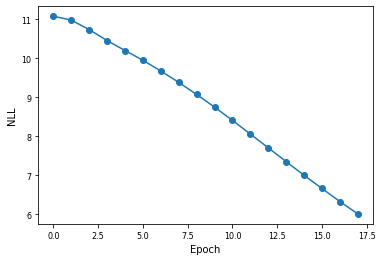

Epoch = 18, Nsteps = 3800, NLL on test data = 5.730252


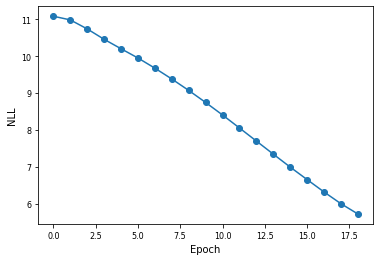

Epoch = 19, Nsteps = 4000, NLL on test data = 5.455805


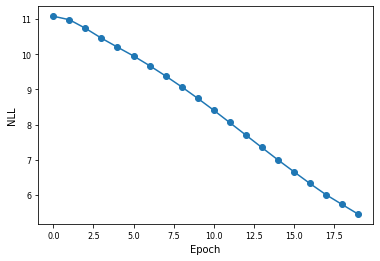

Epoch = 20, Nsteps = 4200, NLL on test data = 5.211155


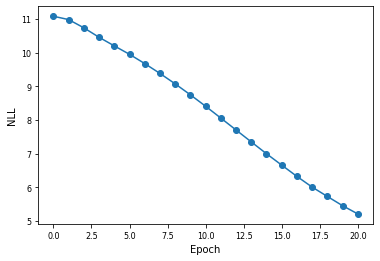

Epoch = 21, Nsteps = 4400, NLL on test data = 4.982027


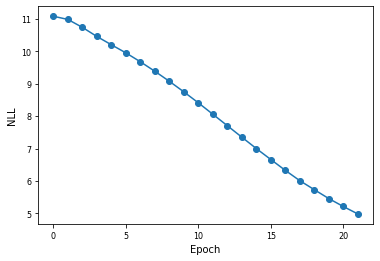

Epoch = 22, Nsteps = 4600, NLL on test data = 4.777887


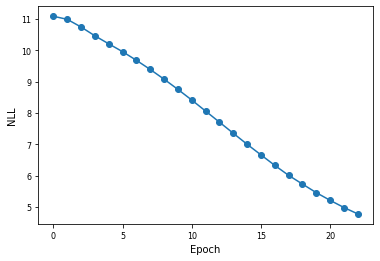

Epoch = 23, Nsteps = 4800, NLL on test data = 4.574746


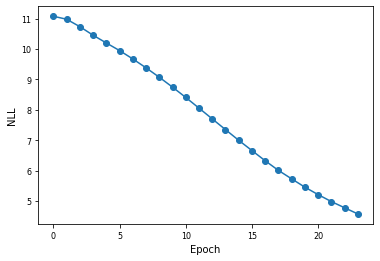

Epoch = 24, Nsteps = 5000, NLL on test data = 4.421395


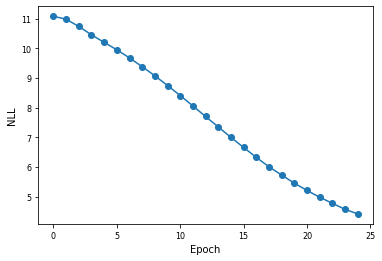

Epoch = 25, Nsteps = 5200, NLL on test data = 4.246953


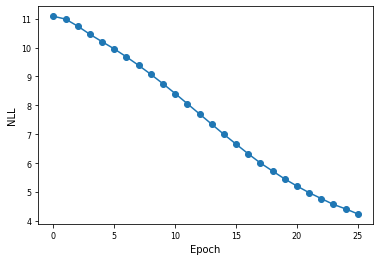

Epoch = 26, Nsteps = 5400, NLL on test data = 4.236282


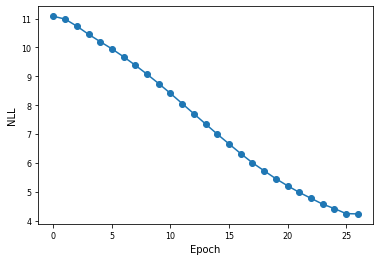

Epoch = 27, Nsteps = 5600, NLL on test data = 4.056922


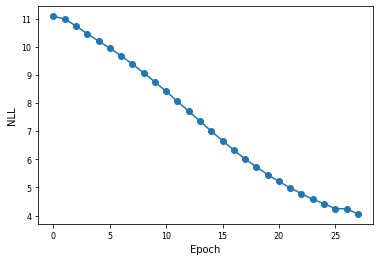

Epoch = 28, Nsteps = 5800, NLL on test data = 4.022268


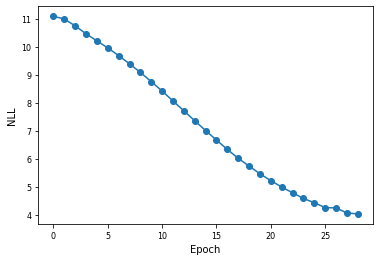

Epoch = 29, Nsteps = 6000, NLL on test data = 3.744583


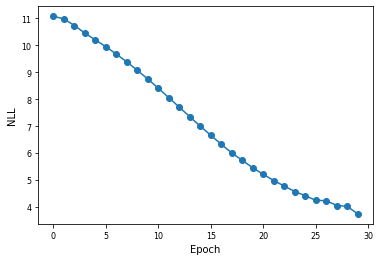

Epoch = 30, Nsteps = 6200, NLL on test data = 3.657130


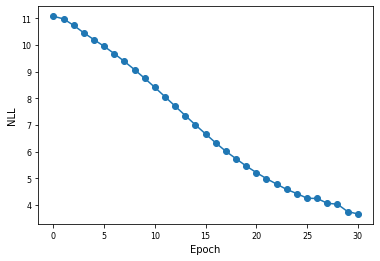

Epoch = 31, Nsteps = 6400, NLL on test data = 3.594740


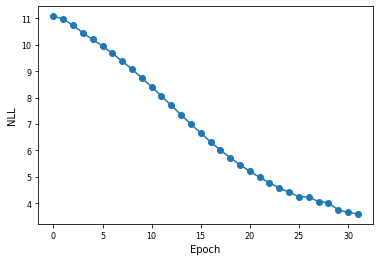

Epoch = 32, Nsteps = 6600, NLL on test data = 3.455764


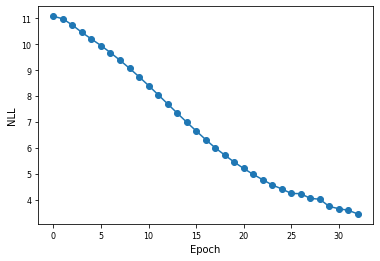

Epoch = 33, Nsteps = 6800, NLL on test data = 3.311183


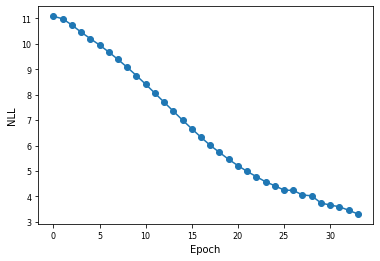

Epoch = 34, Nsteps = 7000, NLL on test data = 3.437310


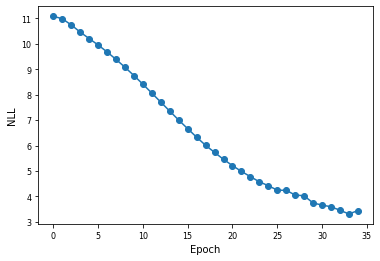

Epoch = 35, Nsteps = 7200, NLL on test data = 3.143172


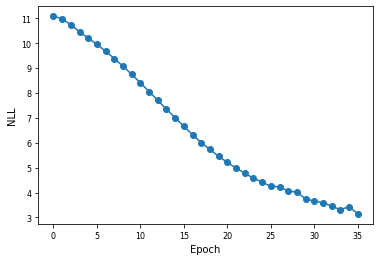

Epoch = 36, Nsteps = 7400, NLL on test data = 3.513150


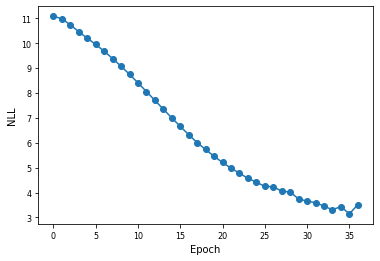

Epoch = 37, Nsteps = 7600, NLL on test data = 3.333661


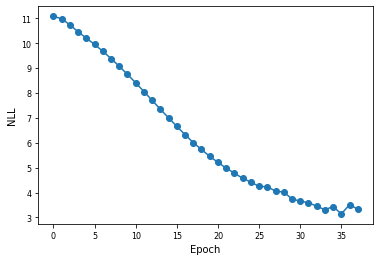

Epoch = 38, Nsteps = 7800, NLL on test data = 4.488727


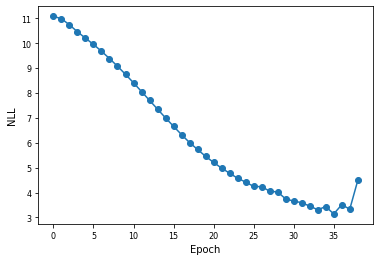

Epoch = 39, Nsteps = 8000, NLL on test data = 4.225916


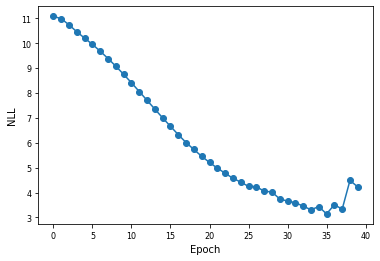

Epoch = 40, Nsteps = 8200, NLL on test data = 3.933428


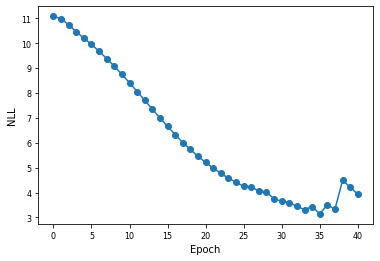

Epoch = 41, Nsteps = 8400, NLL on test data = 3.638787


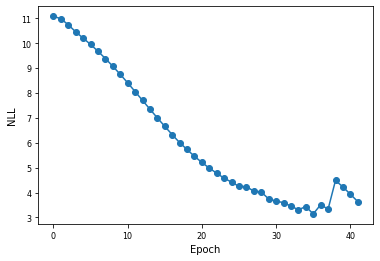

Epoch = 42, Nsteps = 8600, NLL on test data = 3.410748


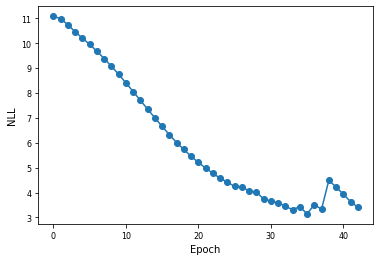

Epoch = 43, Nsteps = 8800, NLL on test data = 3.119937


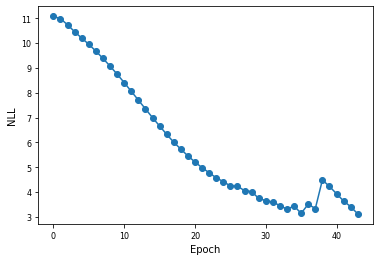

Epoch = 44, Nsteps = 9000, NLL on test data = 2.565618


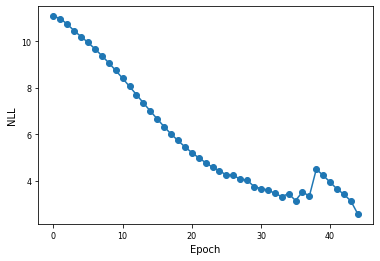

Epoch = 45, Nsteps = 9200, NLL on test data = 4.044777


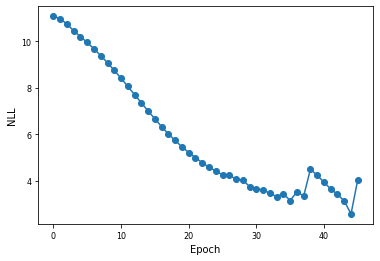

Epoch = 46, Nsteps = 9400, NLL on test data = 2.606475


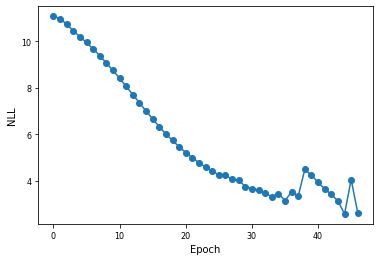

Epoch = 47, Nsteps = 9600, NLL on test data = 7.195290


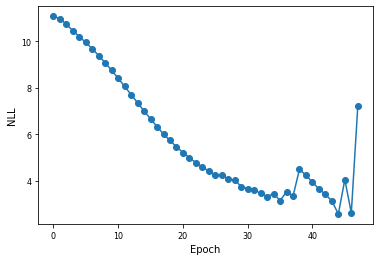

Epoch = 48, Nsteps = 9800, NLL on test data = 9.835562


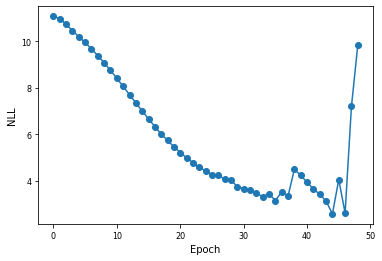

Epoch = 49, Nsteps = 10000, NLL on test data = 8.139868


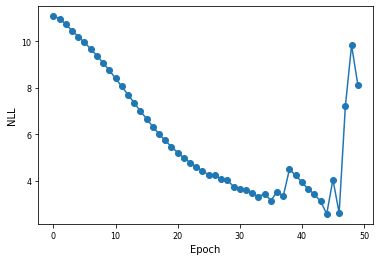

Epoch = 50, Nsteps = 10200, NLL on test data = 6.627692


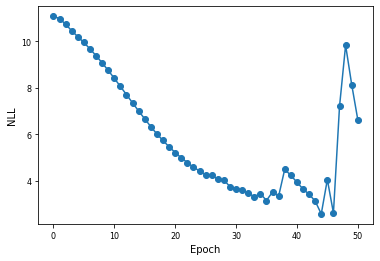

Epoch = 51, Nsteps = 10400, NLL on test data = 3.845509


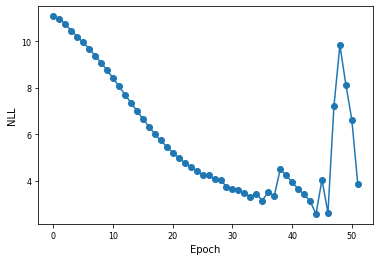

Epoch = 52, Nsteps = 10600, NLL on test data = 2.535219


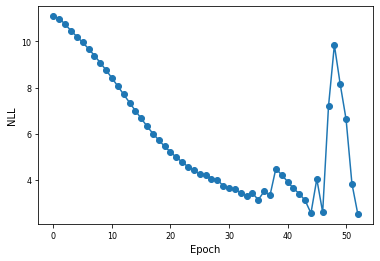

Epoch = 53, Nsteps = 10800, NLL on test data = 3.986110


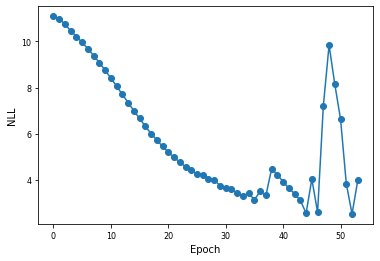

Epoch = 54, Nsteps = 11000, NLL on test data = 2.193245


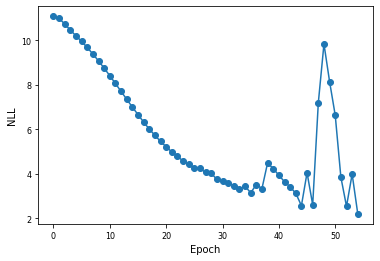

Epoch = 55, Nsteps = 11200, NLL on test data = 3.270375


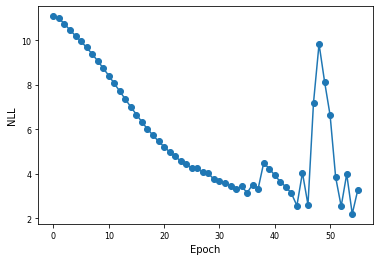

Epoch = 56, Nsteps = 11400, NLL on test data = 4.730449


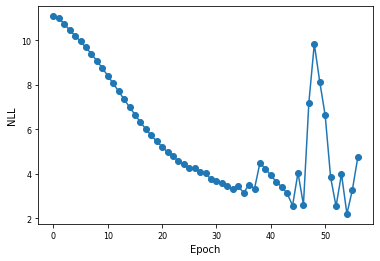

Epoch = 57, Nsteps = 11600, NLL on test data = 6.019925


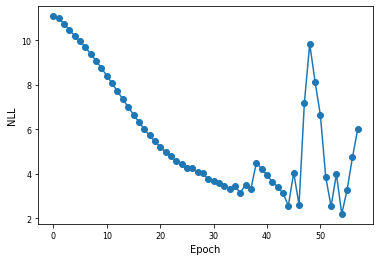

Epoch = 58, Nsteps = 11800, NLL on test data = 7.090860


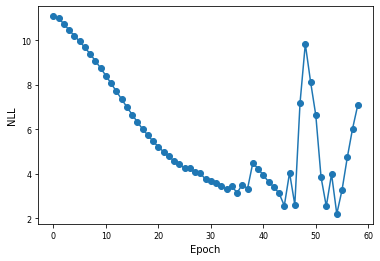

Epoch = 59, Nsteps = 12000, NLL on test data = 8.240038


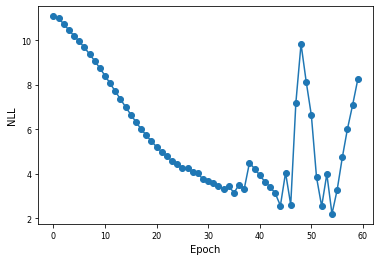

Epoch = 60, Nsteps = 12200, NLL on test data = 6.203794


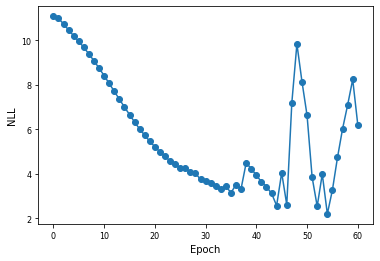

Epoch = 61, Nsteps = 12400, NLL on test data = 4.106772


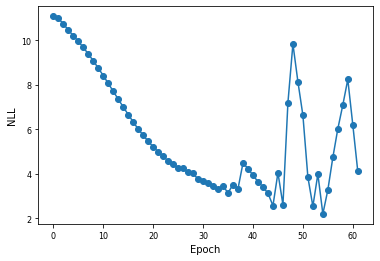

Epoch = 62, Nsteps = 12600, NLL on test data = 2.503058


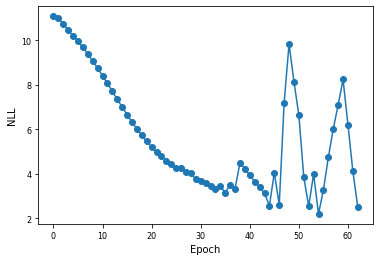

Epoch = 63, Nsteps = 12800, NLL on test data = 2.002689


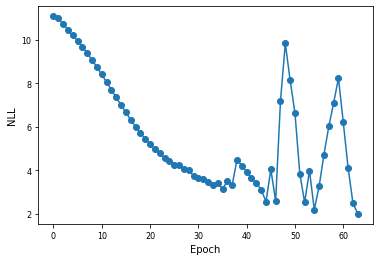

Epoch = 64, Nsteps = 13000, NLL on test data = 2.520123


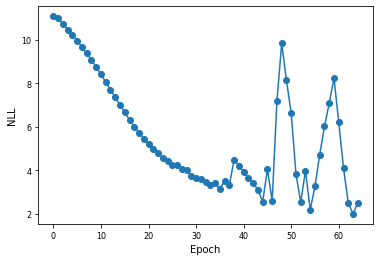

Epoch = 65, Nsteps = 13200, NLL on test data = 3.202391


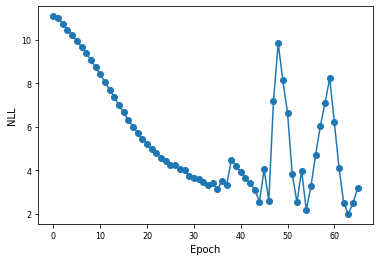

Epoch = 66, Nsteps = 13400, NLL on test data = 3.967956


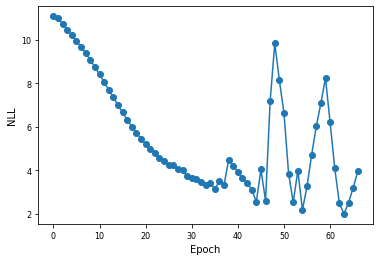

Epoch = 67, Nsteps = 13600, NLL on test data = 4.600696


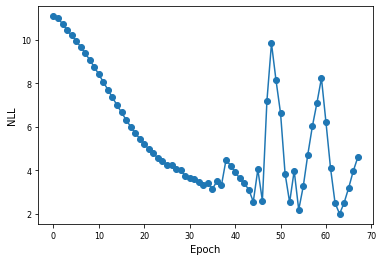

Epoch = 68, Nsteps = 13800, NLL on test data = 2.753860


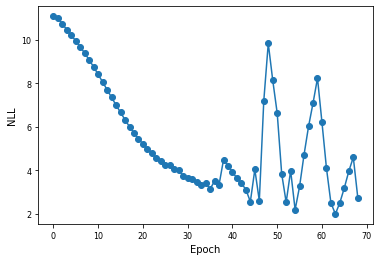

Epoch = 69, Nsteps = 14000, NLL on test data = 1.891643


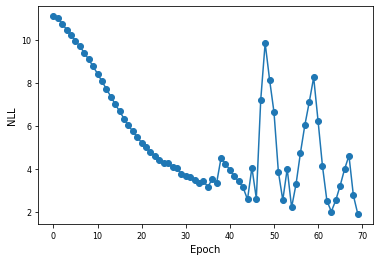

Epoch = 70, Nsteps = 14200, NLL on test data = 3.306476


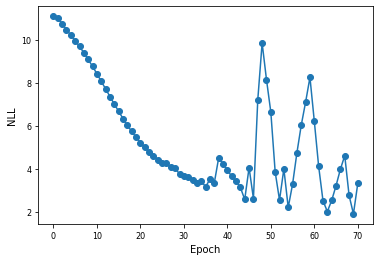

Epoch = 71, Nsteps = 14400, NLL on test data = 4.762208


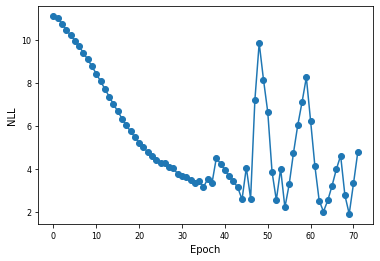

Epoch = 72, Nsteps = 14600, NLL on test data = 5.864560


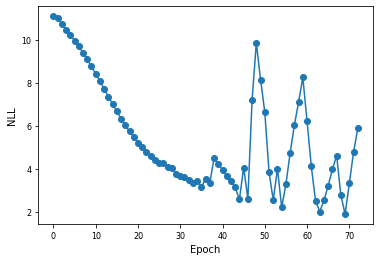

Epoch = 73, Nsteps = 14800, NLL on test data = 7.000075


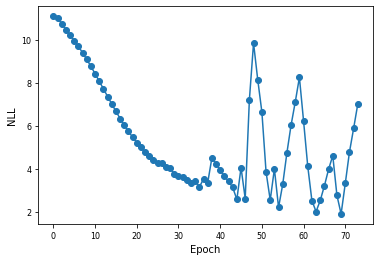

Epoch = 74, Nsteps = 15000, NLL on test data = 7.789437


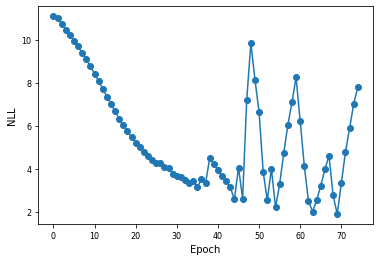

Epoch = 75, Nsteps = 15200, NLL on test data = 8.955141


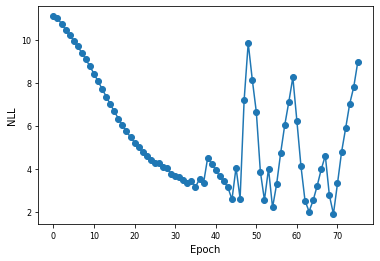

Epoch = 76, Nsteps = 15400, NLL on test data = 9.928149


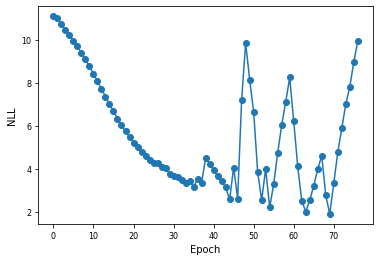

Epoch = 77, Nsteps = 15600, NLL on test data = 10.539498


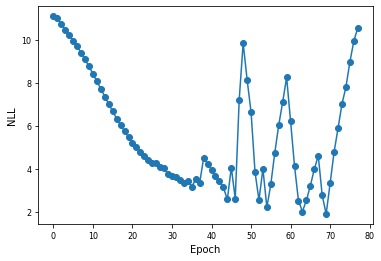

Epoch = 78, Nsteps = 15800, NLL on test data = 11.247567


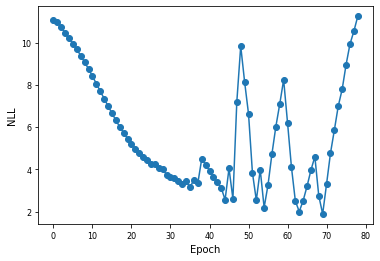

Epoch = 79, Nsteps = 16000, NLL on test data = 11.994258


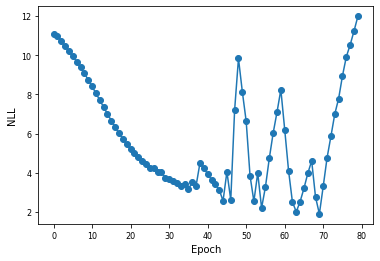

Epoch = 80, Nsteps = 16200, NLL on test data = 12.540922


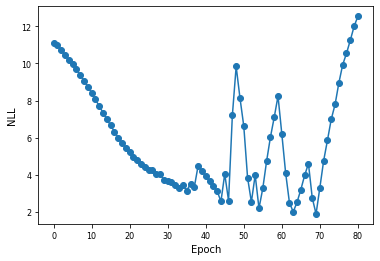

Epoch = 81, Nsteps = 16400, NLL on test data = 13.254350


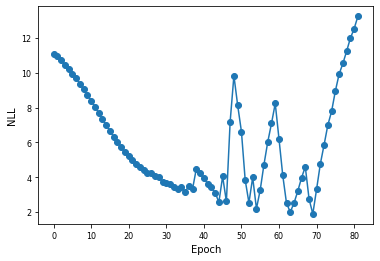

Epoch = 82, Nsteps = 16600, NLL on test data = 13.608593


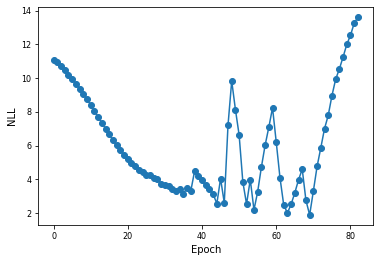

Epoch = 83, Nsteps = 16800, NLL on test data = 14.227412


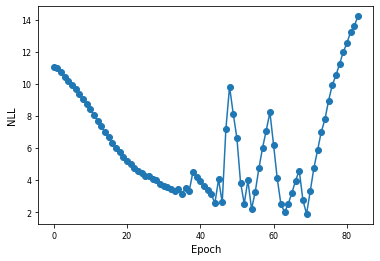

Epoch = 84, Nsteps = 17000, NLL on test data = 14.769815


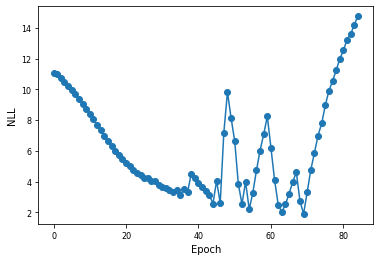

Epoch = 85, Nsteps = 17200, NLL on test data = 15.365654


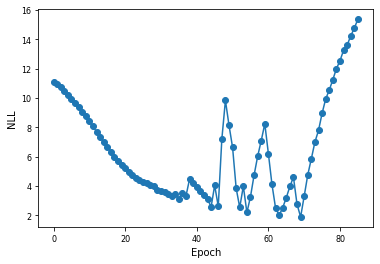

Epoch = 86, Nsteps = 17400, NLL on test data = 15.824130


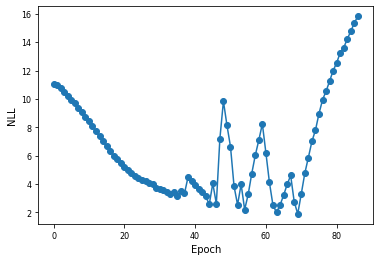

Epoch = 87, Nsteps = 17600, NLL on test data = 16.132442


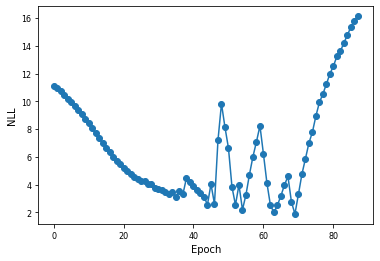

Epoch = 88, Nsteps = 17800, NLL on test data = 16.633924


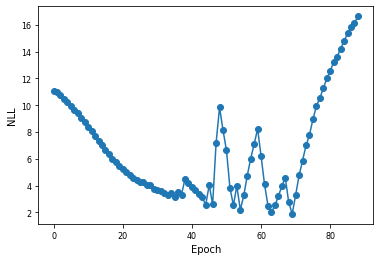

Epoch = 89, Nsteps = 18000, NLL on test data = 15.930642


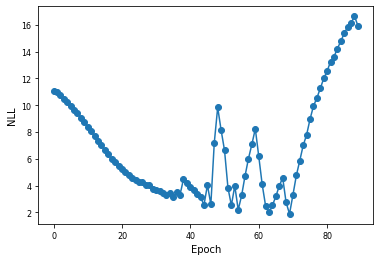

Epoch = 90, Nsteps = 18200, NLL on test data = 10.247058


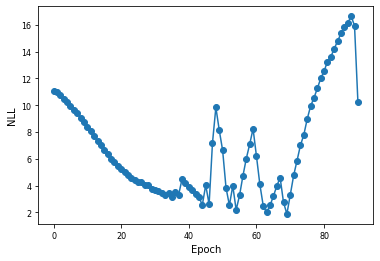

Epoch = 91, Nsteps = 18400, NLL on test data = 5.948225


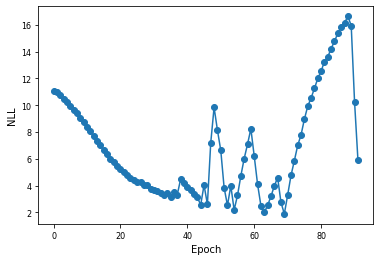

Epoch = 92, Nsteps = 18600, NLL on test data = 2.537169


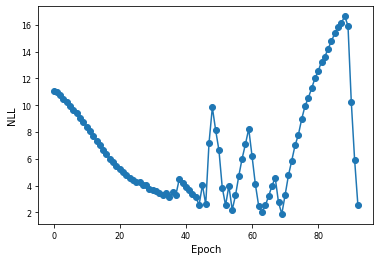

Epoch = 93, Nsteps = 18800, NLL on test data = 2.137853


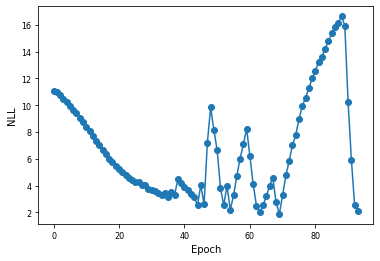

Epoch = 94, Nsteps = 19000, NLL on test data = 4.098582


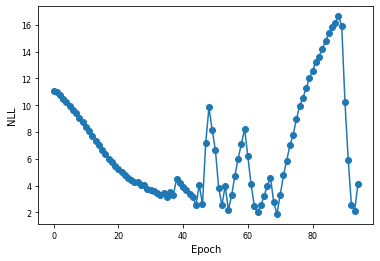

Epoch = 95, Nsteps = 19200, NLL on test data = 5.396646


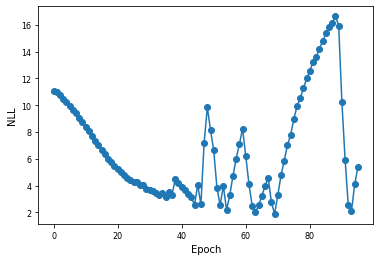

Epoch = 96, Nsteps = 19400, NLL on test data = 6.657271


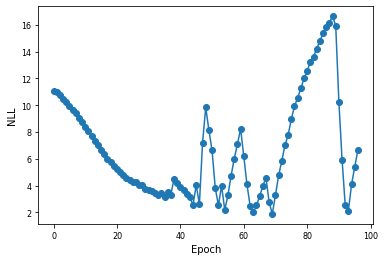

Epoch = 97, Nsteps = 19600, NLL on test data = 5.594796


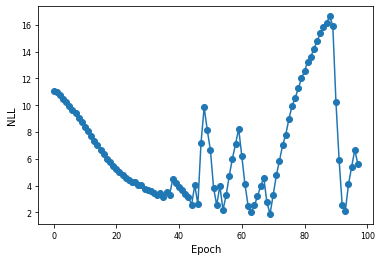

Epoch = 98, Nsteps = 19800, NLL on test data = 3.065257


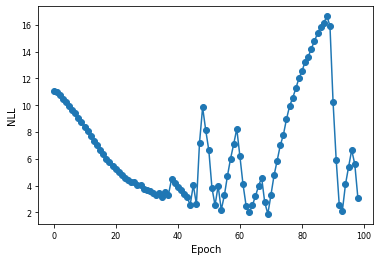

Epoch = 99, Nsteps = 20000, NLL on test data = 1.554796


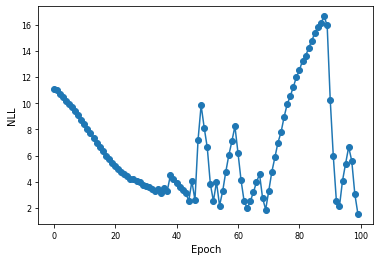

Epoch = 0, Nsteps = 200, NLL on test data = 11.067496


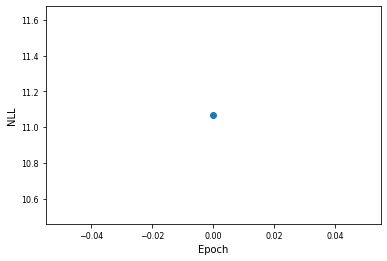

Epoch = 1, Nsteps = 400, NLL on test data = 10.960771


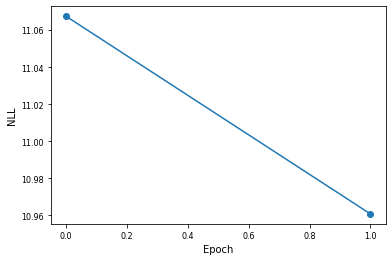

Epoch = 2, Nsteps = 600, NLL on test data = 10.795976


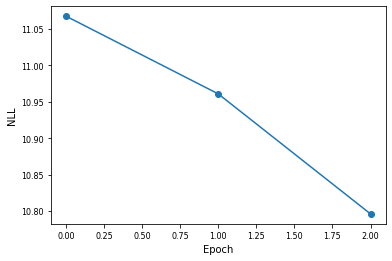

Epoch = 3, Nsteps = 800, NLL on test data = 10.657461


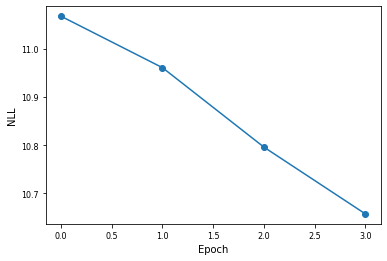

Epoch = 4, Nsteps = 1000, NLL on test data = 10.515269


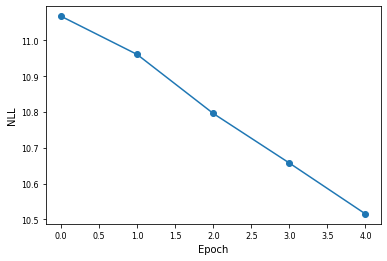

Epoch = 5, Nsteps = 1200, NLL on test data = 10.342712


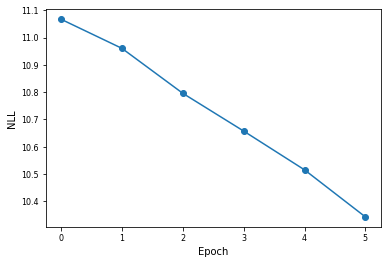

Epoch = 6, Nsteps = 1400, NLL on test data = 10.106525


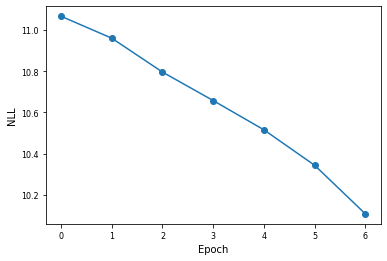

Epoch = 7, Nsteps = 1600, NLL on test data = 9.803344


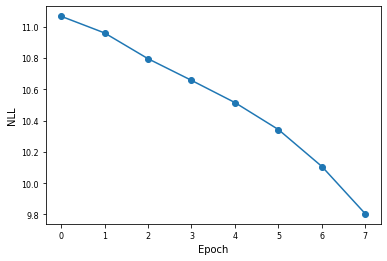

Epoch = 8, Nsteps = 1800, NLL on test data = 9.515238


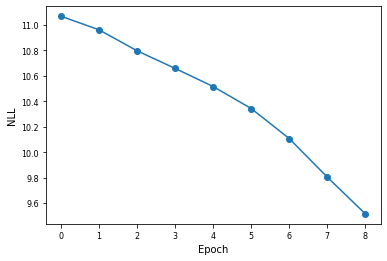

Epoch = 9, Nsteps = 2000, NLL on test data = 9.216328


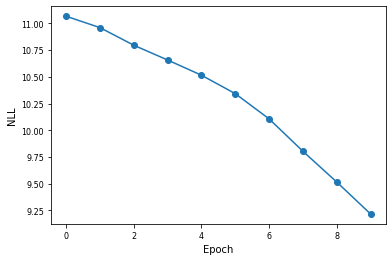

Epoch = 10, Nsteps = 2200, NLL on test data = 8.914547


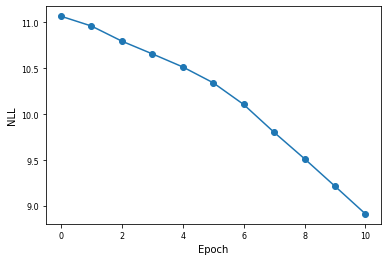

Epoch = 11, Nsteps = 2400, NLL on test data = 8.599066


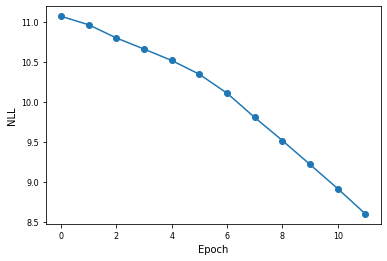

Epoch = 12, Nsteps = 2600, NLL on test data = 8.262746


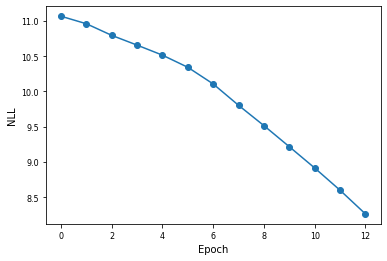

Epoch = 13, Nsteps = 2800, NLL on test data = 7.922711


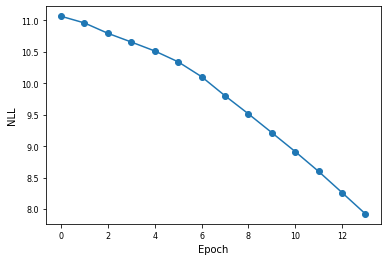

Epoch = 14, Nsteps = 3000, NLL on test data = 7.580124


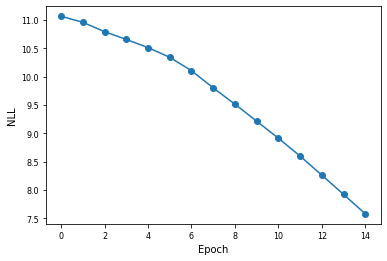

Epoch = 15, Nsteps = 3200, NLL on test data = 7.236476


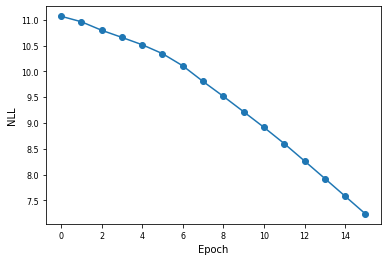

Epoch = 16, Nsteps = 3400, NLL on test data = 6.902061


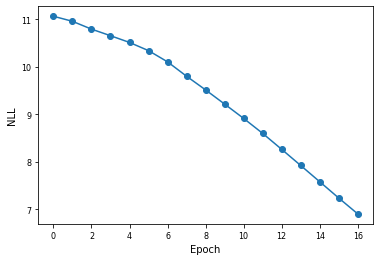

Epoch = 17, Nsteps = 3600, NLL on test data = 6.569474


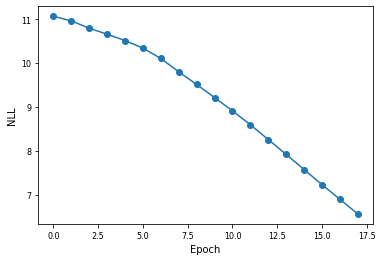

Epoch = 18, Nsteps = 3800, NLL on test data = 6.251140


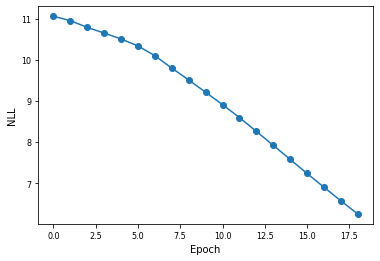

Epoch = 19, Nsteps = 4000, NLL on test data = 5.958533


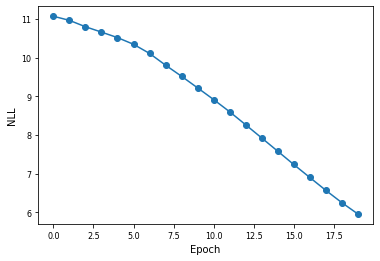

Epoch = 20, Nsteps = 4200, NLL on test data = 5.682742


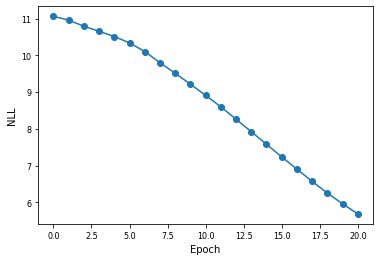

Epoch = 21, Nsteps = 4400, NLL on test data = 5.441512


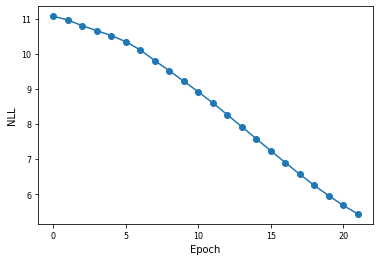

Epoch = 22, Nsteps = 4600, NLL on test data = 5.210093


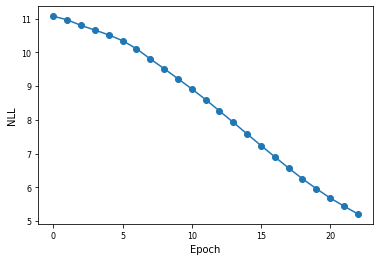

Epoch = 23, Nsteps = 4800, NLL on test data = 5.005033


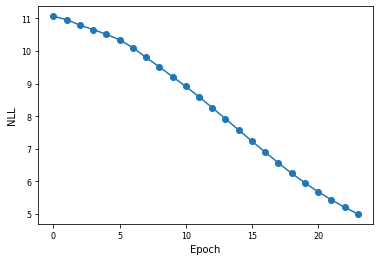

Epoch = 24, Nsteps = 5000, NLL on test data = 4.922078


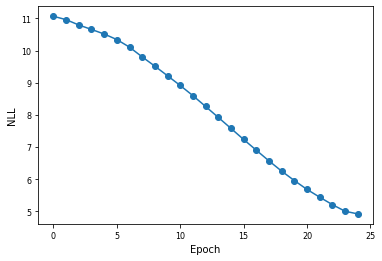

Epoch = 25, Nsteps = 5200, NLL on test data = 4.640076


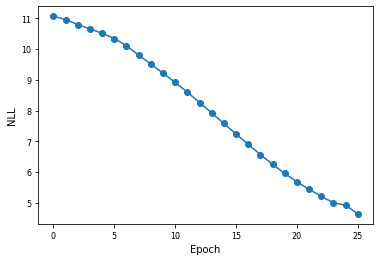

Epoch = 26, Nsteps = 5400, NLL on test data = 4.498599


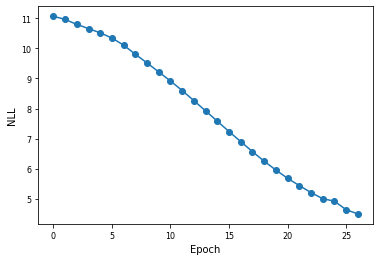

Epoch = 27, Nsteps = 5600, NLL on test data = 4.391683


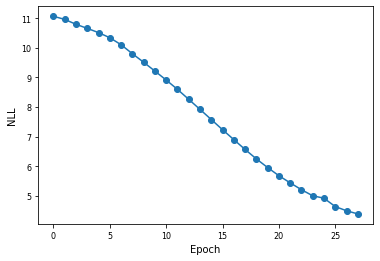

Epoch = 28, Nsteps = 5800, NLL on test data = 4.188487


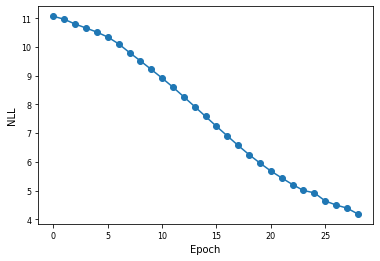

Epoch = 29, Nsteps = 6000, NLL on test data = 4.132139


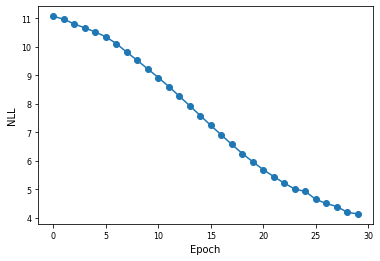

Epoch = 30, Nsteps = 6200, NLL on test data = 4.184853


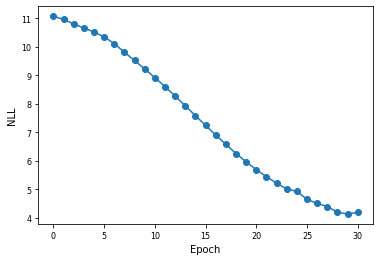

Epoch = 31, Nsteps = 6400, NLL on test data = 3.842971


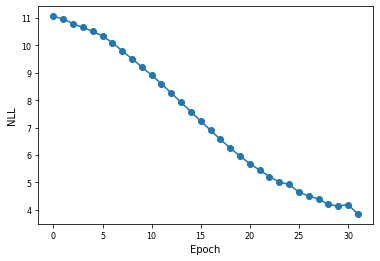

Epoch = 32, Nsteps = 6600, NLL on test data = 3.872677


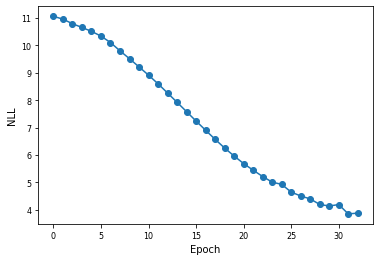

Epoch = 33, Nsteps = 6800, NLL on test data = 3.951399


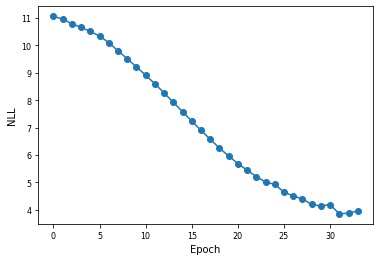

Epoch = 34, Nsteps = 7000, NLL on test data = 3.805382


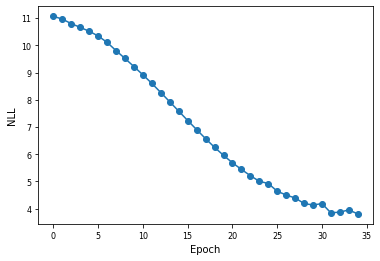

Epoch = 35, Nsteps = 7200, NLL on test data = 3.751173


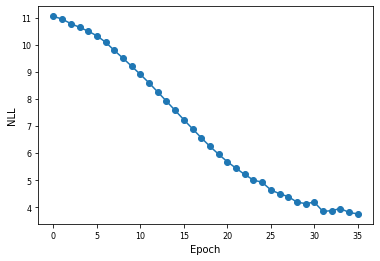

Epoch = 36, Nsteps = 7400, NLL on test data = 3.907762


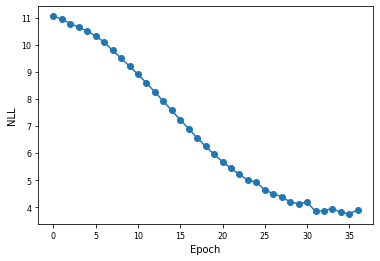

Epoch = 37, Nsteps = 7600, NLL on test data = 3.693994


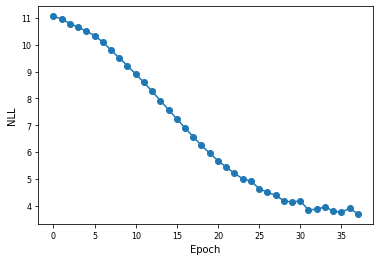

Epoch = 38, Nsteps = 7800, NLL on test data = 3.229765


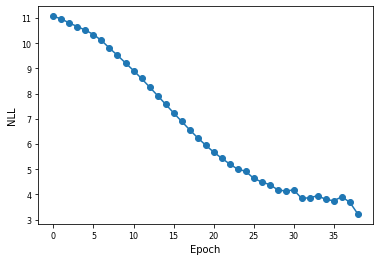

Epoch = 39, Nsteps = 8000, NLL on test data = 4.515927


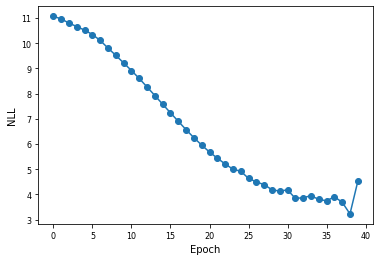

Epoch = 40, Nsteps = 8200, NLL on test data = 5.186793


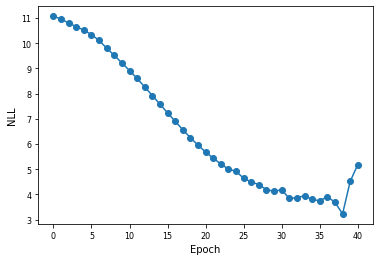

Epoch = 41, Nsteps = 8400, NLL on test data = 3.404093


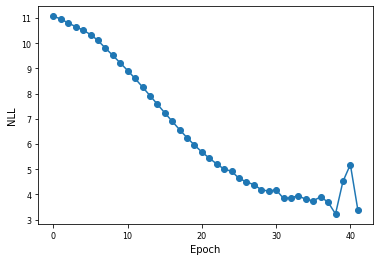

Epoch = 42, Nsteps = 8600, NLL on test data = 3.233068


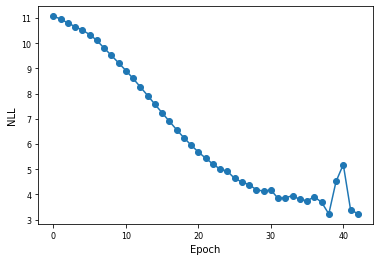

Epoch = 43, Nsteps = 8800, NLL on test data = 3.373849


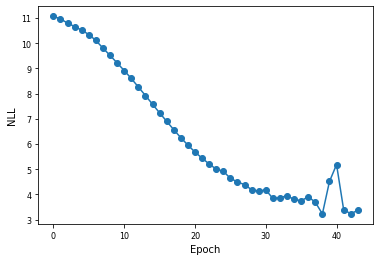

Epoch = 44, Nsteps = 9000, NLL on test data = 3.226318


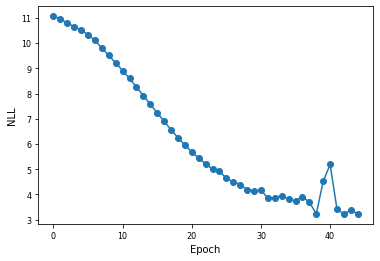

Epoch = 45, Nsteps = 9200, NLL on test data = 3.150765


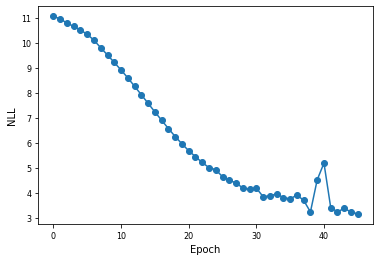

Epoch = 46, Nsteps = 9400, NLL on test data = 4.210515


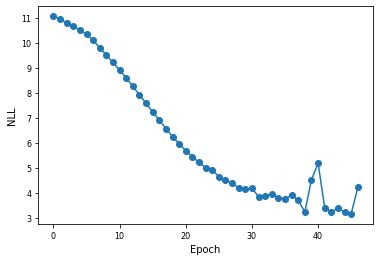

Epoch = 47, Nsteps = 9600, NLL on test data = 2.738238


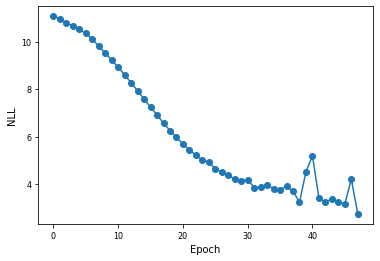

Epoch = 48, Nsteps = 9800, NLL on test data = 4.011337


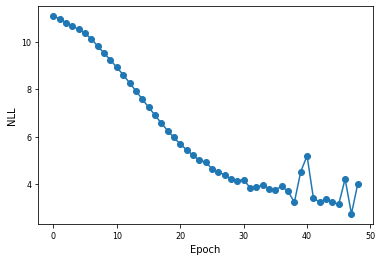

Epoch = 49, Nsteps = 10000, NLL on test data = 5.569921


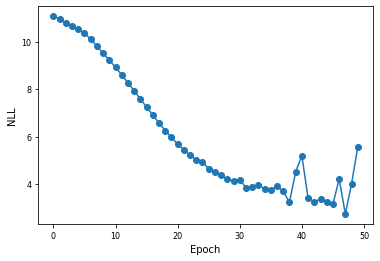

Epoch = 50, Nsteps = 10200, NLL on test data = 6.848629


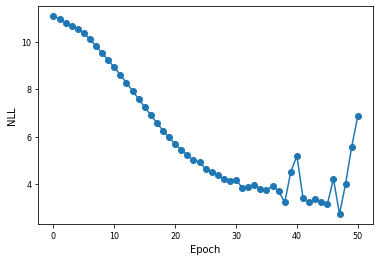

Epoch = 51, Nsteps = 10400, NLL on test data = 5.649781


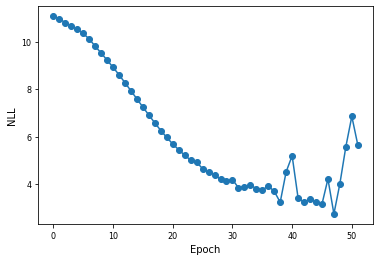

Epoch = 52, Nsteps = 10600, NLL on test data = 4.526486


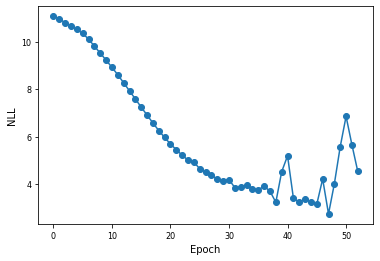

Epoch = 53, Nsteps = 10800, NLL on test data = 2.751411


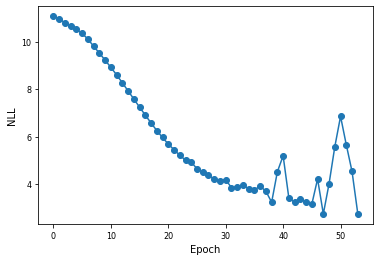

Epoch = 54, Nsteps = 11000, NLL on test data = 3.566278


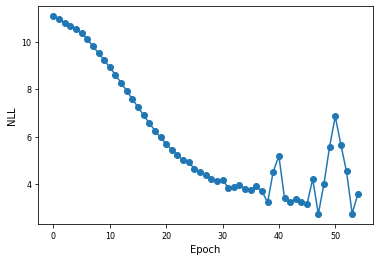

Epoch = 55, Nsteps = 11200, NLL on test data = 2.664623


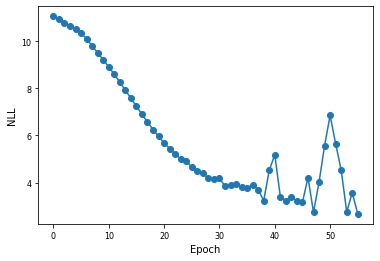

Epoch = 56, Nsteps = 11400, NLL on test data = 4.198140


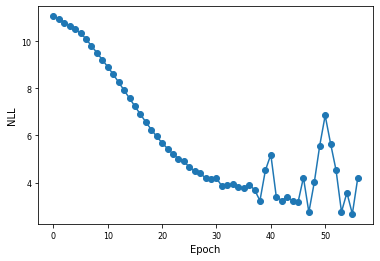

Epoch = 57, Nsteps = 11600, NLL on test data = 5.615877


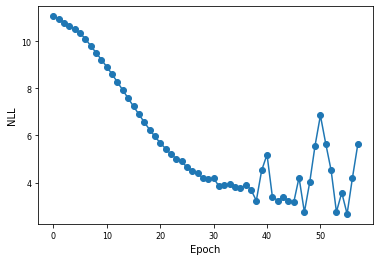

Epoch = 58, Nsteps = 11800, NLL on test data = 4.230011


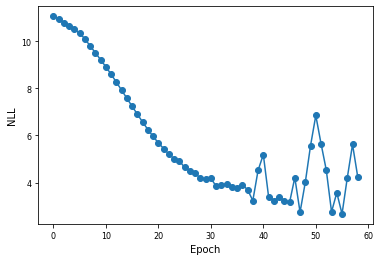

Epoch = 59, Nsteps = 12000, NLL on test data = 2.942401


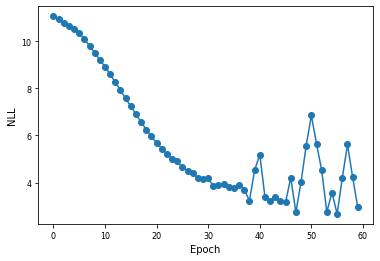

Epoch = 60, Nsteps = 12200, NLL on test data = 2.301541


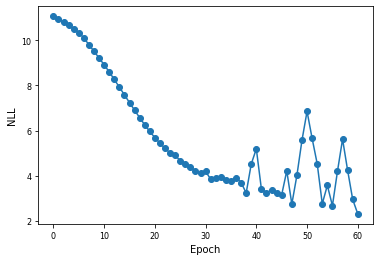

Epoch = 61, Nsteps = 12400, NLL on test data = 2.483721


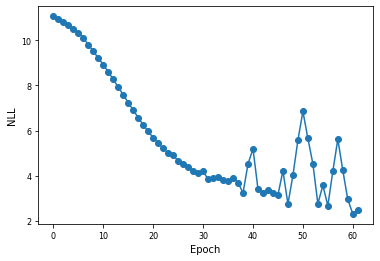

Epoch = 62, Nsteps = 12600, NLL on test data = 2.895906


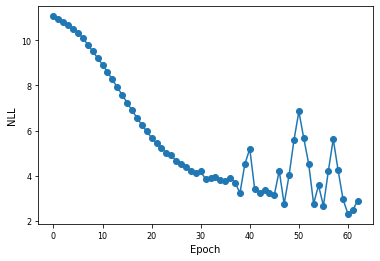

Epoch = 63, Nsteps = 12800, NLL on test data = 3.459717


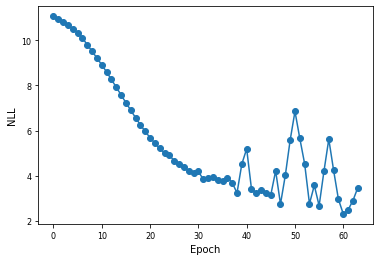

Epoch = 64, Nsteps = 13000, NLL on test data = 3.137908


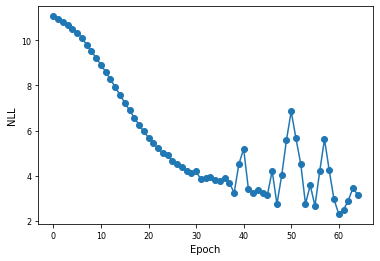

Epoch = 65, Nsteps = 13200, NLL on test data = 2.421136


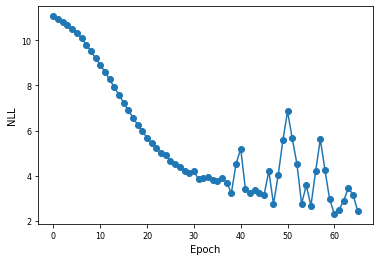

Epoch = 66, Nsteps = 13400, NLL on test data = 3.793680


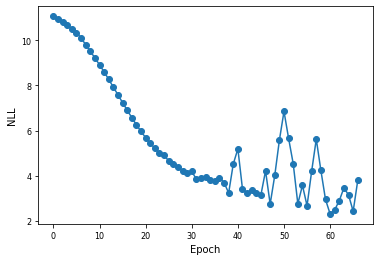

Epoch = 67, Nsteps = 13600, NLL on test data = 5.215409


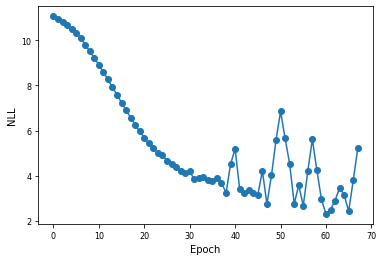

Epoch = 68, Nsteps = 13800, NLL on test data = 6.296582


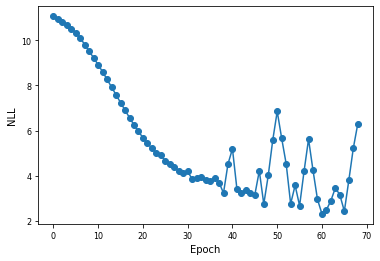

Epoch = 69, Nsteps = 14000, NLL on test data = 7.500285


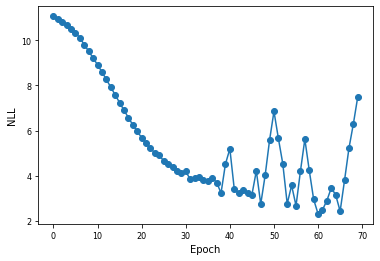

Epoch = 70, Nsteps = 14200, NLL on test data = 8.505796


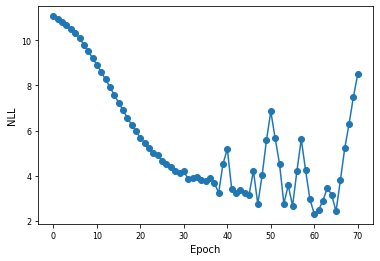

Epoch = 71, Nsteps = 14400, NLL on test data = 9.417578


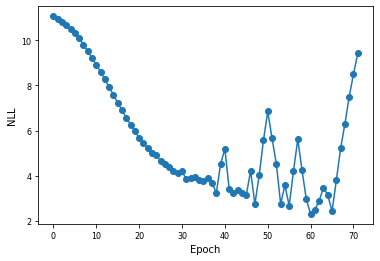

Epoch = 72, Nsteps = 14600, NLL on test data = 10.147121


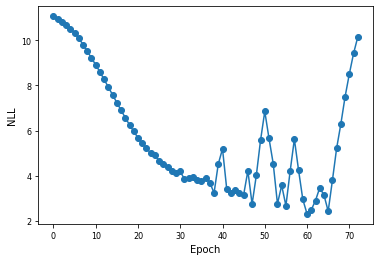

Epoch = 73, Nsteps = 14800, NLL on test data = 8.141263


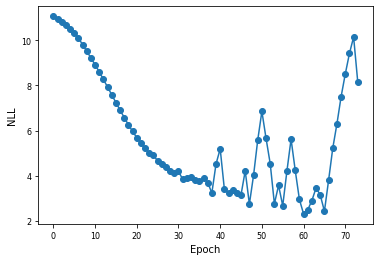

Epoch = 74, Nsteps = 15000, NLL on test data = 4.727210


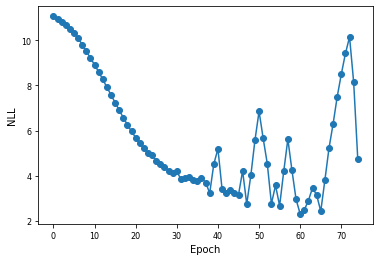

Epoch = 75, Nsteps = 15200, NLL on test data = 2.431128


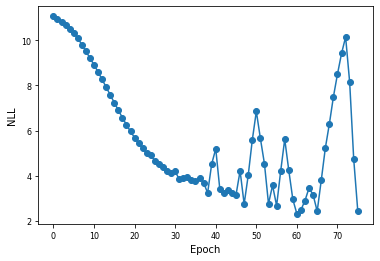

Epoch = 76, Nsteps = 15400, NLL on test data = 2.481169


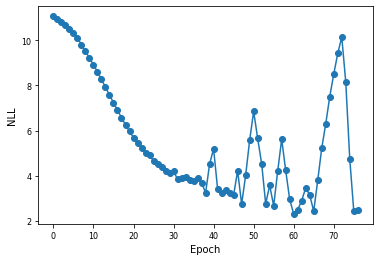

Epoch = 77, Nsteps = 15600, NLL on test data = 3.875516


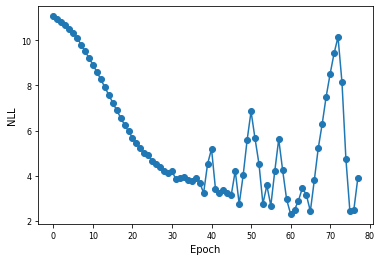

Epoch = 78, Nsteps = 15800, NLL on test data = 5.012943


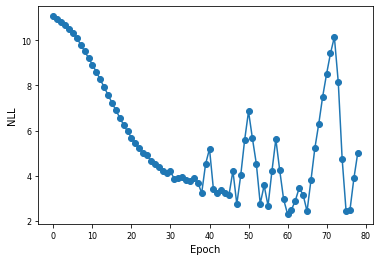

Epoch = 79, Nsteps = 16000, NLL on test data = 5.789854


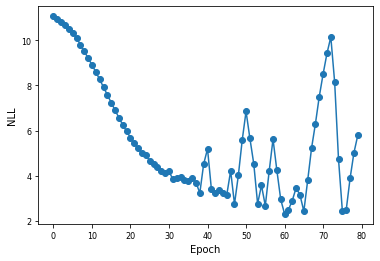

Epoch = 80, Nsteps = 16200, NLL on test data = 2.953407


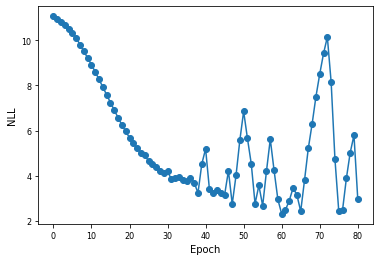

Epoch = 81, Nsteps = 16400, NLL on test data = 1.863981


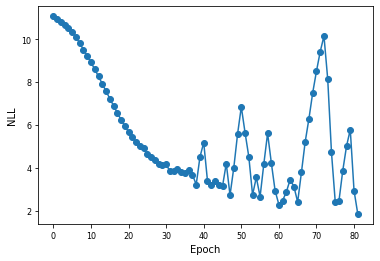

Epoch = 82, Nsteps = 16600, NLL on test data = 2.855594


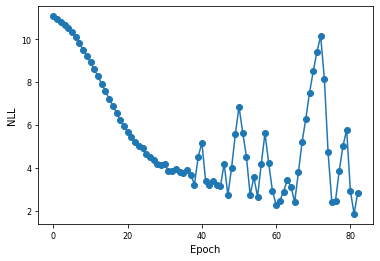

Epoch = 83, Nsteps = 16800, NLL on test data = 3.999480


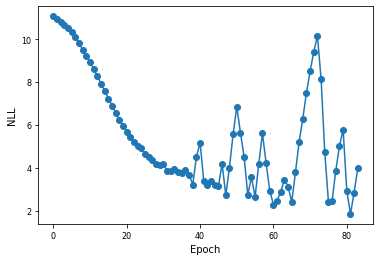

Epoch = 84, Nsteps = 17000, NLL on test data = 5.222096


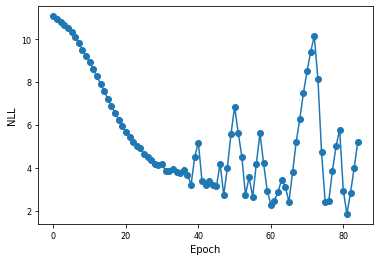

Epoch = 85, Nsteps = 17200, NLL on test data = 6.382374


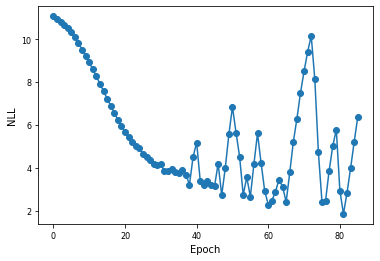

Epoch = 86, Nsteps = 17400, NLL on test data = 7.384828


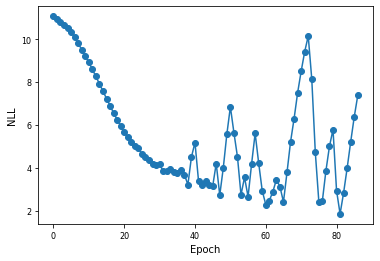

Epoch = 87, Nsteps = 17600, NLL on test data = 8.072458


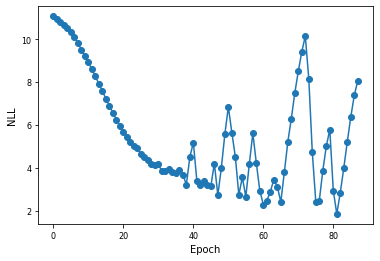

Epoch = 88, Nsteps = 17800, NLL on test data = 8.907504


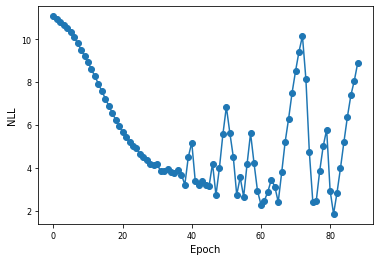

Epoch = 89, Nsteps = 18000, NLL on test data = 8.278069


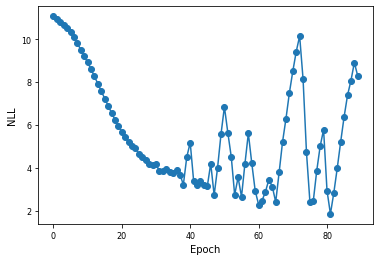

Epoch = 90, Nsteps = 18200, NLL on test data = 4.414302


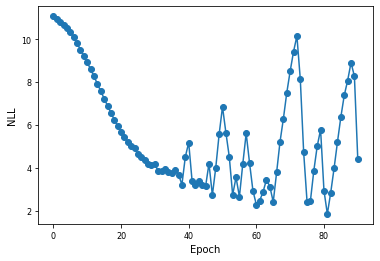

Epoch = 91, Nsteps = 18400, NLL on test data = 1.790280


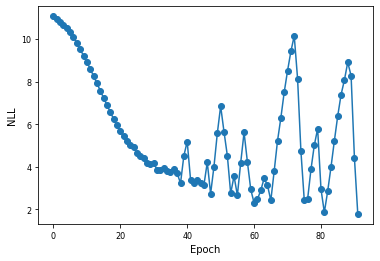

Epoch = 92, Nsteps = 18600, NLL on test data = 3.666211


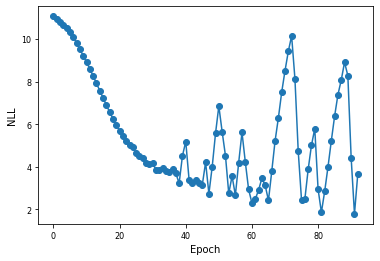

Epoch = 93, Nsteps = 18800, NLL on test data = 5.728579


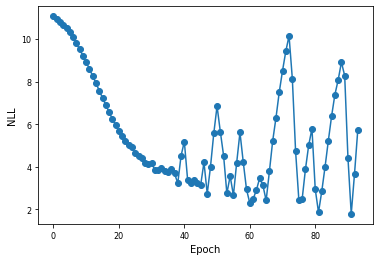

Epoch = 94, Nsteps = 19000, NLL on test data = 4.815375


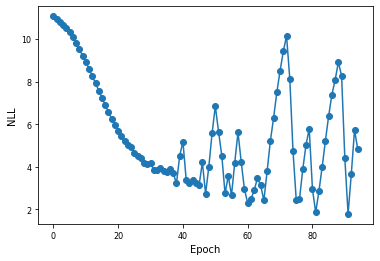

Epoch = 95, Nsteps = 19200, NLL on test data = 2.729332


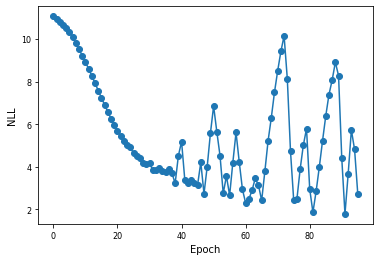

Epoch = 96, Nsteps = 19400, NLL on test data = 1.707140


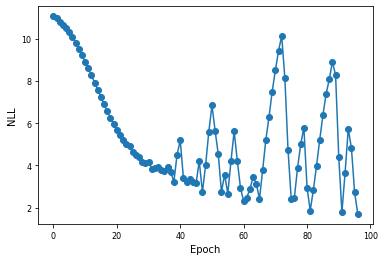

Epoch = 97, Nsteps = 19600, NLL on test data = 2.396839


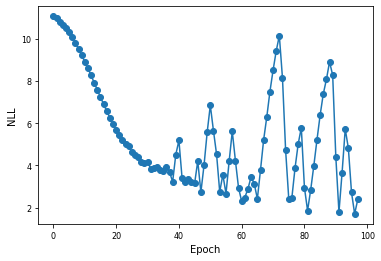

Epoch = 98, Nsteps = 19800, NLL on test data = 3.545013


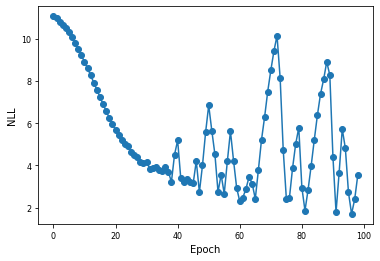

Epoch = 99, Nsteps = 20000, NLL on test data = 4.705562


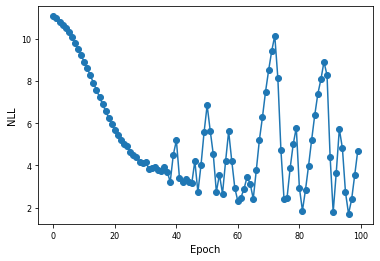

Epoch = 0, Nsteps = 200, NLL on test data = 11.059919


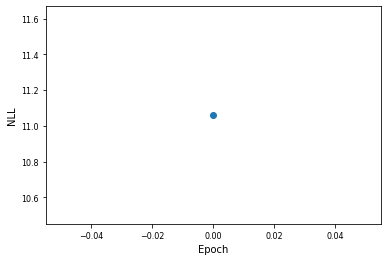

Epoch = 1, Nsteps = 400, NLL on test data = 10.950962


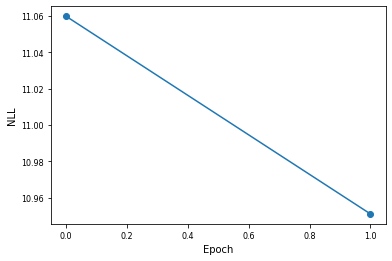

Epoch = 2, Nsteps = 600, NLL on test data = 10.765804


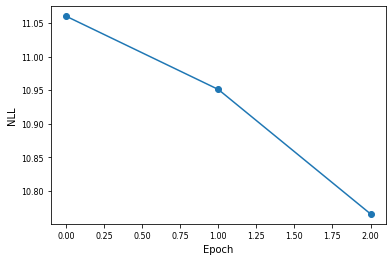

Epoch = 3, Nsteps = 800, NLL on test data = 10.526435


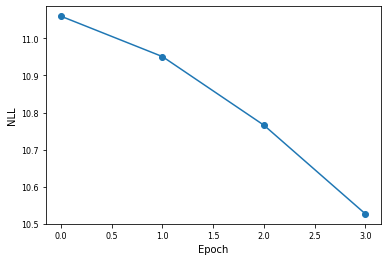

Epoch = 4, Nsteps = 1000, NLL on test data = 10.284479


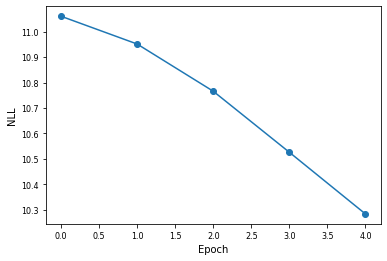

Epoch = 5, Nsteps = 1200, NLL on test data = 10.052724


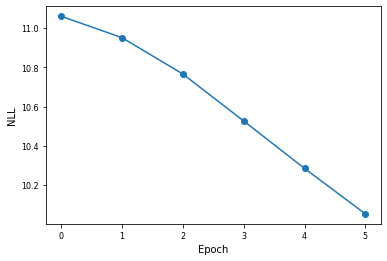

Epoch = 6, Nsteps = 1400, NLL on test data = 9.819794


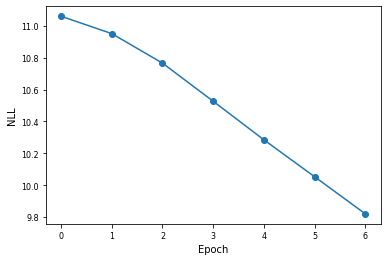

Epoch = 7, Nsteps = 1600, NLL on test data = 9.567225


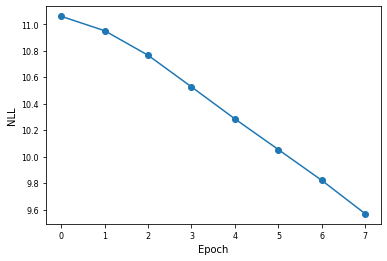

Epoch = 8, Nsteps = 1800, NLL on test data = 9.298967


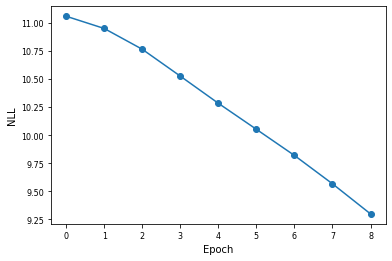

Epoch = 9, Nsteps = 2000, NLL on test data = 9.013704


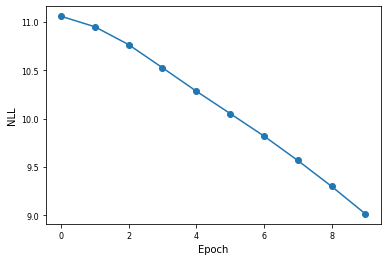

Epoch = 10, Nsteps = 2200, NLL on test data = 8.715639


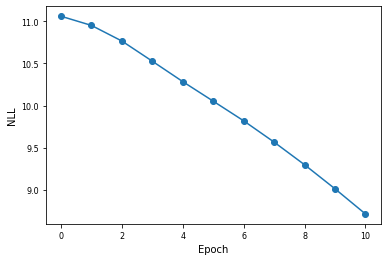

Epoch = 11, Nsteps = 2400, NLL on test data = 8.407178


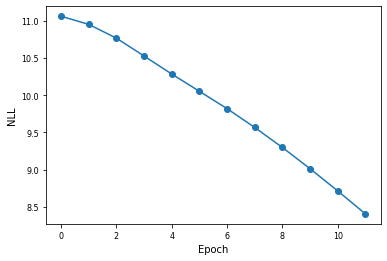

Epoch = 12, Nsteps = 2600, NLL on test data = 8.091719


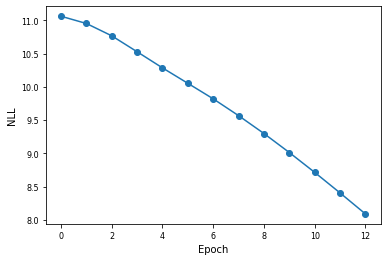

Epoch = 13, Nsteps = 2800, NLL on test data = 7.771461


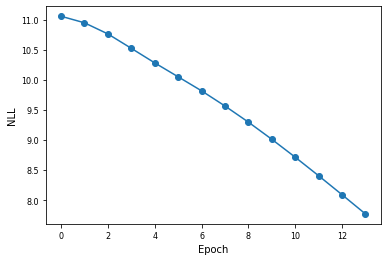

Epoch = 14, Nsteps = 3000, NLL on test data = 7.450644


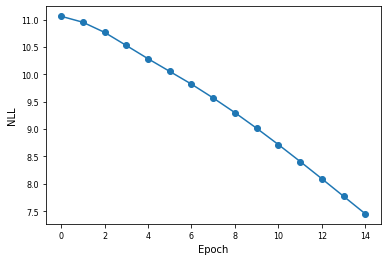

Epoch = 15, Nsteps = 3200, NLL on test data = 7.135046


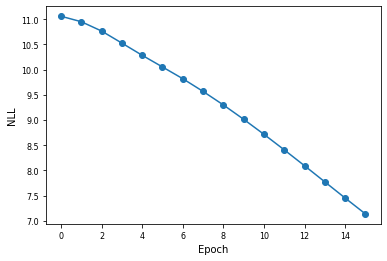

Epoch = 16, Nsteps = 3400, NLL on test data = 6.829544


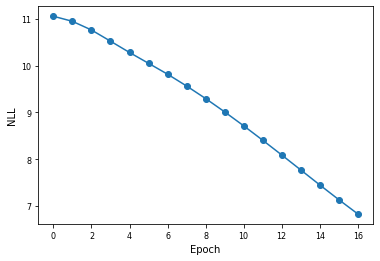

Epoch = 17, Nsteps = 3600, NLL on test data = 6.554664


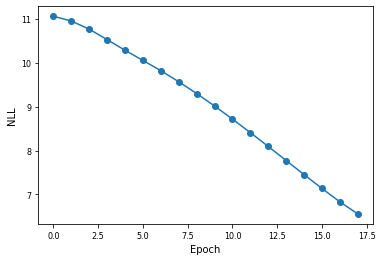

Epoch = 18, Nsteps = 3800, NLL on test data = 6.277667


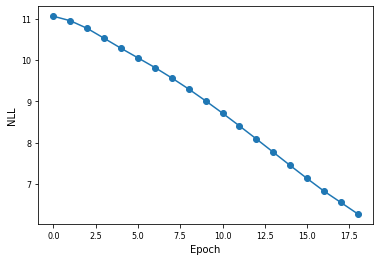

Epoch = 19, Nsteps = 4000, NLL on test data = 6.021480


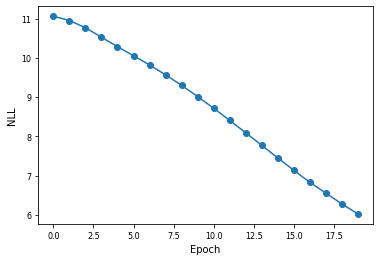

Epoch = 20, Nsteps = 4200, NLL on test data = 5.785339


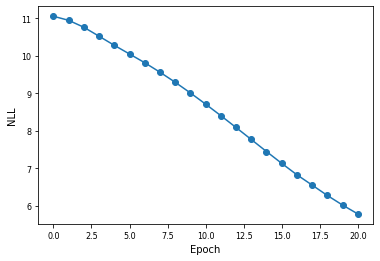

Epoch = 21, Nsteps = 4400, NLL on test data = 5.576656


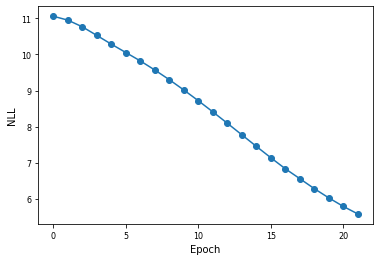

Epoch = 22, Nsteps = 4600, NLL on test data = 5.385081


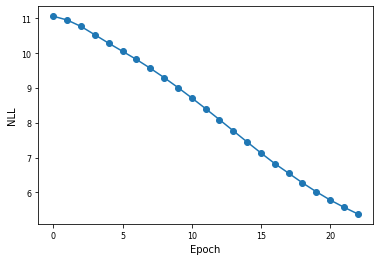

Epoch = 23, Nsteps = 4800, NLL on test data = 5.217383


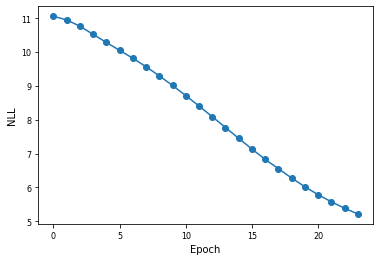

Epoch = 24, Nsteps = 5000, NLL on test data = 5.044524


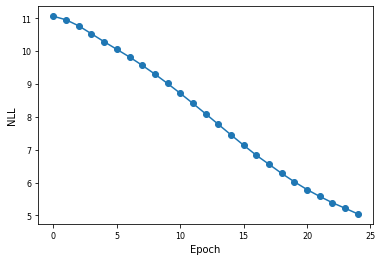

Epoch = 25, Nsteps = 5200, NLL on test data = 5.047566


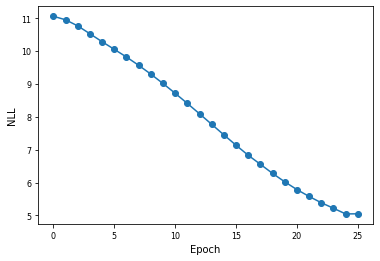

Epoch = 26, Nsteps = 5400, NLL on test data = 4.976137


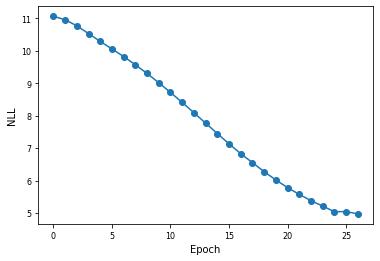

Epoch = 27, Nsteps = 5600, NLL on test data = 4.744079


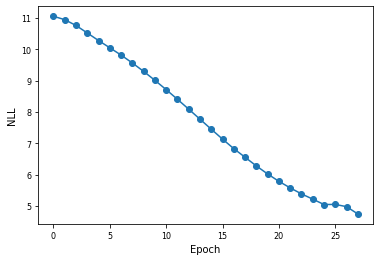

Epoch = 28, Nsteps = 5800, NLL on test data = 4.780970


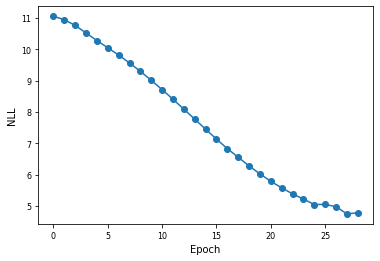

Epoch = 29, Nsteps = 6000, NLL on test data = 4.542538


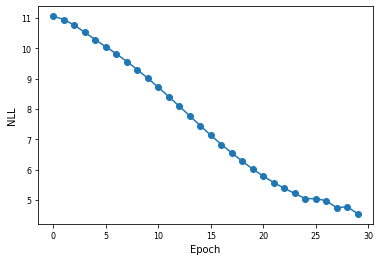

Epoch = 30, Nsteps = 6200, NLL on test data = 4.351249


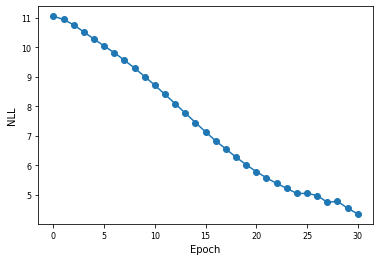

Epoch = 31, Nsteps = 6400, NLL on test data = 4.776003


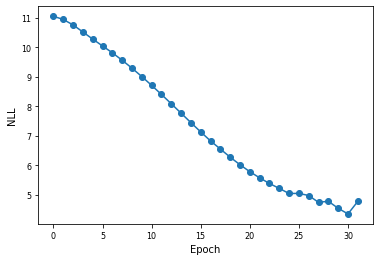

Epoch = 32, Nsteps = 6600, NLL on test data = 4.373922


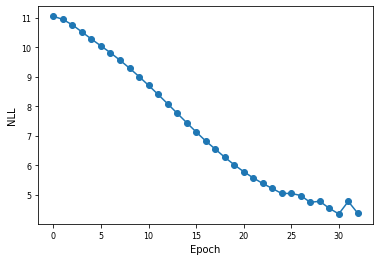

Epoch = 33, Nsteps = 6800, NLL on test data = 4.594947


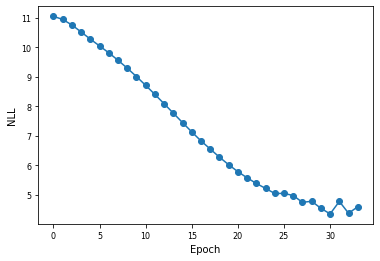

Epoch = 34, Nsteps = 7000, NLL on test data = 4.301646


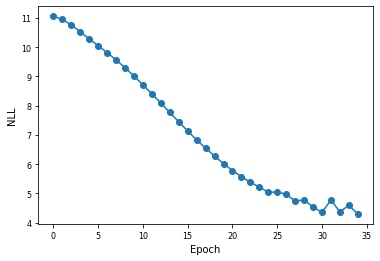

Epoch = 35, Nsteps = 7200, NLL on test data = 4.070964


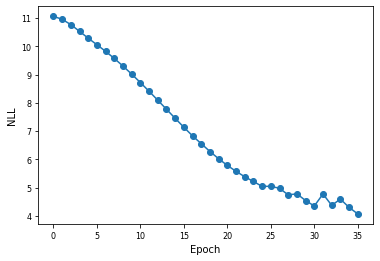

Epoch = 36, Nsteps = 7400, NLL on test data = 3.976205


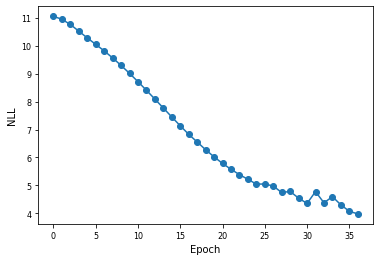

Epoch = 37, Nsteps = 7600, NLL on test data = 4.426482


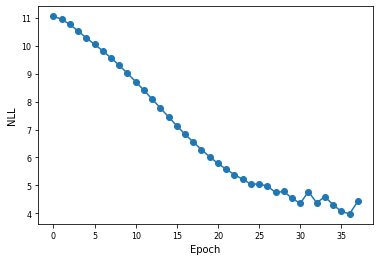

Epoch = 38, Nsteps = 7800, NLL on test data = 4.121219


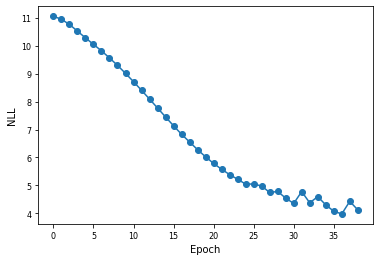

Epoch = 39, Nsteps = 8000, NLL on test data = 4.346078


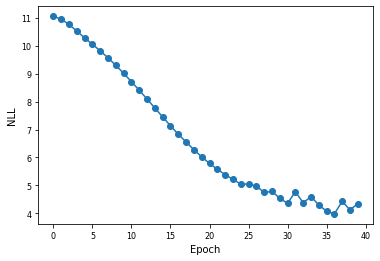

Epoch = 40, Nsteps = 8200, NLL on test data = 5.324969


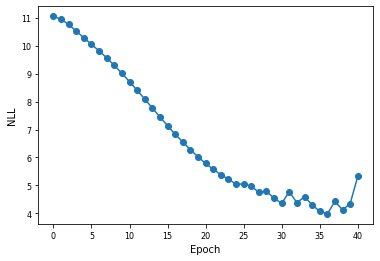

Epoch = 41, Nsteps = 8400, NLL on test data = 4.435471


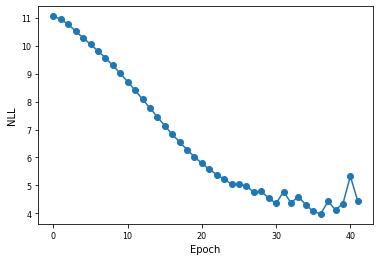

Epoch = 42, Nsteps = 8600, NLL on test data = 5.034198


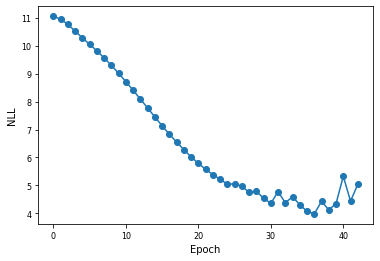

Epoch = 43, Nsteps = 8800, NLL on test data = 5.271657


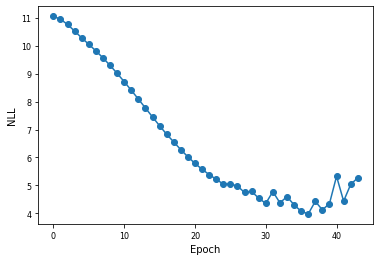

Epoch = 44, Nsteps = 9000, NLL on test data = 6.255187


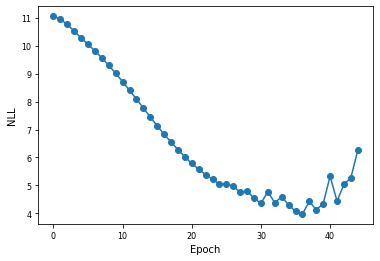

Epoch = 45, Nsteps = 9200, NLL on test data = 3.459639


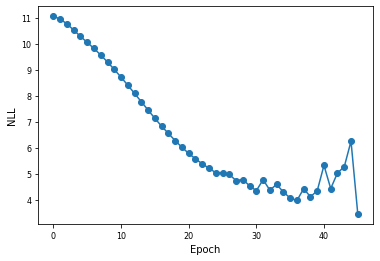

Epoch = 46, Nsteps = 9400, NLL on test data = 4.972745


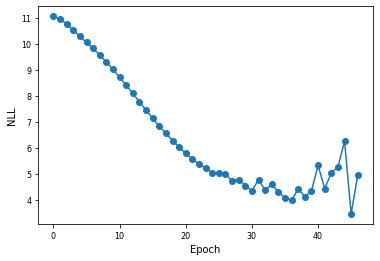

Epoch = 47, Nsteps = 9600, NLL on test data = 3.429836


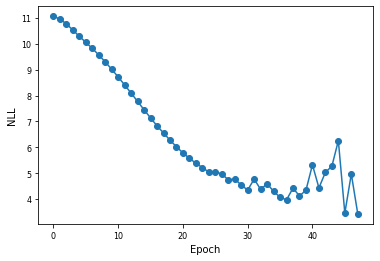

Epoch = 48, Nsteps = 9800, NLL on test data = 6.011691


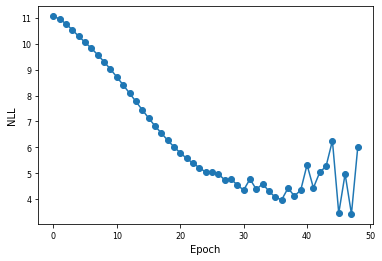

Epoch = 49, Nsteps = 10000, NLL on test data = 8.709769


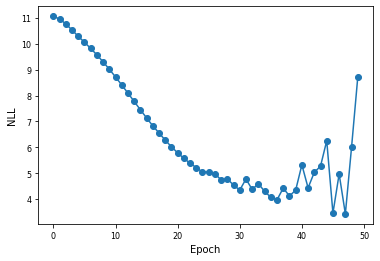

Epoch = 50, Nsteps = 10200, NLL on test data = 6.534054


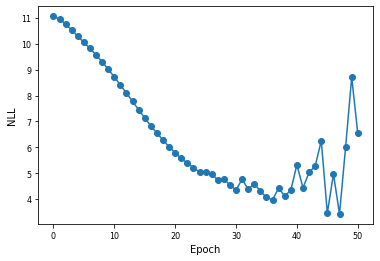

Epoch = 51, Nsteps = 10400, NLL on test data = 3.301711


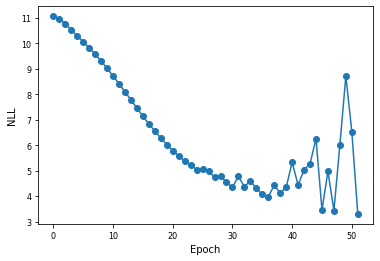

Epoch = 52, Nsteps = 10600, NLL on test data = 5.167073


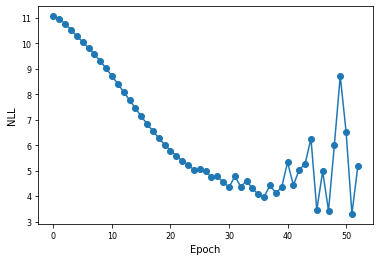

Epoch = 53, Nsteps = 10800, NLL on test data = 3.280454


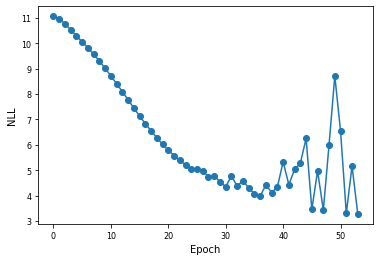

Epoch = 54, Nsteps = 11000, NLL on test data = 6.392961


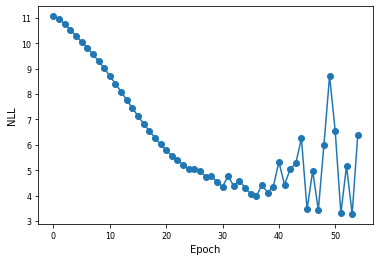

Epoch = 55, Nsteps = 11200, NLL on test data = 8.593226


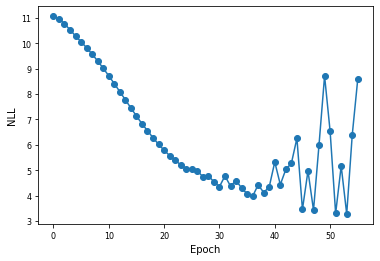

Epoch = 56, Nsteps = 11400, NLL on test data = 5.435903


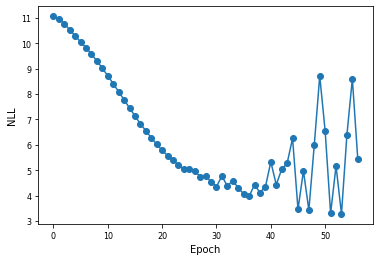

Epoch = 57, Nsteps = 11600, NLL on test data = 3.191516


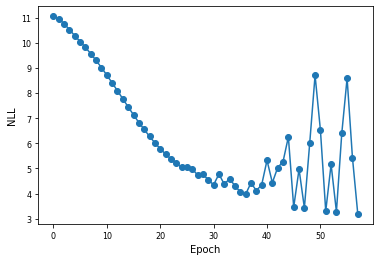

Epoch = 58, Nsteps = 11800, NLL on test data = 3.868831


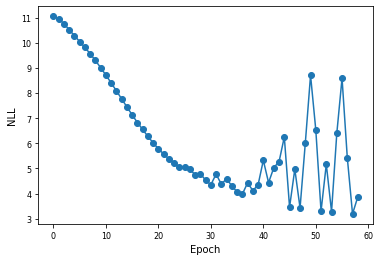

Epoch = 59, Nsteps = 12000, NLL on test data = 3.849173


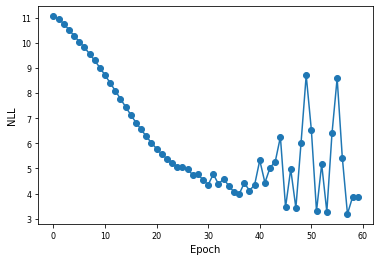

Epoch = 60, Nsteps = 12200, NLL on test data = 3.869265


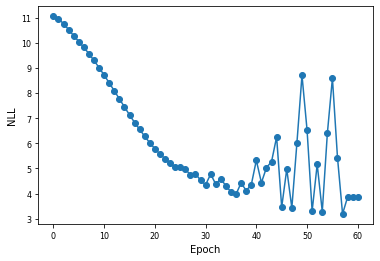

Epoch = 61, Nsteps = 12400, NLL on test data = 3.015985


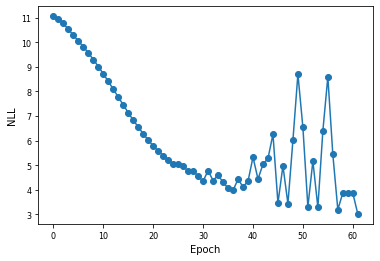

Epoch = 62, Nsteps = 12600, NLL on test data = 3.755576


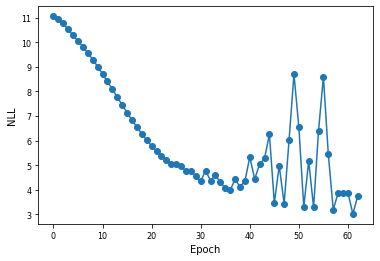

Epoch = 63, Nsteps = 12800, NLL on test data = 5.141930


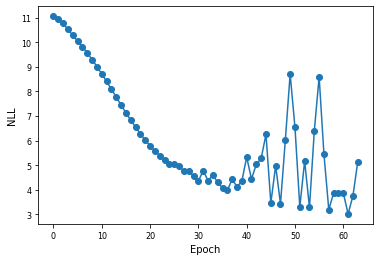

Epoch = 64, Nsteps = 13000, NLL on test data = 5.601346


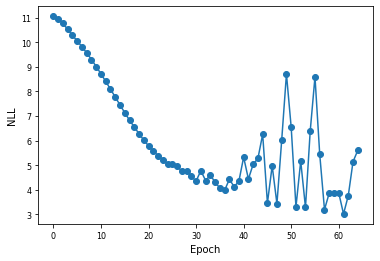

Epoch = 65, Nsteps = 13200, NLL on test data = 4.004157


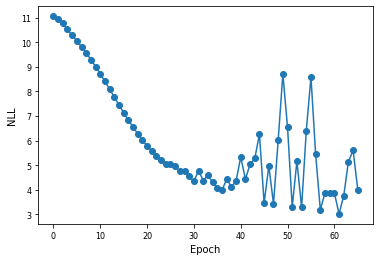

Epoch = 66, Nsteps = 13400, NLL on test data = 3.004280


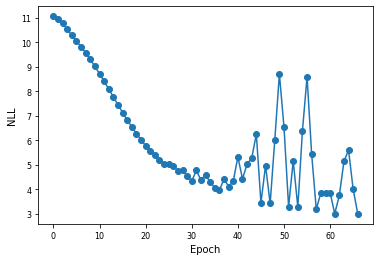

Epoch = 67, Nsteps = 13600, NLL on test data = 2.994217


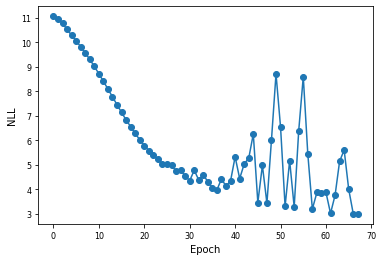

Epoch = 68, Nsteps = 13800, NLL on test data = 3.672999


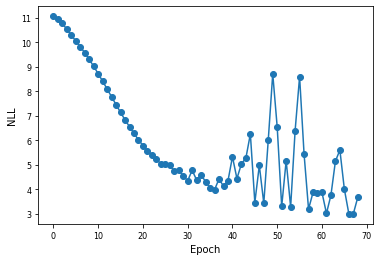

Epoch = 69, Nsteps = 14000, NLL on test data = 2.873321


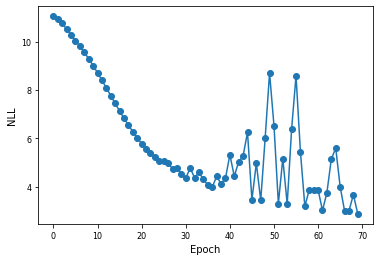

Epoch = 70, Nsteps = 14200, NLL on test data = 3.632129


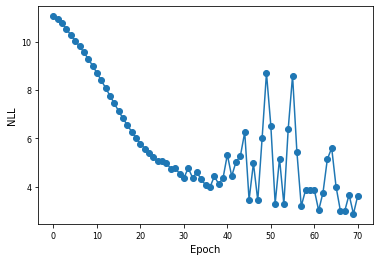

Epoch = 71, Nsteps = 14400, NLL on test data = 4.895626


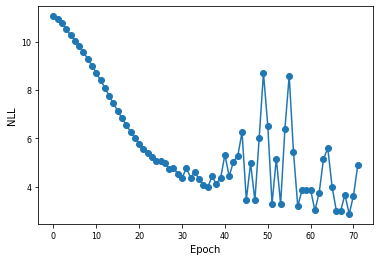

Epoch = 72, Nsteps = 14600, NLL on test data = 6.077740


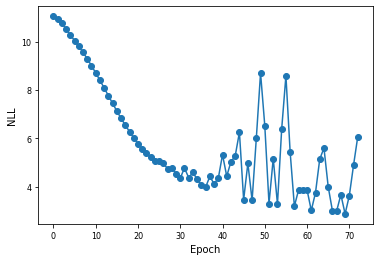

Epoch = 73, Nsteps = 14800, NLL on test data = 7.168427


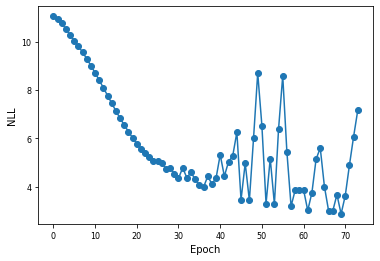

Epoch = 74, Nsteps = 15000, NLL on test data = 8.063717


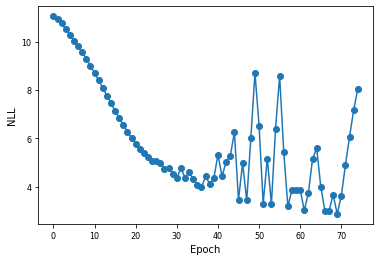

Epoch = 75, Nsteps = 15200, NLL on test data = 9.034741


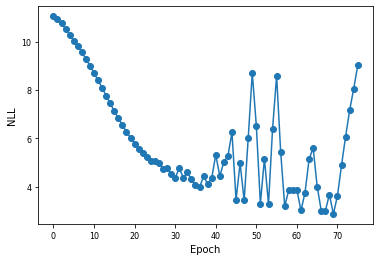

Epoch = 76, Nsteps = 15400, NLL on test data = 9.798023


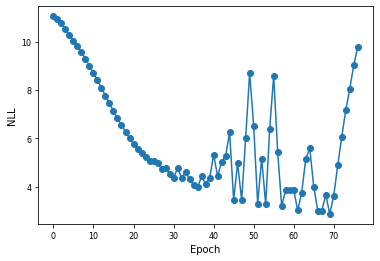

Epoch = 77, Nsteps = 15600, NLL on test data = 10.304081


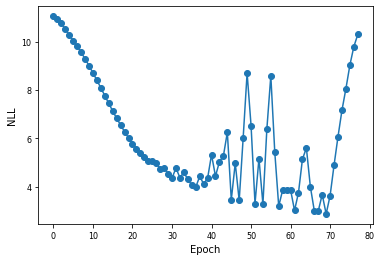

Epoch = 78, Nsteps = 15800, NLL on test data = 11.153241


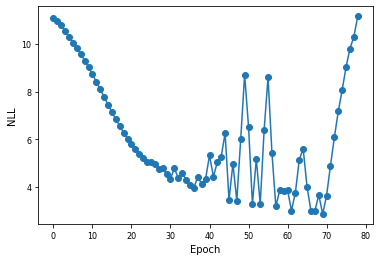

Epoch = 79, Nsteps = 16000, NLL on test data = 8.556333


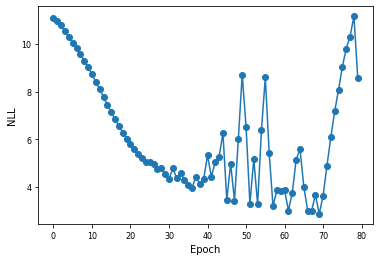

Epoch = 80, Nsteps = 16200, NLL on test data = 5.369391


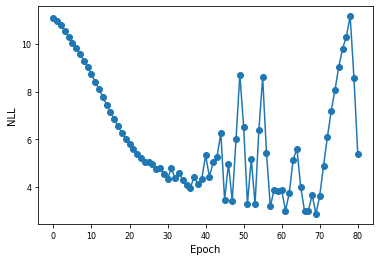

Epoch = 81, Nsteps = 16400, NLL on test data = 3.010447


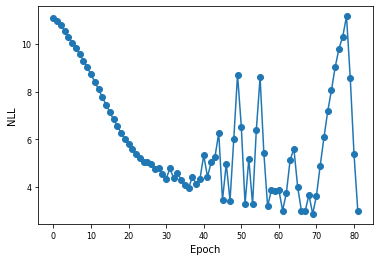

Epoch = 82, Nsteps = 16600, NLL on test data = 3.264186


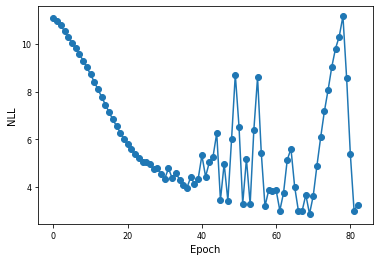

Epoch = 83, Nsteps = 16800, NLL on test data = 4.723524


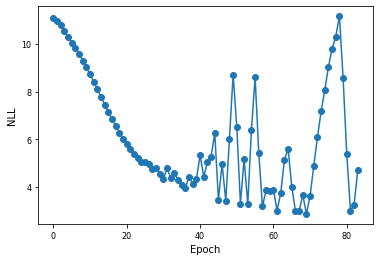

Epoch = 84, Nsteps = 17000, NLL on test data = 4.021029


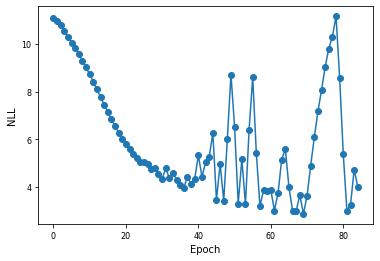

Epoch = 85, Nsteps = 17200, NLL on test data = 2.612597


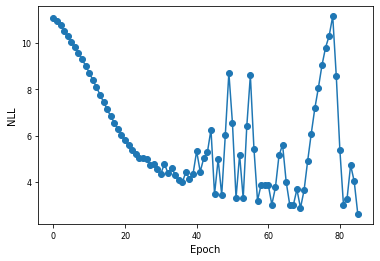

Epoch = 86, Nsteps = 17400, NLL on test data = 3.694306


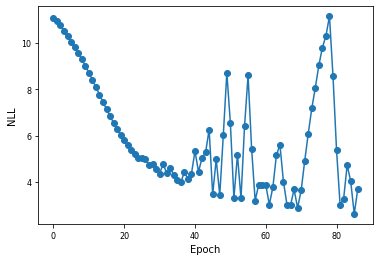

Epoch = 87, Nsteps = 17600, NLL on test data = 4.804088


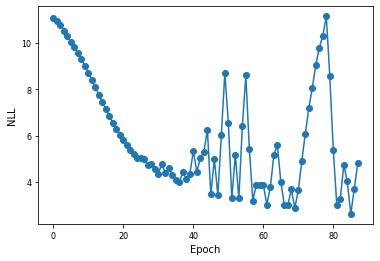

Epoch = 88, Nsteps = 17800, NLL on test data = 5.840776


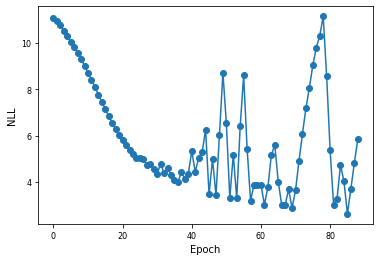

Epoch = 89, Nsteps = 18000, NLL on test data = 6.789854


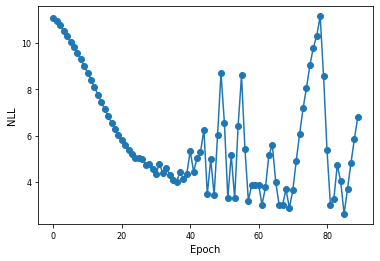

Epoch = 90, Nsteps = 18200, NLL on test data = 7.556196


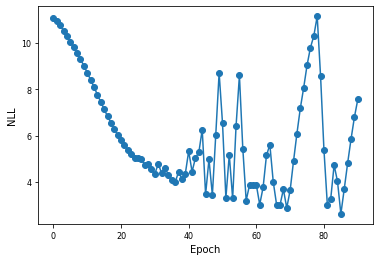

Epoch = 91, Nsteps = 18400, NLL on test data = 8.264371


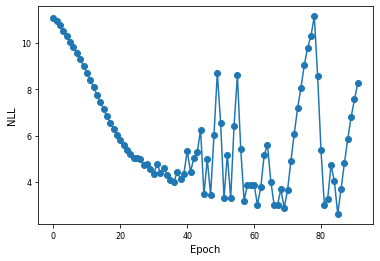

Epoch = 92, Nsteps = 18600, NLL on test data = 9.117811


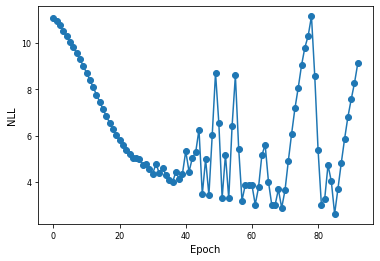

Epoch = 93, Nsteps = 18800, NLL on test data = 9.670979


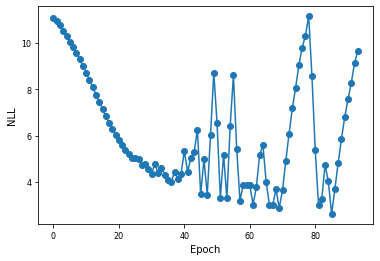

Epoch = 94, Nsteps = 19000, NLL on test data = 10.241609


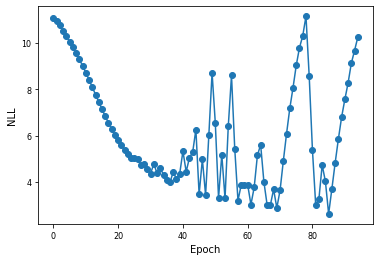

Epoch = 95, Nsteps = 19200, NLL on test data = 10.694321


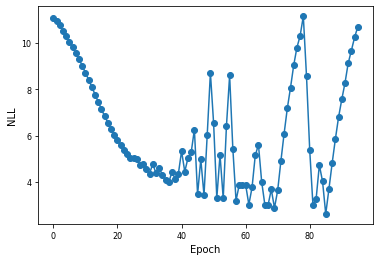

Epoch = 96, Nsteps = 19400, NLL on test data = 11.005485


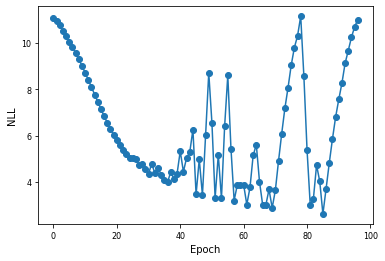

Epoch = 97, Nsteps = 19600, NLL on test data = 11.640892


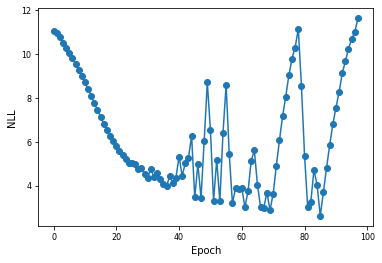

Epoch = 98, Nsteps = 19800, NLL on test data = 8.514347


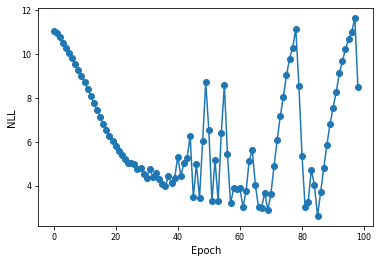

Epoch = 99, Nsteps = 20000, NLL on test data = 4.561253


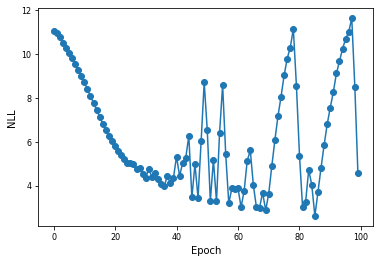

Epoch = 0, Nsteps = 200, NLL on test data = 11.075399


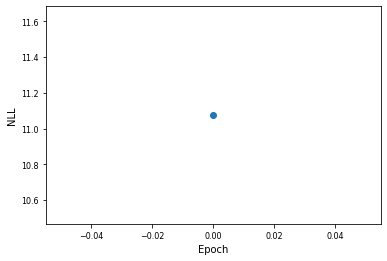

Epoch = 1, Nsteps = 400, NLL on test data = 11.018234


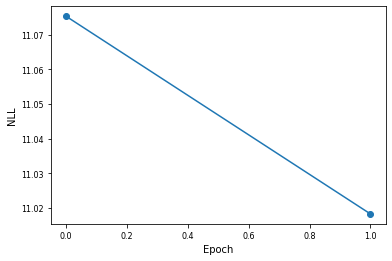

Epoch = 2, Nsteps = 600, NLL on test data = 10.880054


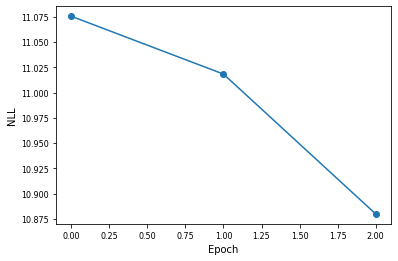

Epoch = 3, Nsteps = 800, NLL on test data = 10.679249


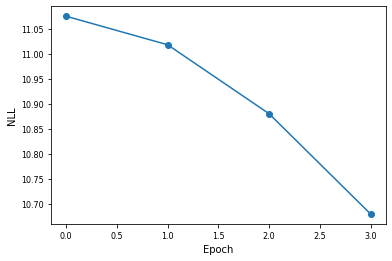

Epoch = 4, Nsteps = 1000, NLL on test data = 10.454071


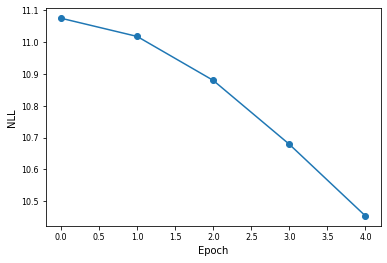

Epoch = 5, Nsteps = 1200, NLL on test data = 10.219770


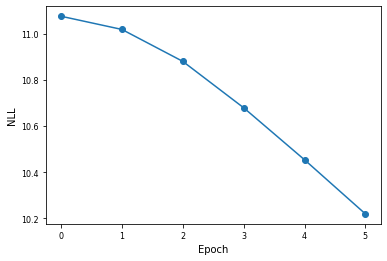

Epoch = 6, Nsteps = 1400, NLL on test data = 9.985310


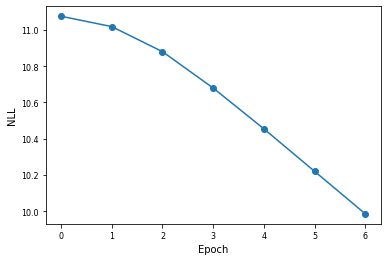

Epoch = 7, Nsteps = 1600, NLL on test data = 9.742416


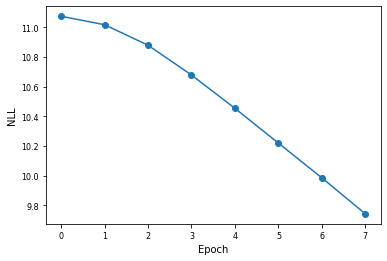

Epoch = 8, Nsteps = 1800, NLL on test data = 9.494027


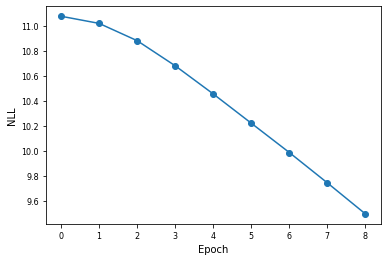

Epoch = 9, Nsteps = 2000, NLL on test data = 9.220793


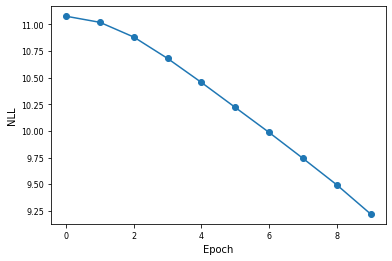

Epoch = 10, Nsteps = 2200, NLL on test data = 8.937761


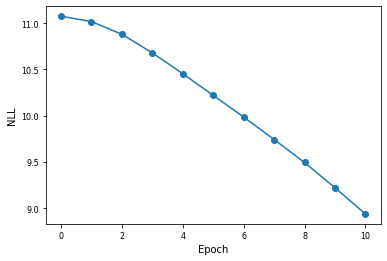

Epoch = 11, Nsteps = 2400, NLL on test data = 8.654966


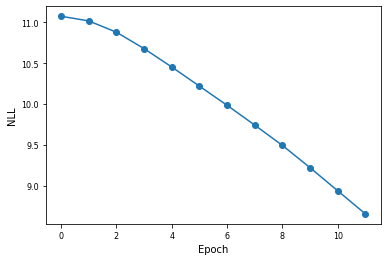

Epoch = 12, Nsteps = 2600, NLL on test data = 8.353561


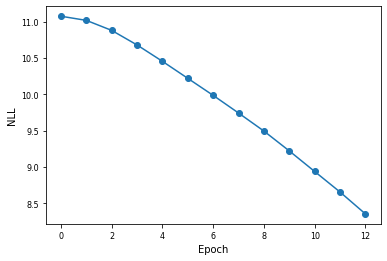

Epoch = 13, Nsteps = 2800, NLL on test data = 8.055928


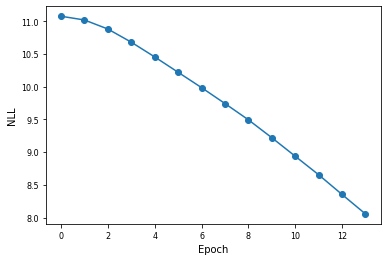

Epoch = 14, Nsteps = 3000, NLL on test data = 7.756702


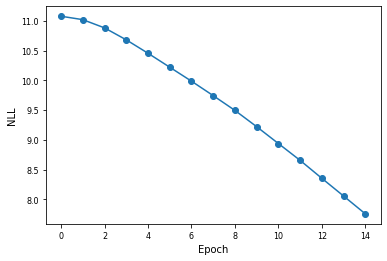

Epoch = 15, Nsteps = 3200, NLL on test data = 7.458962


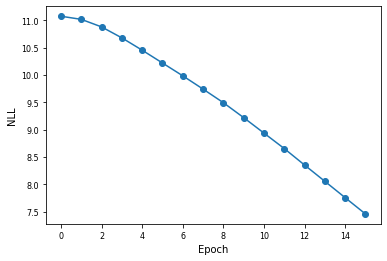

Epoch = 16, Nsteps = 3400, NLL on test data = 7.193657


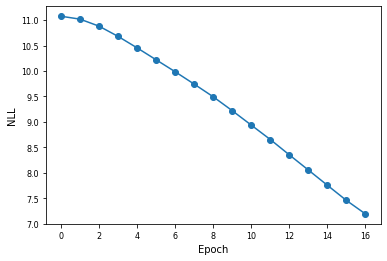

Epoch = 17, Nsteps = 3600, NLL on test data = 6.930147


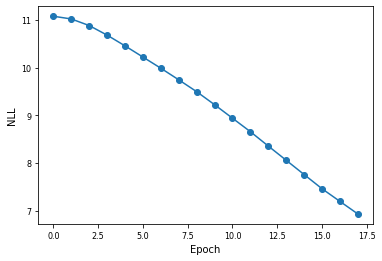

Epoch = 18, Nsteps = 3800, NLL on test data = 6.742222


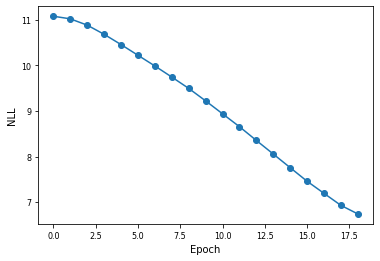

Epoch = 19, Nsteps = 4000, NLL on test data = 6.499150


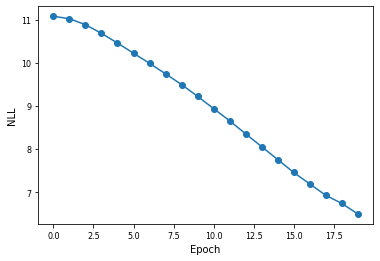

Epoch = 20, Nsteps = 4200, NLL on test data = 6.326021


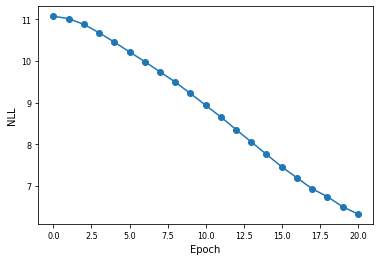

Epoch = 21, Nsteps = 4400, NLL on test data = 6.177473


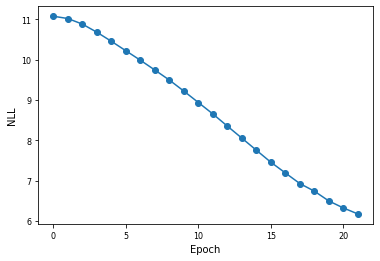

Epoch = 22, Nsteps = 4600, NLL on test data = 6.025846


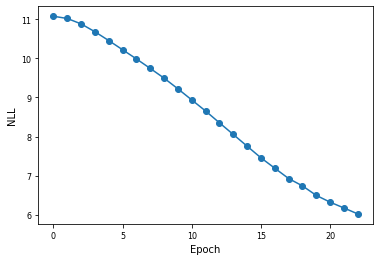

Epoch = 23, Nsteps = 4800, NLL on test data = 5.870674


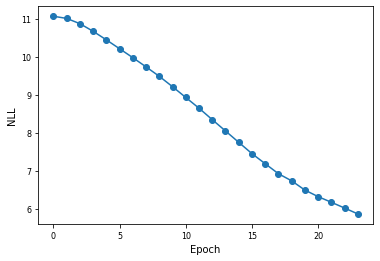

Epoch = 24, Nsteps = 5000, NLL on test data = 5.764849


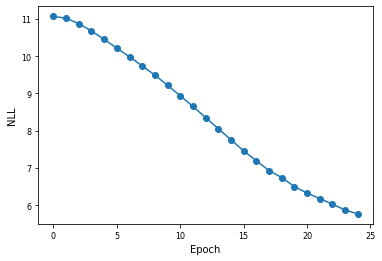

Epoch = 25, Nsteps = 5200, NLL on test data = 5.640333


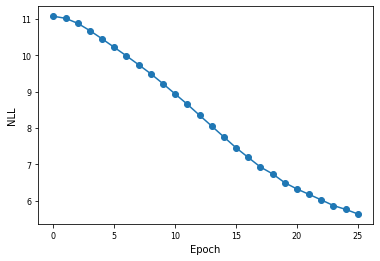

Epoch = 26, Nsteps = 5400, NLL on test data = 5.674048


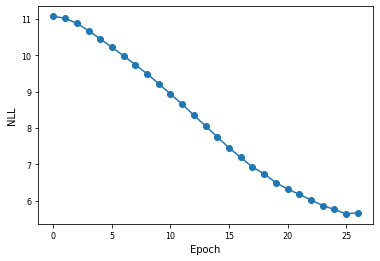

Epoch = 27, Nsteps = 5600, NLL on test data = 6.112188


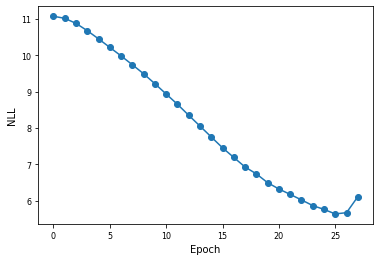

Epoch = 28, Nsteps = 5800, NLL on test data = 5.307533


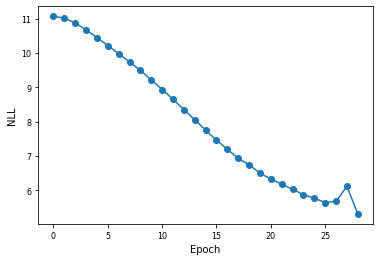

Epoch = 29, Nsteps = 6000, NLL on test data = 5.285467


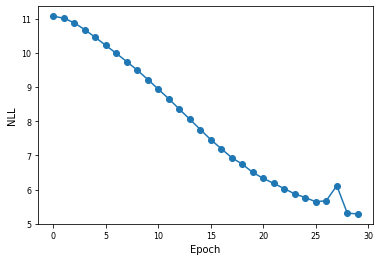

Epoch = 30, Nsteps = 6200, NLL on test data = 5.156948


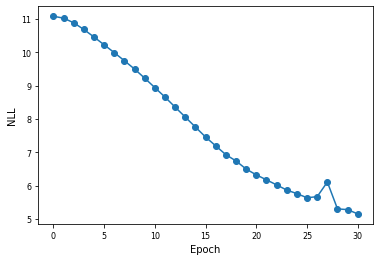

Epoch = 31, Nsteps = 6400, NLL on test data = 5.092173


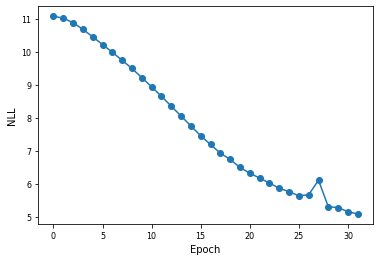

Epoch = 32, Nsteps = 6600, NLL on test data = 5.075808


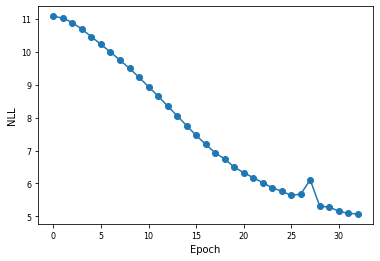

Epoch = 33, Nsteps = 6800, NLL on test data = 5.012195


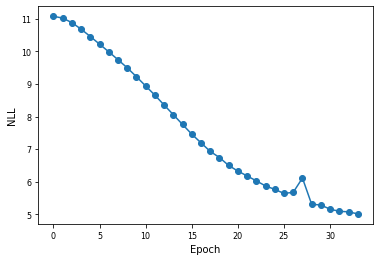

Epoch = 34, Nsteps = 7000, NLL on test data = 4.906555


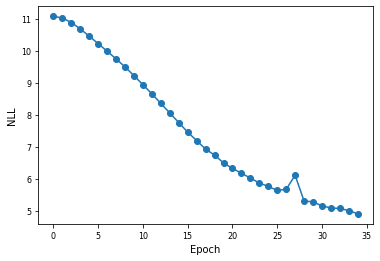

Epoch = 35, Nsteps = 7200, NLL on test data = 4.820645


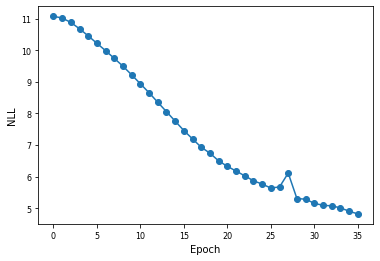

Epoch = 36, Nsteps = 7400, NLL on test data = 5.536300


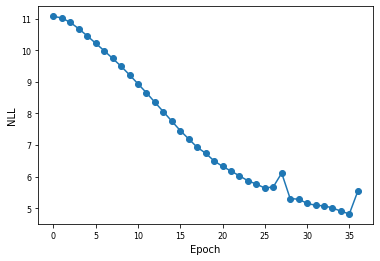

Epoch = 37, Nsteps = 7600, NLL on test data = 4.807985


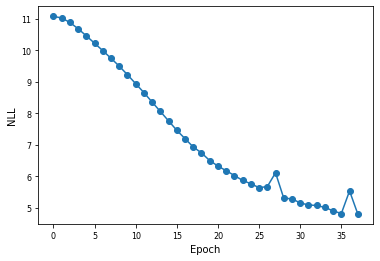

Epoch = 38, Nsteps = 7800, NLL on test data = 4.853469


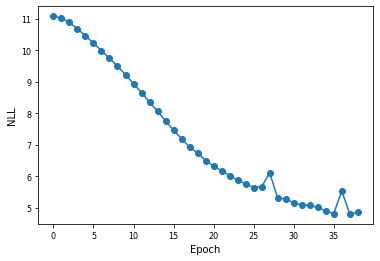

Epoch = 39, Nsteps = 8000, NLL on test data = 4.615383


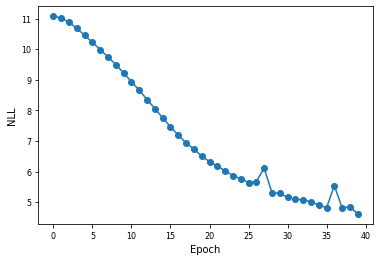

Epoch = 40, Nsteps = 8200, NLL on test data = 4.587976


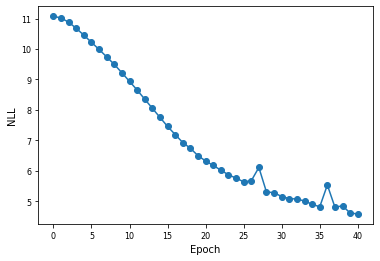

Epoch = 41, Nsteps = 8400, NLL on test data = 4.625367


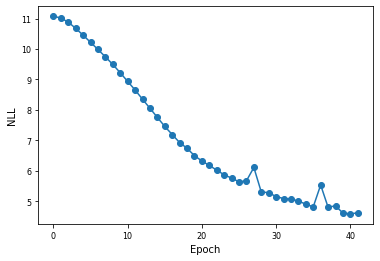

Epoch = 42, Nsteps = 8600, NLL on test data = 4.866162


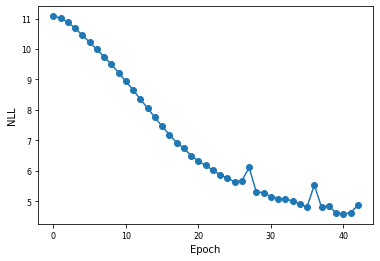

Epoch = 43, Nsteps = 8800, NLL on test data = 4.452616


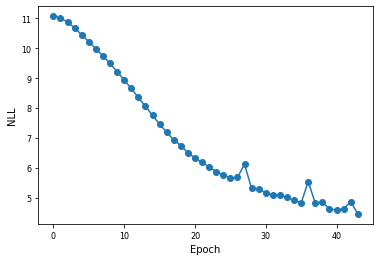

Epoch = 44, Nsteps = 9000, NLL on test data = 4.692430


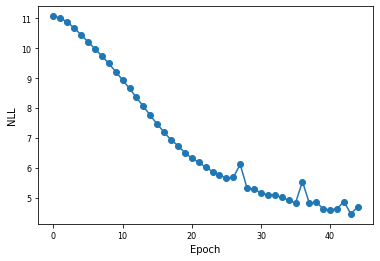

Epoch = 45, Nsteps = 9200, NLL on test data = 4.450375


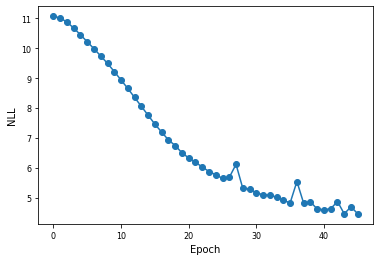

Epoch = 46, Nsteps = 9400, NLL on test data = 4.869195


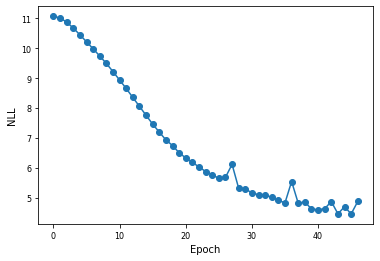

Epoch = 47, Nsteps = 9600, NLL on test data = 5.253829


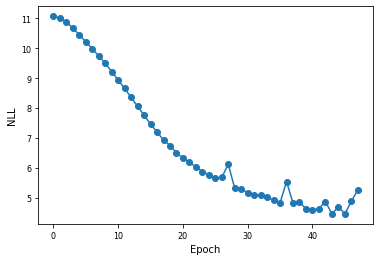

Epoch = 48, Nsteps = 9800, NLL on test data = 4.566874


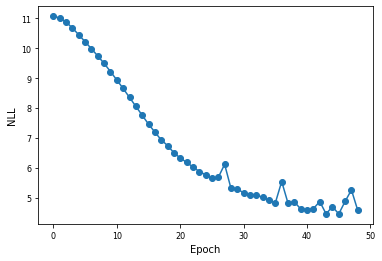

Epoch = 49, Nsteps = 10000, NLL on test data = 5.517182


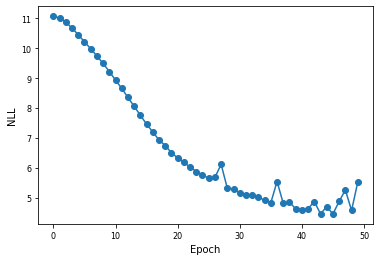

Epoch = 50, Nsteps = 10200, NLL on test data = 4.994403


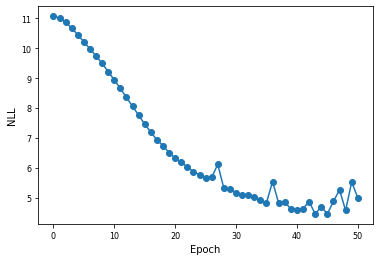

Epoch = 51, Nsteps = 10400, NLL on test data = 4.244771


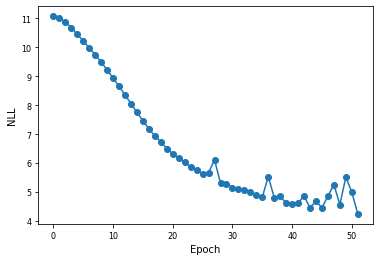

Epoch = 52, Nsteps = 10600, NLL on test data = 4.913880


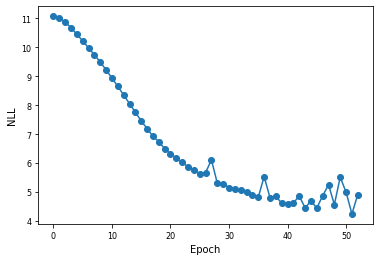

Epoch = 53, Nsteps = 10800, NLL on test data = 4.813480


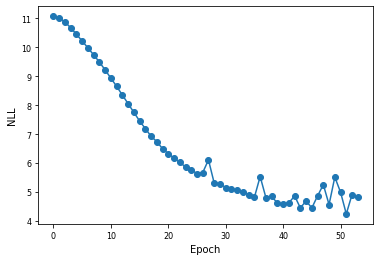

Epoch = 54, Nsteps = 11000, NLL on test data = 4.605028


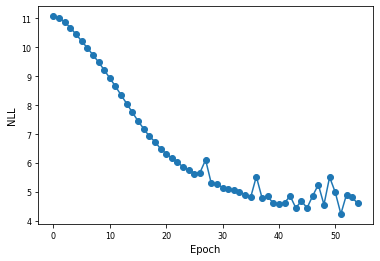

Epoch = 55, Nsteps = 11200, NLL on test data = 5.184172


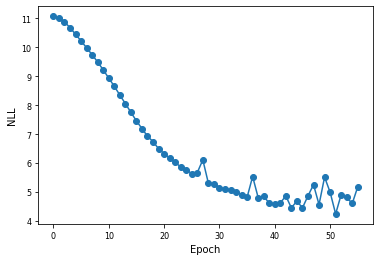

Epoch = 56, Nsteps = 11400, NLL on test data = 4.797590


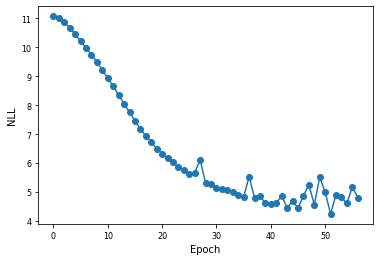

Epoch = 57, Nsteps = 11600, NLL on test data = 4.285893


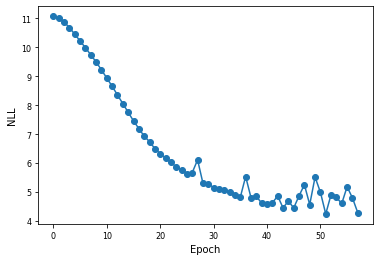

Epoch = 58, Nsteps = 11800, NLL on test data = 5.511235


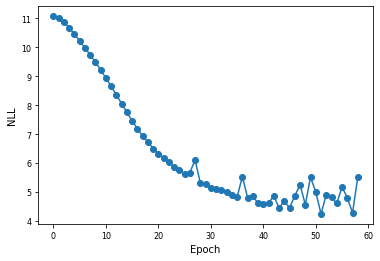

Epoch = 59, Nsteps = 12000, NLL on test data = 4.513966


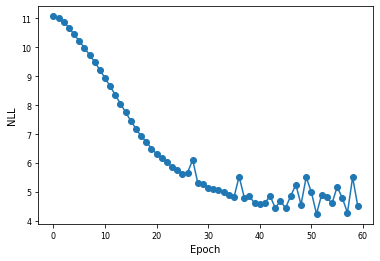

Epoch = 60, Nsteps = 12200, NLL on test data = 3.997601


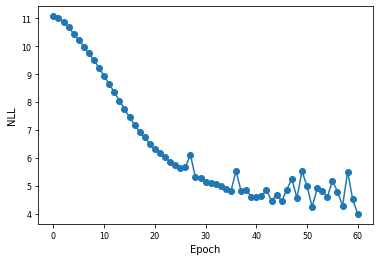

Epoch = 61, Nsteps = 12400, NLL on test data = 4.380087


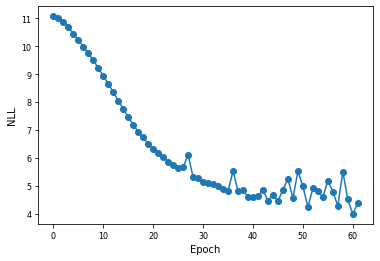

Epoch = 62, Nsteps = 12600, NLL on test data = 5.224233


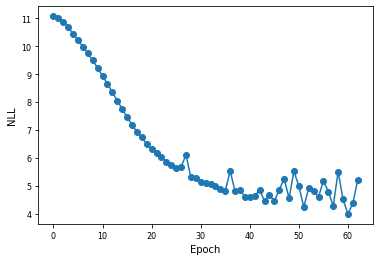

Epoch = 63, Nsteps = 12800, NLL on test data = 6.079200


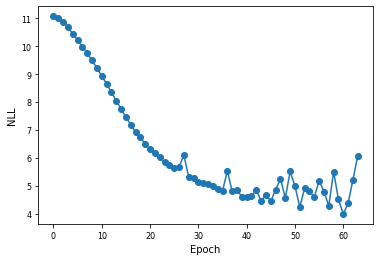

Epoch = 64, Nsteps = 13000, NLL on test data = 4.879933


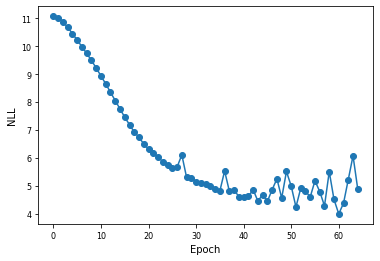

Epoch = 65, Nsteps = 13200, NLL on test data = 5.659694


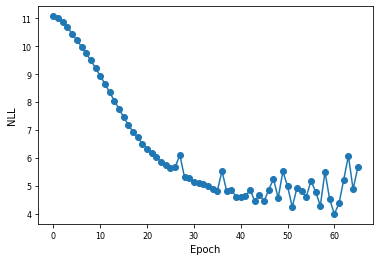

Epoch = 66, Nsteps = 13400, NLL on test data = 4.292317


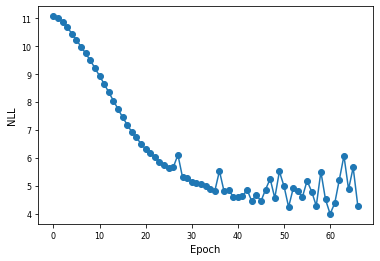

Epoch = 67, Nsteps = 13600, NLL on test data = 6.041496


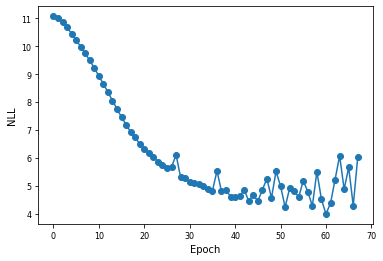

Epoch = 68, Nsteps = 13800, NLL on test data = 5.421564


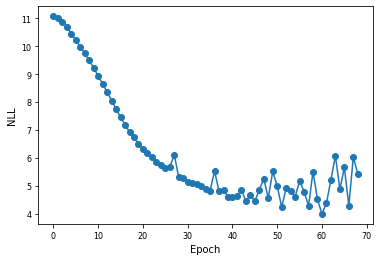

Epoch = 69, Nsteps = 14000, NLL on test data = 3.998794


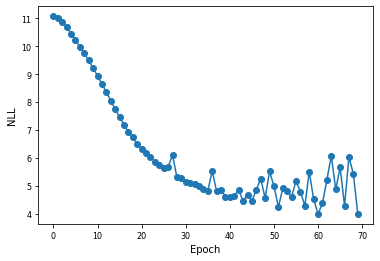

Epoch = 70, Nsteps = 14200, NLL on test data = 4.959417


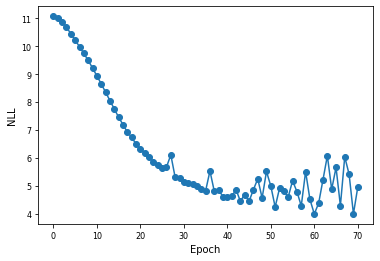

Epoch = 71, Nsteps = 14400, NLL on test data = 5.437151


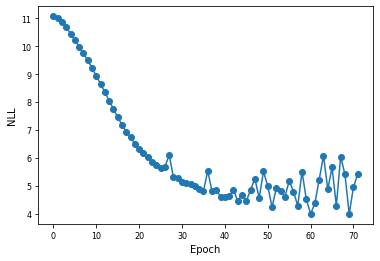

Epoch = 72, Nsteps = 14600, NLL on test data = 3.849551


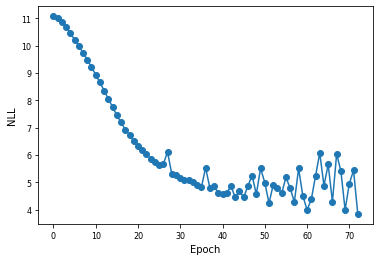

Epoch = 73, Nsteps = 14800, NLL on test data = 6.119441


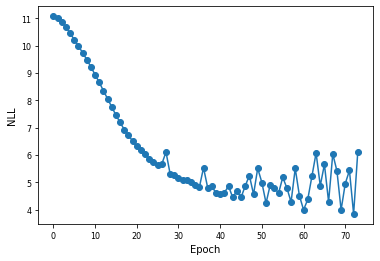

Epoch = 74, Nsteps = 15000, NLL on test data = 5.663414


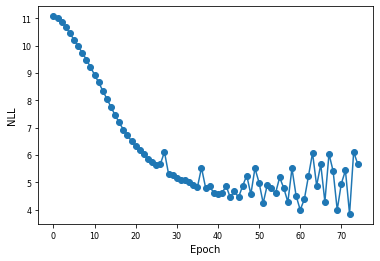

Epoch = 75, Nsteps = 15200, NLL on test data = 3.836240


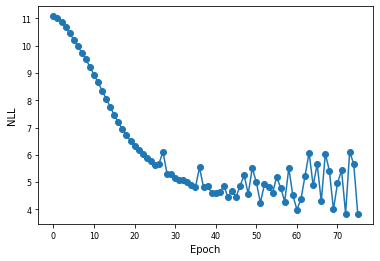

Epoch = 76, Nsteps = 15400, NLL on test data = 4.442266


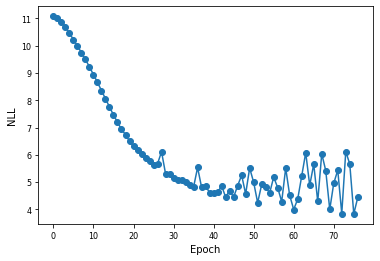

Epoch = 77, Nsteps = 15600, NLL on test data = 3.845127


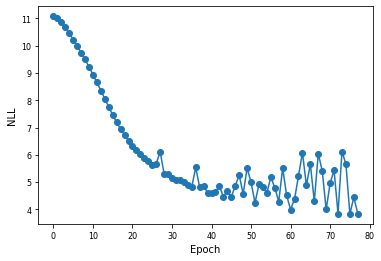

Epoch = 78, Nsteps = 15800, NLL on test data = 3.993145


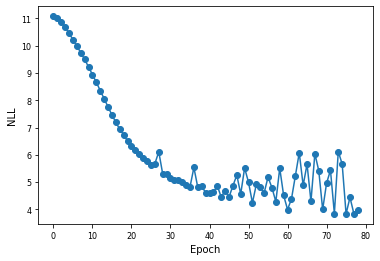

Epoch = 79, Nsteps = 16000, NLL on test data = 4.563656


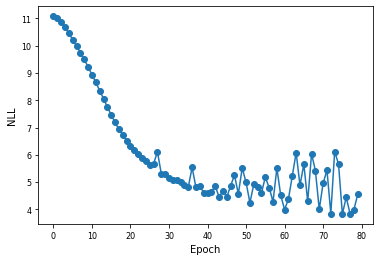

Epoch = 80, Nsteps = 16200, NLL on test data = 5.220220


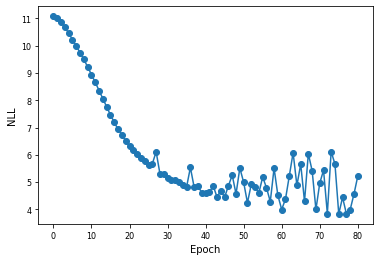

Epoch = 81, Nsteps = 16400, NLL on test data = 5.364086


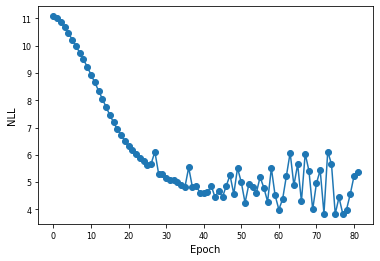

Epoch = 82, Nsteps = 16600, NLL on test data = 4.054703


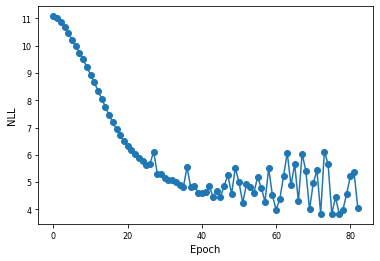

Epoch = 83, Nsteps = 16800, NLL on test data = 3.885116


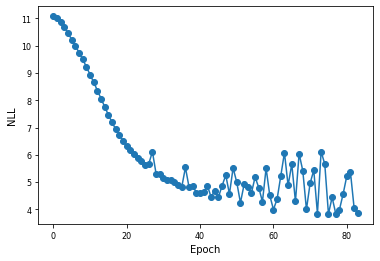

Epoch = 84, Nsteps = 17000, NLL on test data = 3.804037


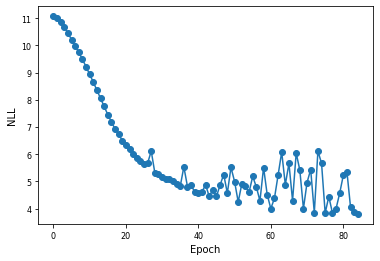

Epoch = 85, Nsteps = 17200, NLL on test data = 4.354056


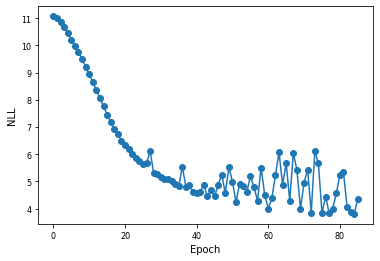

Epoch = 86, Nsteps = 17400, NLL on test data = 3.884869


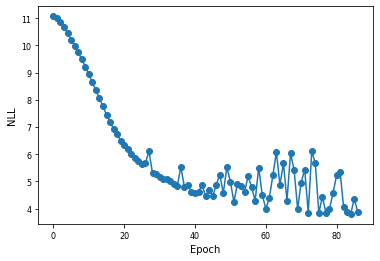

Epoch = 87, Nsteps = 17600, NLL on test data = 5.257276


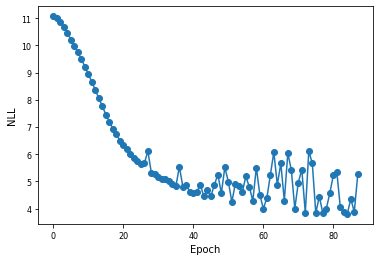

Epoch = 88, Nsteps = 17800, NLL on test data = 4.023109


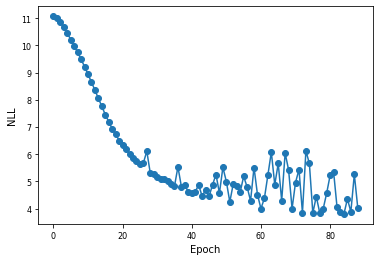

Epoch = 89, Nsteps = 18000, NLL on test data = 5.146272


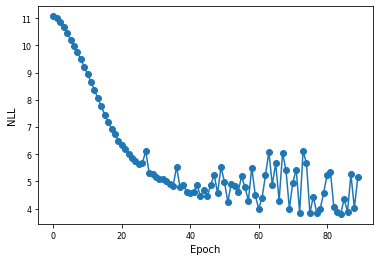

Epoch = 90, Nsteps = 18200, NLL on test data = 7.628510


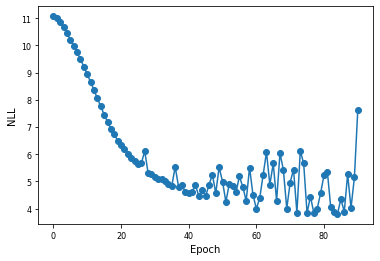

Epoch = 91, Nsteps = 18400, NLL on test data = 6.023718


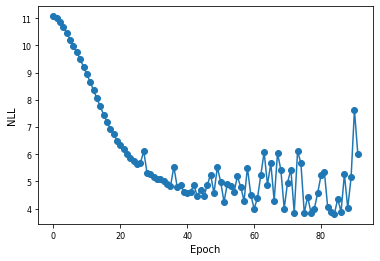

Epoch = 92, Nsteps = 18600, NLL on test data = 4.043657


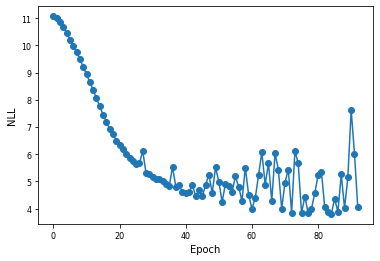

Epoch = 93, Nsteps = 18800, NLL on test data = 5.352292


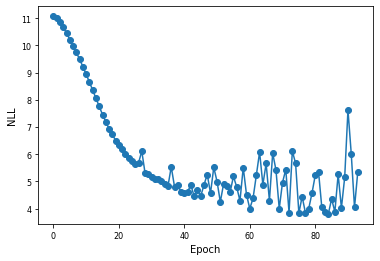

Epoch = 94, Nsteps = 19000, NLL on test data = 7.361467


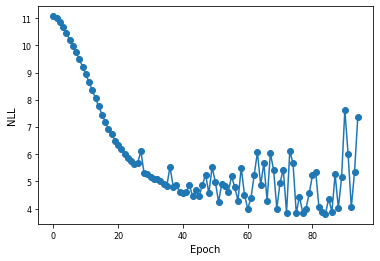

Epoch = 95, Nsteps = 19200, NLL on test data = 3.687093


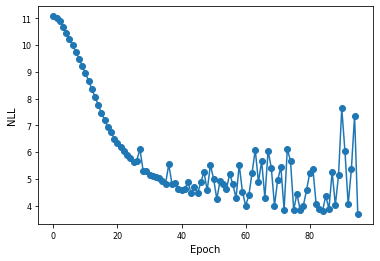

Epoch = 96, Nsteps = 19400, NLL on test data = 6.860171


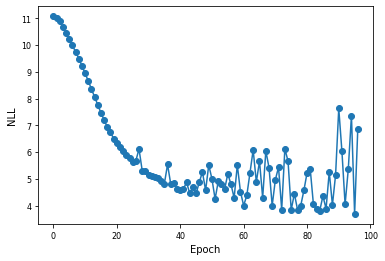

Epoch = 97, Nsteps = 19600, NLL on test data = 7.416884


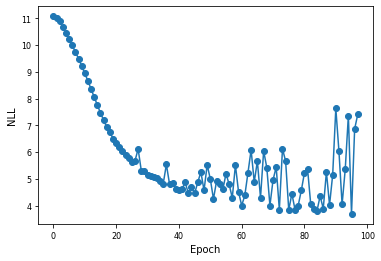

Epoch = 98, Nsteps = 19800, NLL on test data = 4.343127


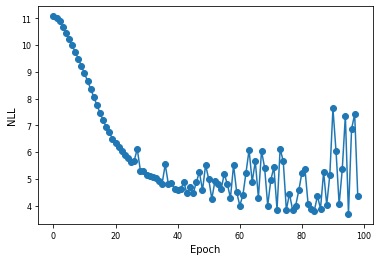

Epoch = 99, Nsteps = 20000, NLL on test data = 4.459229


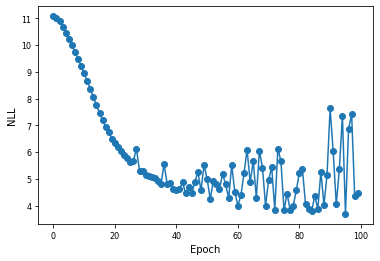

Epoch = 0, Nsteps = 200, NLL on test data = 11.092520


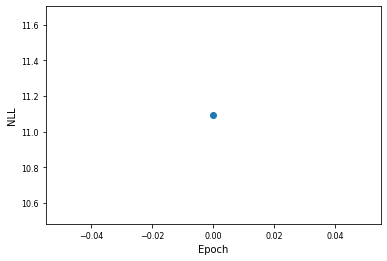

Epoch = 1, Nsteps = 400, NLL on test data = 11.060014


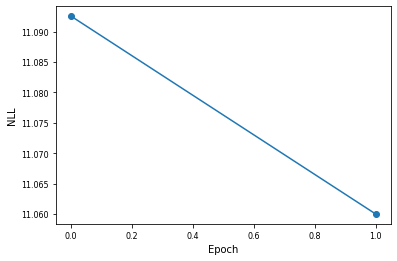

Epoch = 2, Nsteps = 600, NLL on test data = 10.956887


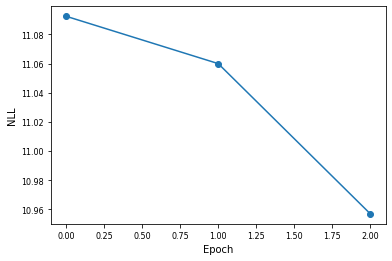

Epoch = 3, Nsteps = 800, NLL on test data = 10.826178


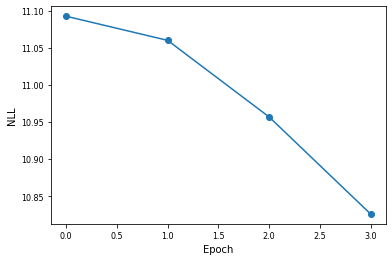

Epoch = 4, Nsteps = 1000, NLL on test data = 10.653934


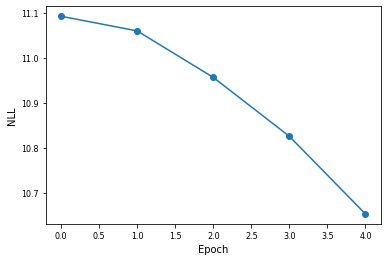

Epoch = 5, Nsteps = 1200, NLL on test data = 10.494146


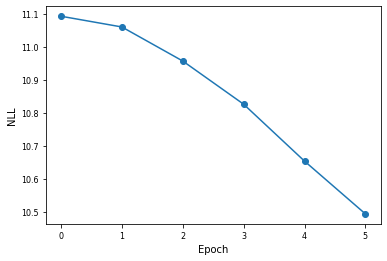

Epoch = 6, Nsteps = 1400, NLL on test data = 10.342392


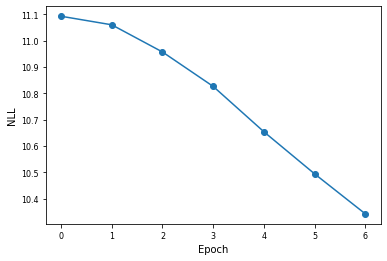

Epoch = 7, Nsteps = 1600, NLL on test data = 10.189956


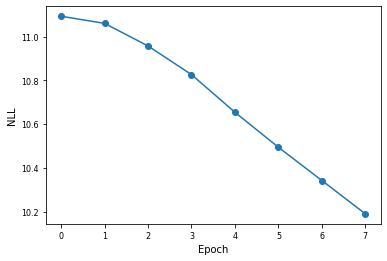

Epoch = 8, Nsteps = 1800, NLL on test data = 10.024138


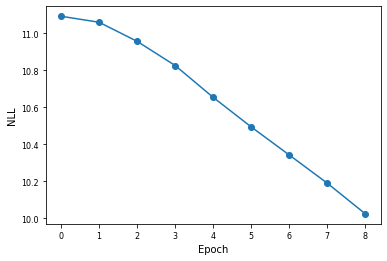

Epoch = 9, Nsteps = 2000, NLL on test data = 9.846237


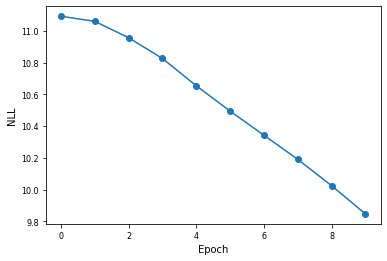

Epoch = 10, Nsteps = 2200, NLL on test data = 9.654871


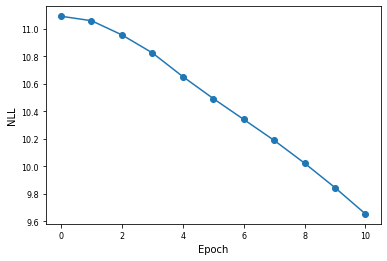

Epoch = 11, Nsteps = 2400, NLL on test data = 9.451339


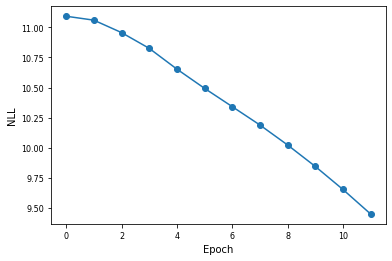

Epoch = 12, Nsteps = 2600, NLL on test data = 9.235389


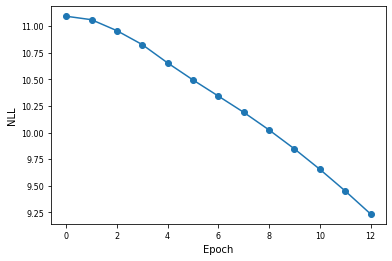

Epoch = 13, Nsteps = 2800, NLL on test data = 9.014818


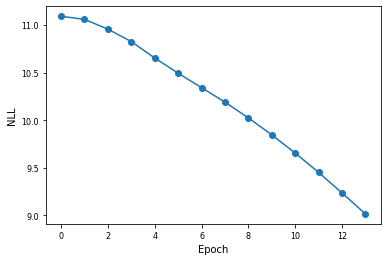

Epoch = 14, Nsteps = 3000, NLL on test data = 8.789578


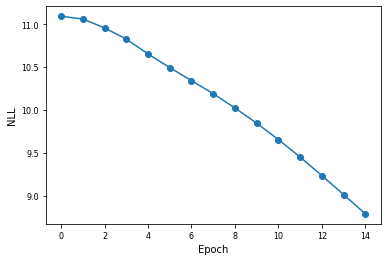

Epoch = 15, Nsteps = 3200, NLL on test data = 8.558389


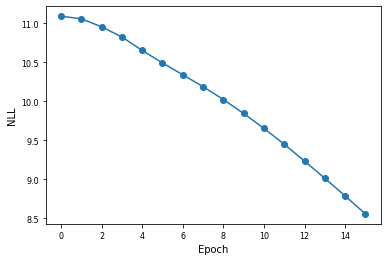

Epoch = 16, Nsteps = 3400, NLL on test data = 8.328265


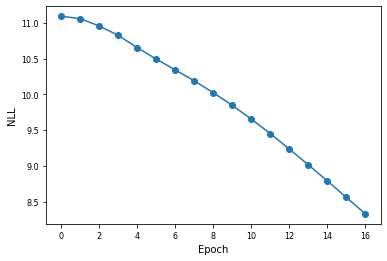

Epoch = 17, Nsteps = 3600, NLL on test data = 8.105144


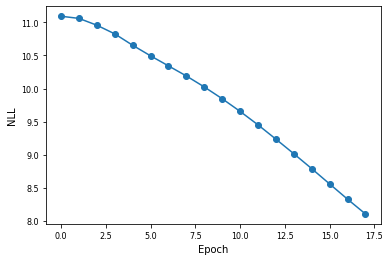

Epoch = 18, Nsteps = 3800, NLL on test data = 7.887470


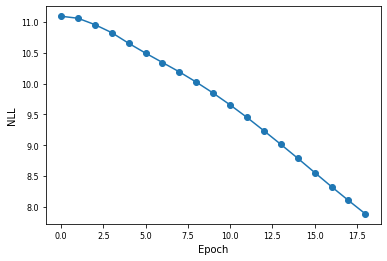

Epoch = 19, Nsteps = 4000, NLL on test data = 7.678176


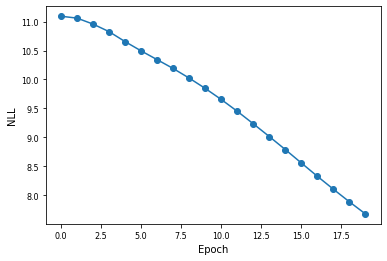

Epoch = 20, Nsteps = 4200, NLL on test data = 7.478038


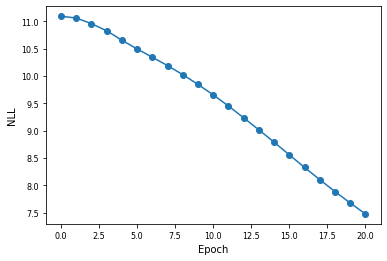

Epoch = 21, Nsteps = 4400, NLL on test data = 7.289464


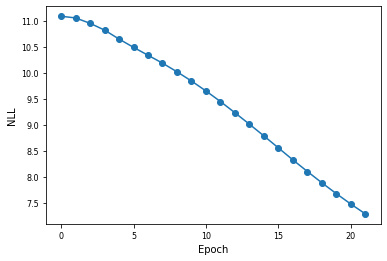

Epoch = 22, Nsteps = 4600, NLL on test data = 7.121200


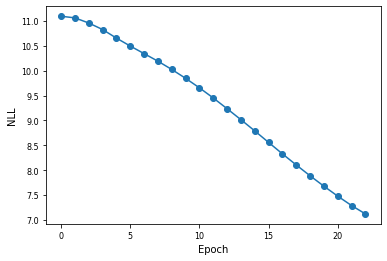

Epoch = 23, Nsteps = 4800, NLL on test data = 6.971507


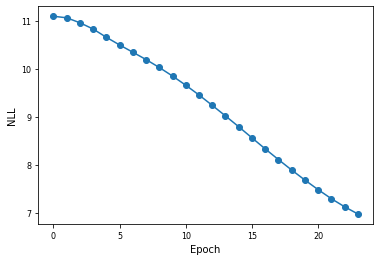

Epoch = 24, Nsteps = 5000, NLL on test data = 6.826317


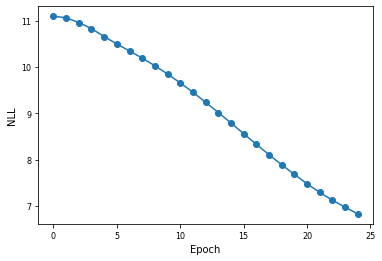

Epoch = 25, Nsteps = 5200, NLL on test data = 6.720581


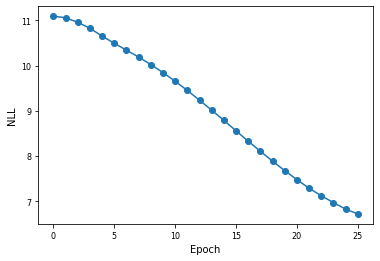

Epoch = 26, Nsteps = 5400, NLL on test data = 6.626506


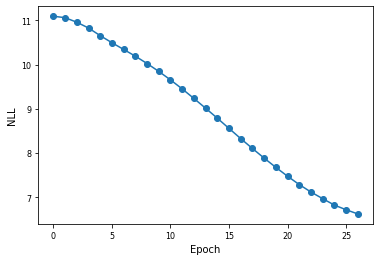

Epoch = 27, Nsteps = 5600, NLL on test data = 6.478631


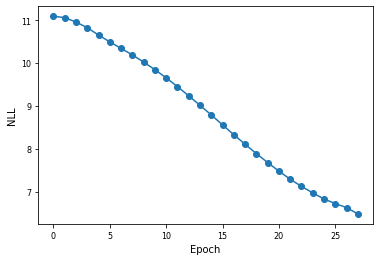

Epoch = 28, Nsteps = 5800, NLL on test data = 6.596261


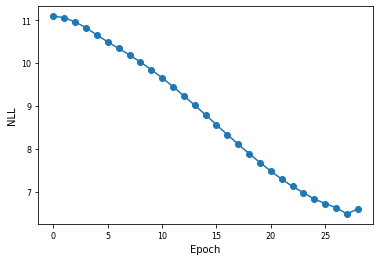

Epoch = 29, Nsteps = 6000, NLL on test data = 6.291946


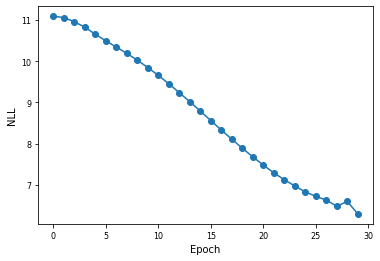

Epoch = 30, Nsteps = 6200, NLL on test data = 6.202146


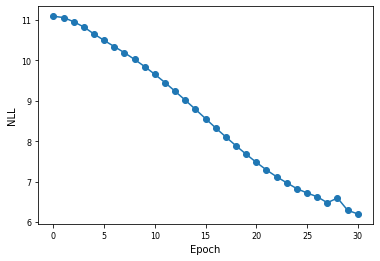

Epoch = 31, Nsteps = 6400, NLL on test data = 6.283075


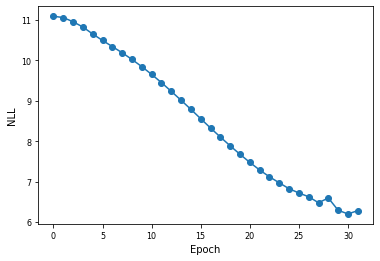

Epoch = 32, Nsteps = 6600, NLL on test data = 6.092154


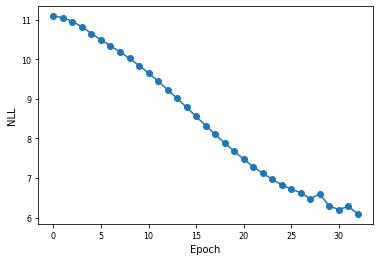

Epoch = 33, Nsteps = 6800, NLL on test data = 6.280721


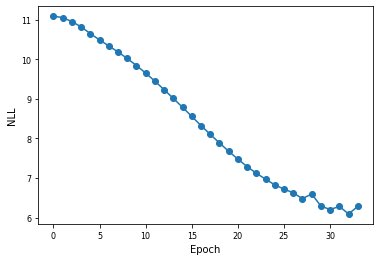

Epoch = 34, Nsteps = 7000, NLL on test data = 5.947234


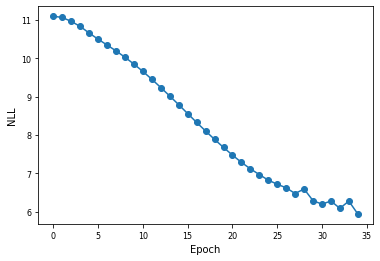

Epoch = 35, Nsteps = 7200, NLL on test data = 5.922668


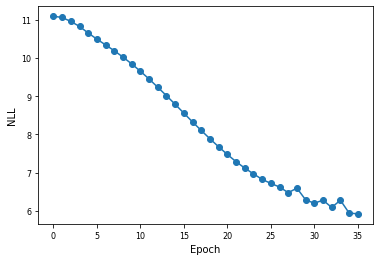

Epoch = 36, Nsteps = 7400, NLL on test data = 5.878643


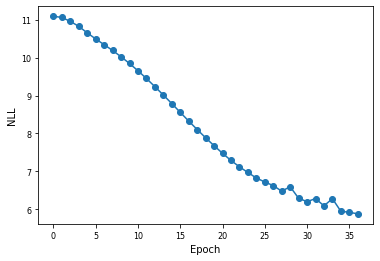

Epoch = 37, Nsteps = 7600, NLL on test data = 5.834754


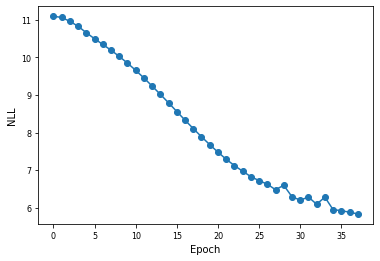

Epoch = 38, Nsteps = 7800, NLL on test data = 5.923979


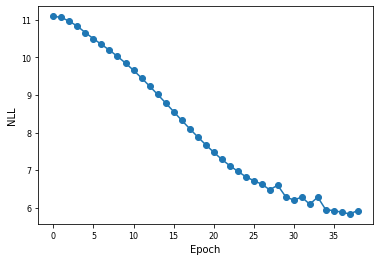

Epoch = 39, Nsteps = 8000, NLL on test data = 5.805451


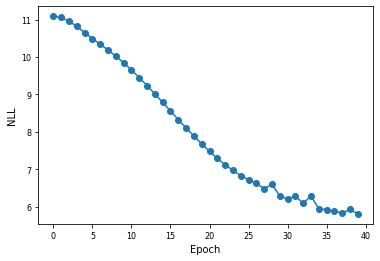

Epoch = 40, Nsteps = 8200, NLL on test data = 5.717189


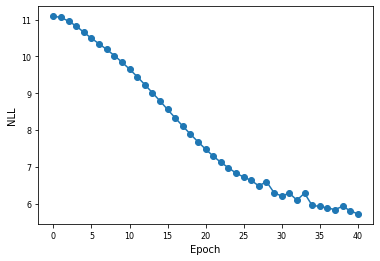

Epoch = 41, Nsteps = 8400, NLL on test data = 5.671030


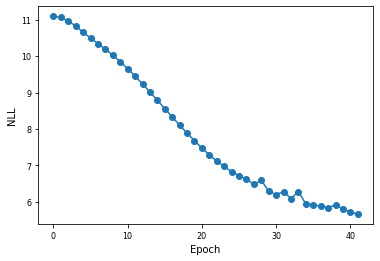

Epoch = 42, Nsteps = 8600, NLL on test data = 5.675093


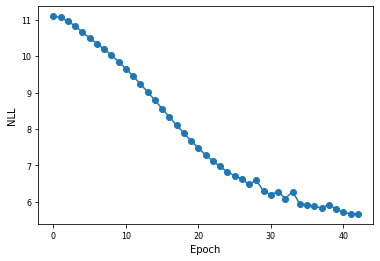

Epoch = 43, Nsteps = 8800, NLL on test data = 5.686359


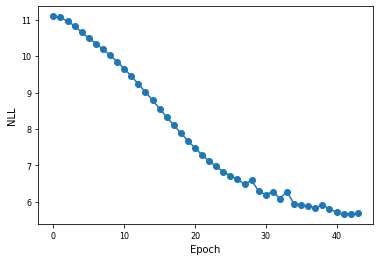

Epoch = 44, Nsteps = 9000, NLL on test data = 6.039218


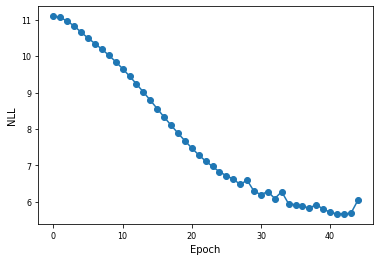

Epoch = 45, Nsteps = 9200, NLL on test data = 5.558428


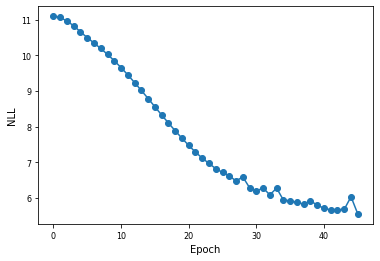

Epoch = 46, Nsteps = 9400, NLL on test data = 5.857868


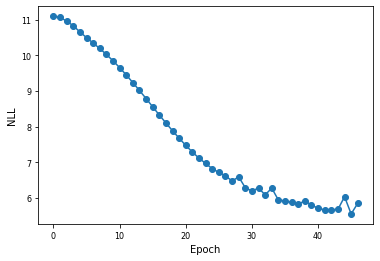

Epoch = 47, Nsteps = 9600, NLL on test data = 5.586091


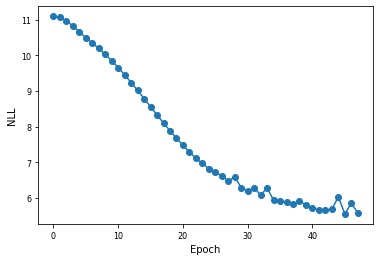

Epoch = 48, Nsteps = 9800, NLL on test data = 5.588501


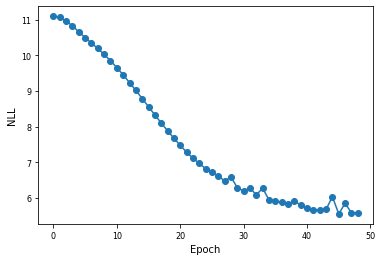

Epoch = 49, Nsteps = 10000, NLL on test data = 5.471655


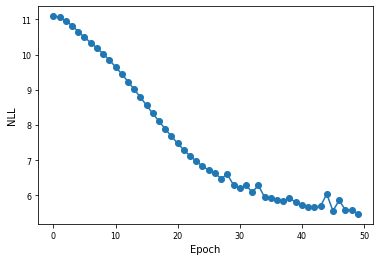

Epoch = 50, Nsteps = 10200, NLL on test data = 5.527875


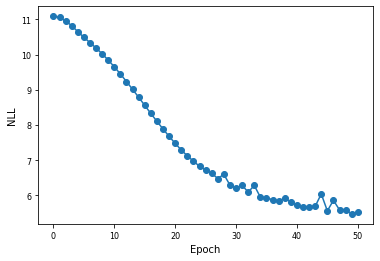

Epoch = 51, Nsteps = 10400, NLL on test data = 5.591891


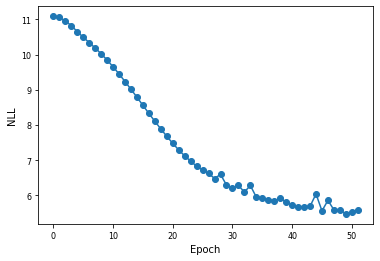

Epoch = 52, Nsteps = 10600, NLL on test data = 5.447739


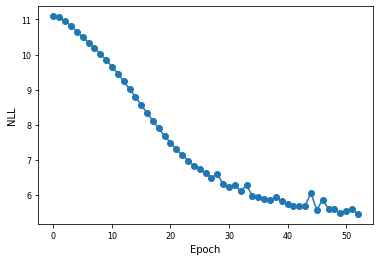

Epoch = 53, Nsteps = 10800, NLL on test data = 5.929096


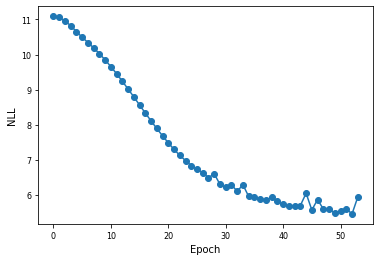

Epoch = 54, Nsteps = 11000, NLL on test data = 5.594488


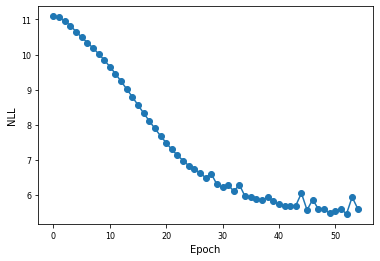

Epoch = 55, Nsteps = 11200, NLL on test data = 5.343590


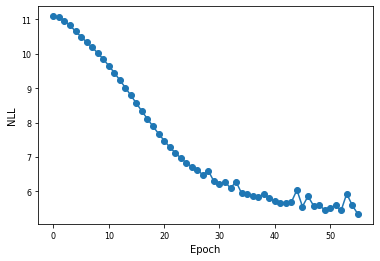

Epoch = 56, Nsteps = 11400, NLL on test data = 6.510538


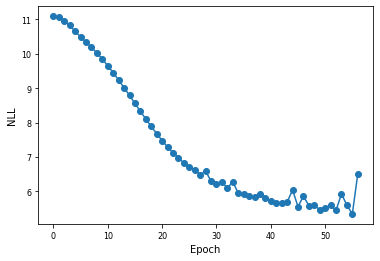

Epoch = 57, Nsteps = 11600, NLL on test data = 7.978552


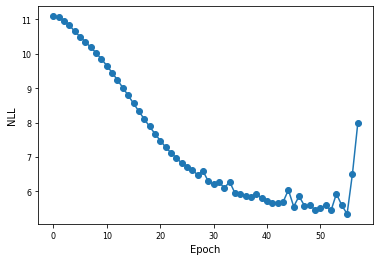

Epoch = 58, Nsteps = 11800, NLL on test data = 5.449819


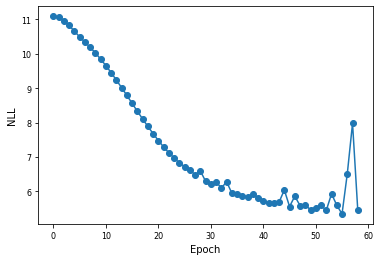

Epoch = 59, Nsteps = 12000, NLL on test data = 5.435551


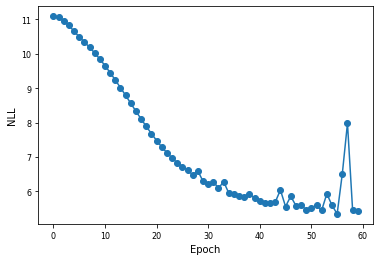

Epoch = 60, Nsteps = 12200, NLL on test data = 5.283537


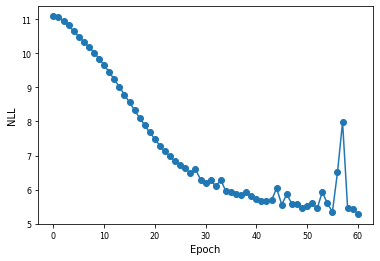

Epoch = 61, Nsteps = 12400, NLL on test data = 5.422354


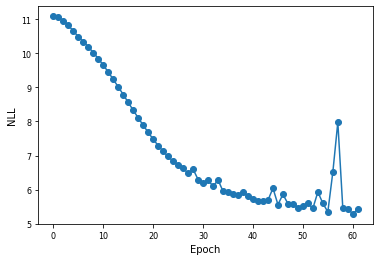

Epoch = 62, Nsteps = 12600, NLL on test data = 5.529756


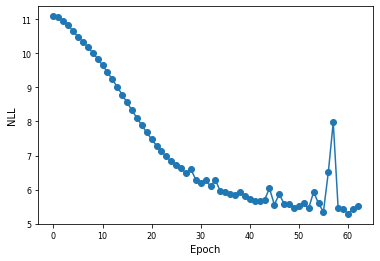

Epoch = 63, Nsteps = 12800, NLL on test data = 5.859400


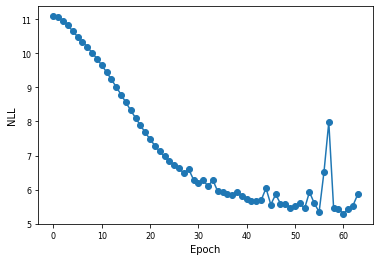

Epoch = 64, Nsteps = 13000, NLL on test data = 6.037464


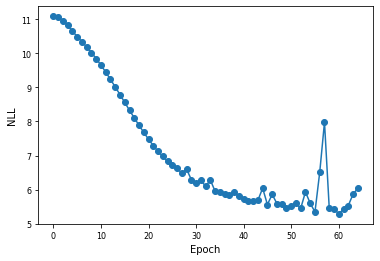

Epoch = 65, Nsteps = 13200, NLL on test data = 5.305545


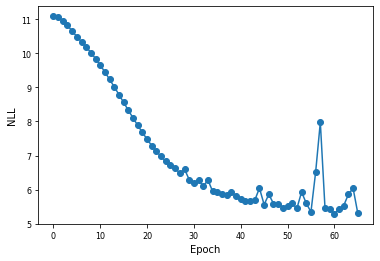

Epoch = 66, Nsteps = 13400, NLL on test data = 5.641427


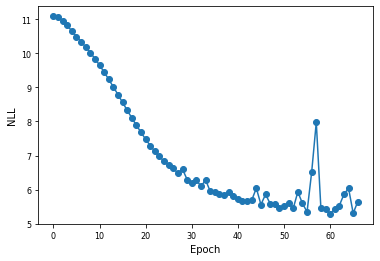

Epoch = 67, Nsteps = 13600, NLL on test data = 5.359007


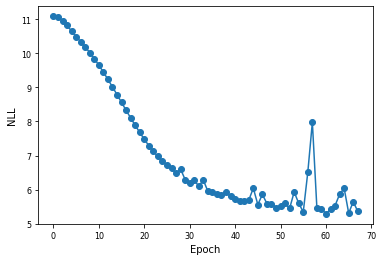

Epoch = 68, Nsteps = 13800, NLL on test data = 5.928720


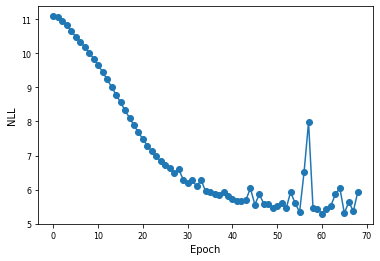

Epoch = 69, Nsteps = 14000, NLL on test data = 5.309339


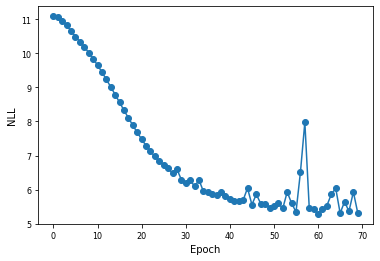

Epoch = 70, Nsteps = 14200, NLL on test data = 5.461142


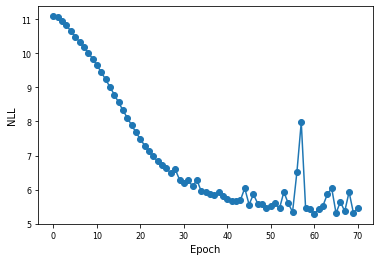

Epoch = 71, Nsteps = 14400, NLL on test data = 5.923374


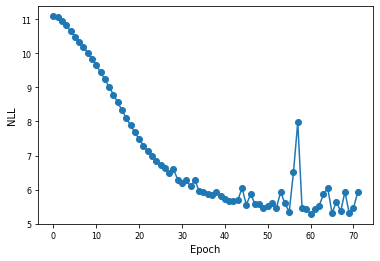

Epoch = 72, Nsteps = 14600, NLL on test data = 5.510752


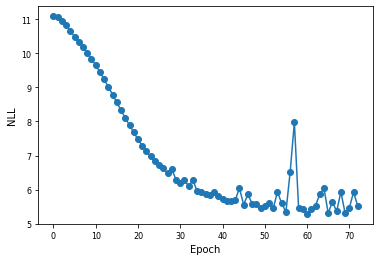

Epoch = 73, Nsteps = 14800, NLL on test data = 5.160458


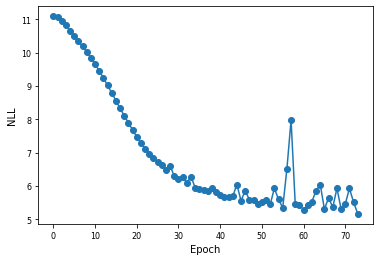

Epoch = 74, Nsteps = 15000, NLL on test data = 6.313939


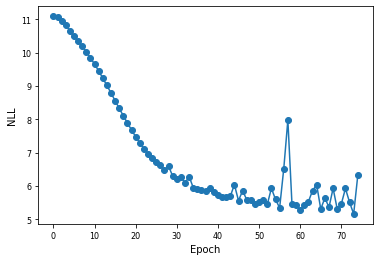

Epoch = 75, Nsteps = 15200, NLL on test data = 5.563644


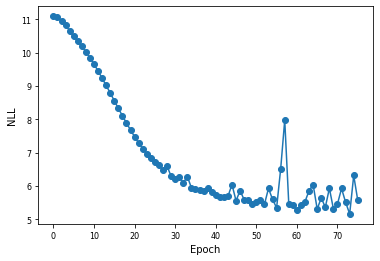

Epoch = 76, Nsteps = 15400, NLL on test data = 5.924547


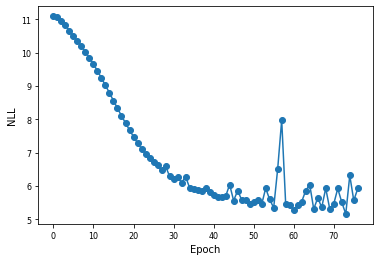

Epoch = 77, Nsteps = 15600, NLL on test data = 6.601403


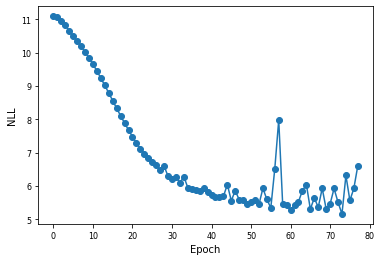

Epoch = 78, Nsteps = 15800, NLL on test data = 6.362262


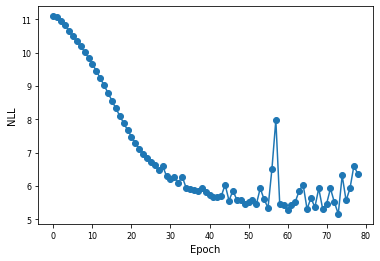

Epoch = 79, Nsteps = 16000, NLL on test data = 5.996823


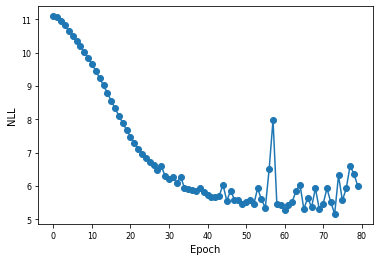

Epoch = 80, Nsteps = 16200, NLL on test data = 7.389713


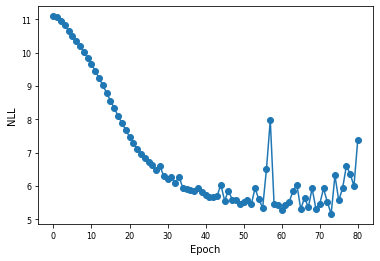

Epoch = 81, Nsteps = 16400, NLL on test data = 5.191666


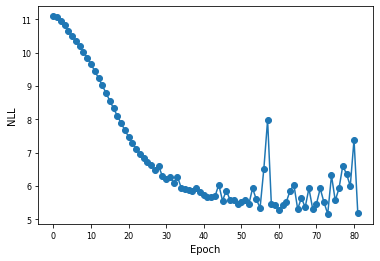

Epoch = 82, Nsteps = 16600, NLL on test data = 5.115147


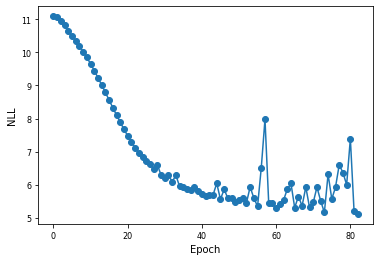

Epoch = 83, Nsteps = 16800, NLL on test data = 6.858052


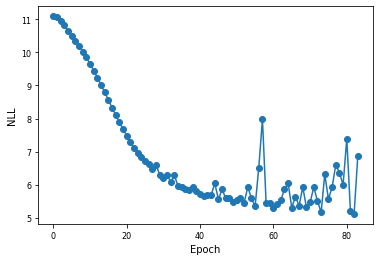

Epoch = 84, Nsteps = 17000, NLL on test data = 5.258422


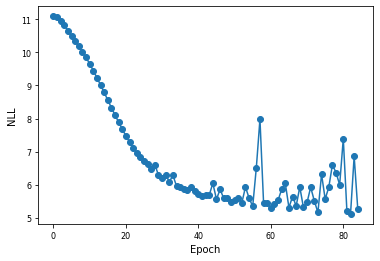

Epoch = 85, Nsteps = 17200, NLL on test data = 6.357984


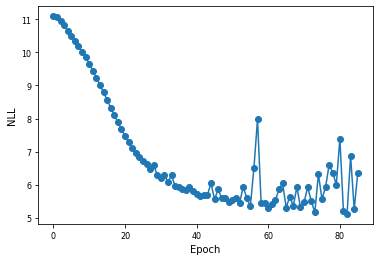

Epoch = 86, Nsteps = 17400, NLL on test data = 6.527011


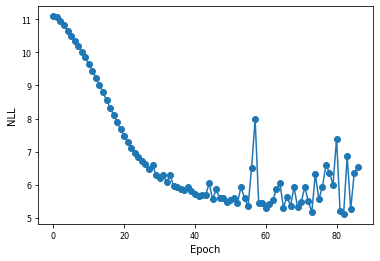

Epoch = 87, Nsteps = 17600, NLL on test data = 5.356647


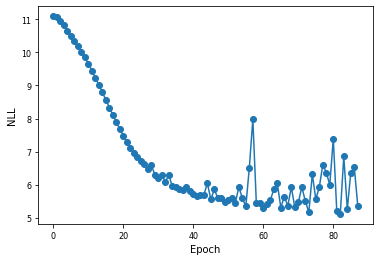

Epoch = 88, Nsteps = 17800, NLL on test data = 5.136054


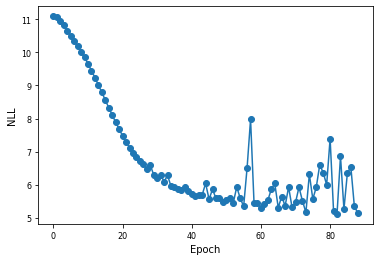

Epoch = 89, Nsteps = 18000, NLL on test data = 8.915836


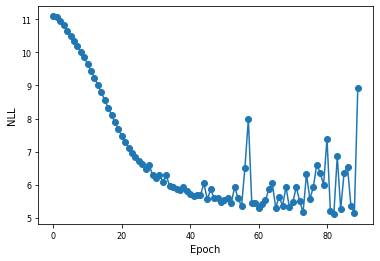

Epoch = 90, Nsteps = 18200, NLL on test data = 5.090025


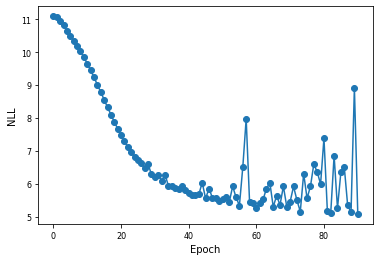

Epoch = 91, Nsteps = 18400, NLL on test data = 5.516725


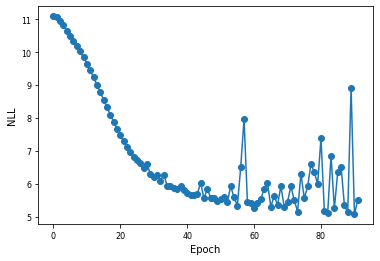

Epoch = 92, Nsteps = 18600, NLL on test data = 6.758773


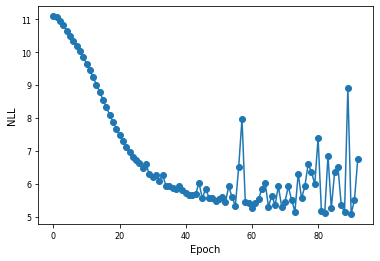

Epoch = 93, Nsteps = 18800, NLL on test data = 5.587317


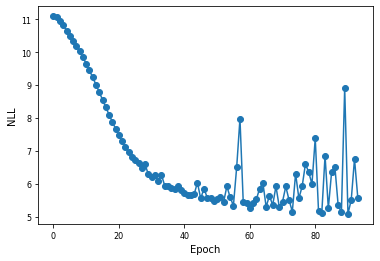

Epoch = 94, Nsteps = 19000, NLL on test data = 5.085126


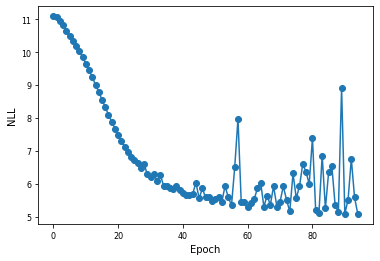

Epoch = 95, Nsteps = 19200, NLL on test data = 5.195624


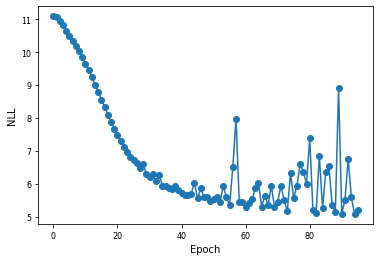

Epoch = 96, Nsteps = 19400, NLL on test data = 6.998140


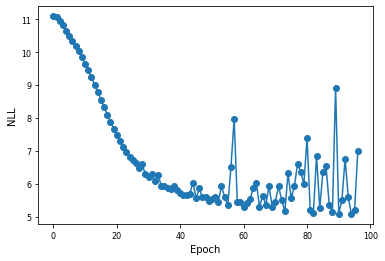

Epoch = 97, Nsteps = 19600, NLL on test data = 5.897721


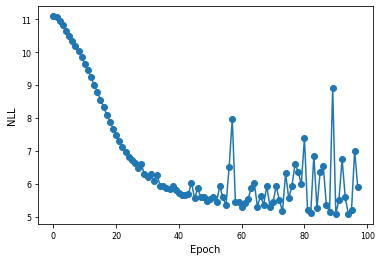

Epoch = 98, Nsteps = 19800, NLL on test data = 5.062930


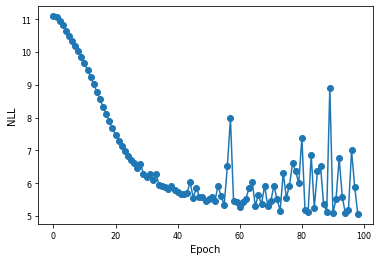

Epoch = 99, Nsteps = 20000, NLL on test data = 6.025416


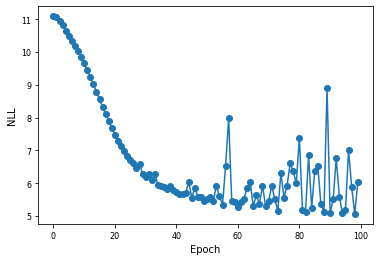

Epoch = 0, Nsteps = 200, NLL on test data = 11.079882


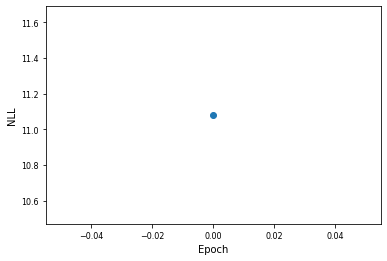

Epoch = 1, Nsteps = 400, NLL on test data = 11.056265


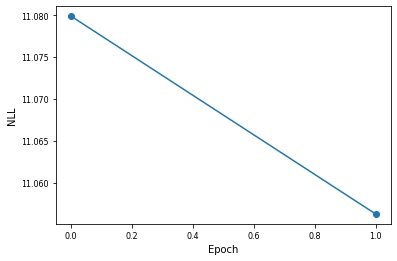

Epoch = 2, Nsteps = 600, NLL on test data = 10.982973


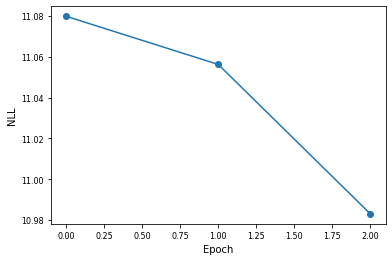

Epoch = 3, Nsteps = 800, NLL on test data = 10.854379


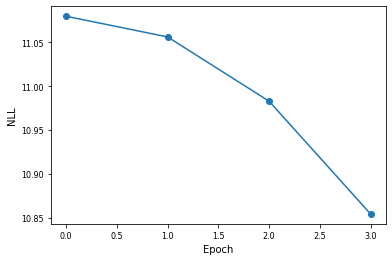

Epoch = 4, Nsteps = 1000, NLL on test data = 10.687399


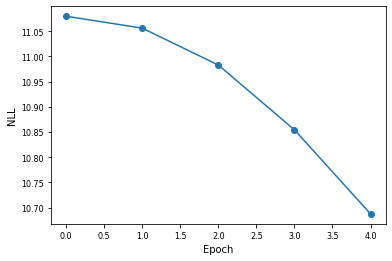

Epoch = 5, Nsteps = 1200, NLL on test data = 10.546789


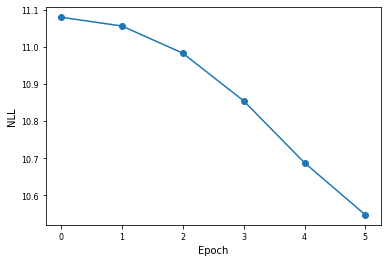

Epoch = 6, Nsteps = 1400, NLL on test data = 10.430875


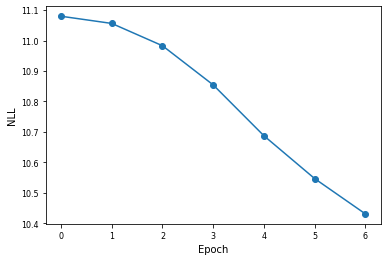

Epoch = 7, Nsteps = 1600, NLL on test data = 10.316228


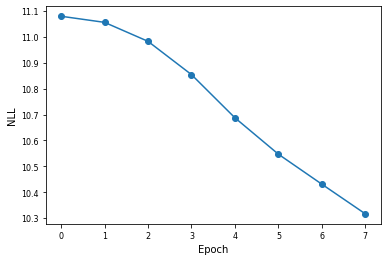

Epoch = 8, Nsteps = 1800, NLL on test data = 10.195087


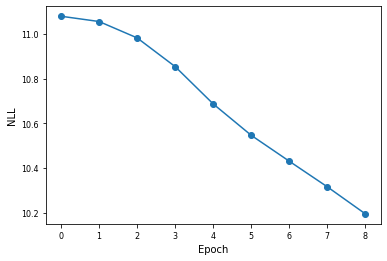

Epoch = 9, Nsteps = 2000, NLL on test data = 10.061419


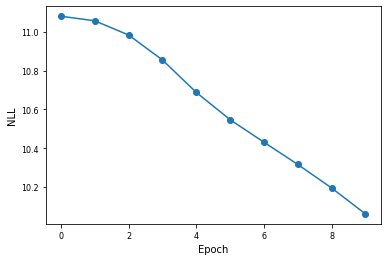

Epoch = 10, Nsteps = 2200, NLL on test data = 9.921042


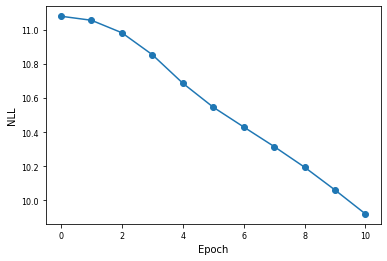

Epoch = 11, Nsteps = 2400, NLL on test data = 9.768239


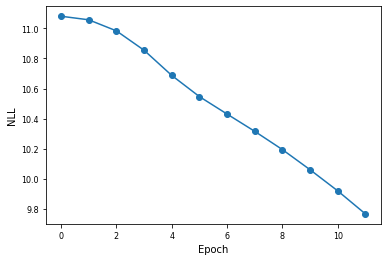

Epoch = 12, Nsteps = 2600, NLL on test data = 9.606653


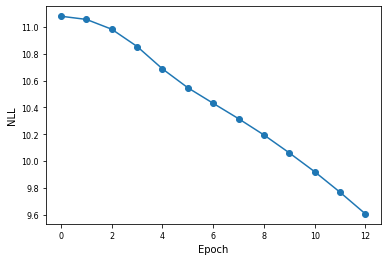

Epoch = 13, Nsteps = 2800, NLL on test data = 9.438771


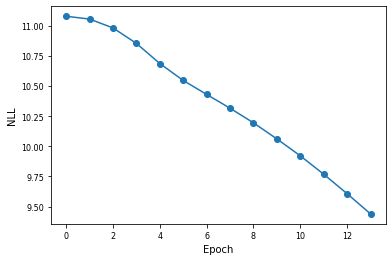

Epoch = 14, Nsteps = 3000, NLL on test data = 9.270550


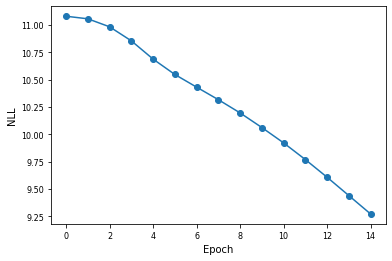

Epoch = 15, Nsteps = 3200, NLL on test data = 9.097212


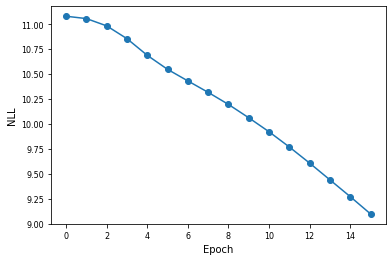

Epoch = 16, Nsteps = 3400, NLL on test data = 8.926252


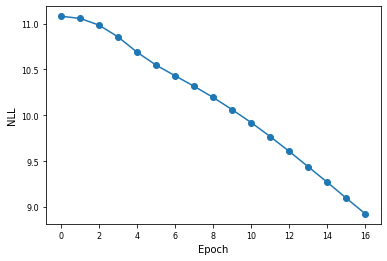

Epoch = 17, Nsteps = 3600, NLL on test data = 8.757385


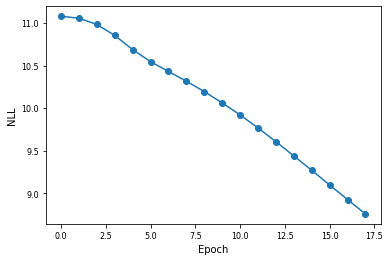

Epoch = 18, Nsteps = 3800, NLL on test data = 8.599039


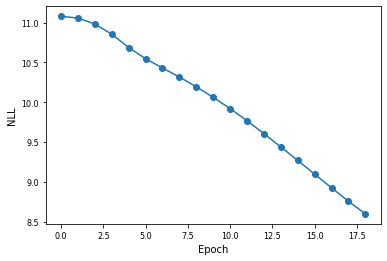

Epoch = 19, Nsteps = 4000, NLL on test data = 8.445866


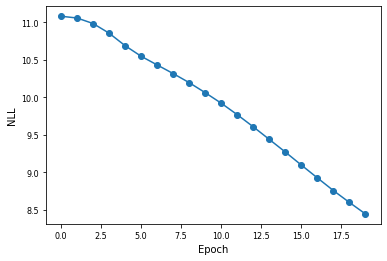

Epoch = 20, Nsteps = 4200, NLL on test data = 8.320211


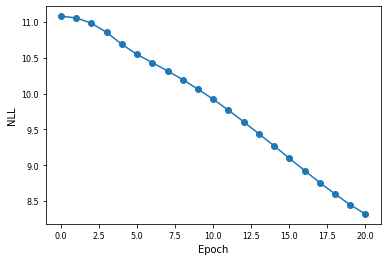

Epoch = 21, Nsteps = 4400, NLL on test data = 8.178449


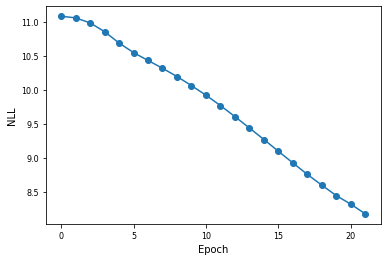

Epoch = 22, Nsteps = 4600, NLL on test data = 8.058085


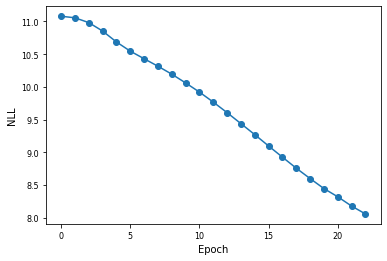

Epoch = 23, Nsteps = 4800, NLL on test data = 7.943715


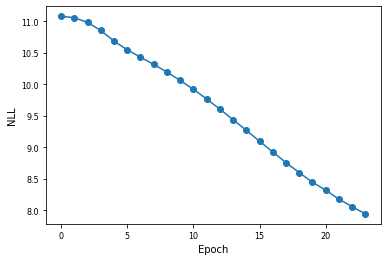

Epoch = 24, Nsteps = 5000, NLL on test data = 7.863002


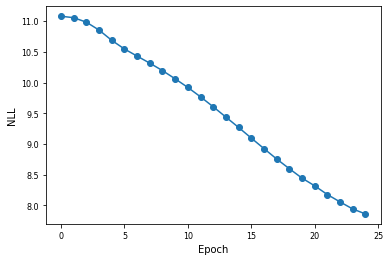

Epoch = 25, Nsteps = 5200, NLL on test data = 7.764734


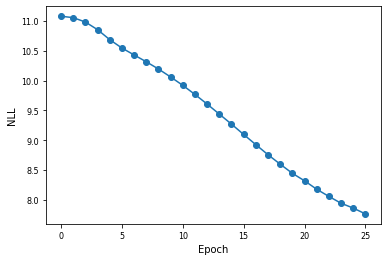

Epoch = 26, Nsteps = 5400, NLL on test data = 7.726442


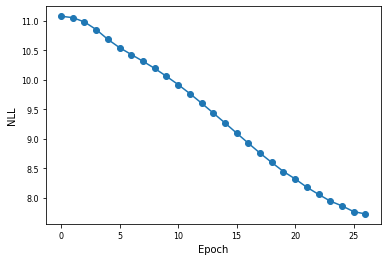

Epoch = 27, Nsteps = 5600, NLL on test data = 7.607089


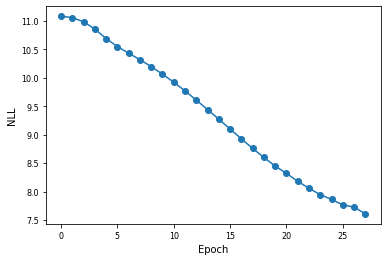

Epoch = 28, Nsteps = 5800, NLL on test data = 7.534836


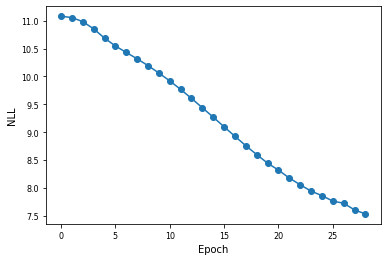

Epoch = 29, Nsteps = 6000, NLL on test data = 7.485901


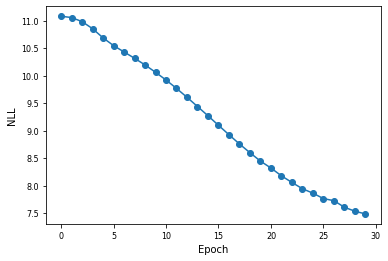

Epoch = 30, Nsteps = 6200, NLL on test data = 7.431393


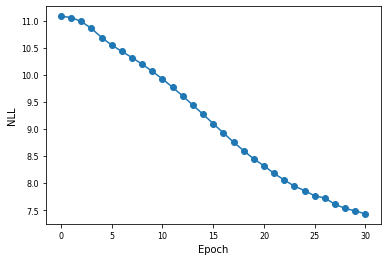

Epoch = 31, Nsteps = 6400, NLL on test data = 7.368674


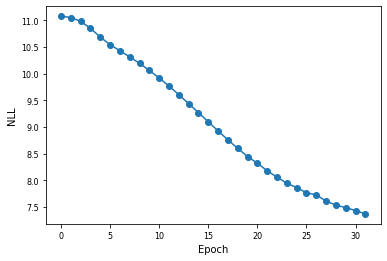

Epoch = 32, Nsteps = 6600, NLL on test data = 7.335389


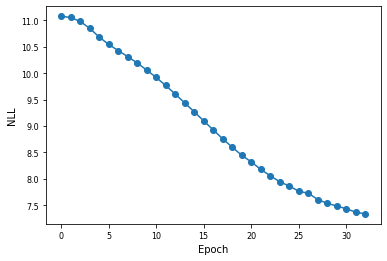

Epoch = 33, Nsteps = 6800, NLL on test data = 7.315473


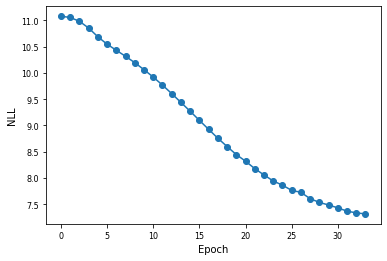

Epoch = 34, Nsteps = 7000, NLL on test data = 7.239440


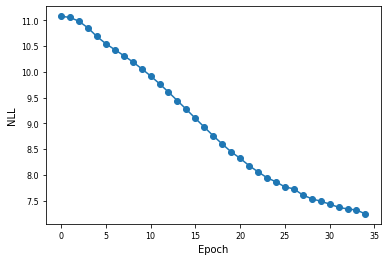

Epoch = 35, Nsteps = 7200, NLL on test data = 7.204635


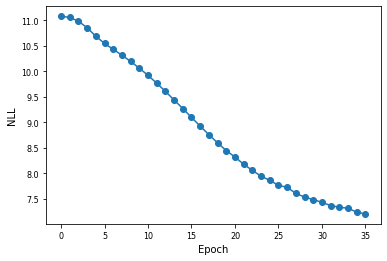

Epoch = 36, Nsteps = 7400, NLL on test data = 7.190322


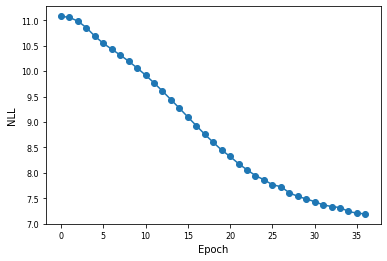

Epoch = 37, Nsteps = 7600, NLL on test data = 7.132207


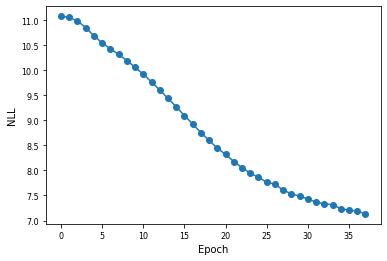

Epoch = 38, Nsteps = 7800, NLL on test data = 7.294033


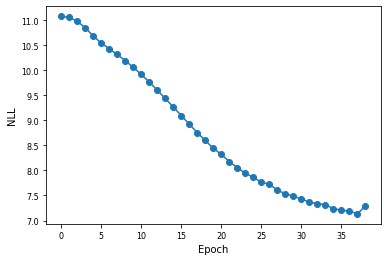

Epoch = 39, Nsteps = 8000, NLL on test data = 7.119099


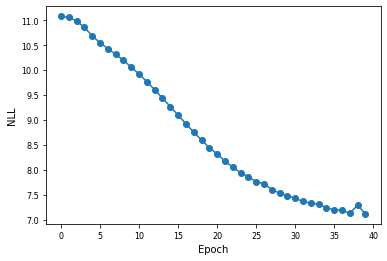

Epoch = 40, Nsteps = 8200, NLL on test data = 7.228893


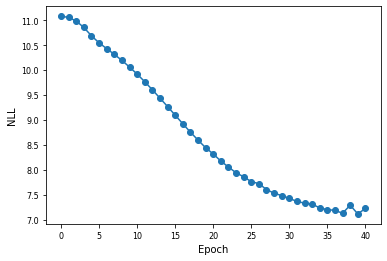

Epoch = 41, Nsteps = 8400, NLL on test data = 7.048255


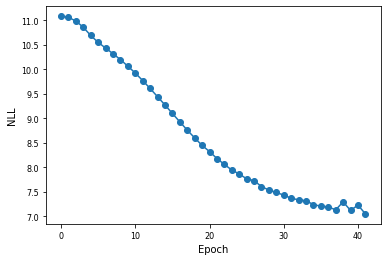

Epoch = 42, Nsteps = 8600, NLL on test data = 7.143859


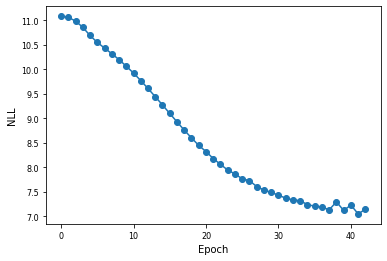

Epoch = 43, Nsteps = 8800, NLL on test data = 7.050432


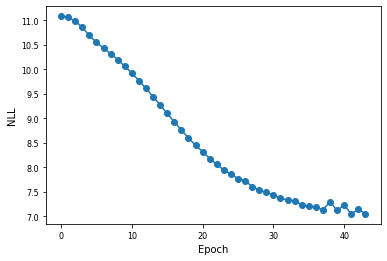

Epoch = 44, Nsteps = 9000, NLL on test data = 6.987080


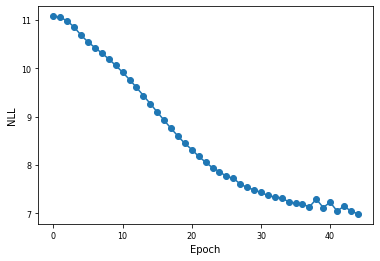

Epoch = 45, Nsteps = 9200, NLL on test data = 7.050829


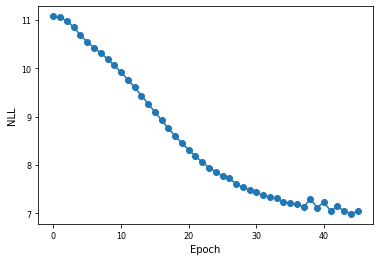

Epoch = 46, Nsteps = 9400, NLL on test data = 6.929181


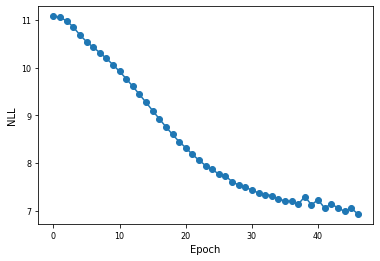

Epoch = 47, Nsteps = 9600, NLL on test data = 6.910097


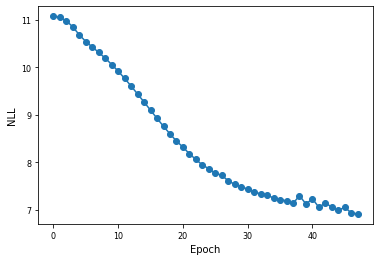

Epoch = 48, Nsteps = 9800, NLL on test data = 7.109550


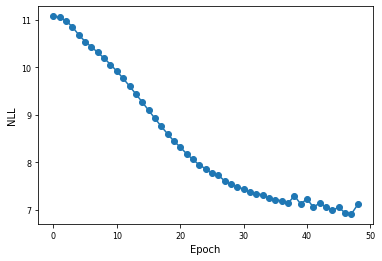

Epoch = 49, Nsteps = 10000, NLL on test data = 6.887237


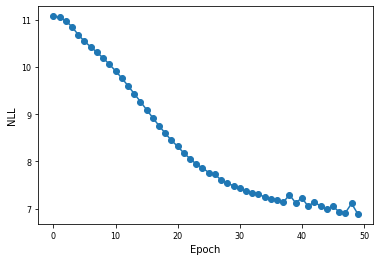

Epoch = 50, Nsteps = 10200, NLL on test data = 7.030226


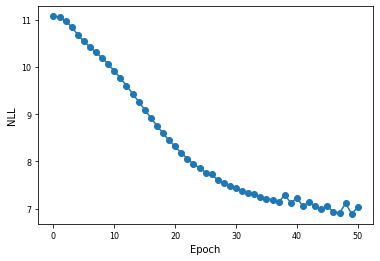

Epoch = 51, Nsteps = 10400, NLL on test data = 6.909425


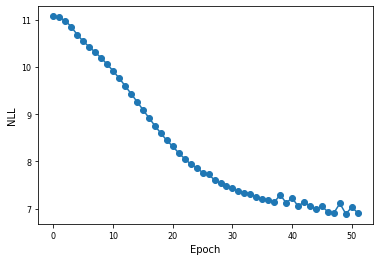

Epoch = 52, Nsteps = 10600, NLL on test data = 6.866885


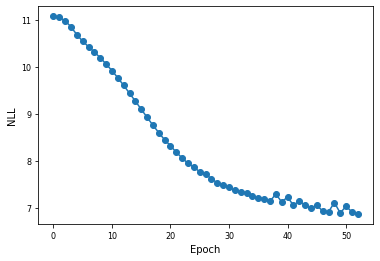

Epoch = 53, Nsteps = 10800, NLL on test data = 6.894041


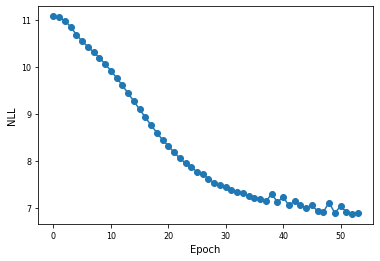

Epoch = 54, Nsteps = 11000, NLL on test data = 6.878221


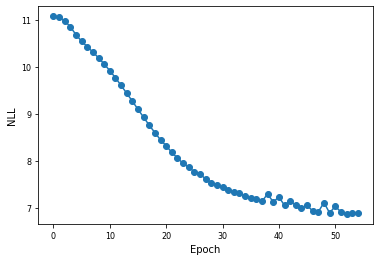

Epoch = 55, Nsteps = 11200, NLL on test data = 6.820818


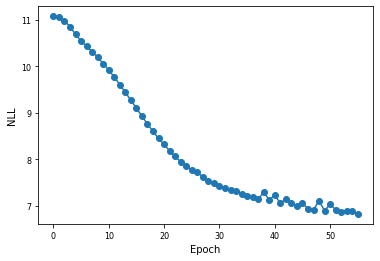

Epoch = 56, Nsteps = 11400, NLL on test data = 6.864838


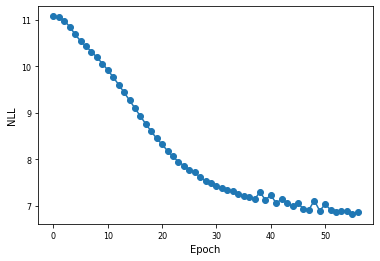

Epoch = 57, Nsteps = 11600, NLL on test data = 6.853190


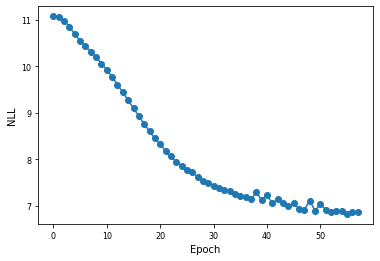

Epoch = 58, Nsteps = 11800, NLL on test data = 6.793572


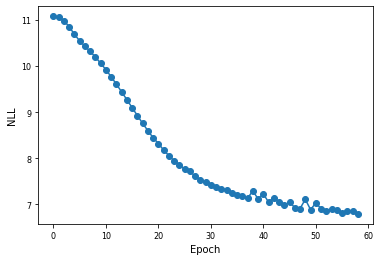

Epoch = 59, Nsteps = 12000, NLL on test data = 6.828169


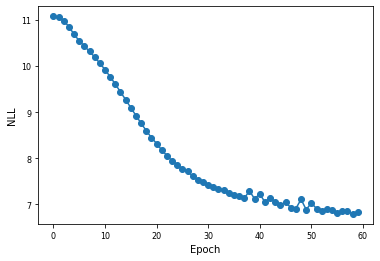

Epoch = 60, Nsteps = 12200, NLL on test data = 6.789605


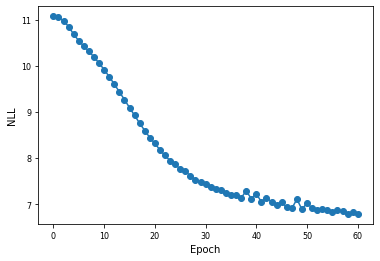

Epoch = 61, Nsteps = 12400, NLL on test data = 6.762268


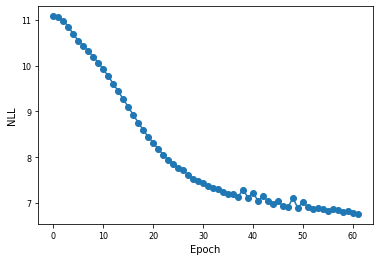

Epoch = 62, Nsteps = 12600, NLL on test data = 6.837791


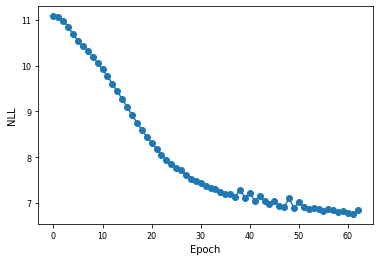

Epoch = 63, Nsteps = 12800, NLL on test data = 6.760803


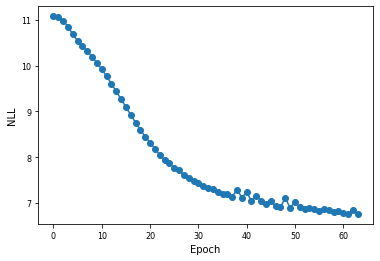

Epoch = 64, Nsteps = 13000, NLL on test data = 6.791486


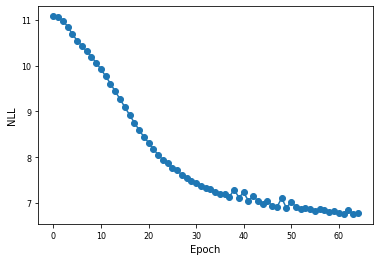

Epoch = 65, Nsteps = 13200, NLL on test data = 6.748106


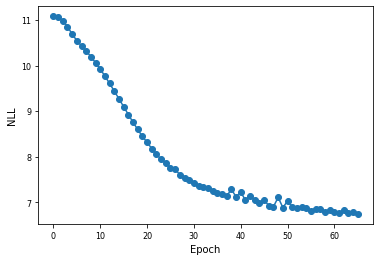

Epoch = 66, Nsteps = 13400, NLL on test data = 6.931042


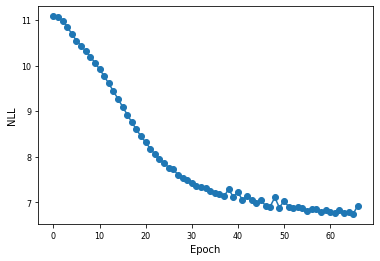

Epoch = 67, Nsteps = 13600, NLL on test data = 6.794250


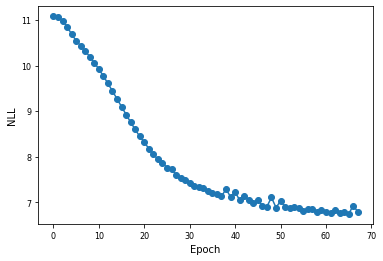

Epoch = 68, Nsteps = 13800, NLL on test data = 6.774745


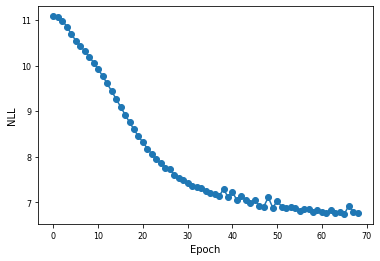

Epoch = 69, Nsteps = 14000, NLL on test data = 6.796731


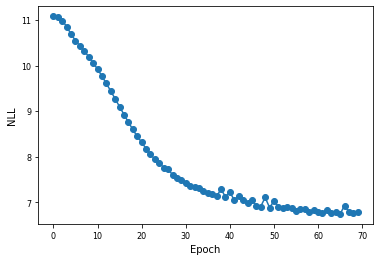

Epoch = 70, Nsteps = 14200, NLL on test data = 6.713603


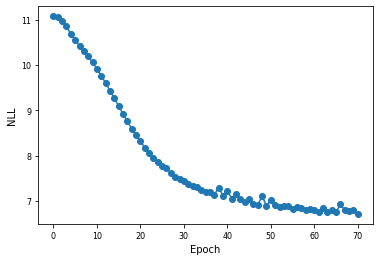

Epoch = 71, Nsteps = 14400, NLL on test data = 6.697235


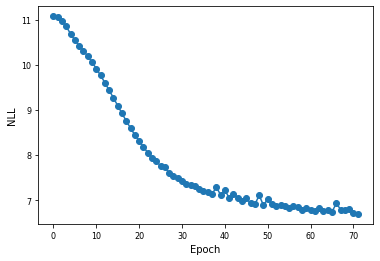

Epoch = 72, Nsteps = 14600, NLL on test data = 6.692632


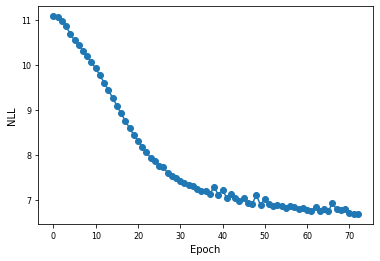

Epoch = 73, Nsteps = 14800, NLL on test data = 6.694958


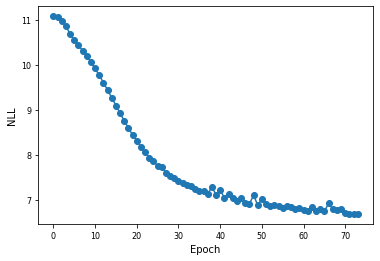

Epoch = 74, Nsteps = 15000, NLL on test data = 6.820290


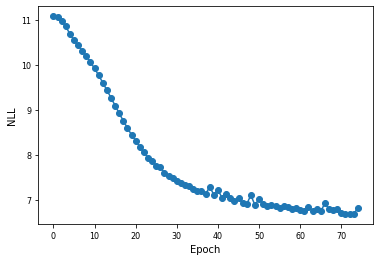

Epoch = 75, Nsteps = 15200, NLL on test data = 6.685132


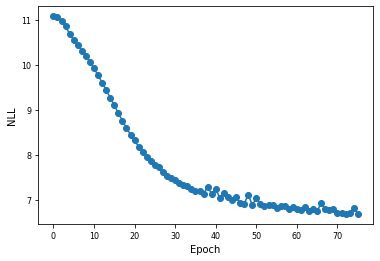

Epoch = 76, Nsteps = 15400, NLL on test data = 6.721766


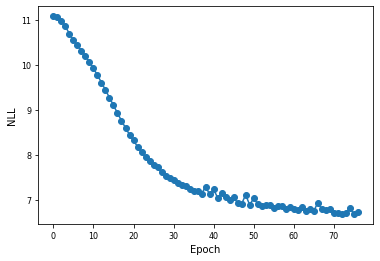

Epoch = 77, Nsteps = 15600, NLL on test data = 6.945778


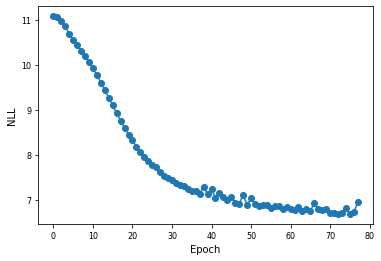

Epoch = 78, Nsteps = 15800, NLL on test data = 6.724390


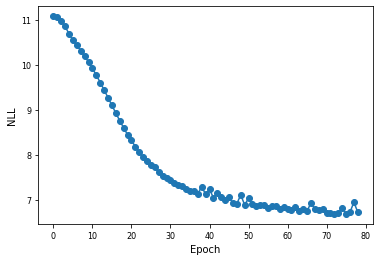

Epoch = 79, Nsteps = 16000, NLL on test data = 6.681159


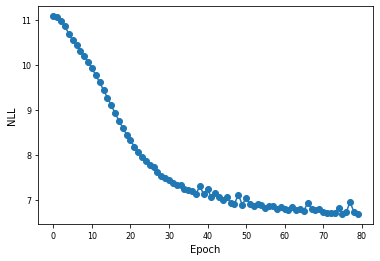

Epoch = 80, Nsteps = 16200, NLL on test data = 7.179829


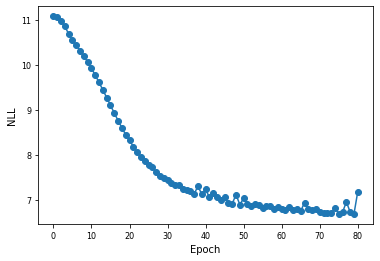

Epoch = 81, Nsteps = 16400, NLL on test data = 6.652094


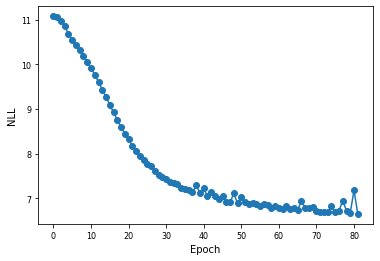

Epoch = 82, Nsteps = 16600, NLL on test data = 6.647274


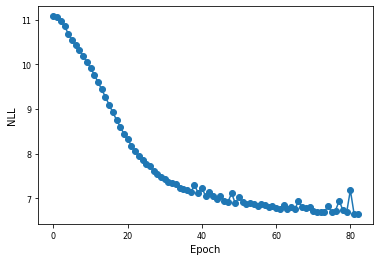

Epoch = 83, Nsteps = 16800, NLL on test data = 6.692776


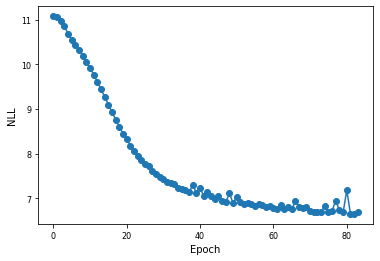

Epoch = 84, Nsteps = 17000, NLL on test data = 6.694538


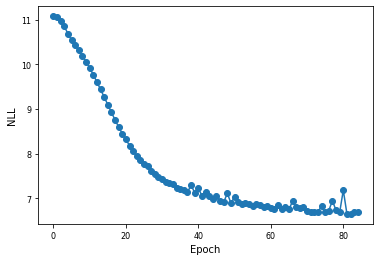

Epoch = 85, Nsteps = 17200, NLL on test data = 6.643425


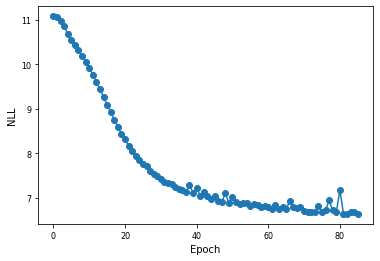

Epoch = 86, Nsteps = 17400, NLL on test data = 6.659889


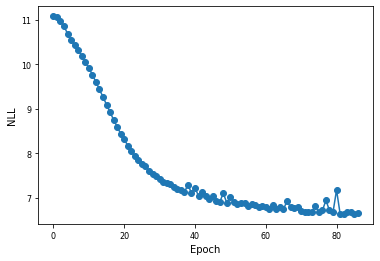

Epoch = 87, Nsteps = 17600, NLL on test data = 6.671299


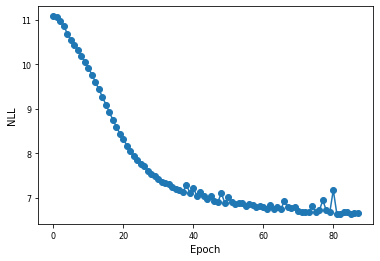

Epoch = 88, Nsteps = 17800, NLL on test data = 6.858479


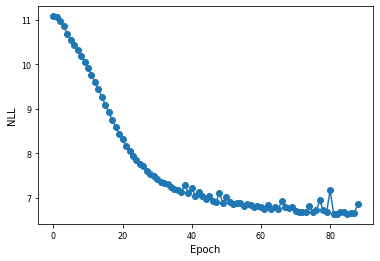

Epoch = 89, Nsteps = 18000, NLL on test data = 7.287904


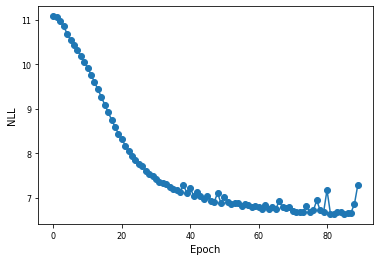

Epoch = 90, Nsteps = 18200, NLL on test data = 6.719011


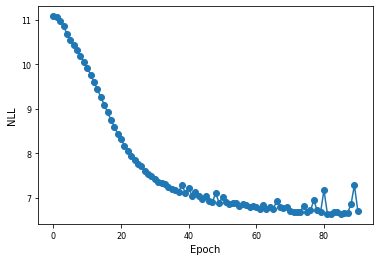

Epoch = 91, Nsteps = 18400, NLL on test data = 6.631663


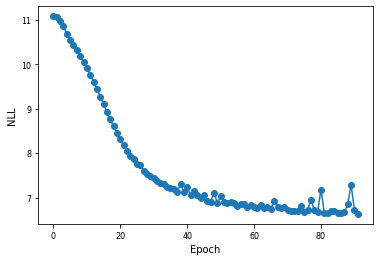

Epoch = 92, Nsteps = 18600, NLL on test data = 6.904136


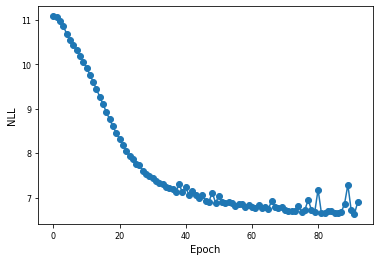

Epoch = 93, Nsteps = 18800, NLL on test data = 7.049609


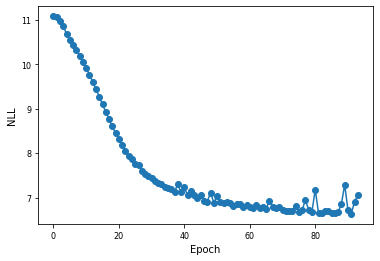

Epoch = 94, Nsteps = 19000, NLL on test data = 6.609887


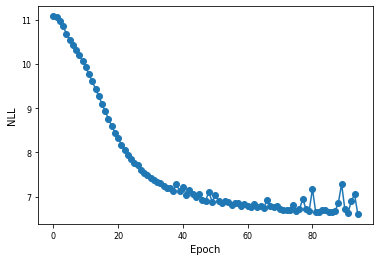

Epoch = 95, Nsteps = 19200, NLL on test data = 6.607615


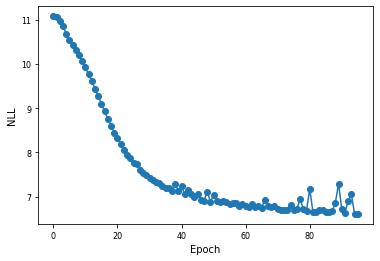

Epoch = 96, Nsteps = 19400, NLL on test data = 6.897492


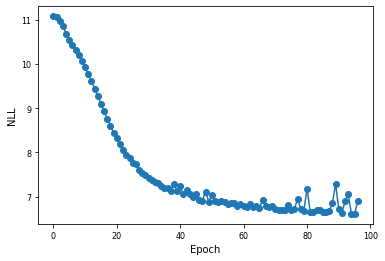

Epoch = 97, Nsteps = 19600, NLL on test data = 6.596285


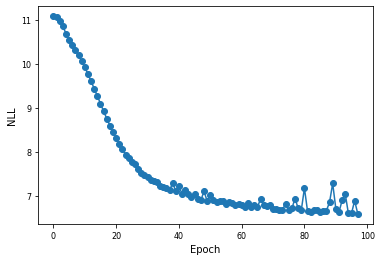

Epoch = 98, Nsteps = 19800, NLL on test data = 6.640597


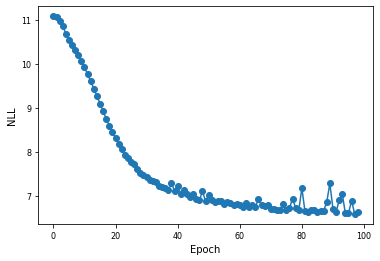

Epoch = 99, Nsteps = 20000, NLL on test data = 6.703993


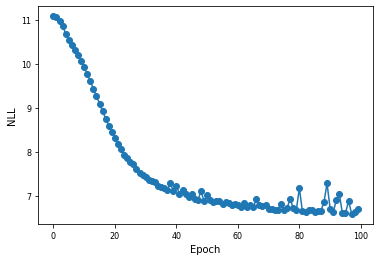

Epoch = 0, Nsteps = 200, NLL on test data = 11.087734


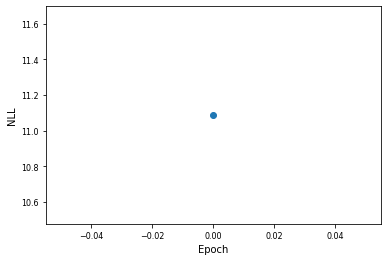

Epoch = 1, Nsteps = 400, NLL on test data = 11.074012


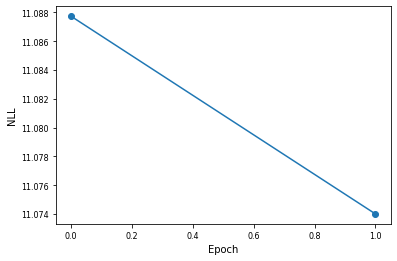

Epoch = 2, Nsteps = 600, NLL on test data = 11.042500


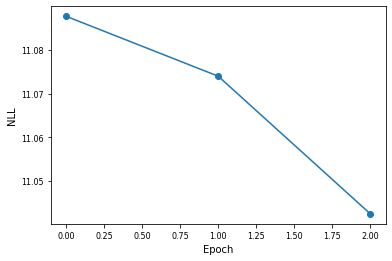

Epoch = 3, Nsteps = 800, NLL on test data = 10.995978


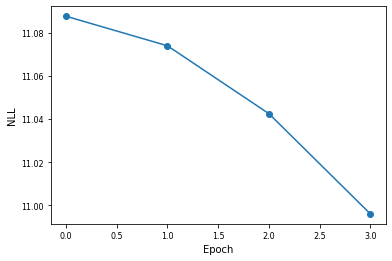

Epoch = 4, Nsteps = 1000, NLL on test data = 10.936472


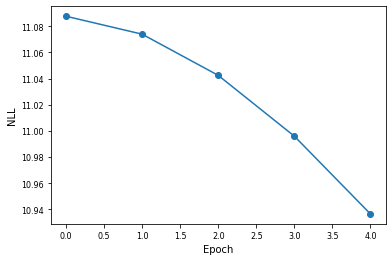

Epoch = 5, Nsteps = 1200, NLL on test data = 10.864364


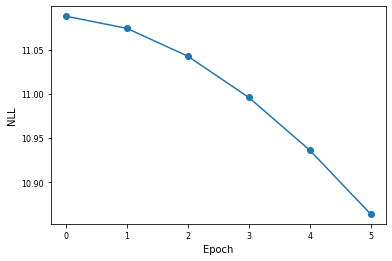

Epoch = 6, Nsteps = 1400, NLL on test data = 10.798712


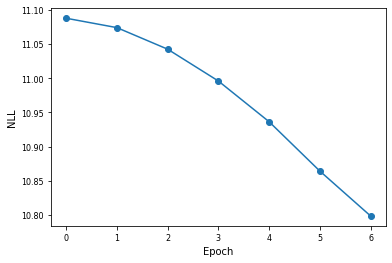

Epoch = 7, Nsteps = 1600, NLL on test data = 10.728725


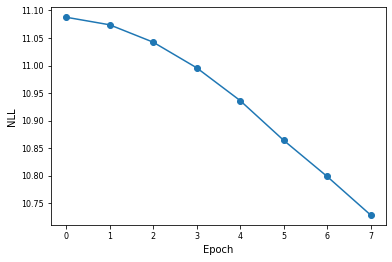

Epoch = 8, Nsteps = 1800, NLL on test data = 10.655350


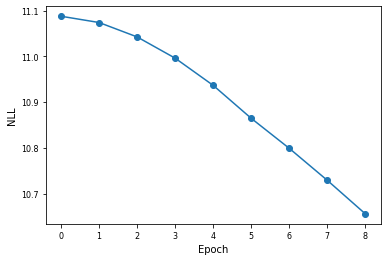

Epoch = 9, Nsteps = 2000, NLL on test data = 10.581690


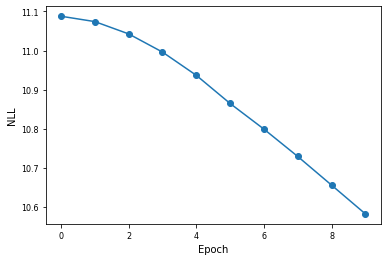

Epoch = 10, Nsteps = 2200, NLL on test data = 10.506598


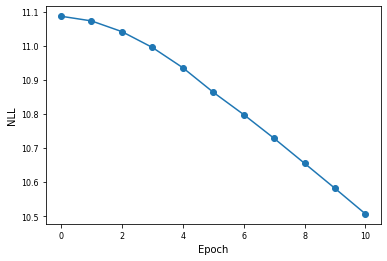

Epoch = 11, Nsteps = 2400, NLL on test data = 10.427258


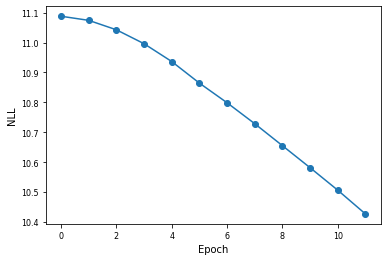

Epoch = 12, Nsteps = 2600, NLL on test data = 10.342417


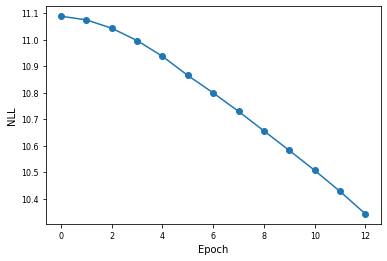

Epoch = 13, Nsteps = 2800, NLL on test data = 10.250003


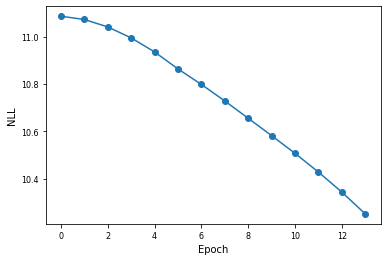

Epoch = 14, Nsteps = 3000, NLL on test data = 10.150436


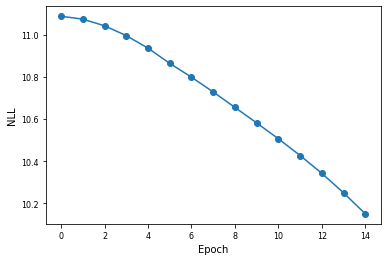

Epoch = 15, Nsteps = 3200, NLL on test data = 10.044322


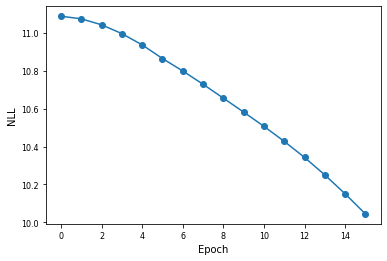

Epoch = 16, Nsteps = 3400, NLL on test data = 9.937246


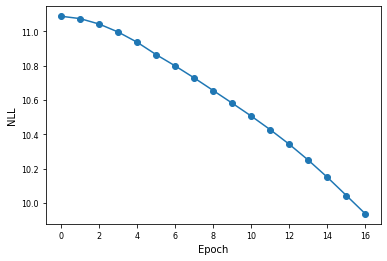

Epoch = 17, Nsteps = 3600, NLL on test data = 9.824968


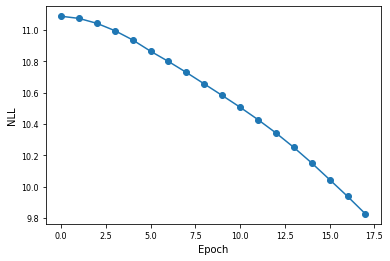

Epoch = 18, Nsteps = 3800, NLL on test data = 9.715353


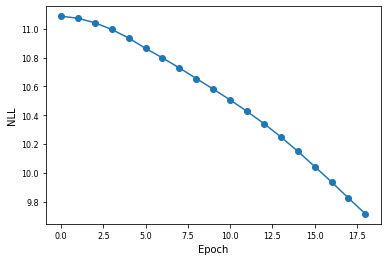

Epoch = 19, Nsteps = 4000, NLL on test data = 9.595182


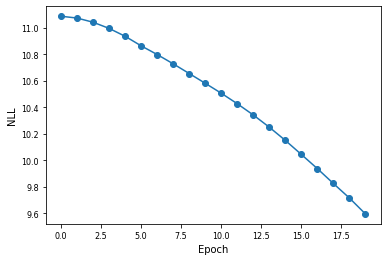

Epoch = 20, Nsteps = 4200, NLL on test data = 9.476801


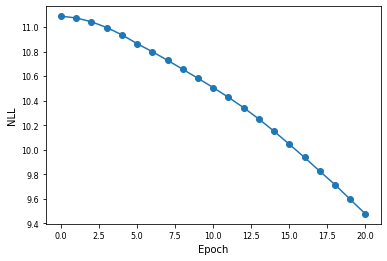

Epoch = 21, Nsteps = 4400, NLL on test data = 9.356558


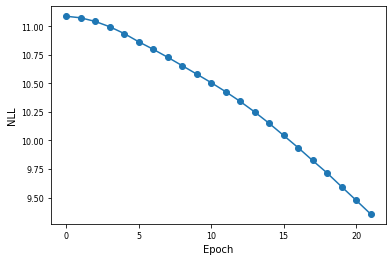

Epoch = 22, Nsteps = 4600, NLL on test data = 9.244338


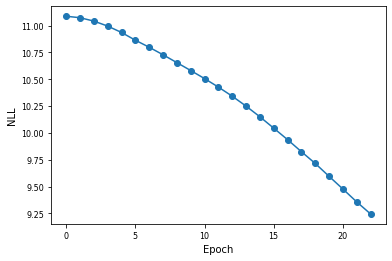

Epoch = 23, Nsteps = 4800, NLL on test data = 9.135480


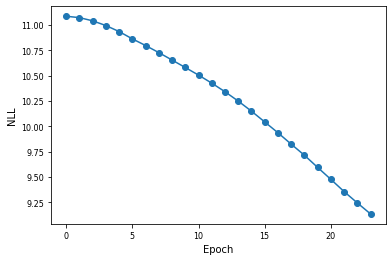

Epoch = 24, Nsteps = 5000, NLL on test data = 9.028649


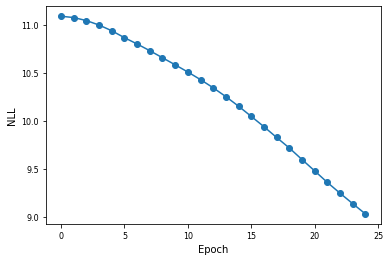

Epoch = 25, Nsteps = 5200, NLL on test data = 8.919284


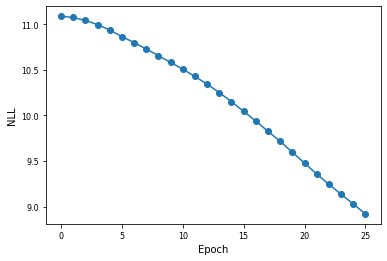

Epoch = 26, Nsteps = 5400, NLL on test data = 8.819205


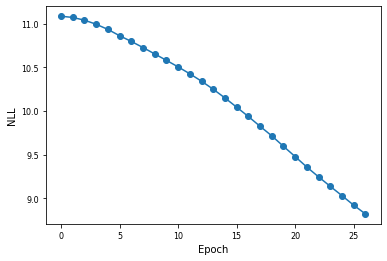

Epoch = 27, Nsteps = 5600, NLL on test data = 8.747378


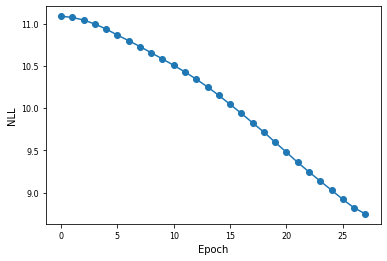

Epoch = 28, Nsteps = 5800, NLL on test data = 8.674366


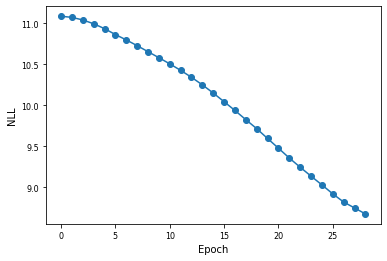

Epoch = 29, Nsteps = 6000, NLL on test data = 8.570812


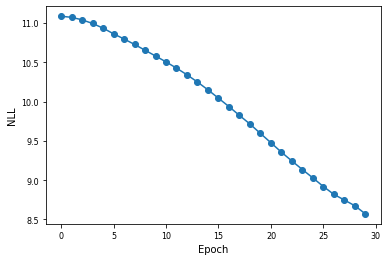

Epoch = 30, Nsteps = 6200, NLL on test data = 8.509628


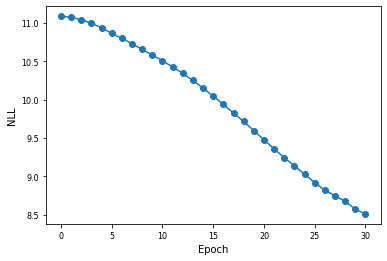

Epoch = 31, Nsteps = 6400, NLL on test data = 8.454835


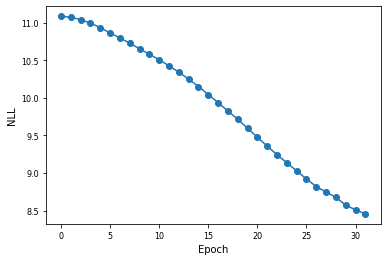

Epoch = 32, Nsteps = 6600, NLL on test data = 8.381177


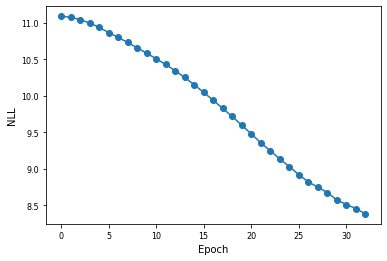

Epoch = 33, Nsteps = 6800, NLL on test data = 8.406695


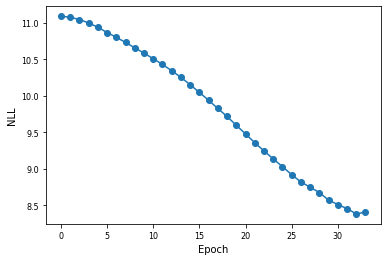

Epoch = 34, Nsteps = 7000, NLL on test data = 8.330819


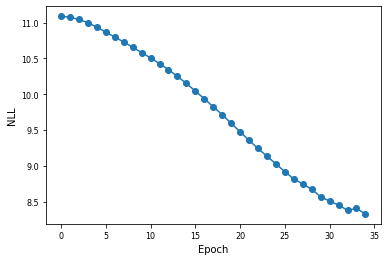

Epoch = 35, Nsteps = 7200, NLL on test data = 8.310542


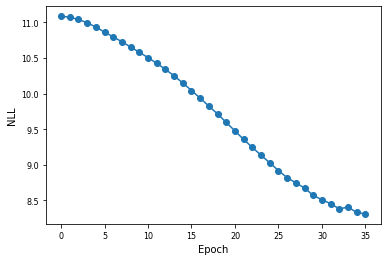

Epoch = 36, Nsteps = 7400, NLL on test data = 8.200775


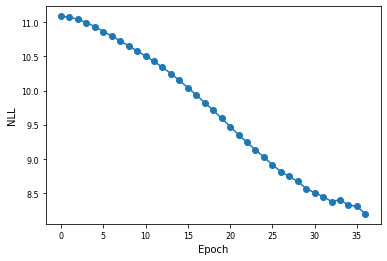

Epoch = 37, Nsteps = 7600, NLL on test data = 8.171002


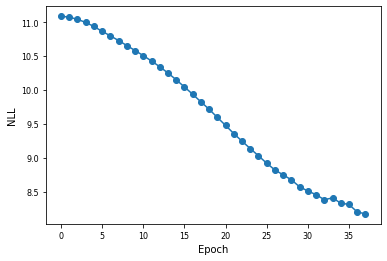

Epoch = 38, Nsteps = 7800, NLL on test data = 8.204288


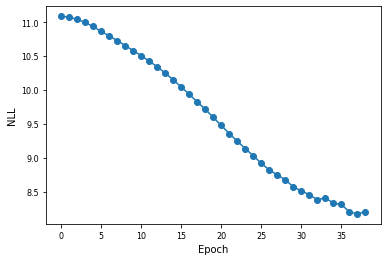

Epoch = 39, Nsteps = 8000, NLL on test data = 8.129185


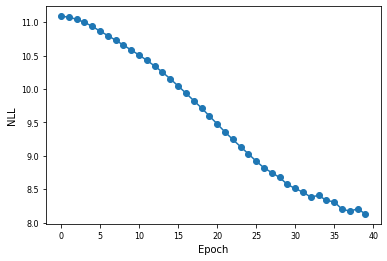

Epoch = 40, Nsteps = 8200, NLL on test data = 8.074510


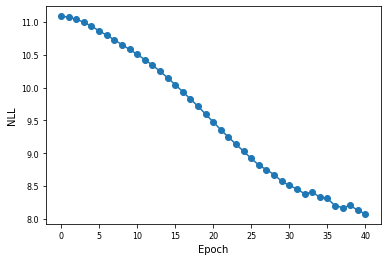

Epoch = 41, Nsteps = 8400, NLL on test data = 8.085333


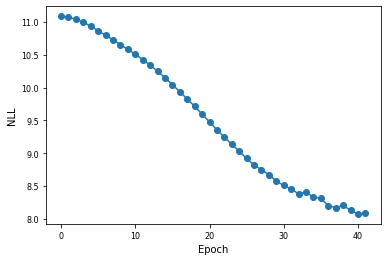

Epoch = 42, Nsteps = 8600, NLL on test data = 8.030786


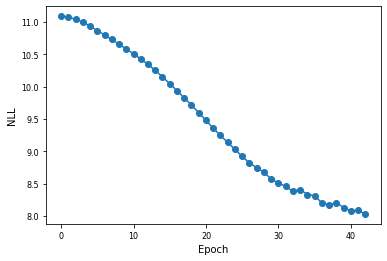

Epoch = 43, Nsteps = 8800, NLL on test data = 8.029109


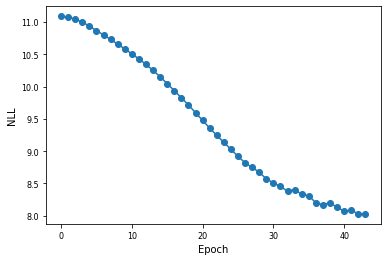

Epoch = 44, Nsteps = 9000, NLL on test data = 8.183849


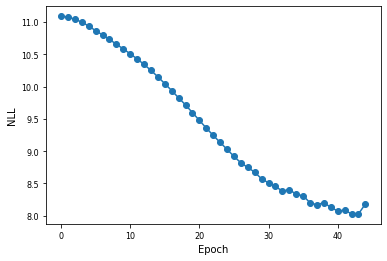

Epoch = 45, Nsteps = 9200, NLL on test data = 7.988088


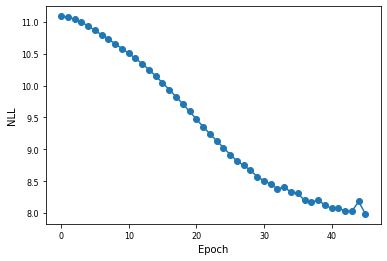

Epoch = 46, Nsteps = 9400, NLL on test data = 7.958272


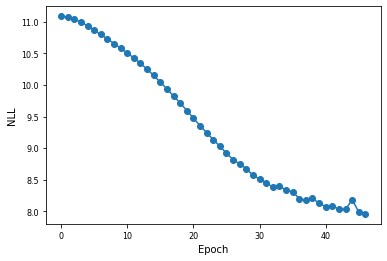

Epoch = 47, Nsteps = 9600, NLL on test data = 8.031330


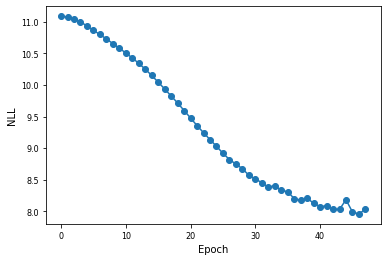

Epoch = 48, Nsteps = 9800, NLL on test data = 7.931894


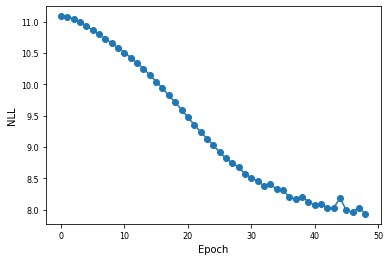

Epoch = 49, Nsteps = 10000, NLL on test data = 8.346170


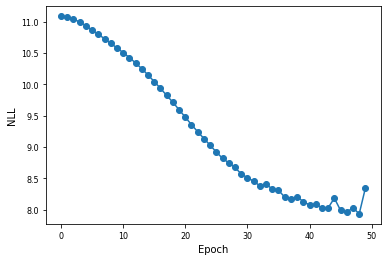

Epoch = 50, Nsteps = 10200, NLL on test data = 7.985491


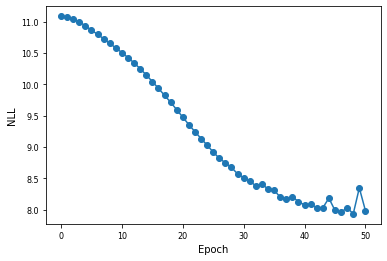

Epoch = 51, Nsteps = 10400, NLL on test data = 7.937026


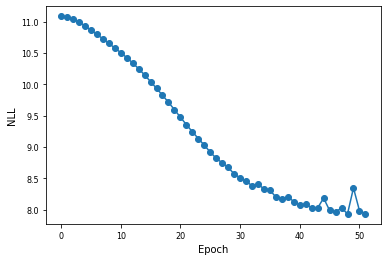

Epoch = 52, Nsteps = 10600, NLL on test data = 7.930396


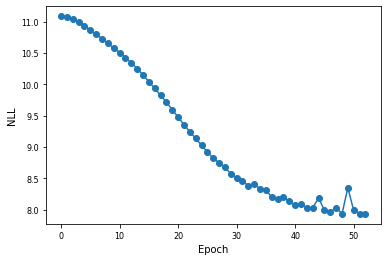

Epoch = 53, Nsteps = 10800, NLL on test data = 7.931648


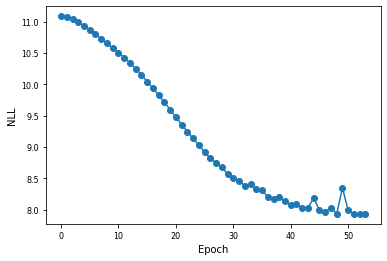

Epoch = 54, Nsteps = 11000, NLL on test data = 7.983744


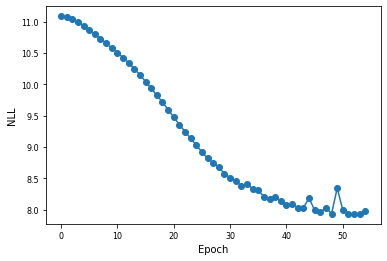

Epoch = 55, Nsteps = 11200, NLL on test data = 7.871855


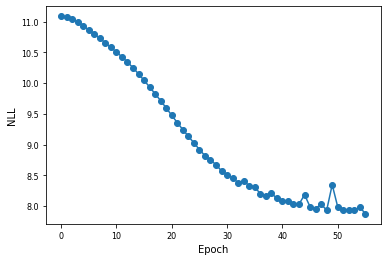

Epoch = 56, Nsteps = 11400, NLL on test data = 7.862791


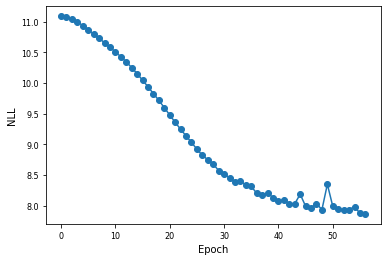

Epoch = 57, Nsteps = 11600, NLL on test data = 7.998757


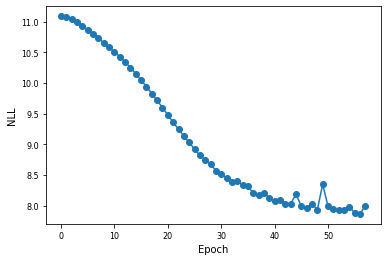

Epoch = 58, Nsteps = 11800, NLL on test data = 7.867720


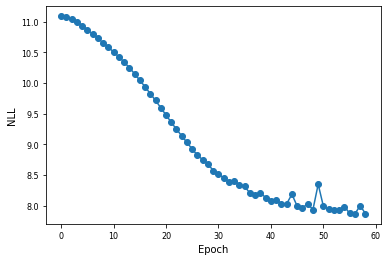

Epoch = 59, Nsteps = 12000, NLL on test data = 7.875216


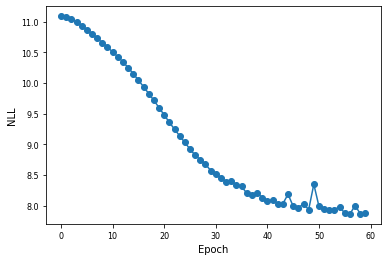

Epoch = 60, Nsteps = 12200, NLL on test data = 7.907735


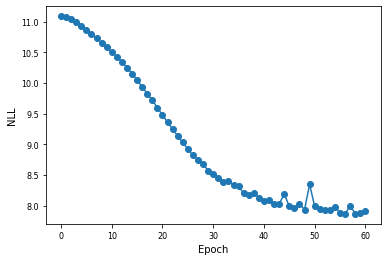

Epoch = 61, Nsteps = 12400, NLL on test data = 7.838719


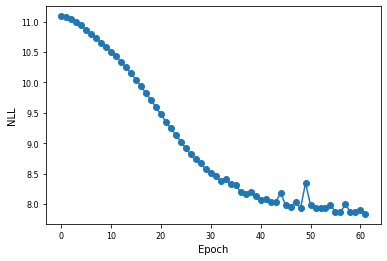

Epoch = 62, Nsteps = 12600, NLL on test data = 7.976598


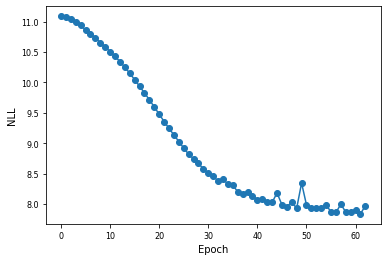

Epoch = 63, Nsteps = 12800, NLL on test data = 7.837438


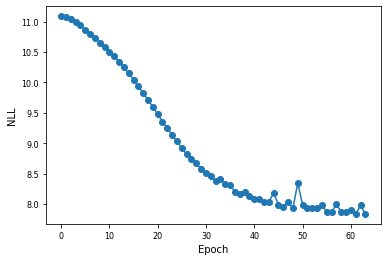

Epoch = 64, Nsteps = 13000, NLL on test data = 7.903354


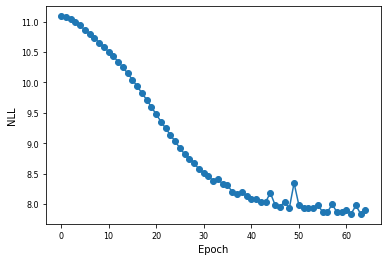

Epoch = 65, Nsteps = 13200, NLL on test data = 8.018951


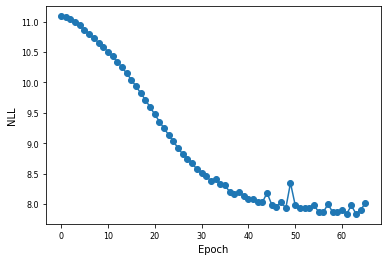

Epoch = 66, Nsteps = 13400, NLL on test data = 7.798222


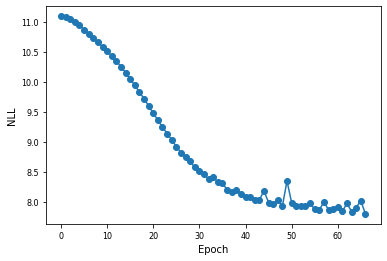

Epoch = 67, Nsteps = 13600, NLL on test data = 7.941950


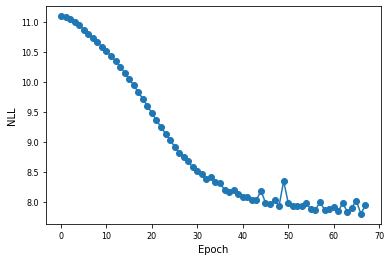

Epoch = 68, Nsteps = 13800, NLL on test data = 7.821413


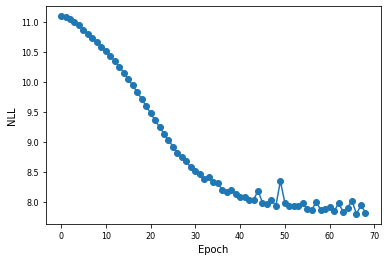

Epoch = 69, Nsteps = 14000, NLL on test data = 7.817249


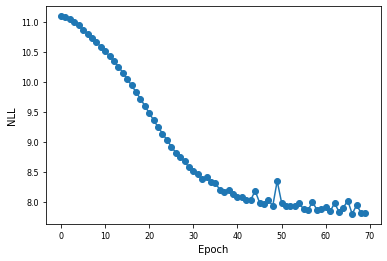

Epoch = 70, Nsteps = 14200, NLL on test data = 7.789997


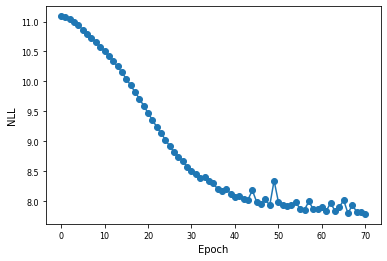

Epoch = 71, Nsteps = 14400, NLL on test data = 7.779923


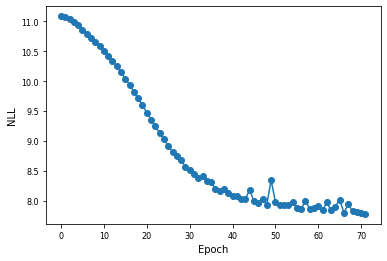

Epoch = 72, Nsteps = 14600, NLL on test data = 7.779163


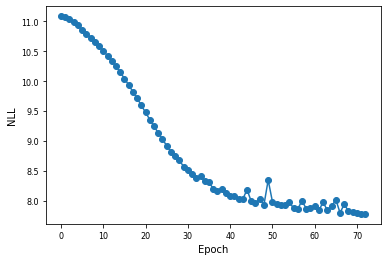

Epoch = 73, Nsteps = 14800, NLL on test data = 7.779668


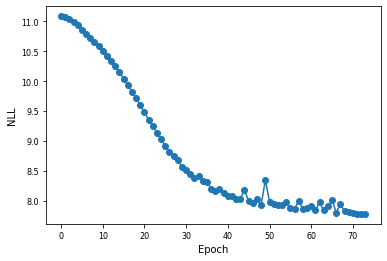

Epoch = 74, Nsteps = 15000, NLL on test data = 7.940934


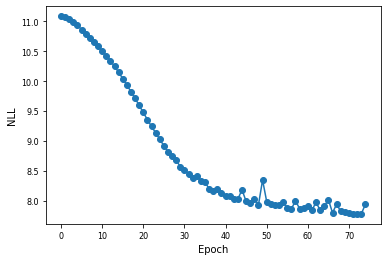

Epoch = 75, Nsteps = 15200, NLL on test data = 7.957430


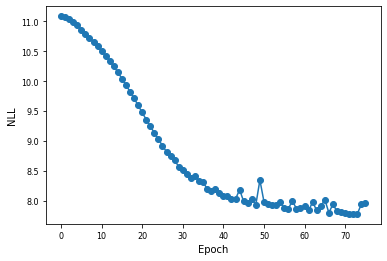

Epoch = 76, Nsteps = 15400, NLL on test data = 7.887741


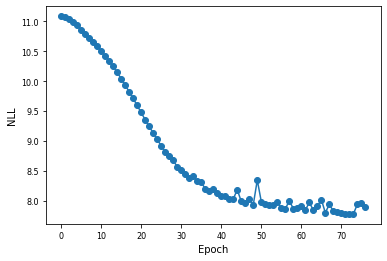

Epoch = 77, Nsteps = 15600, NLL on test data = 7.952425


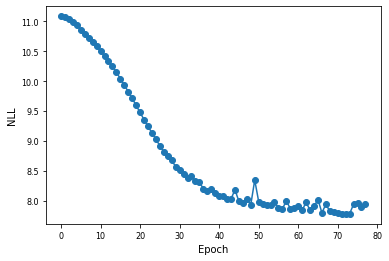

Epoch = 78, Nsteps = 15800, NLL on test data = 7.877713


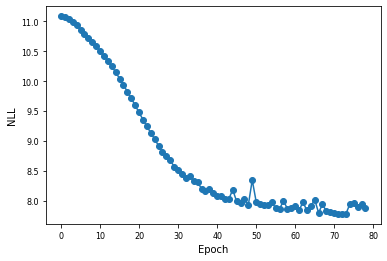

Epoch = 79, Nsteps = 16000, NLL on test data = 7.766841


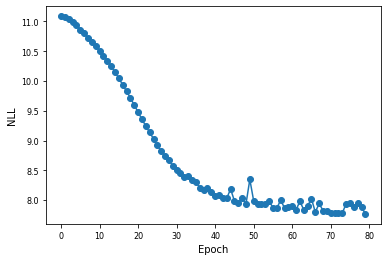

Epoch = 80, Nsteps = 16200, NLL on test data = 7.829048


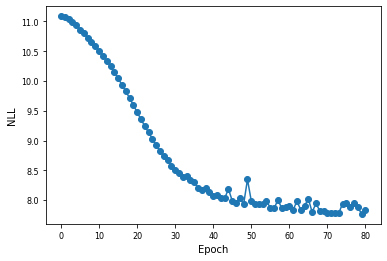

Epoch = 81, Nsteps = 16400, NLL on test data = 7.775377


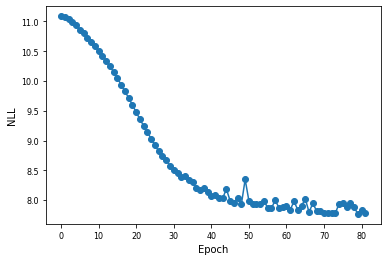

Epoch = 82, Nsteps = 16600, NLL on test data = 7.765326


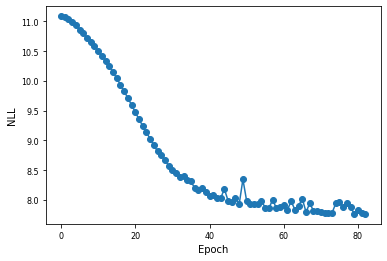

Epoch = 83, Nsteps = 16800, NLL on test data = 8.052563


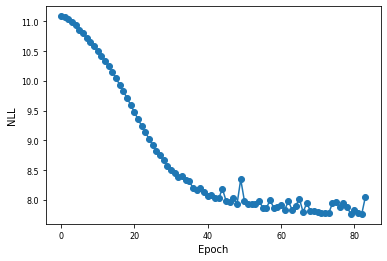

Epoch = 84, Nsteps = 17000, NLL on test data = 7.793619


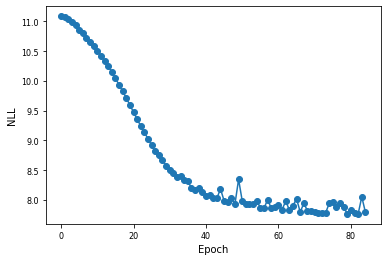

Epoch = 85, Nsteps = 17200, NLL on test data = 7.854338


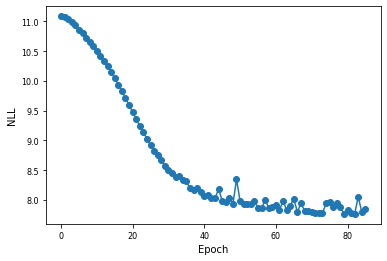

Epoch = 86, Nsteps = 17400, NLL on test data = 7.741035


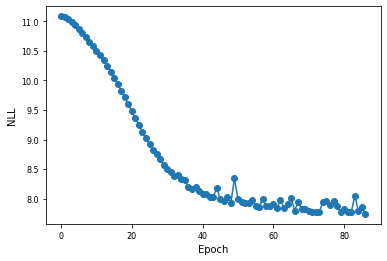

Epoch = 87, Nsteps = 17600, NLL on test data = 7.736526


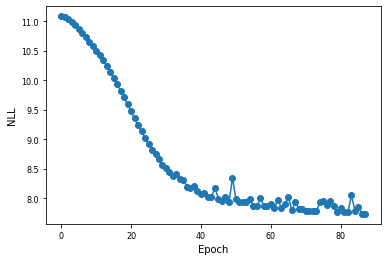

Epoch = 88, Nsteps = 17800, NLL on test data = 7.749679


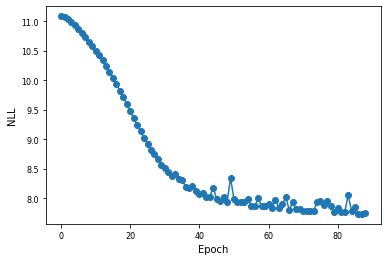

Epoch = 89, Nsteps = 18000, NLL on test data = 7.862000


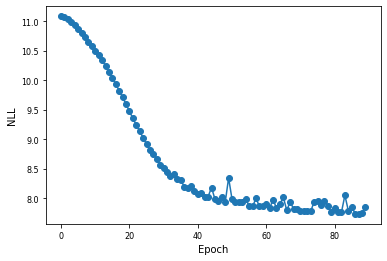

Epoch = 90, Nsteps = 18200, NLL on test data = 7.728685


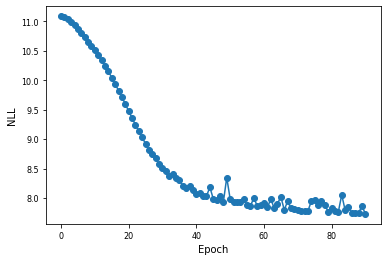

Epoch = 91, Nsteps = 18400, NLL on test data = 7.801071


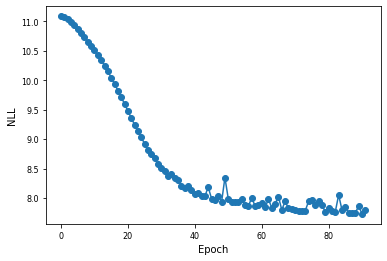

Epoch = 92, Nsteps = 18600, NLL on test data = 7.848477


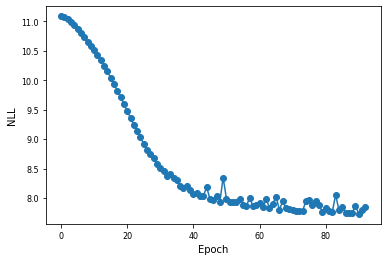

Epoch = 93, Nsteps = 18800, NLL on test data = 8.039905


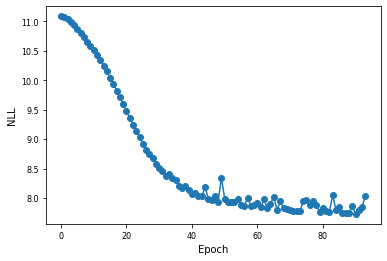

Epoch = 94, Nsteps = 19000, NLL on test data = 7.729198


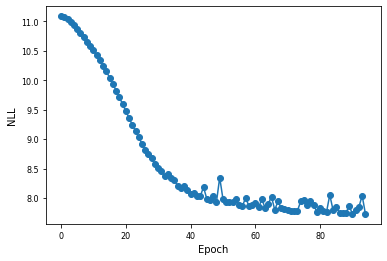

Epoch = 95, Nsteps = 19200, NLL on test data = 7.767335


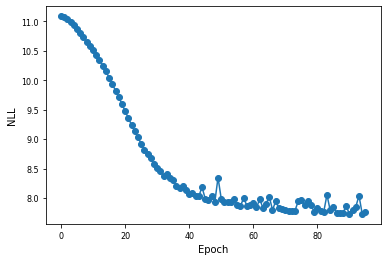

Epoch = 96, Nsteps = 19400, NLL on test data = 7.838644


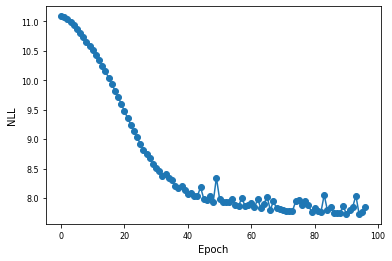

Epoch = 97, Nsteps = 19600, NLL on test data = 7.713982


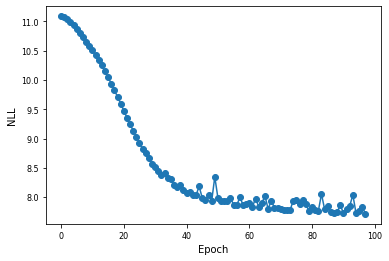

Epoch = 98, Nsteps = 19800, NLL on test data = 7.725469


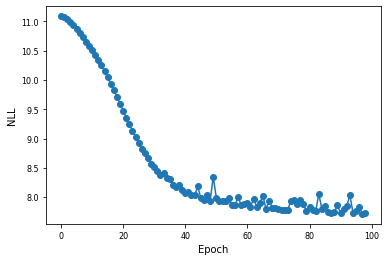

Epoch = 99, Nsteps = 20000, NLL on test data = 7.709153


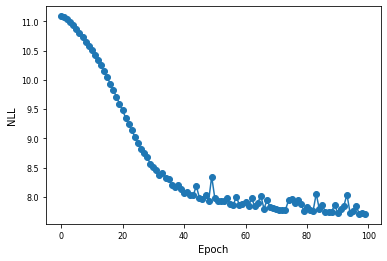

Epoch = 0, Nsteps = 200, NLL on test data = 11.091339


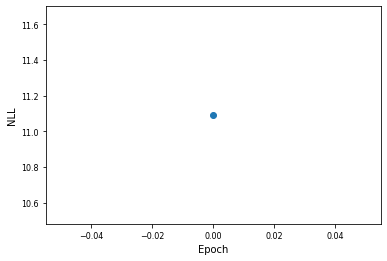

Epoch = 1, Nsteps = 400, NLL on test data = 11.088981


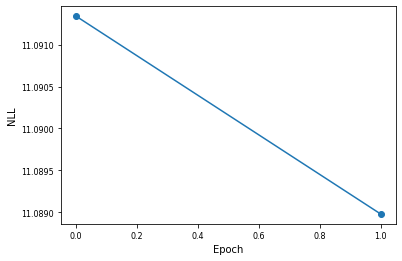

Epoch = 2, Nsteps = 600, NLL on test data = 11.078564


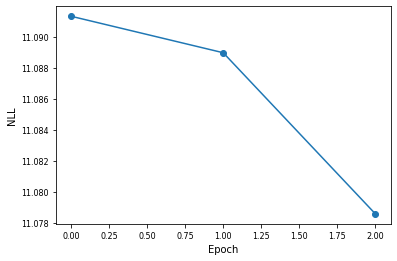

Epoch = 3, Nsteps = 800, NLL on test data = 11.067524


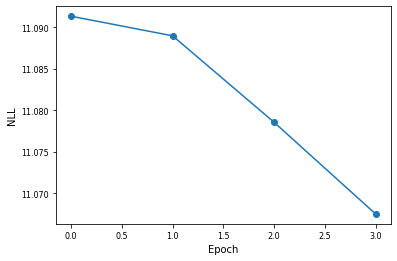

Epoch = 4, Nsteps = 1000, NLL on test data = 11.042044


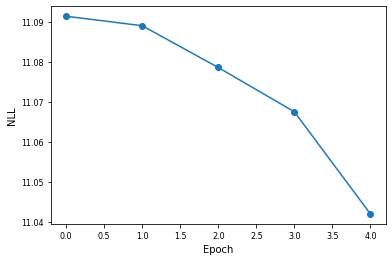

Epoch = 5, Nsteps = 1200, NLL on test data = 11.002065


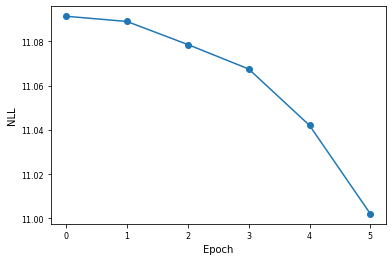

Epoch = 6, Nsteps = 1400, NLL on test data = 10.961370


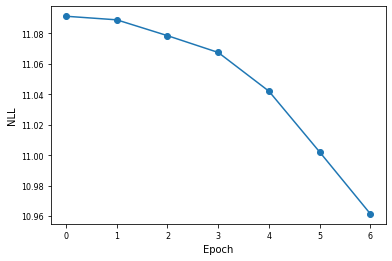

Epoch = 7, Nsteps = 1600, NLL on test data = 10.910123


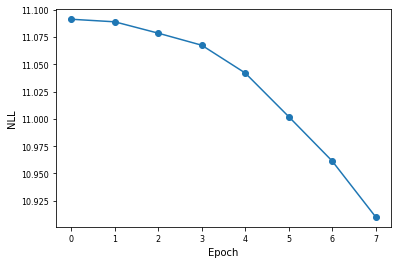

Epoch = 8, Nsteps = 1800, NLL on test data = 10.859100


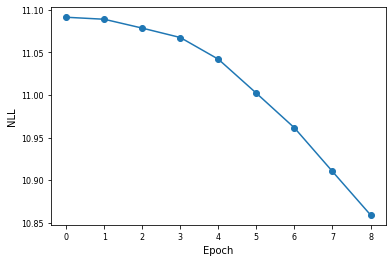

Epoch = 9, Nsteps = 2000, NLL on test data = 10.814035


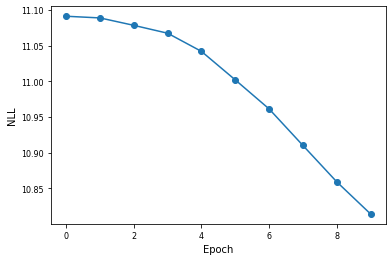

Epoch = 10, Nsteps = 2200, NLL on test data = 10.769973


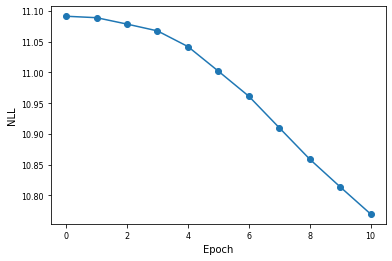

Epoch = 11, Nsteps = 2400, NLL on test data = 10.723287


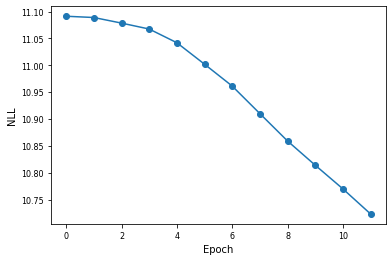

Epoch = 12, Nsteps = 2600, NLL on test data = 10.682064


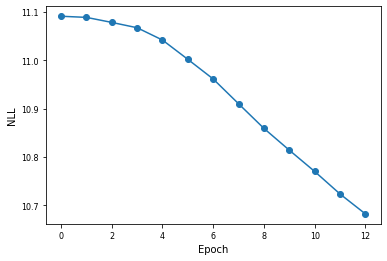

Epoch = 13, Nsteps = 2800, NLL on test data = 10.632463


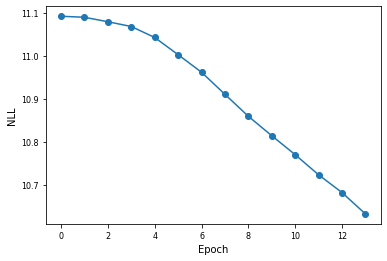

Epoch = 14, Nsteps = 3000, NLL on test data = 10.580367


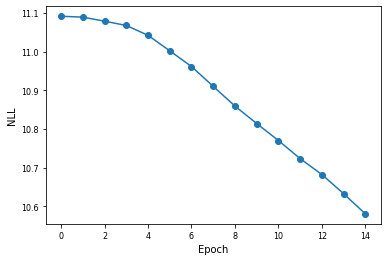

Epoch = 15, Nsteps = 3200, NLL on test data = 10.526953


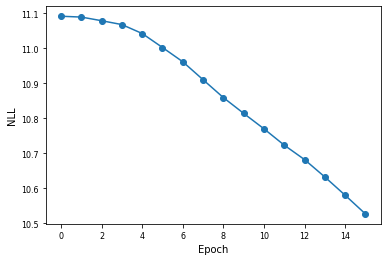

Epoch = 16, Nsteps = 3400, NLL on test data = 10.469783


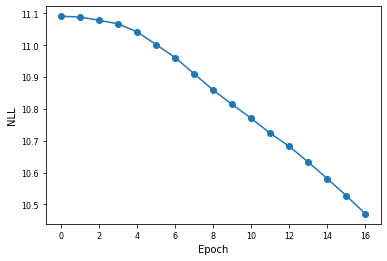

Epoch = 17, Nsteps = 3600, NLL on test data = 10.409096


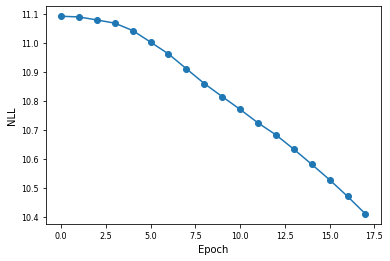

Epoch = 18, Nsteps = 3800, NLL on test data = 10.343892


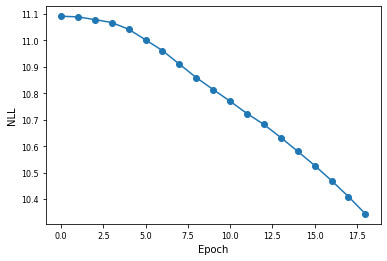

Epoch = 19, Nsteps = 4000, NLL on test data = 10.275410


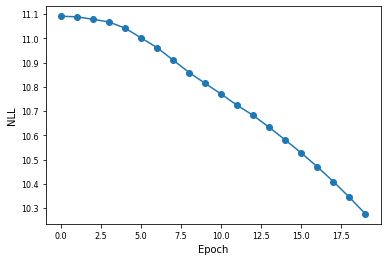

Epoch = 20, Nsteps = 4200, NLL on test data = 10.206576


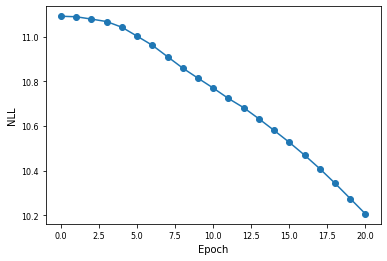

Epoch = 21, Nsteps = 4400, NLL on test data = 10.131616


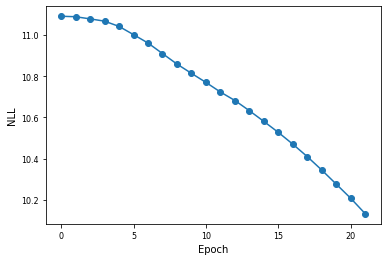

Epoch = 22, Nsteps = 4600, NLL on test data = 10.054820


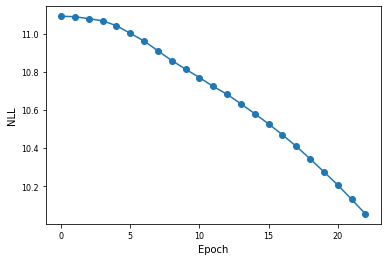

Epoch = 23, Nsteps = 4800, NLL on test data = 9.979096


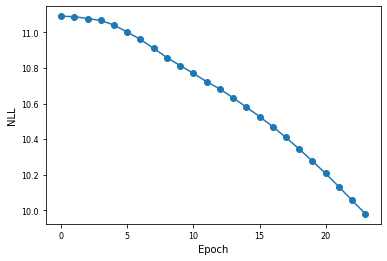

Epoch = 24, Nsteps = 5000, NLL on test data = 9.900782


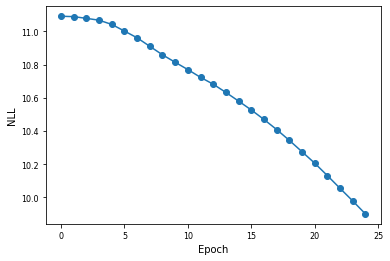

Epoch = 25, Nsteps = 5200, NLL on test data = 9.821756


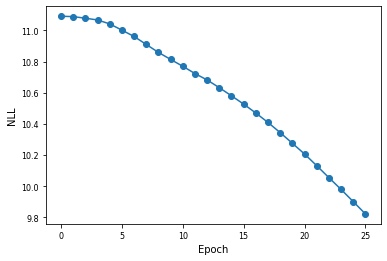

Epoch = 26, Nsteps = 5400, NLL on test data = 9.747268


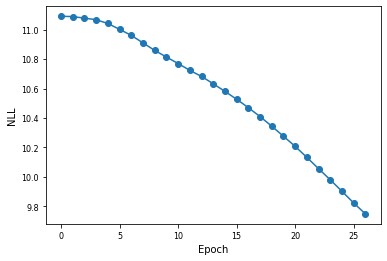

Epoch = 27, Nsteps = 5600, NLL on test data = 9.673802


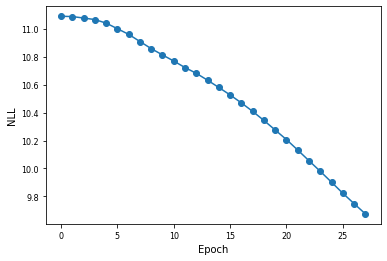

Epoch = 28, Nsteps = 5800, NLL on test data = 9.599519


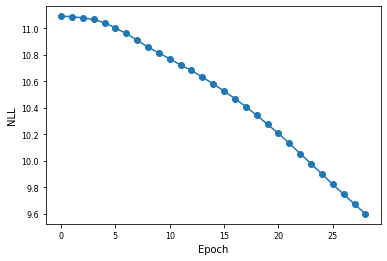

Epoch = 29, Nsteps = 6000, NLL on test data = 9.533838


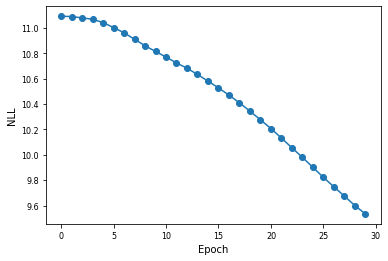

Epoch = 30, Nsteps = 6200, NLL on test data = 9.461557


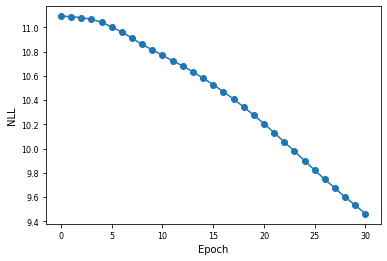

Epoch = 31, Nsteps = 6400, NLL on test data = 9.397496


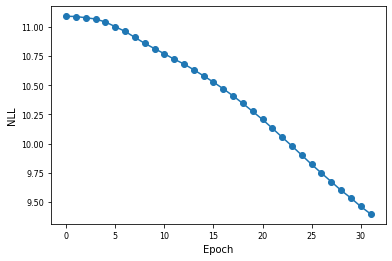

Epoch = 32, Nsteps = 6600, NLL on test data = 9.339003


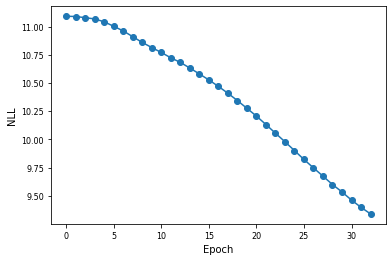

Epoch = 33, Nsteps = 6800, NLL on test data = 9.284798


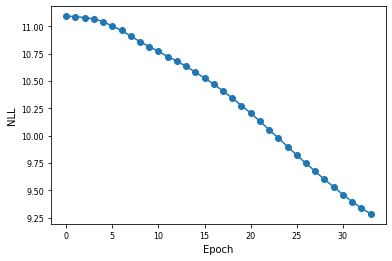

Epoch = 34, Nsteps = 7000, NLL on test data = 9.241544


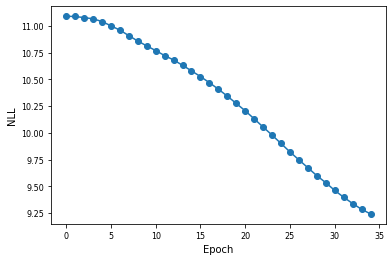

Epoch = 35, Nsteps = 7200, NLL on test data = 9.190601


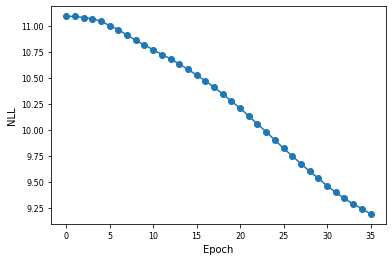

Epoch = 36, Nsteps = 7400, NLL on test data = 9.154416


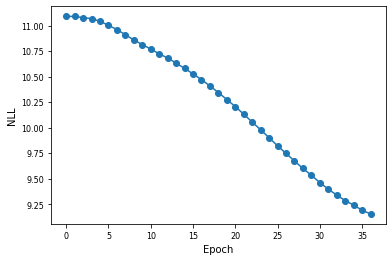

Epoch = 37, Nsteps = 7600, NLL on test data = 9.110241


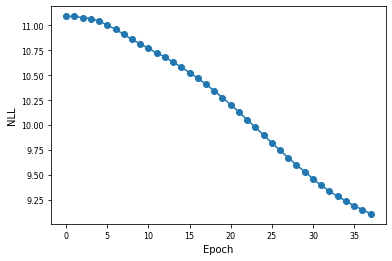

Epoch = 38, Nsteps = 7800, NLL on test data = 9.068723


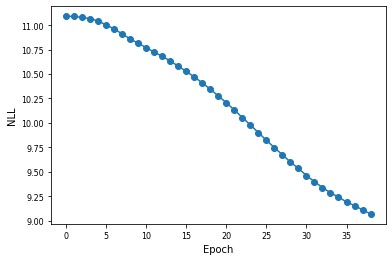

Epoch = 39, Nsteps = 8000, NLL on test data = 9.049833


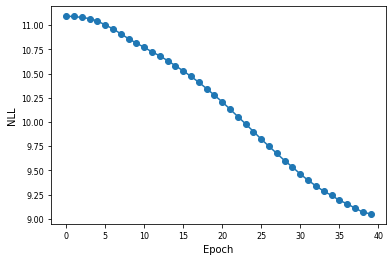

Epoch = 40, Nsteps = 8200, NLL on test data = 9.009896


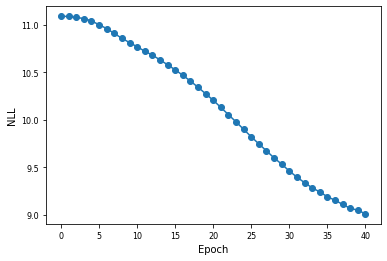

Epoch = 41, Nsteps = 8400, NLL on test data = 9.022408


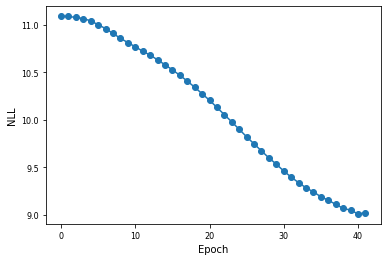

Epoch = 42, Nsteps = 8600, NLL on test data = 8.961198


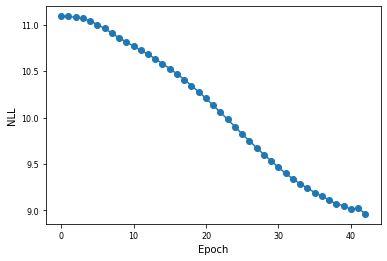

Epoch = 43, Nsteps = 8800, NLL on test data = 8.997132


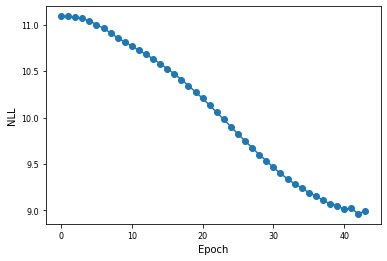

Epoch = 44, Nsteps = 9000, NLL on test data = 8.935900


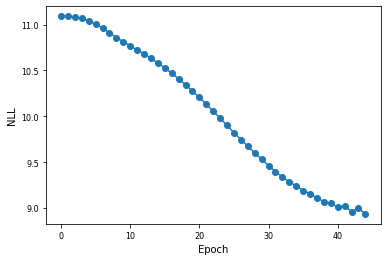

Epoch = 45, Nsteps = 9200, NLL on test data = 8.916859


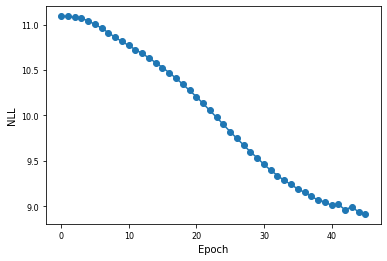

Epoch = 46, Nsteps = 9400, NLL on test data = 8.882703


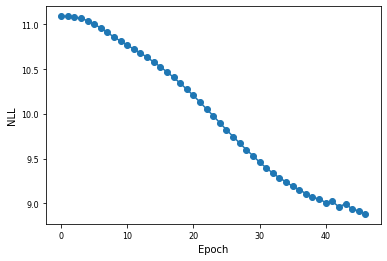

Epoch = 47, Nsteps = 9600, NLL on test data = 8.870273


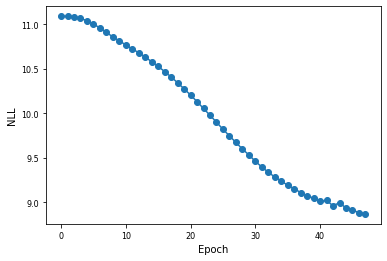

Epoch = 48, Nsteps = 9800, NLL on test data = 8.852168


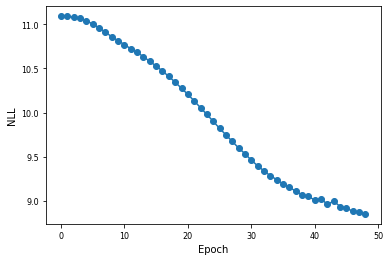

Epoch = 49, Nsteps = 10000, NLL on test data = 8.873667


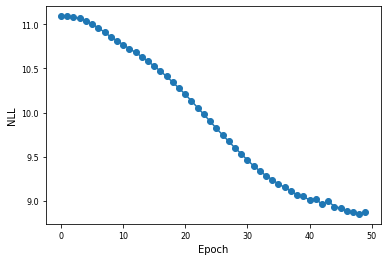

Epoch = 50, Nsteps = 10200, NLL on test data = 8.835207


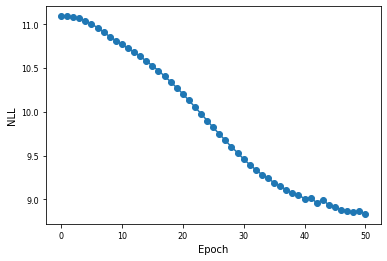

Epoch = 51, Nsteps = 10400, NLL on test data = 8.873822


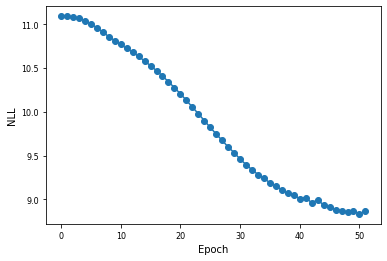

Epoch = 52, Nsteps = 10600, NLL on test data = 8.815378


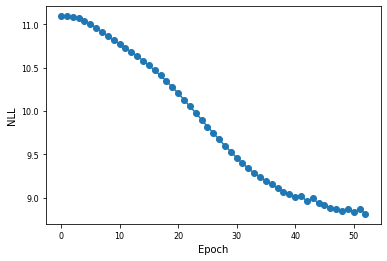

Epoch = 53, Nsteps = 10800, NLL on test data = 8.822951


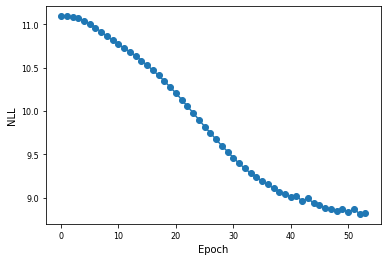

Epoch = 54, Nsteps = 11000, NLL on test data = 8.791661


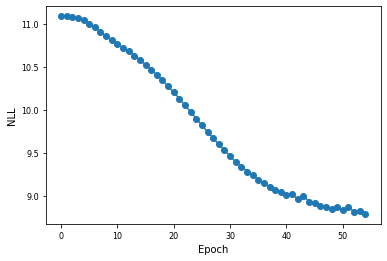

Epoch = 55, Nsteps = 11200, NLL on test data = 8.782333


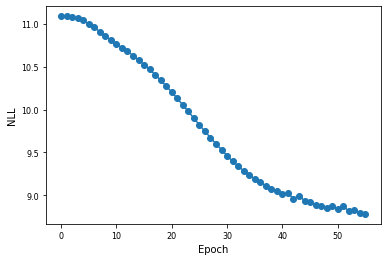

Epoch = 56, Nsteps = 11400, NLL on test data = 8.779759


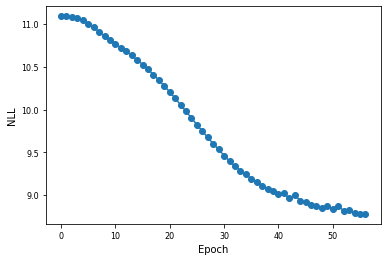

Epoch = 57, Nsteps = 11600, NLL on test data = 8.780190


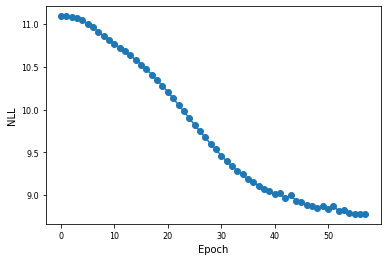

Epoch = 58, Nsteps = 11800, NLL on test data = 8.763948


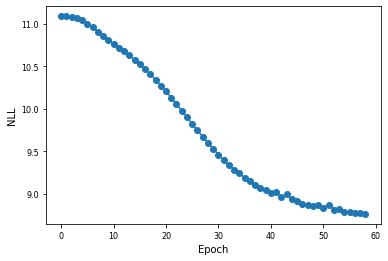

Epoch = 59, Nsteps = 12000, NLL on test data = 8.760771


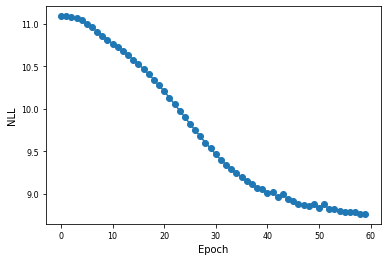

Epoch = 60, Nsteps = 12200, NLL on test data = 8.760721


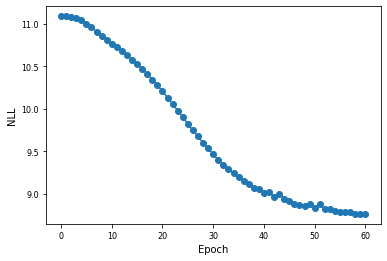

Epoch = 61, Nsteps = 12400, NLL on test data = 8.743584


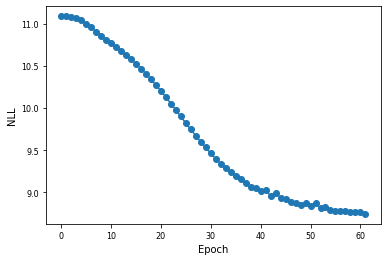

Epoch = 62, Nsteps = 12600, NLL on test data = 8.763675


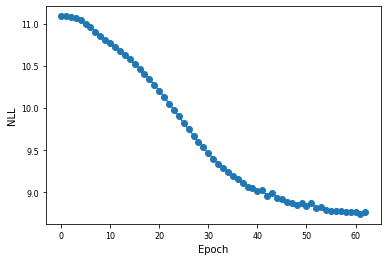

Epoch = 63, Nsteps = 12800, NLL on test data = 8.740098


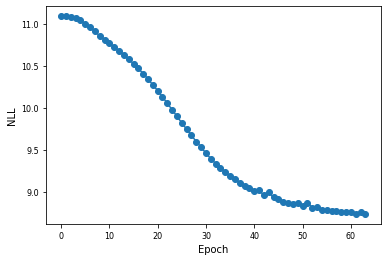

Epoch = 64, Nsteps = 13000, NLL on test data = 8.796593


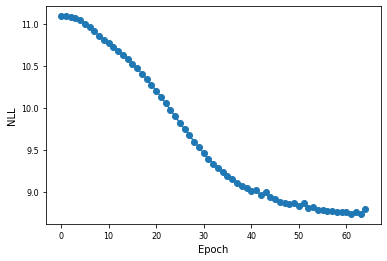

Epoch = 65, Nsteps = 13200, NLL on test data = 8.739326


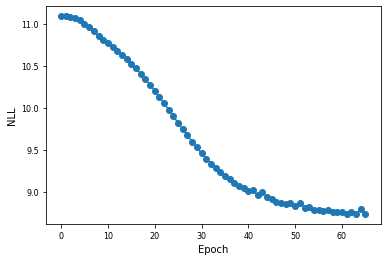

Epoch = 66, Nsteps = 13400, NLL on test data = 8.782512


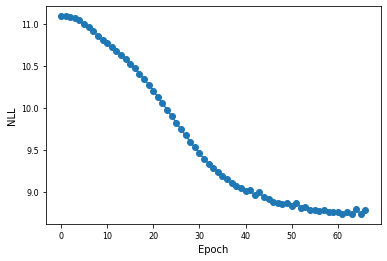

Epoch = 67, Nsteps = 13600, NLL on test data = 8.725635


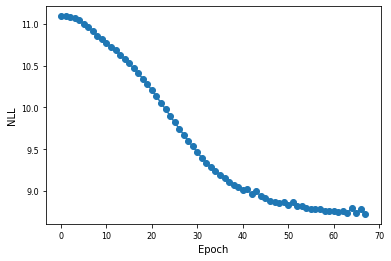

Epoch = 68, Nsteps = 13800, NLL on test data = 8.723881


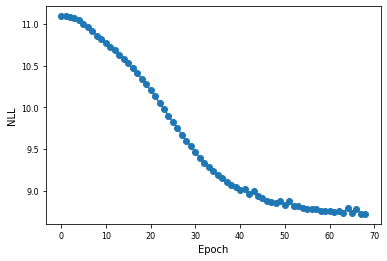

Epoch = 69, Nsteps = 14000, NLL on test data = 8.823117


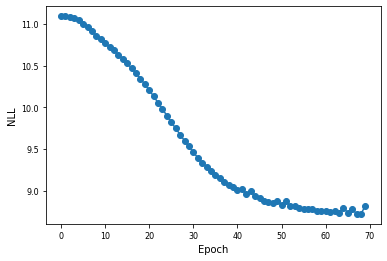

Epoch = 70, Nsteps = 14200, NLL on test data = 8.713939


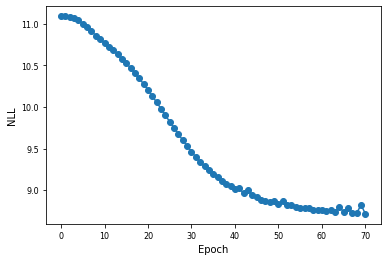

Epoch = 71, Nsteps = 14400, NLL on test data = 8.715319


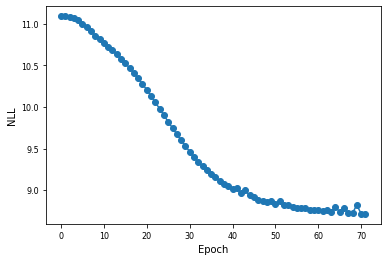

Epoch = 72, Nsteps = 14600, NLL on test data = 8.728492


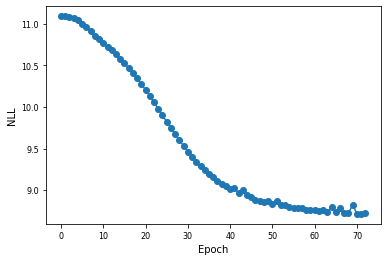

Epoch = 73, Nsteps = 14800, NLL on test data = 8.726567


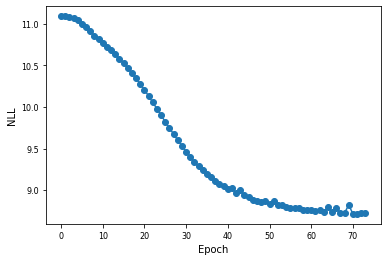

Epoch = 74, Nsteps = 15000, NLL on test data = 8.754509


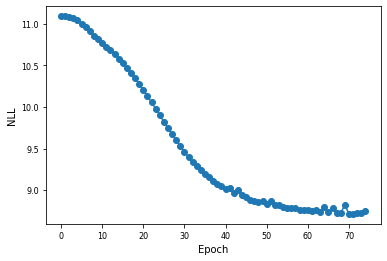

Epoch = 75, Nsteps = 15200, NLL on test data = 8.759870


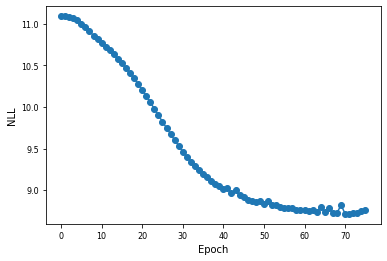

Epoch = 76, Nsteps = 15400, NLL on test data = 8.708617


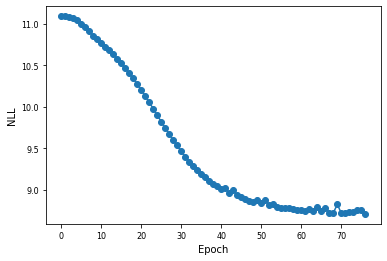

Epoch = 77, Nsteps = 15600, NLL on test data = 8.697088


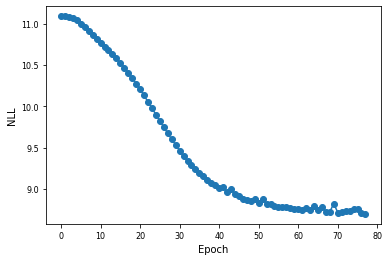

Epoch = 78, Nsteps = 15800, NLL on test data = 8.710129


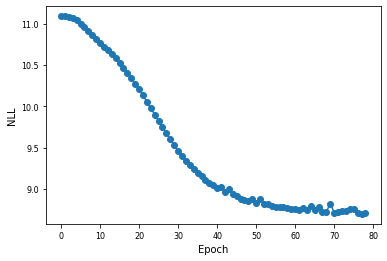

Epoch = 79, Nsteps = 16000, NLL on test data = 8.688054


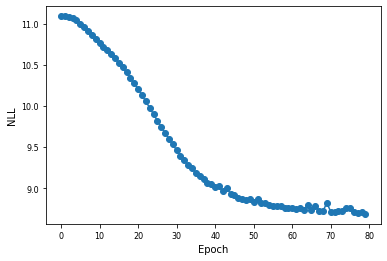

Epoch = 80, Nsteps = 16200, NLL on test data = 8.704752


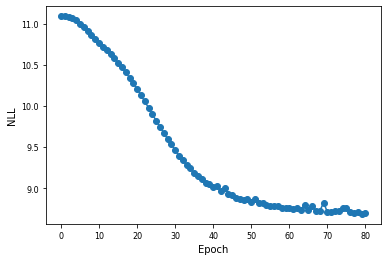

Epoch = 81, Nsteps = 16400, NLL on test data = 8.686919


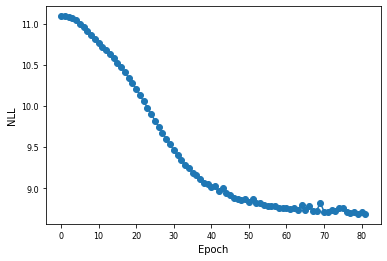

Epoch = 82, Nsteps = 16600, NLL on test data = 8.722113


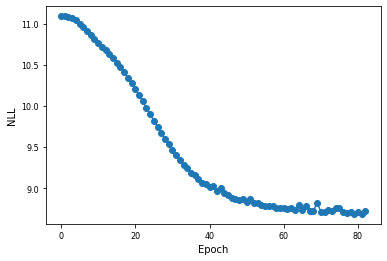

Epoch = 83, Nsteps = 16800, NLL on test data = 8.687629


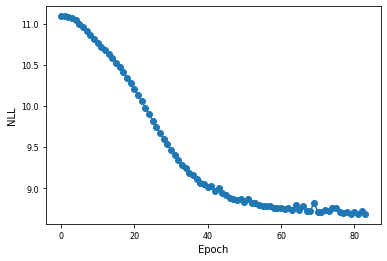

Epoch = 84, Nsteps = 17000, NLL on test data = 8.724351


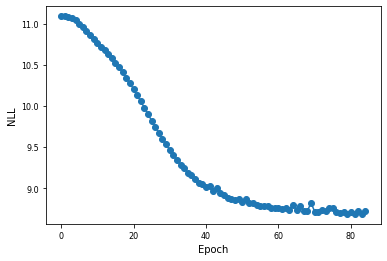

Epoch = 85, Nsteps = 17200, NLL on test data = 8.683228


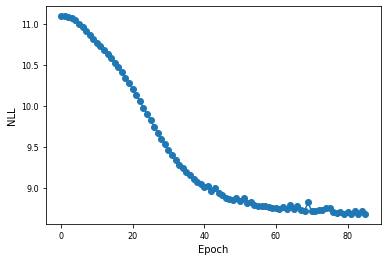

Epoch = 86, Nsteps = 17400, NLL on test data = 8.705638


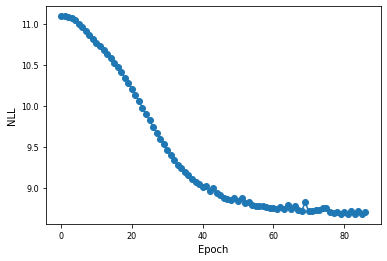

Epoch = 87, Nsteps = 17600, NLL on test data = 8.674007


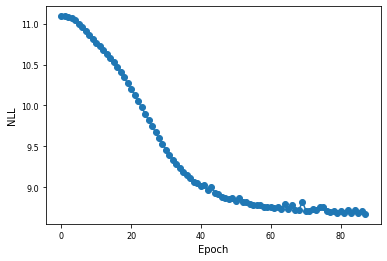

Epoch = 88, Nsteps = 17800, NLL on test data = 8.685307


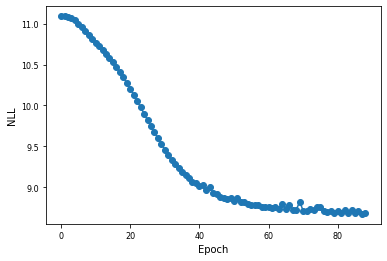

Epoch = 89, Nsteps = 18000, NLL on test data = 8.671775


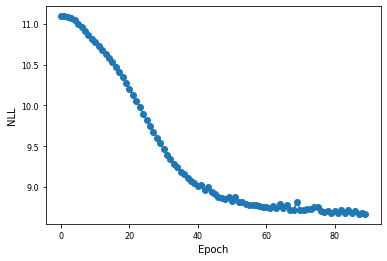

Epoch = 90, Nsteps = 18200, NLL on test data = 8.667063


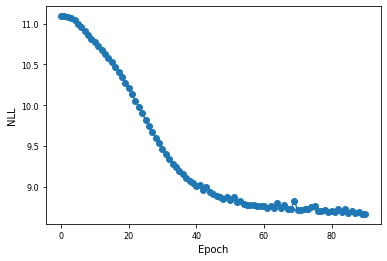

Epoch = 91, Nsteps = 18400, NLL on test data = 8.688575


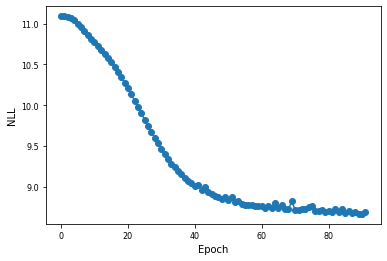

Epoch = 92, Nsteps = 18600, NLL on test data = 8.736800


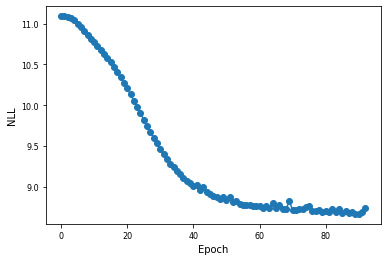

Epoch = 93, Nsteps = 18800, NLL on test data = 8.670064


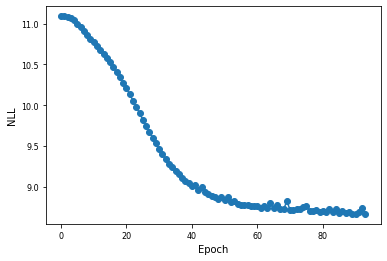

Epoch = 94, Nsteps = 19000, NLL on test data = 8.659148


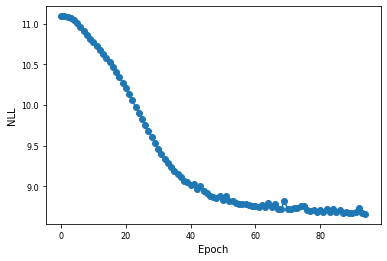

Epoch = 95, Nsteps = 19200, NLL on test data = 8.682553


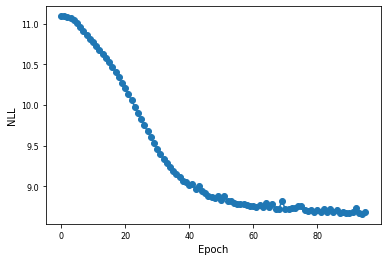

Epoch = 96, Nsteps = 19400, NLL on test data = 8.655368


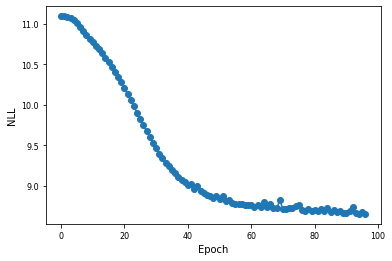

Epoch = 97, Nsteps = 19600, NLL on test data = 8.655371


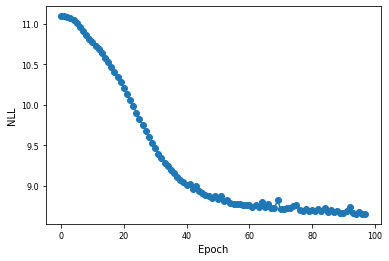

Epoch = 98, Nsteps = 19800, NLL on test data = 8.868922


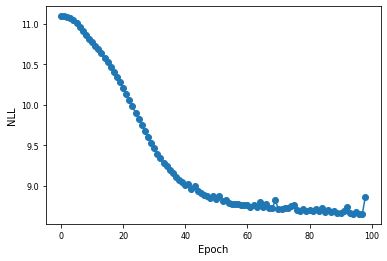

Epoch = 99, Nsteps = 20000, NLL on test data = 8.716414


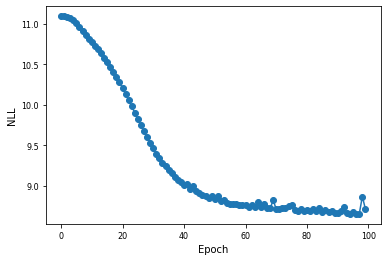

Epoch = 0, Nsteps = 200, NLL on test data = 11.086180


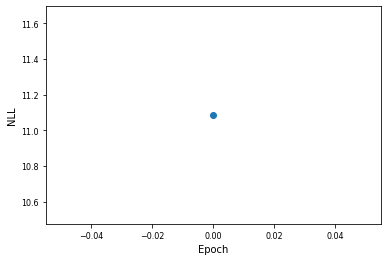

Epoch = 1, Nsteps = 400, NLL on test data = 11.074666


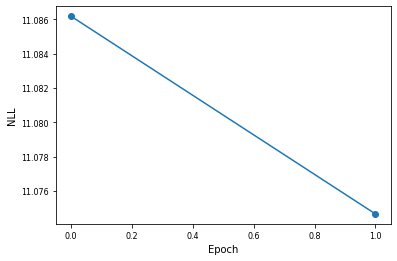

Epoch = 2, Nsteps = 600, NLL on test data = 11.056907


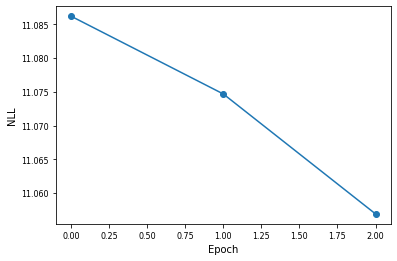

Epoch = 3, Nsteps = 800, NLL on test data = 11.032327


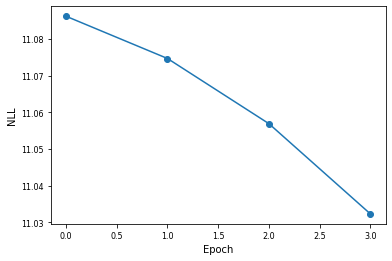

Epoch = 4, Nsteps = 1000, NLL on test data = 10.999078


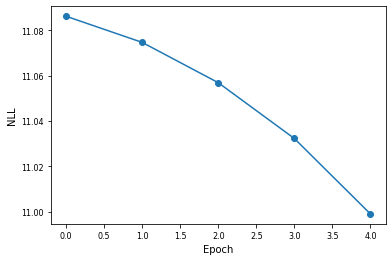

Epoch = 5, Nsteps = 1200, NLL on test data = 10.956484


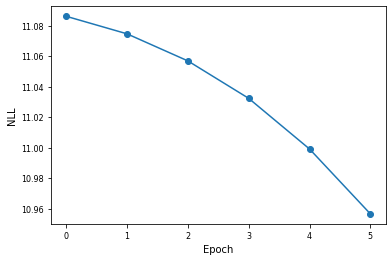

Epoch = 6, Nsteps = 1400, NLL on test data = 10.909845


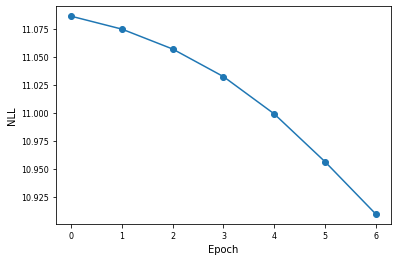

Epoch = 7, Nsteps = 1600, NLL on test data = 10.873119


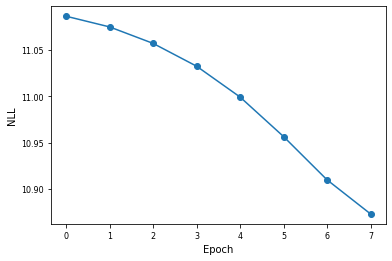

Epoch = 8, Nsteps = 1800, NLL on test data = 10.833390


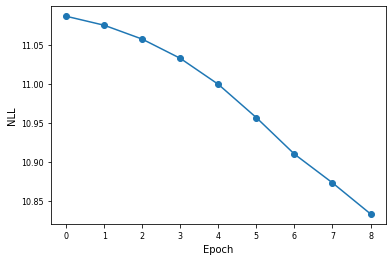

Epoch = 9, Nsteps = 2000, NLL on test data = 10.802452


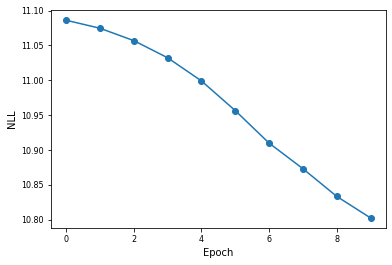

Epoch = 10, Nsteps = 2200, NLL on test data = 10.771815


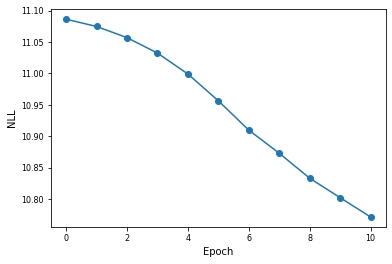

Epoch = 11, Nsteps = 2400, NLL on test data = 10.737095


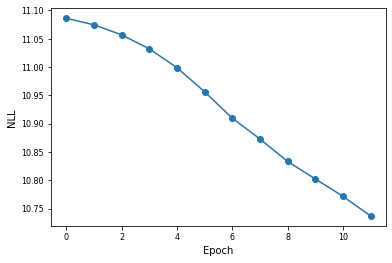

Epoch = 12, Nsteps = 2600, NLL on test data = 10.701188


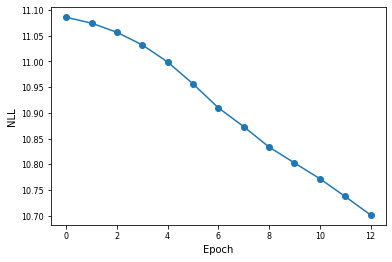

Epoch = 13, Nsteps = 2800, NLL on test data = 10.666585


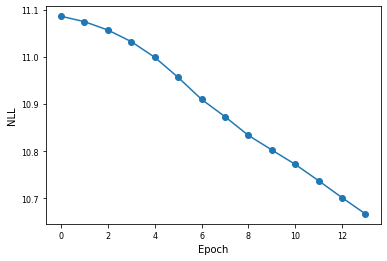

Epoch = 14, Nsteps = 3000, NLL on test data = 10.627276


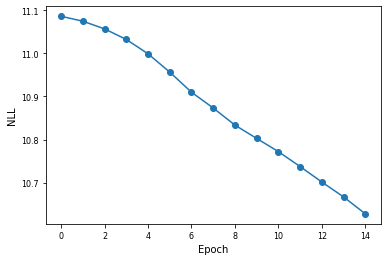

Epoch = 15, Nsteps = 3200, NLL on test data = 10.586724


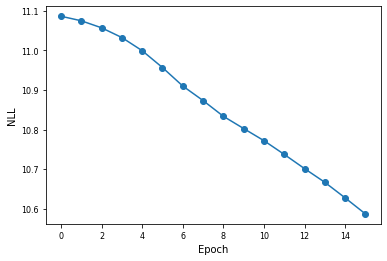

Epoch = 16, Nsteps = 3400, NLL on test data = 10.541159


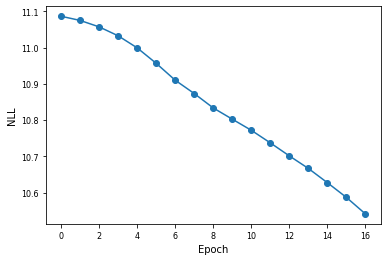

Epoch = 17, Nsteps = 3600, NLL on test data = 10.494134


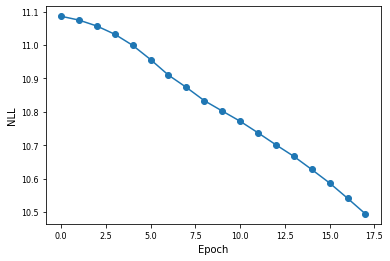

Epoch = 18, Nsteps = 3800, NLL on test data = 10.443736


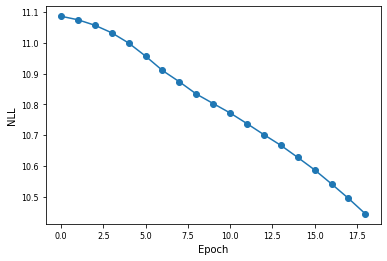

Epoch = 19, Nsteps = 4000, NLL on test data = 10.390505


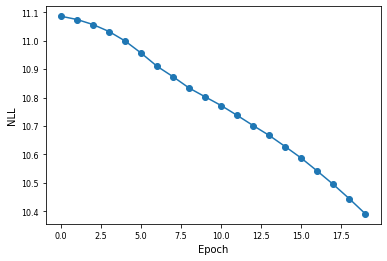

Epoch = 20, Nsteps = 4200, NLL on test data = 10.336894


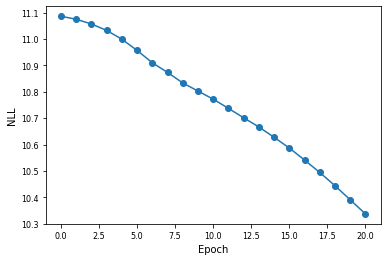

Epoch = 21, Nsteps = 4400, NLL on test data = 10.279508


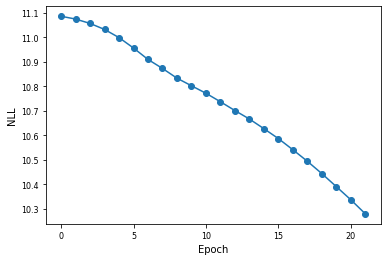

Epoch = 22, Nsteps = 4600, NLL on test data = 10.223273


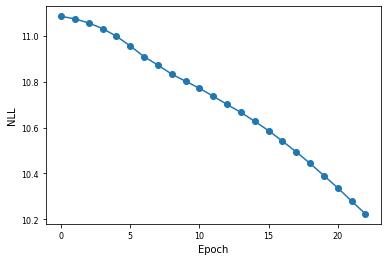

Epoch = 23, Nsteps = 4800, NLL on test data = 10.167708


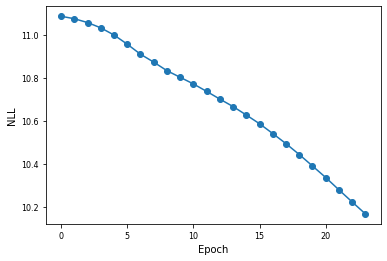

Epoch = 24, Nsteps = 5000, NLL on test data = 10.114913


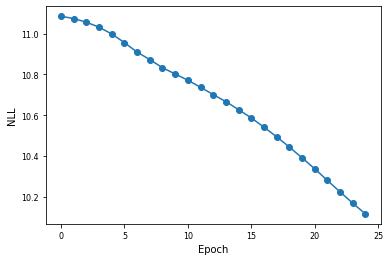

Epoch = 25, Nsteps = 5200, NLL on test data = 10.058864


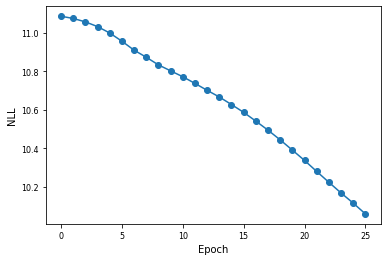

Epoch = 26, Nsteps = 5400, NLL on test data = 10.004176


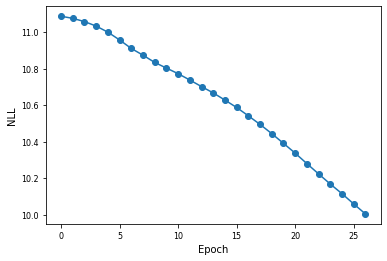

Epoch = 27, Nsteps = 5600, NLL on test data = 9.954307


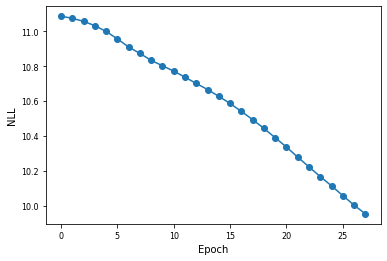

Epoch = 28, Nsteps = 5800, NLL on test data = 9.904403


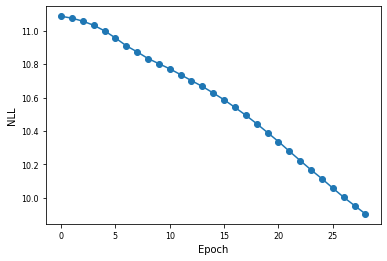

Epoch = 29, Nsteps = 6000, NLL on test data = 9.858997


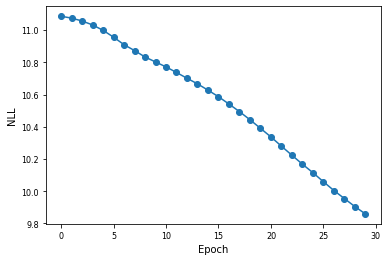

Epoch = 30, Nsteps = 6200, NLL on test data = 9.823080


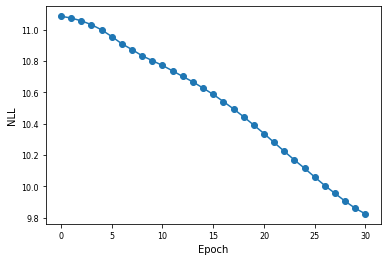

Epoch = 31, Nsteps = 6400, NLL on test data = 9.780346


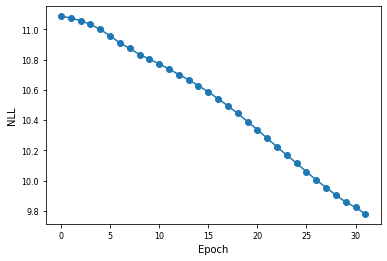

Epoch = 32, Nsteps = 6600, NLL on test data = 9.743053


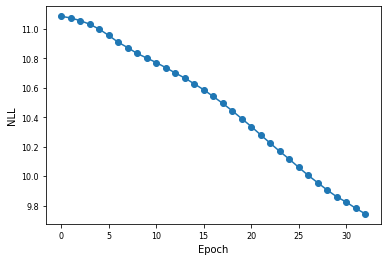

Epoch = 33, Nsteps = 6800, NLL on test data = 9.703842


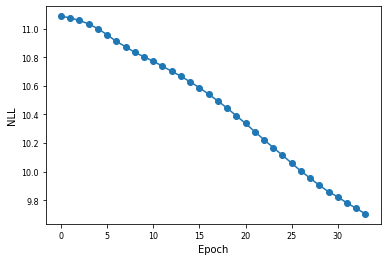

Epoch = 34, Nsteps = 7000, NLL on test data = 9.675280


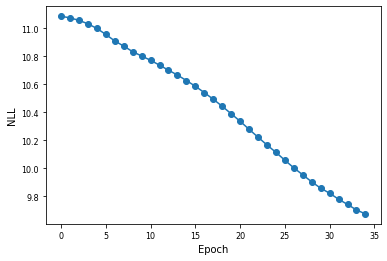

Epoch = 35, Nsteps = 7200, NLL on test data = 9.648934


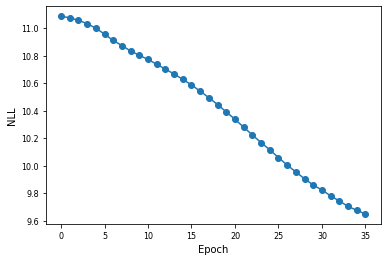

Epoch = 36, Nsteps = 7400, NLL on test data = 9.615102


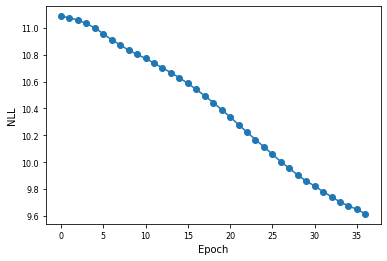

Epoch = 37, Nsteps = 7600, NLL on test data = 9.596621


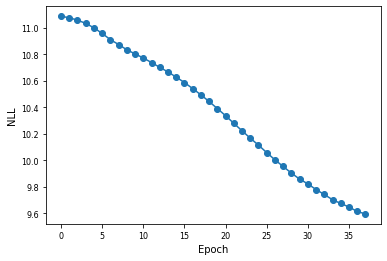

Epoch = 38, Nsteps = 7800, NLL on test data = 9.585519


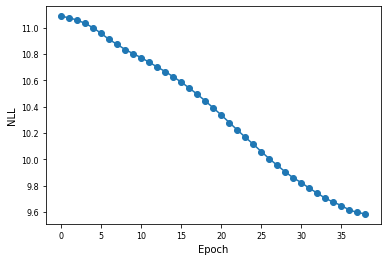

Epoch = 39, Nsteps = 8000, NLL on test data = 9.585117


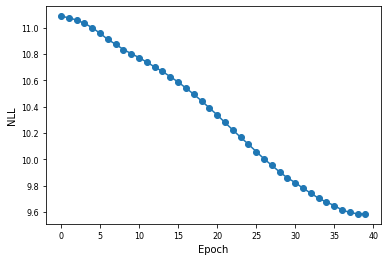

Epoch = 40, Nsteps = 8200, NLL on test data = 9.547557


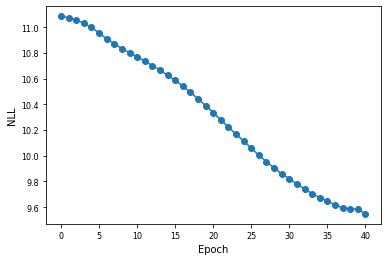

Epoch = 41, Nsteps = 8400, NLL on test data = 9.536605


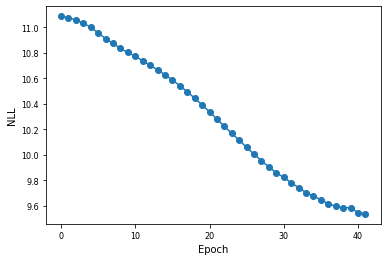

Epoch = 42, Nsteps = 8600, NLL on test data = 9.556278


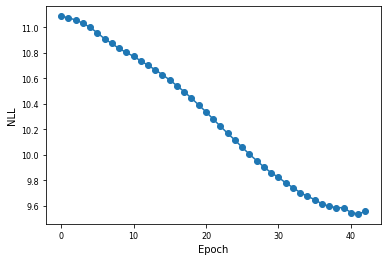

Epoch = 43, Nsteps = 8800, NLL on test data = 9.504198


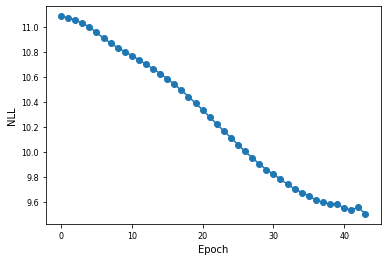

Epoch = 44, Nsteps = 9000, NLL on test data = 9.491060


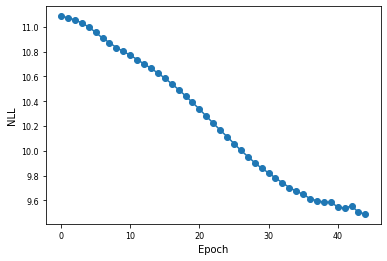

Epoch = 45, Nsteps = 9200, NLL on test data = 9.478942


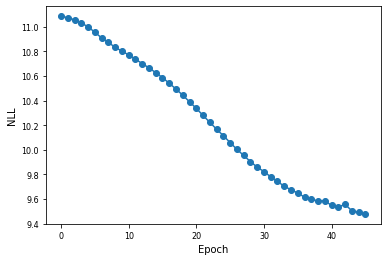

Epoch = 46, Nsteps = 9400, NLL on test data = 9.471808


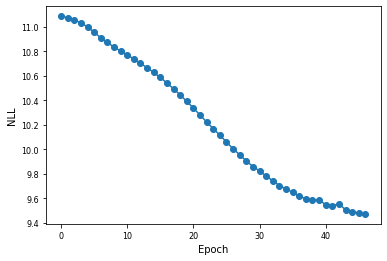

Epoch = 47, Nsteps = 9600, NLL on test data = 9.465102


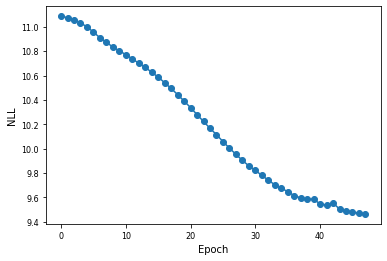

Epoch = 48, Nsteps = 9800, NLL on test data = 9.469760


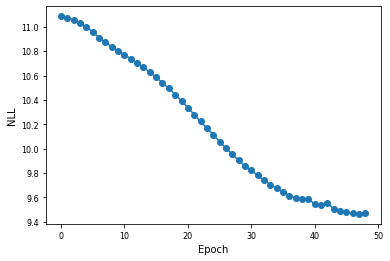

Epoch = 49, Nsteps = 10000, NLL on test data = 9.464896


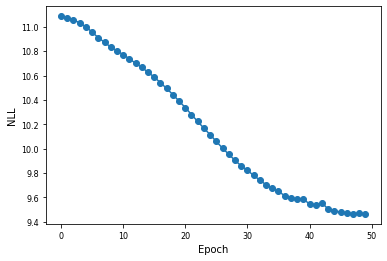

Epoch = 50, Nsteps = 10200, NLL on test data = 9.441008


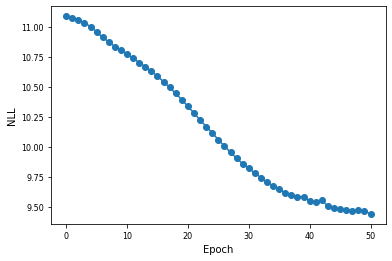

Epoch = 51, Nsteps = 10400, NLL on test data = 9.426511


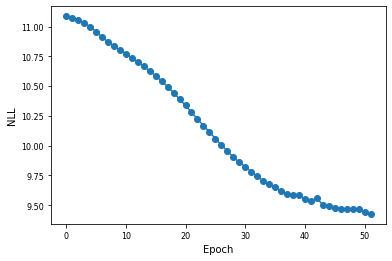

Epoch = 52, Nsteps = 10600, NLL on test data = 9.427046


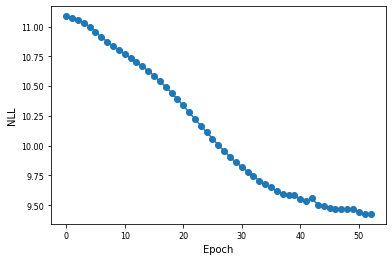

Epoch = 53, Nsteps = 10800, NLL on test data = 9.414357


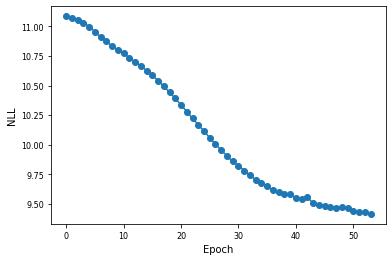

Epoch = 54, Nsteps = 11000, NLL on test data = 9.415768


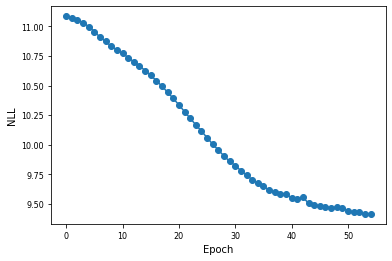

Epoch = 55, Nsteps = 11200, NLL on test data = 9.403463


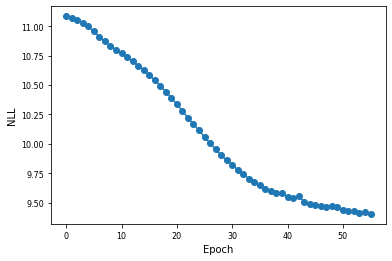

Epoch = 56, Nsteps = 11400, NLL on test data = 9.395544


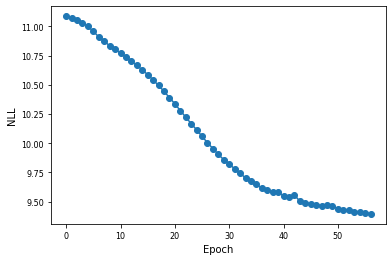

Epoch = 57, Nsteps = 11600, NLL on test data = 9.395660


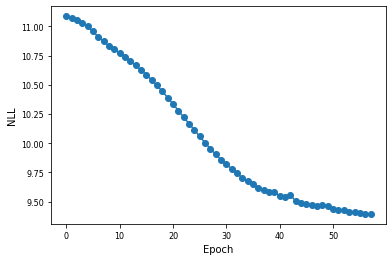

Epoch = 58, Nsteps = 11800, NLL on test data = 9.397956


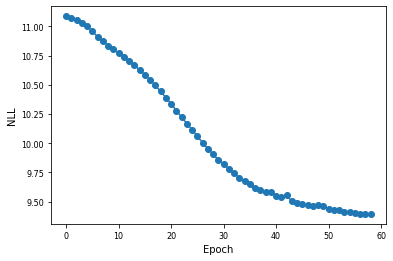

Epoch = 59, Nsteps = 12000, NLL on test data = 9.396812


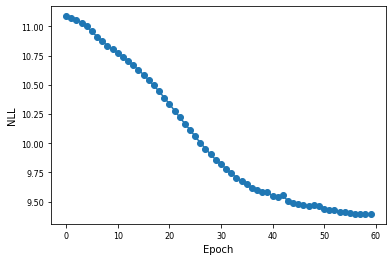

Epoch = 60, Nsteps = 12200, NLL on test data = 9.382327


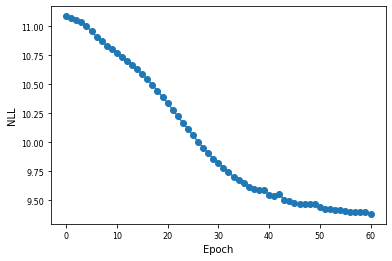

Epoch = 61, Nsteps = 12400, NLL on test data = 9.382099


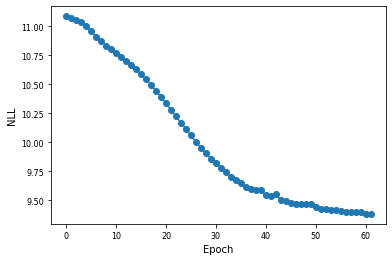

Epoch = 62, Nsteps = 12600, NLL on test data = 9.424978


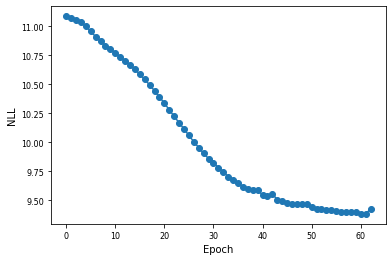

Epoch = 63, Nsteps = 12800, NLL on test data = 9.386464


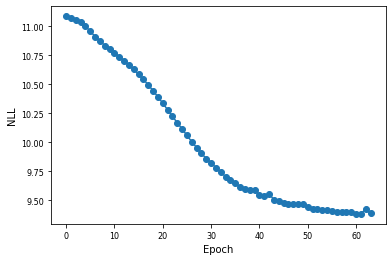

Epoch = 64, Nsteps = 13000, NLL on test data = 9.364273


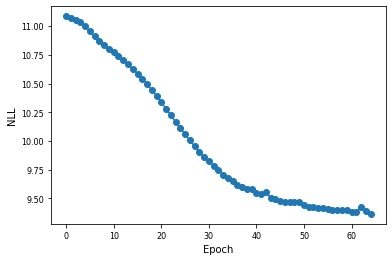

Epoch = 65, Nsteps = 13200, NLL on test data = 9.355744


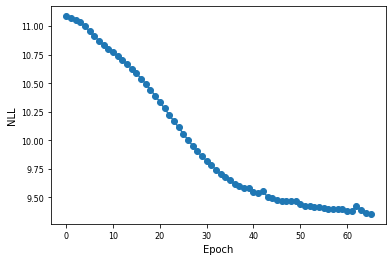

Epoch = 66, Nsteps = 13400, NLL on test data = 9.353314


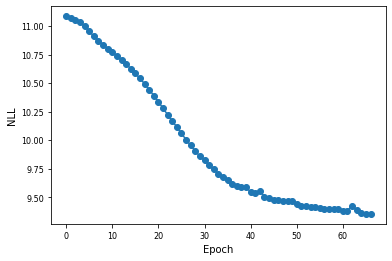

Epoch = 67, Nsteps = 13600, NLL on test data = 9.357914


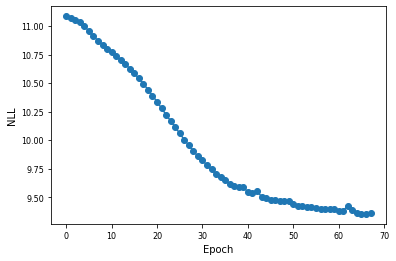

Epoch = 68, Nsteps = 13800, NLL on test data = 9.390604


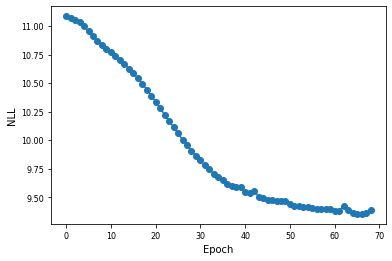

Epoch = 69, Nsteps = 14000, NLL on test data = 9.398816


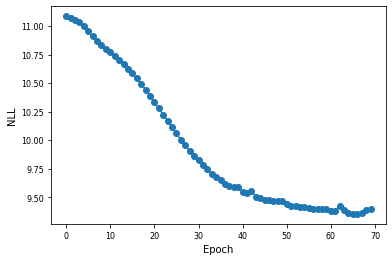

Epoch = 70, Nsteps = 14200, NLL on test data = 9.351047


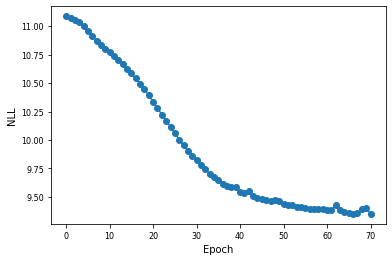

Epoch = 71, Nsteps = 14400, NLL on test data = 9.339743


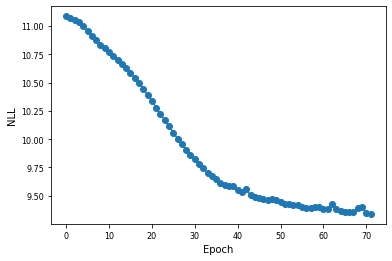

Epoch = 72, Nsteps = 14600, NLL on test data = 9.344480


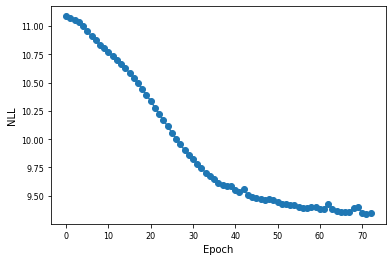

Epoch = 73, Nsteps = 14800, NLL on test data = 9.337836


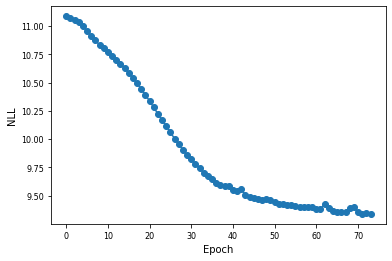

Epoch = 74, Nsteps = 15000, NLL on test data = 9.331748


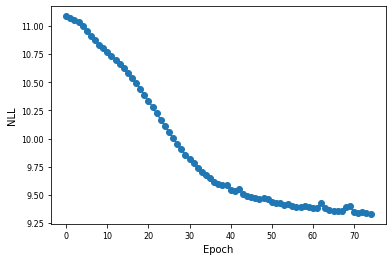

Epoch = 75, Nsteps = 15200, NLL on test data = 9.329796


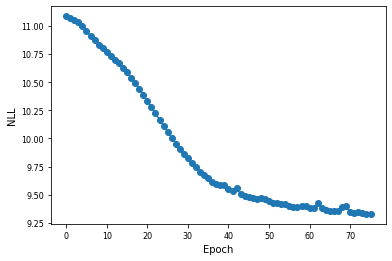

Epoch = 76, Nsteps = 15400, NLL on test data = 9.364767


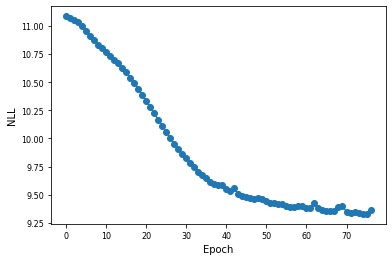

Epoch = 77, Nsteps = 15600, NLL on test data = 9.324676


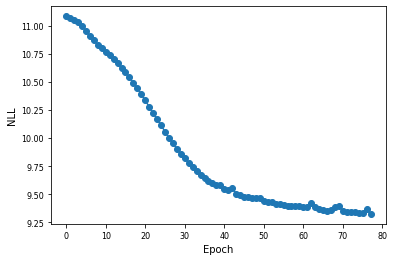

Epoch = 78, Nsteps = 15800, NLL on test data = 9.366220


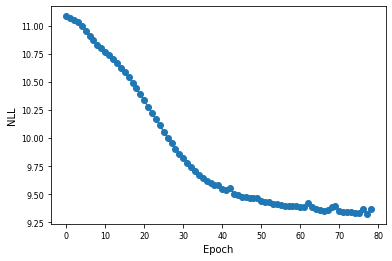

Epoch = 79, Nsteps = 16000, NLL on test data = 9.343663


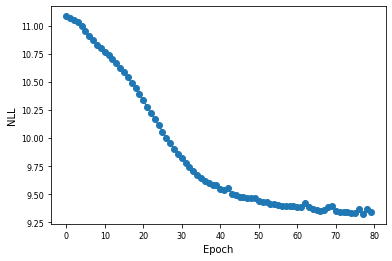

Epoch = 80, Nsteps = 16200, NLL on test data = 9.317308


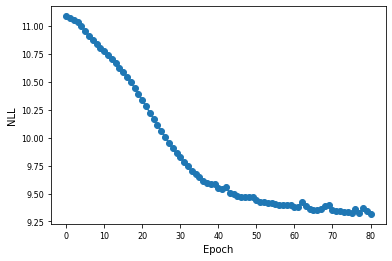

Epoch = 81, Nsteps = 16400, NLL on test data = 9.325666


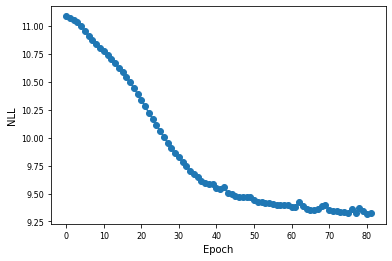

Epoch = 82, Nsteps = 16600, NLL on test data = 9.349709


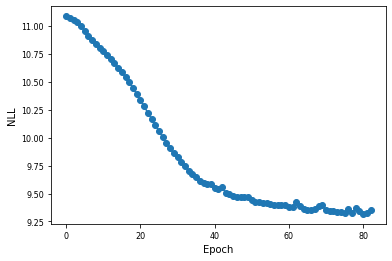

Epoch = 83, Nsteps = 16800, NLL on test data = 9.335462


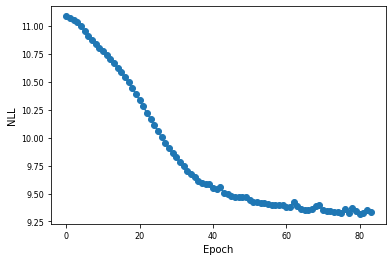

Epoch = 84, Nsteps = 17000, NLL on test data = 9.308752


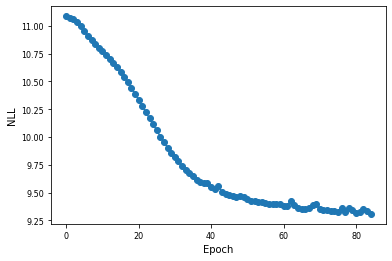

Epoch = 85, Nsteps = 17200, NLL on test data = 9.319401


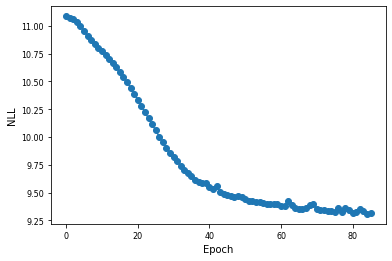

Epoch = 86, Nsteps = 17400, NLL on test data = 9.303021


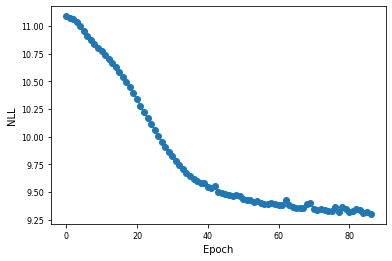

Epoch = 87, Nsteps = 17600, NLL on test data = 9.307957


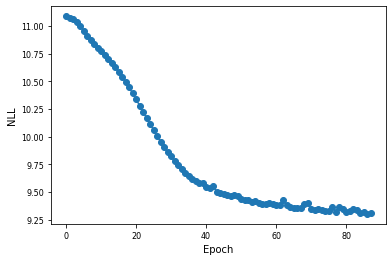

Epoch = 88, Nsteps = 17800, NLL on test data = 9.303342


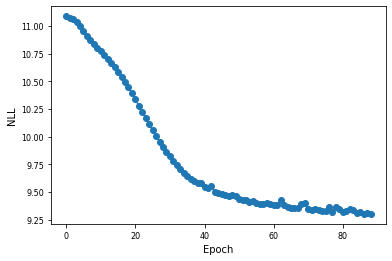

Epoch = 89, Nsteps = 18000, NLL on test data = 9.303326


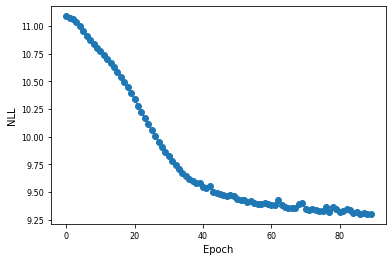

Epoch = 90, Nsteps = 18200, NLL on test data = 9.298572


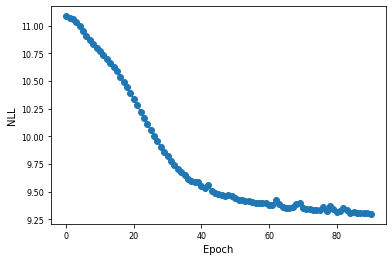

Epoch = 91, Nsteps = 18400, NLL on test data = 9.293828


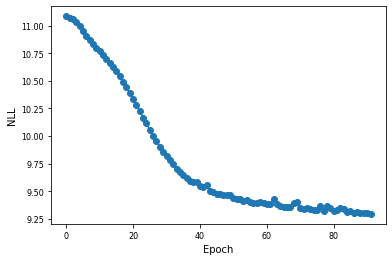

Epoch = 92, Nsteps = 18600, NLL on test data = 9.296450


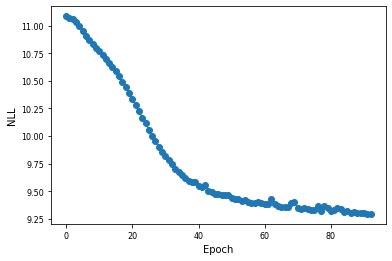

Epoch = 93, Nsteps = 18800, NLL on test data = 9.292412


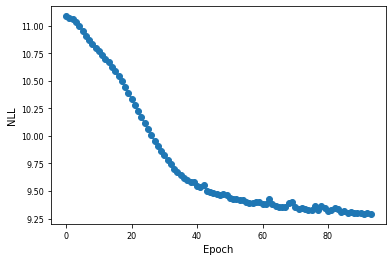

Epoch = 94, Nsteps = 19000, NLL on test data = 9.297643


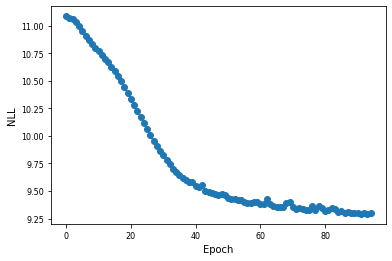

Epoch = 95, Nsteps = 19200, NLL on test data = 9.289938


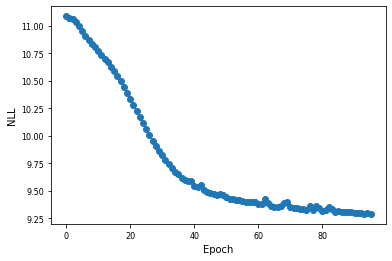

Epoch = 96, Nsteps = 19400, NLL on test data = 9.286096


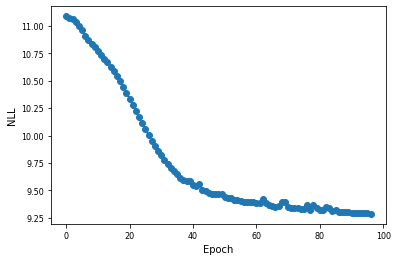

Epoch = 97, Nsteps = 19600, NLL on test data = 9.292385


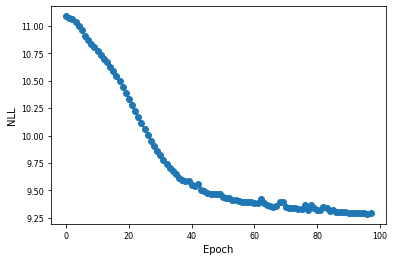

Epoch = 98, Nsteps = 19800, NLL on test data = 9.308390


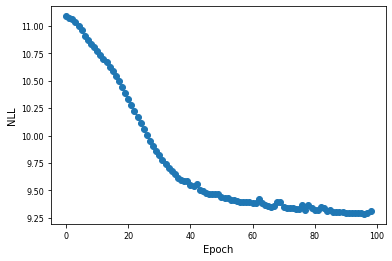

Epoch = 99, Nsteps = 20000, NLL on test data = 9.287093


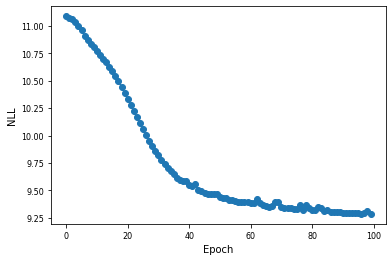

Epoch = 0, Nsteps = 200, NLL on test data = 11.094866


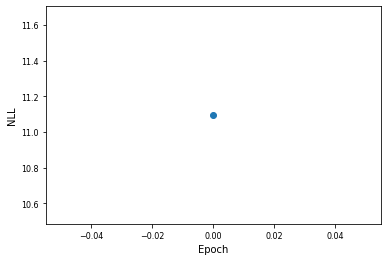

Epoch = 1, Nsteps = 400, NLL on test data = 11.093355


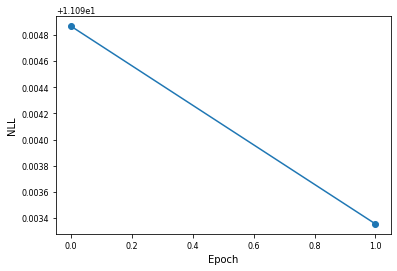

Epoch = 2, Nsteps = 600, NLL on test data = 11.082650


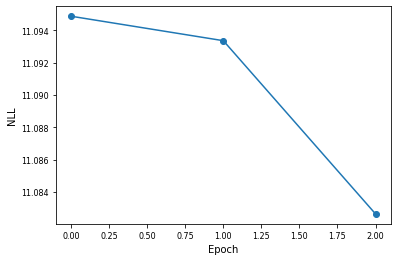

Epoch = 3, Nsteps = 800, NLL on test data = 11.069934


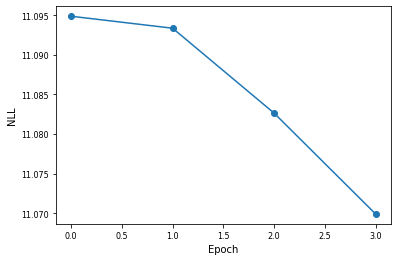

Epoch = 4, Nsteps = 1000, NLL on test data = 11.052602


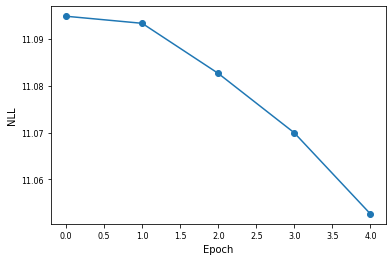

Epoch = 5, Nsteps = 1200, NLL on test data = 11.031564


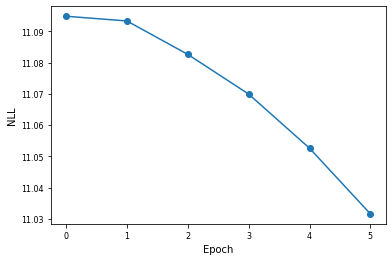

Epoch = 6, Nsteps = 1400, NLL on test data = 11.016080


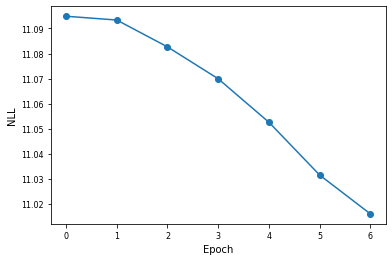

Epoch = 7, Nsteps = 1600, NLL on test data = 10.994306


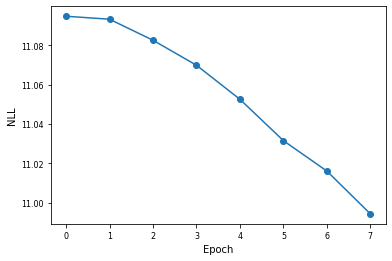

Epoch = 8, Nsteps = 1800, NLL on test data = 10.971542


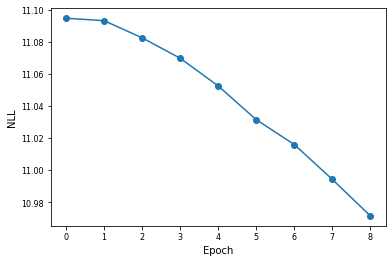

Epoch = 9, Nsteps = 2000, NLL on test data = 10.958585


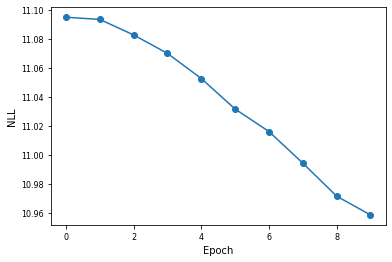

Epoch = 10, Nsteps = 2200, NLL on test data = 10.935897


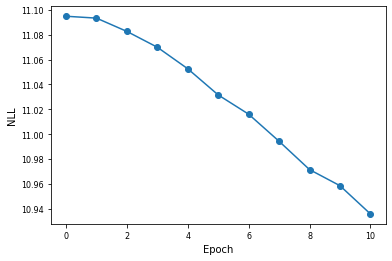

Epoch = 11, Nsteps = 2400, NLL on test data = 10.930019


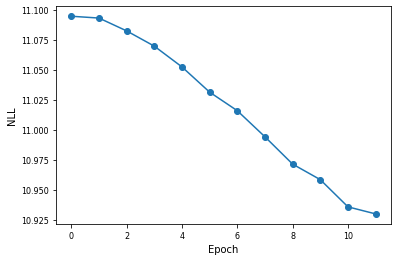

Epoch = 12, Nsteps = 2600, NLL on test data = 10.907487


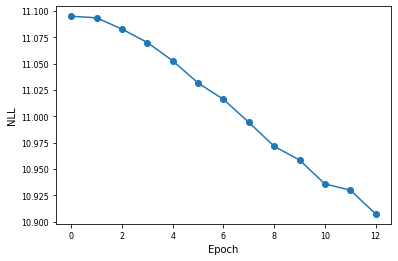

Epoch = 13, Nsteps = 2800, NLL on test data = 10.881965


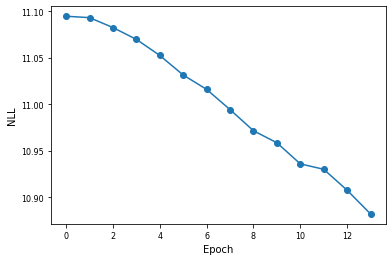

Epoch = 14, Nsteps = 3000, NLL on test data = 10.870381


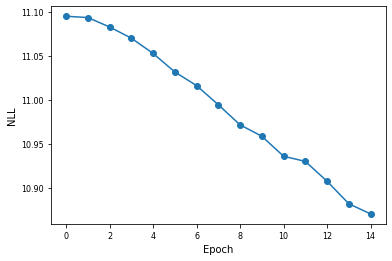

Epoch = 15, Nsteps = 3200, NLL on test data = 10.853076


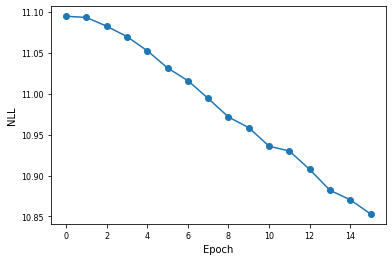

Epoch = 16, Nsteps = 3400, NLL on test data = 10.831941


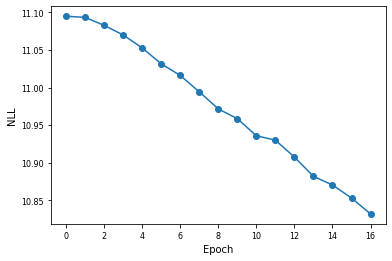

Epoch = 17, Nsteps = 3600, NLL on test data = 10.808126


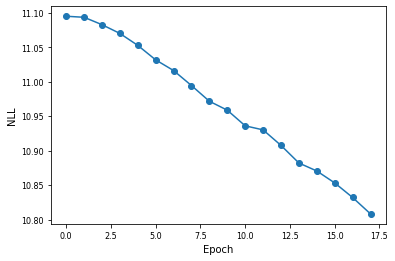

Epoch = 18, Nsteps = 3800, NLL on test data = 10.778763


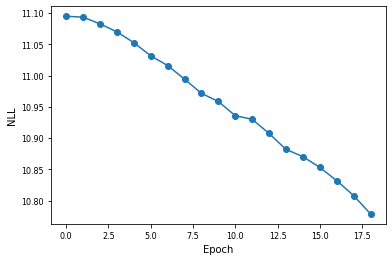

Epoch = 19, Nsteps = 4000, NLL on test data = 10.757236


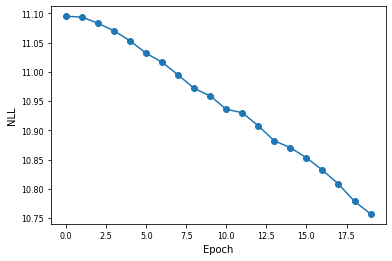

Epoch = 20, Nsteps = 4200, NLL on test data = 10.729151


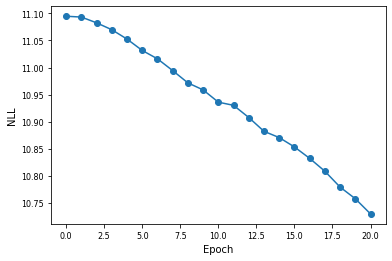

Epoch = 21, Nsteps = 4400, NLL on test data = 10.703374


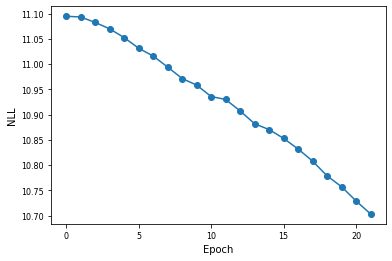

Epoch = 22, Nsteps = 4600, NLL on test data = 10.674236


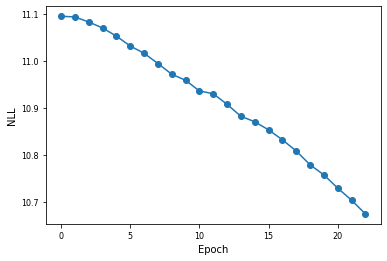

Epoch = 23, Nsteps = 4800, NLL on test data = 10.645190


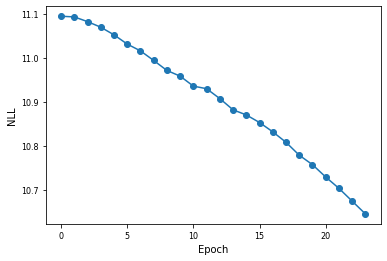

Epoch = 24, Nsteps = 5000, NLL on test data = 10.617919


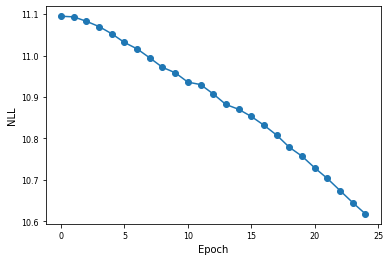

Epoch = 25, Nsteps = 5200, NLL on test data = 10.589152


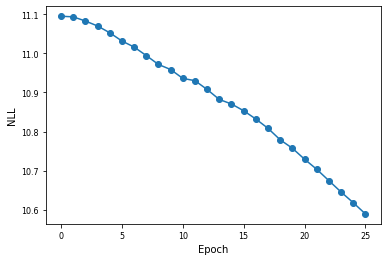

Epoch = 26, Nsteps = 5400, NLL on test data = 10.553727


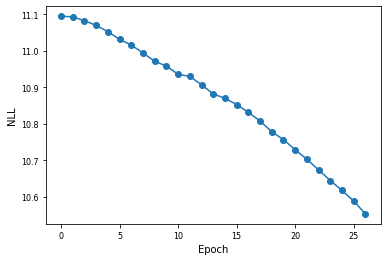

Epoch = 27, Nsteps = 5600, NLL on test data = 10.521668


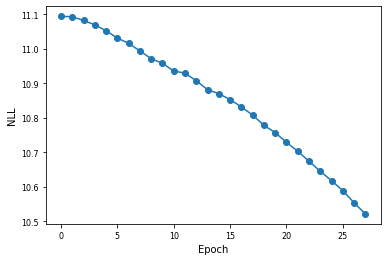

Epoch = 28, Nsteps = 5800, NLL on test data = 10.488753


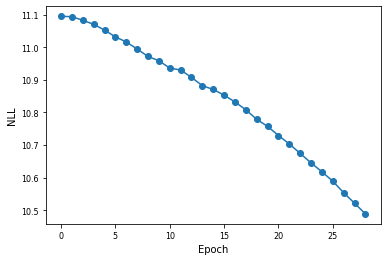

Epoch = 29, Nsteps = 6000, NLL on test data = 10.453908


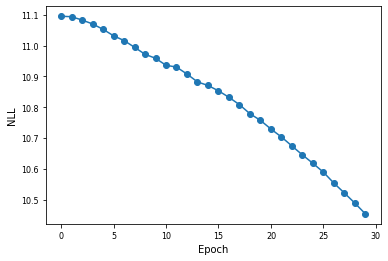

Epoch = 30, Nsteps = 6200, NLL on test data = 10.422508


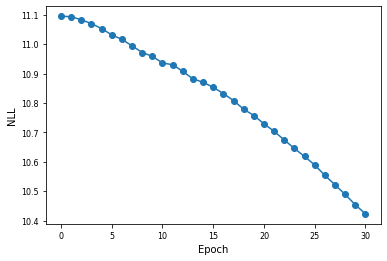

Epoch = 31, Nsteps = 6400, NLL on test data = 10.390530


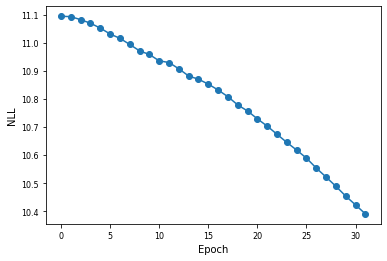

Epoch = 32, Nsteps = 6600, NLL on test data = 10.353001


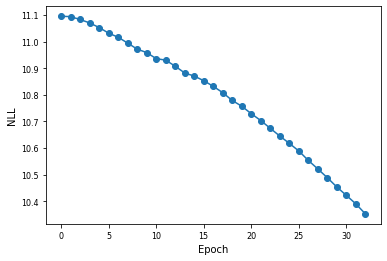

Epoch = 33, Nsteps = 6800, NLL on test data = 10.321615


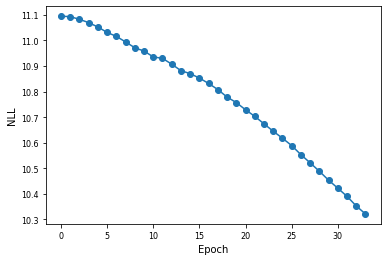

Epoch = 34, Nsteps = 7000, NLL on test data = 10.292968


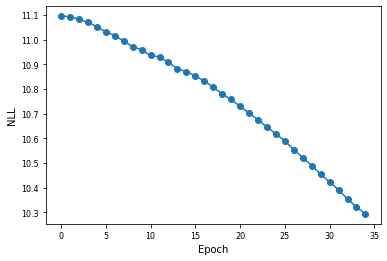

Epoch = 35, Nsteps = 7200, NLL on test data = 10.261594


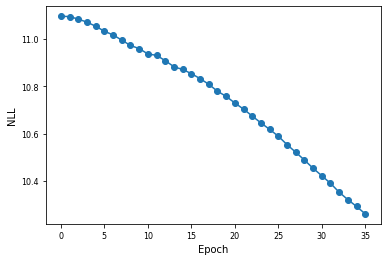

Epoch = 36, Nsteps = 7400, NLL on test data = 10.223854


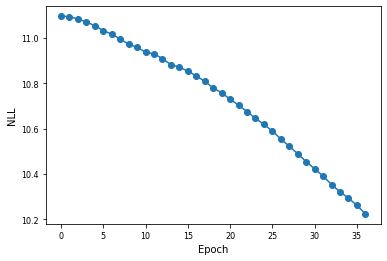

Epoch = 37, Nsteps = 7600, NLL on test data = 10.199971


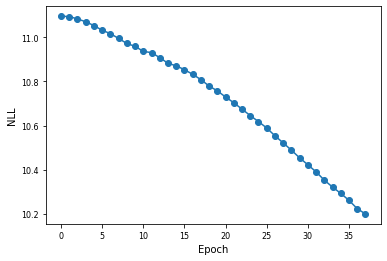

Epoch = 38, Nsteps = 7800, NLL on test data = 10.171884


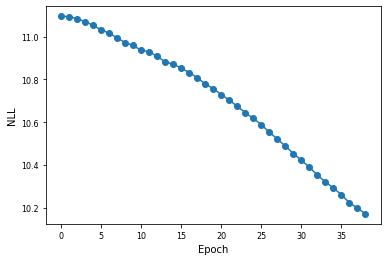

Epoch = 39, Nsteps = 8000, NLL on test data = 10.138208


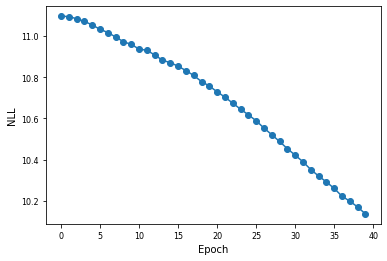

Epoch = 40, Nsteps = 8200, NLL on test data = 10.109840


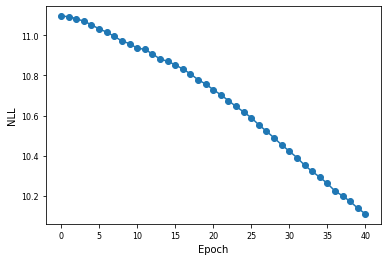

Epoch = 41, Nsteps = 8400, NLL on test data = 10.094337


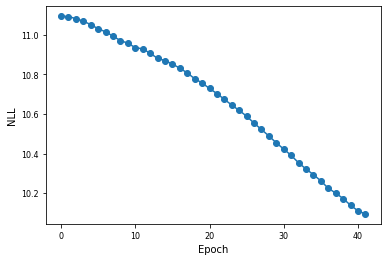

Epoch = 42, Nsteps = 8600, NLL on test data = 10.063720


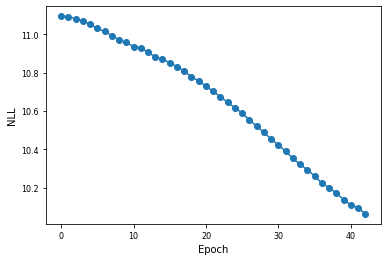

Epoch = 43, Nsteps = 8800, NLL on test data = 10.041853


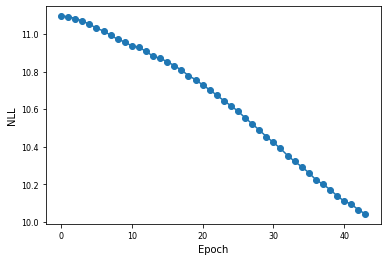

Epoch = 44, Nsteps = 9000, NLL on test data = 10.016802


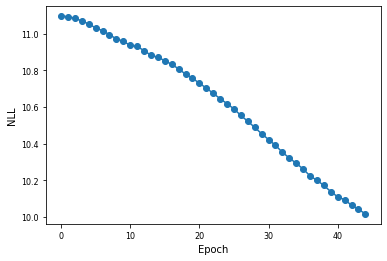

Epoch = 45, Nsteps = 9200, NLL on test data = 9.995944


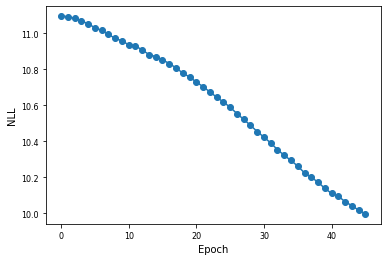

Epoch = 46, Nsteps = 9400, NLL on test data = 9.982315


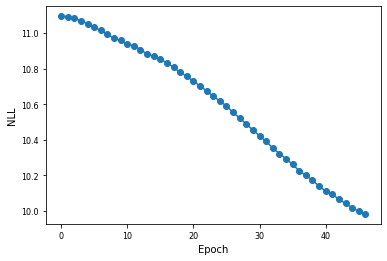

Epoch = 47, Nsteps = 9600, NLL on test data = 9.965081


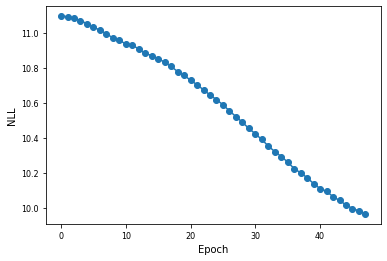

Epoch = 48, Nsteps = 9800, NLL on test data = 9.945899


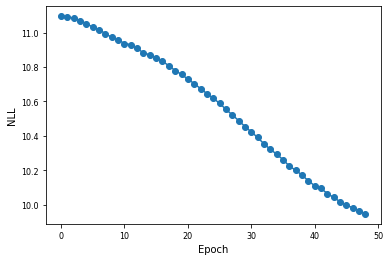

Epoch = 49, Nsteps = 10000, NLL on test data = 9.930958


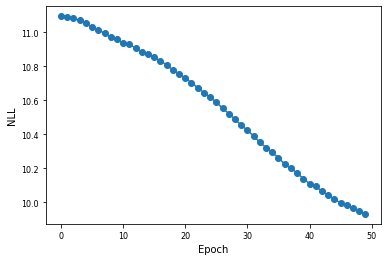

Epoch = 50, Nsteps = 10200, NLL on test data = 9.917146


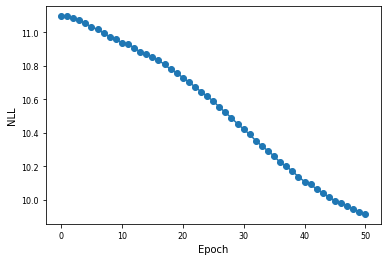

Epoch = 51, Nsteps = 10400, NLL on test data = 9.904515


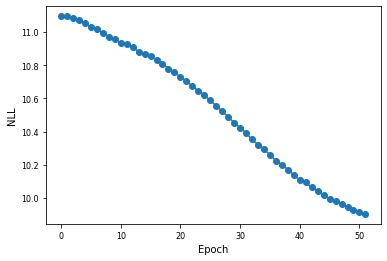

Epoch = 52, Nsteps = 10600, NLL on test data = 9.895968


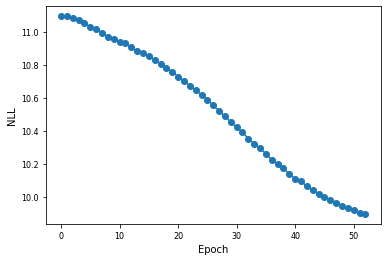

Epoch = 53, Nsteps = 10800, NLL on test data = 9.884474


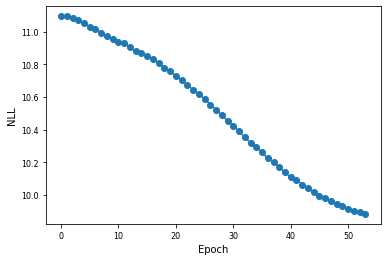

Epoch = 54, Nsteps = 11000, NLL on test data = 9.880236


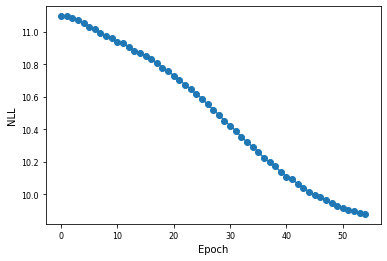

Epoch = 55, Nsteps = 11200, NLL on test data = 9.862860


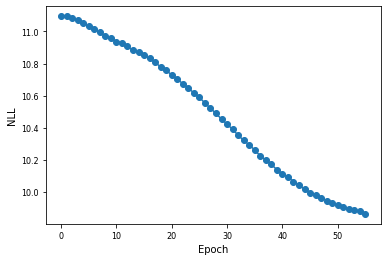

Epoch = 56, Nsteps = 11400, NLL on test data = 9.855012


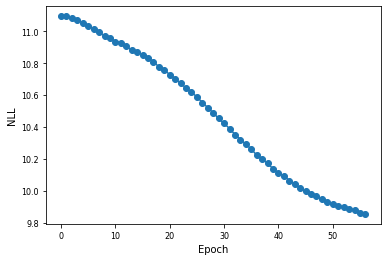

Epoch = 57, Nsteps = 11600, NLL on test data = 9.849122


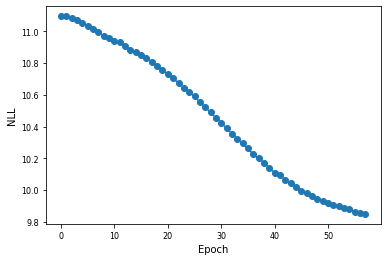

Epoch = 58, Nsteps = 11800, NLL on test data = 9.860072


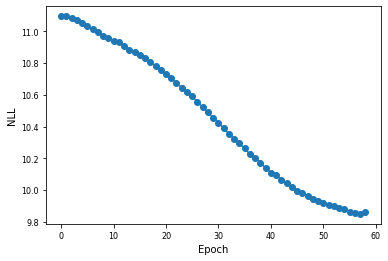

Epoch = 59, Nsteps = 12000, NLL on test data = 9.840283


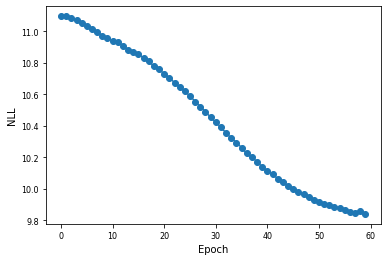

Epoch = 60, Nsteps = 12200, NLL on test data = 9.833294


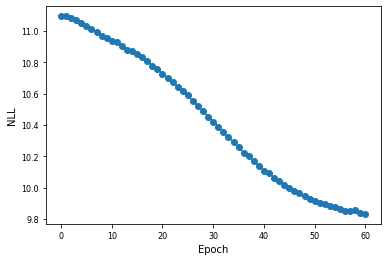

Epoch = 61, Nsteps = 12400, NLL on test data = 9.823718


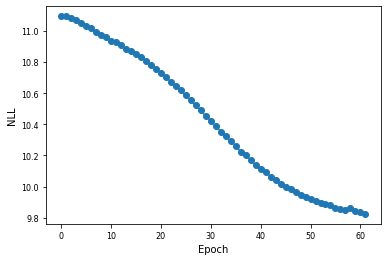

Epoch = 62, Nsteps = 12600, NLL on test data = 9.822438


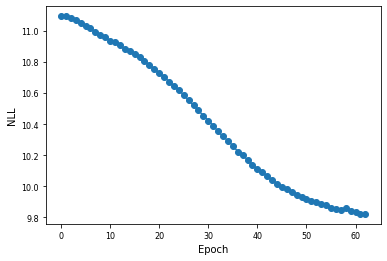

Epoch = 63, Nsteps = 12800, NLL on test data = 9.811952


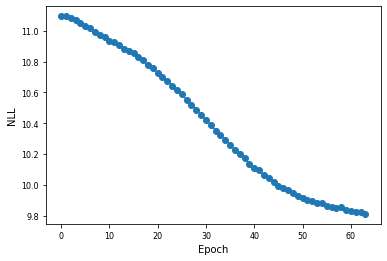

Epoch = 64, Nsteps = 13000, NLL on test data = 9.808102


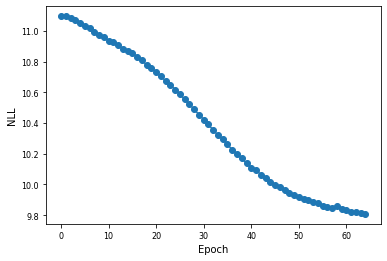

Epoch = 65, Nsteps = 13200, NLL on test data = 9.805946


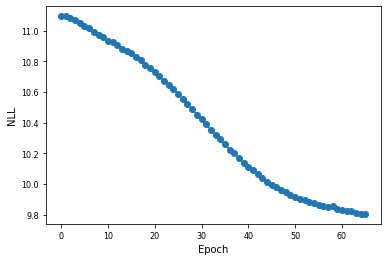

Epoch = 66, Nsteps = 13400, NLL on test data = 9.809969


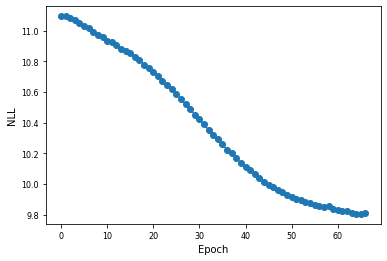

Epoch = 67, Nsteps = 13600, NLL on test data = 9.792168


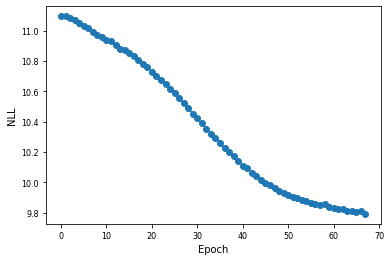

Epoch = 68, Nsteps = 13800, NLL on test data = 9.799387


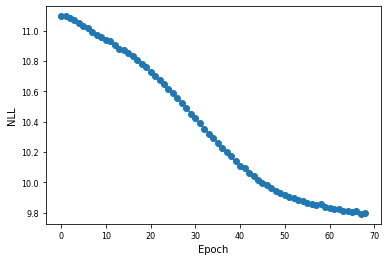

Epoch = 69, Nsteps = 14000, NLL on test data = 9.797393


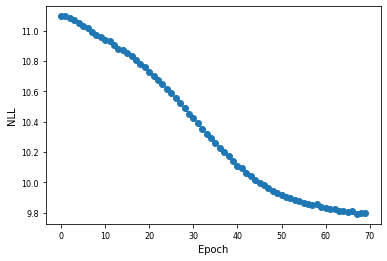

Epoch = 70, Nsteps = 14200, NLL on test data = 9.788084


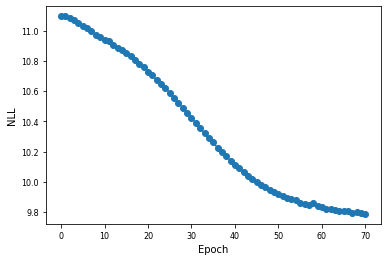

Epoch = 71, Nsteps = 14400, NLL on test data = 9.796191


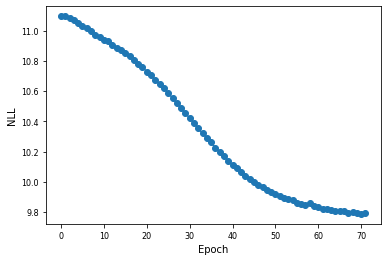

Epoch = 72, Nsteps = 14600, NLL on test data = 9.777882


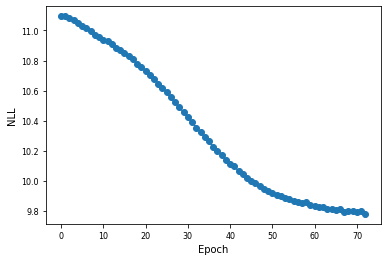

Epoch = 73, Nsteps = 14800, NLL on test data = 9.771240


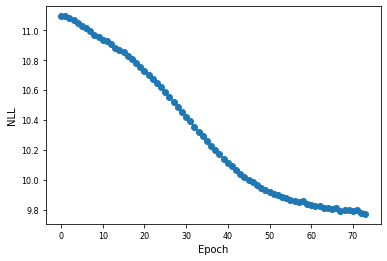

Epoch = 74, Nsteps = 15000, NLL on test data = 9.771357


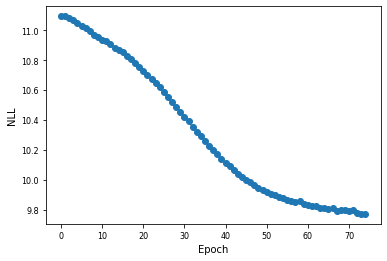

Epoch = 75, Nsteps = 15200, NLL on test data = 9.766870


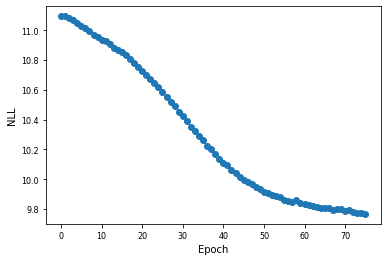

Epoch = 76, Nsteps = 15400, NLL on test data = 9.790795


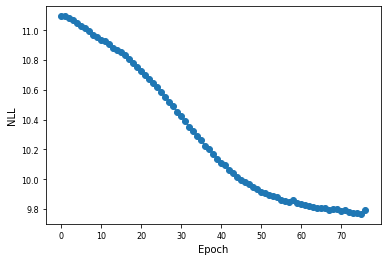

Epoch = 77, Nsteps = 15600, NLL on test data = 9.791567


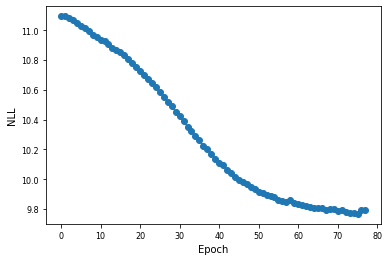

Epoch = 78, Nsteps = 15800, NLL on test data = 9.768894


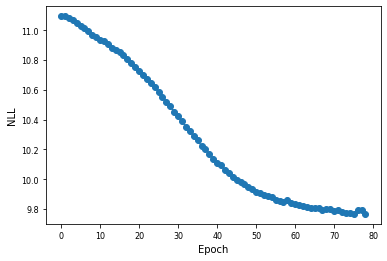

Epoch = 79, Nsteps = 16000, NLL on test data = 9.798861


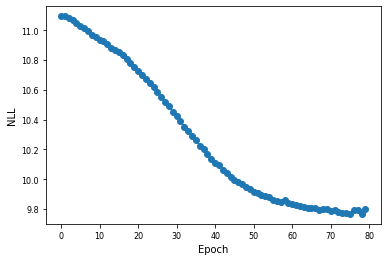

Epoch = 80, Nsteps = 16200, NLL on test data = 9.766580


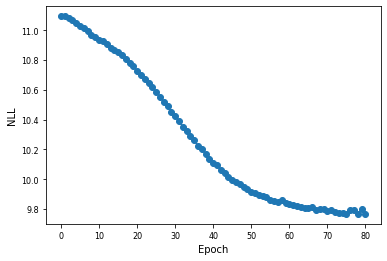

Epoch = 81, Nsteps = 16400, NLL on test data = 9.747564


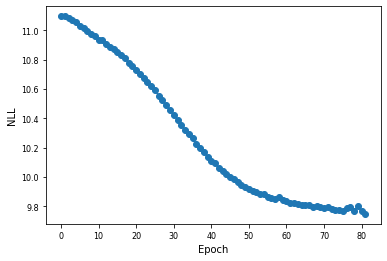

Epoch = 82, Nsteps = 16600, NLL on test data = 9.746900


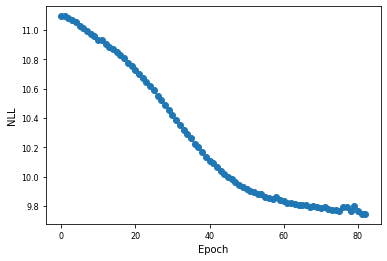

Epoch = 83, Nsteps = 16800, NLL on test data = 9.747053


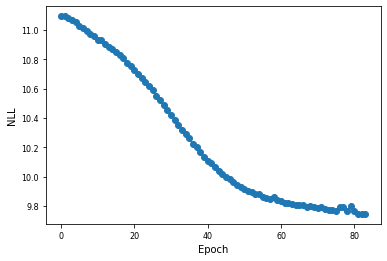

Epoch = 84, Nsteps = 17000, NLL on test data = 9.759765


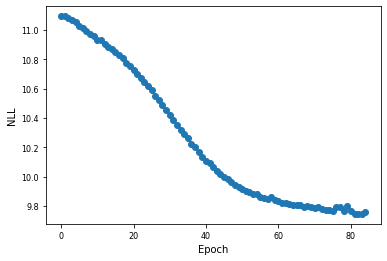

Epoch = 85, Nsteps = 17200, NLL on test data = 9.742326


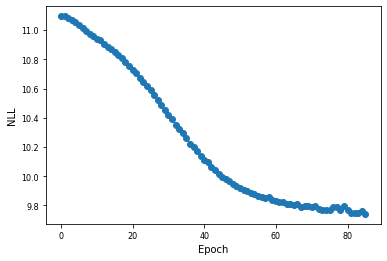

Epoch = 86, Nsteps = 17400, NLL on test data = 9.739712


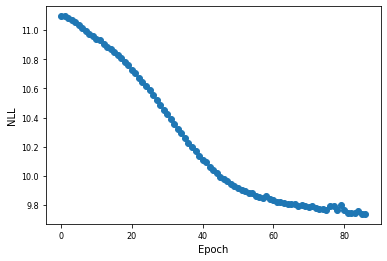

Epoch = 87, Nsteps = 17600, NLL on test data = 9.754026


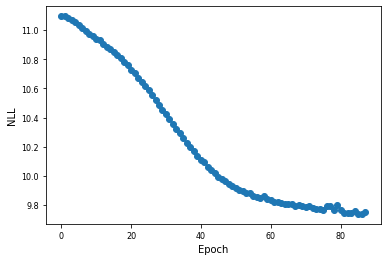

Epoch = 88, Nsteps = 17800, NLL on test data = 9.734912


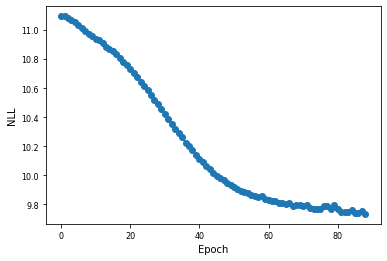

Epoch = 89, Nsteps = 18000, NLL on test data = 9.743142


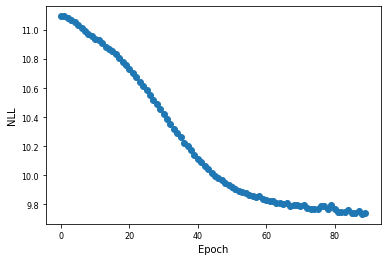

Epoch = 90, Nsteps = 18200, NLL on test data = 9.781892


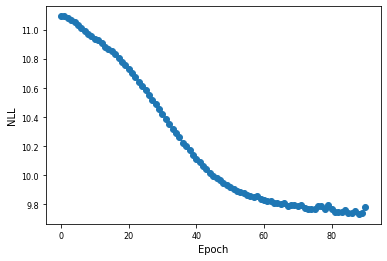

Epoch = 91, Nsteps = 18400, NLL on test data = 9.734761


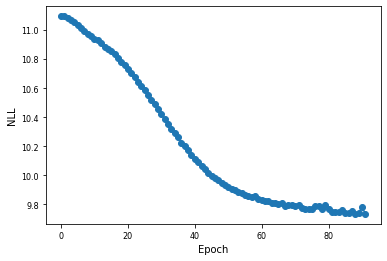

Epoch = 92, Nsteps = 18600, NLL on test data = 9.731750


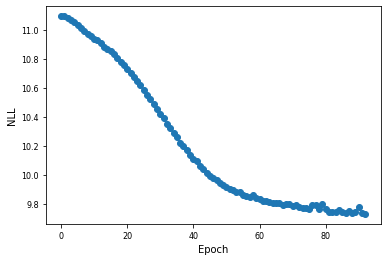

Epoch = 93, Nsteps = 18800, NLL on test data = 9.745300


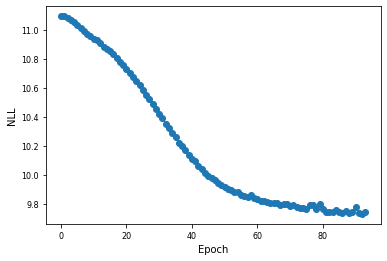

Epoch = 94, Nsteps = 19000, NLL on test data = 9.777006


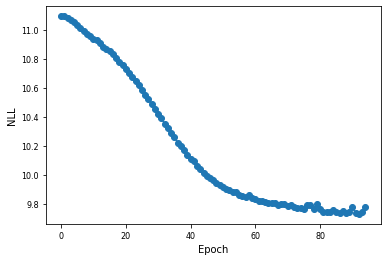

Epoch = 95, Nsteps = 19200, NLL on test data = 9.722105


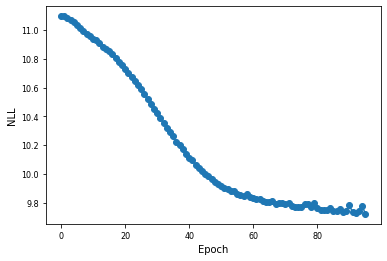

Epoch = 96, Nsteps = 19400, NLL on test data = 9.726094


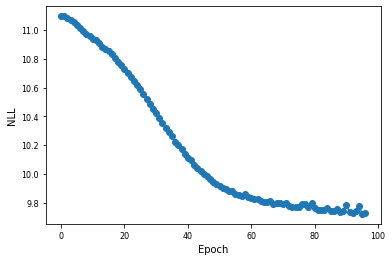

Epoch = 97, Nsteps = 19600, NLL on test data = 9.721460


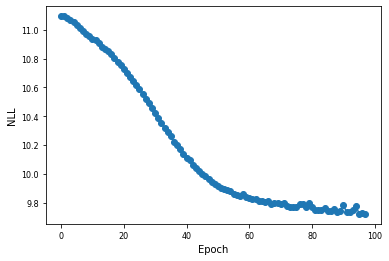

Epoch = 98, Nsteps = 19800, NLL on test data = 9.729829


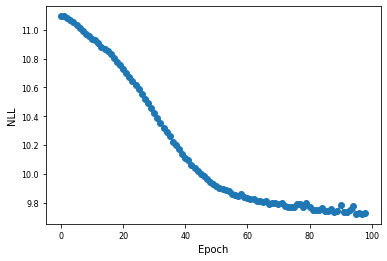

Epoch = 99, Nsteps = 20000, NLL on test data = 9.717310


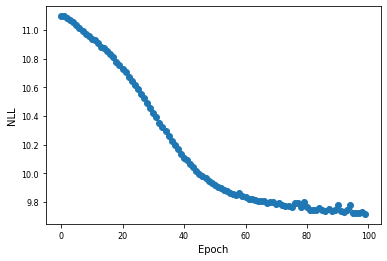

<Figure size 432x288 with 0 Axes>

In [6]:
#Initialize the RBM for each temperature in T_list:
rbms           = []
rbm_samples    = []
for i in range(len(T_list)):
    T = T_list[i]

    # Load the MC configuration training data:
    trainFileName = 'Data_ising2d/MC_results/ising2d_L'+str(L)+'_T'+str(T)+'_train.txt'
    xtrain        = np.loadtxt(trainFileName)
    testFileName  = 'Data_ising2d/MC_results/ising2d_L'+str(L)+'_T'+str(T)+'_test.txt'
    xtest         = np.loadtxt(testFileName)

    xtrain_randomized = np.random.permutation(xtrain) # random permutation of training data
    xtest_randomized  = np.random.permutation(xtest) # random permutation of test data
    iterations_per_epoch = xtrain.shape[0] / bsize  
    
    # Initialize the RBM class
    rbm = RBM(num_hidden=num_hidden, num_visible=num_visible, weights=weights, visible_bias=visible_bias,hidden_bias=hidden_bias, num_samples=num_samples) 

    # Initialize operations and placeholders classes
    ops          = Ops()
    placeholders = Placeholders()
    placeholders.visible_samples = tf.placeholder(tf.float32, shape=(None, num_visible), name='v') # placeholder for training data

    total_iterations = 0 # starts at zero 
    ops.global_step  = tf.Variable(total_iterations, name='global_step_count', trainable=False)
    learning_rate    = tf.train.exponential_decay(
        learning_rate_start,
        ops.global_step,
        100 * xtrain.shape[0]/bsize,
        1.0 # decay rate = 1 means no decay
    )

    cost      = rbm.neg_log_likelihood_forGrad(placeholders.visible_samples, num_gibbs=num_gibbs)
    optimizer = tf.train.AdamOptimizer(learning_rate, epsilon=1e-2)
    ops.lr    = learning_rate
    ops.train = optimizer.minimize(cost, global_step=ops.global_step)
    #ops.init  = tf.group(tf.initialize_all_variables(), tf.initialize_local_variables()) #depricated
    ops.init  = tf.group(tf.global_variables_initializer(), tf.local_variables_initializer())

    # Define the negative log-likelihood
    # We can use this to plot the RBM's training progress.
    # This calculation is intractable for large networks so let's only do it for small num_hidden
    logZ = rbm.exact_log_partition_function()
    placeholders.logZ = tf.placeholder(tf.float32)
    NLL = rbm.neg_log_likelihood(placeholders.visible_samples,placeholders.logZ)

    sess = tf.Session()
    sess.run(ops.init)

    bcount         = 0  #counter
    epochs_done    = 0  #epochs counter
    nll_test_list  = [] #negative log-likelihood for each epoch
    nll_train_list = [] #negative log-likelihood for each epoch

    for ii in range(nsteps):
        if bcount*bsize+ bsize>=xtrain.shape[0]:
            bcount = 0
            xtrain_randomized = np.random.permutation(xtrain)

        batch     =  xtrain_randomized[ bcount*bsize: bcount*bsize+ bsize,:]
        bcount    += 1
        feed_dict =  {placeholders.visible_samples: batch}

        _, num_steps = sess.run([ops.train, ops.global_step], feed_dict=feed_dict)

        if num_steps % iterations_per_epoch == 0:
            lz = sess.run(logZ)
            nll_test = sess.run(NLL,feed_dict={placeholders.visible_samples: xtest_randomized, placeholders.logZ: lz})
            nll_test_list.append(nll_test)

            print ('Epoch = %d, Nsteps = %d, NLL on test data = %.6f' %(epochs_done,num_steps,nll_test))
            save_parameters(sess, rbm)
            epochs_done += 1

            # Update the plot:
            plt.figure(1)
            plt.clf()
            plt.plot( np.arange(epochs_done), nll_test_list, 'o-')
            plt.xlabel('Epoch')
            plt.ylabel('NLL')
            plt.pause(0.1)

    plt.savefig('NLL_vs_epoch_T%s.pdf' %(str(T)))


## Sampling from a RBM

The below code samples from the obtained $p_{\lambda}$ distributions at various $T$'s in order to generate new spin configurations which we will use in order to calculate observables such as Energy, Magnetization, $C_{V}$ and $\chi$.

In [7]:
#Input parameters:
L           = 4    #linear size of the system
num_visible = L*L  #number of visible nodes
num_hidden  = 4    #number of hidden nodes

#Temperature list for which there are trained RBM parameters stored in Data_ising2d/RBM_parameters
T_list = [1.0,1.254,1.508,1.762,2.016,2.269,2.524,2.778,3.032,3.286,3.540]
#T_list = [2.269]


Setup sampling parameters and specify name and location of folder where sample spin configurations will be written to.

In [8]:
#Sampling parameters:
num_samples  = 500  # how many independent chains will be sampled
gibb_updates = 2    # how many gibbs updates per call to the gibbs sampler
nbins        = 100  # number of calls to the RBM sampler

#Specify where the sampled configurations will be stored:
samples_dir = 'Data_ising2d/RBM_samples'
if not(os.path.isdir(samples_dir)):
    os.mkdir(samples_dir)
samples_filePaths = [] #file paths where samples for each T will be stored

In [9]:
#Initialize the RBM for each temperature in T_list:
rbms           = []
rbm_samples    = []
for i in range(len(T_list)):
    T = T_list[i]

    samples_filePath =  '%s/samples_nH%d_L%d' %(samples_dir,num_hidden,L)
    samples_filePath += '_T' + str(T) + '.txt'
    samples_filePaths.append(samples_filePath)
    fout = open(samples_filePath,'w')
    fout.close()

    #Read in the trained RBM parameters:
    path_to_params =  'Data_ising2d/RBM_parameters/parameters_nH%d_L%d' %(num_hidden,L)
    path_to_params += '_T'+str(T)+'.npz'
    params         =  np.load(path_to_params)
    weights        =  params['weights']
    visible_bias   =  params['visible_bias']
    hidden_bias    =  params['hidden_bias']
    hidden_bias    =  np.reshape(hidden_bias,(hidden_bias.shape[0],1))
    visible_bias   =  np.reshape(visible_bias,(visible_bias.shape[0],1))

    # Initialize RBM class
    rbms.append(RBM(
    num_hidden=num_hidden, num_visible=num_visible,
    weights=weights, visible_bias=visible_bias,hidden_bias=hidden_bias,
    num_samples=num_samples
    ))
    rbm_samples.append(rbms[i].stochastic_maximum_likelihood(gibb_updates))
    #end of loop over temperatures

In [10]:
# Initialize tensorflow
init = tf.group(tf.initialize_all_variables(), tf.initialize_local_variables())

# Sample thermodynamic observables:
N = num_visible
with tf.Session() as sess:
    sess.run(init)

    for i in range(nbins):
        print ('bin %d' %i)

        for t in range(len(T_list)):
            fout = open(samples_filePaths[t],'a')

            _,samples=sess.run(rbm_samples[t])
            spins = np.asarray((2*samples-1)) #convert from 0,1 variables to -1,+1 variables
            for k in range(num_samples):
                for i in range(N):
                    fout.write('%d ' %int(spins[k,i]))
                fout.write('\n')
            fout.close()

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Instructions for updating:
Use `tf.local_variables_initializer` instead.
bin 0
bin 1
bin 2
bin 3
bin 4
bin 5
bin 6
bin 7
bin 8
bin 9
bin 10
bin 11
bin 12
bin 13
bin 14
bin 15
bin 16
bin 17
bin 18
bin 19
bin 20
bin 21
bin 22
bin 23
bin 24
bin 25
bin 26
bin 27
bin 28
bin 29
bin 30
bin 31
bin 32
bin 33
bin 34
bin 35
bin 36
bin 37
bin 38
bin 39
bin 40
bin 41
bin 42
bin 43
bin 44
bin 45
bin 46
bin 47
bin 48
bin 49
bin 50
bin 51
bin 52
bin 53
bin 54
bin 55
bin 56
bin 57
bin 58
bin 59
bin 60
bin 61
bin 62
bin 63
bin 64
bin 65
bin 66
bin 67
bin 68
bin 69
bin 70
bin 71
bin 72
bin 73
bin 74
bin 75
bin 76
bin 77
bin 78
bin 79
bin 80
bin 81
bin 82
bin 83
bin 84
bin 85
bin 86
bin 87
bin 88
bin 89
bin 90
bin 91
bin 92
bin 93
bin 94
bin 95
bin 96
bin 97
bin 98
bin 99


## Plot Observables from RBM

In [23]:
### Input parameters: ###
N_spins = num_visible            #total number of spins
J = 1                            #coupling parameter

### Critical temperature: ###
Tc = 2.0/np.log(1.0 + np.sqrt(2))*J  #T/J ~ 2.269

A means of obtaining the Ising spin value corresponding to the four nearest neighbors for a given site, given periodic boundary conditions.

In [25]:
### Store each spin's four nearest neighbours in a neighbours array (using periodic boundary conditions): ###
neighbours = np.zeros((N_spins,4),dtype=np.int)
for i in range(N_spins):
    #neighbour to the right:
    neighbours[i,0]=i+1
    if i%L==(L-1):
        neighbours[i,0]=i+1-L

    #upwards neighbour:
    neighbours[i,1]=i+L
    if i >= (N_spins-L):
        neighbours[i,1]=i+L-N_spins

    #neighbour to the left:
    neighbours[i,2]=i-1
    if i%L==0:
        neighbours[i,2]=i-1+L

    #downwards neighbour:
    neighbours[i,3]=i-L
    if i <= L:
        neighbours[i,3]=i-L+N_spins

Functions that calculate the Energy and magnetization for a given configuration of spins.

The Energy is calcuated according to the form of the Ising Hamiltonian shown above. 

The Magnetization is just $M = \sum_{i}\sigma_{i}$.

In [26]:
### Function to calculate the total energy ###
def getEnergy():
    currEnergy = 0
    for i in range(N_spins):
        currEnergy += -J*( spins[i]*spins[neighbours[i,0]] + spins[i]*spins[neighbours[i,1]] )
    return currEnergy
#end of getEnergy() function

### Function to calculate the total magnetization ###
def getMag():
    return np.sum(spins)
#end of getMag() function

In [28]:
### Observables to plot as a function of temperature: ###
energy   = np.zeros(len(T_list))
mag      = np.zeros(len(T_list))
specHeat = np.zeros(len(T_list))
susc     = np.zeros(len(T_list))

We import the set of Energies and Magnetizations calculated above for every sweep at given $T$'s and obtain the mean Energy and mean Magnetization for thease. Because there is no spontaneous symmetry breaking for finite sized lattices ($\langle M\rangle=0,\,\forall\,T$), we instead use $\langle |M|\rangle$ in our calculation of $\chi$

$$
C_{V}=\frac{\langle E^{2}\rangle-\langle E\rangle^{2}}{T^{2}},\qquad \chi=\frac{\langle M^{2}\rangle-\langle |M|\rangle^{2}}{T}.
$$

In [29]:
### Loop to read in data for each temperature: ###
for (iT,T) in enumerate(T_list):
    path_to_params =  'Data_ising2d/RBM_samples/samples_nH%d_L%d' %(num_hidden,L)
    path_to_params += '_T'+str(T)+'.txt'
    file = open(path_to_params,'r')
    data = np.loadtxt( file )
    
    energymag=np.zeros((len(data),2))
    for i in range(len(data)):
        spins = data[i]
        energymag[i,:] = [getEnergy(),getMag()]

    E = energymag[:,0]
    M = abs(energymag[:,1])
    
    energy[iT] = np.mean(E)
    mag[iT]    = np.mean(M)
    
    specHeat[iT] = (np.mean(E**2)-np.mean(E)**2)/T**2
    susc[iT]     = (np.mean(M**2)-np.mean(M)**2)/T
    #end loop over T
    

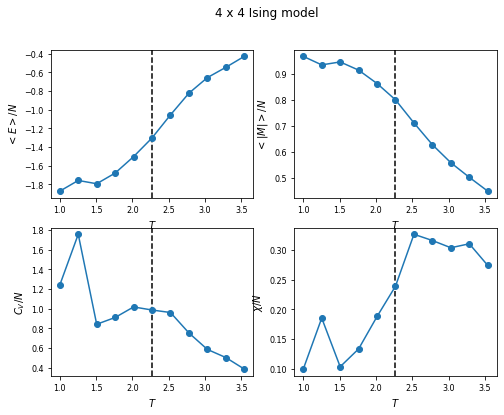

In [30]:
plt.figure(figsize=(8,6))

plt.subplot(221)
plt.axvline(x=Tc, color='k', linestyle='--')
plt.plot(T_list, energy/(1.0*N_spins), 'o-')
plt.xlabel('$T$')
plt.ylabel('$<E>/N$')

plt.subplot(222)
plt.axvline(x=Tc, color='k', linestyle='--')
plt.plot(T_list, mag/(1.0*N_spins), 'o-')
plt.xlabel('$T$')
plt.ylabel('$<|M|>/N$')

plt.subplot(223)
plt.axvline(x=Tc, color='k', linestyle='--')
plt.plot(T_list, specHeat/(1.0*N_spins), 'o-')
plt.xlabel('$T$')
plt.ylabel('$C_V/N$')

plt.subplot(224)
plt.axvline(x=Tc, color='k', linestyle='--')
plt.plot(T_list, susc/(1.0*N_spins), 'o-')
plt.xlabel('$T$')
plt.ylabel('$\chi/N$')

plt.suptitle('%d x %d Ising model' %(L,L))

plt.show()


We reproduce the observable functions vs. $T$ to compare with our earlier MC results and find that they agree fairly well. Adjusting RBM parameters and settings may yield further improvements to these results.